In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import scipy.stats as ss
import matplotlib.pyplot as plt
import matplotlib
import glob
import seaborn as sns
from matplotlib.lines import Line2D
from Bio import SeqIO
from itertools import chain
import matplotlib.patches as patches
from matplotlib.patches import ConnectionPatch
from Bio.Seq import Seq
from collections import Counter
from itertools import product
from loess.loess_1d import loess_1d
import forestplot as fp
from sklearn.decomposition import PCA
import biomart
import colorsys
import os
from matplotlib_venn import venn3

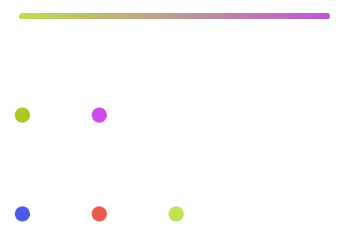

In [2]:
#color set definition
N = 255
#trio color
mycol3 = [(74/N,90/N,233/N),(233/N,91/N,74/N),(193/N,225/N,83/N)]
#contrast color
mycol2 = [(170/N,200/N,33/N),(207/N,74/N,233/N)]
#spectrum color
col2 = np.array([188/N,89/N,211/N])
col1 = np.array([191/N,219/N,81/N])
num_colors = 100
mypal = np.zeros((num_colors, 3))
for i in range(num_colors):
    mypal[i] = col1 * (1 - i/(num_colors-1)) + col2 * (i/(num_colors-1))
#show
plt.figure()
plt.scatter(range(3),[1]*3,color=mycol3,s=200)
plt.scatter(range(2),[2]*2,color=mycol2,s=200)
for i in range(num_colors):
    plt.scatter([x/num_colors*4 for x in range(num_colors)], [3]*num_colors, color=mypal, s=20)
plt.axis('off')
plt.savefig('figures/color_reference.png',dpi=300)

In [3]:
refdata = pd.read_csv('ref.index',sep='\t')
refdata['sample name'] = refdata.apply(lambda x:x['Mouse']+' '+x['Timepoint']+' '+x['Organ'],axis=1)
refdata

,UDP,Series,Mouse,Timepoint,Organ,HIV DNA copy/~500ng,sample name
0,UDP01,JCKB24,01-DMSO,Rebound,Spleen,1208.19,01-DMSO Rebound Spleen
1,UDP02,JCKB24,03-DMSO,Rebound,Spleen,1655.62,03-DMSO Rebound Spleen
2,UDP03,JCKB24,06-DMSO,Rebound,Spleen,559.38,06-DMSO Rebound Spleen
3,UDP04,JCKB24,11-DMSO,Rebound,Spleen,495.58,11-DMSO Rebound Spleen
4,UDP05,JCKB24,12-DMSO,Rebound,Spleen,2074.42,12-DMSO Rebound Spleen
...,...,...,...,...,...,...,...
58,UDP28,JCMM30C,JCMM30C-1,6wk pART,Liver,107.01,JCMM30C-1 6wk pART Liver
59,UDP29,JCMM30C,JCMM30C-5,6wk pART,BM,4.10,JCMM30C-5 6wk pART BM
60,UDP30,JCMM30C,JCMM30C-5,6wk pART,Spleen,18.49,JCMM30C-5 6wk pART Spleen
61,UDP31,JCMM30C,JCMM30C-5,6wk pART,Implant,1.76,JCMM30C-5 6wk pART Implant


In [4]:
refdata.loc[refdata['Organ']=='Imp','Organ'] = 'Implant'

In [5]:
adata = {}
for UDP in refdata['UDP']:
    try:
        adata[UDP] = pd.read_csv('ISS_linkage/linkage_NFNSX_'+UDP+'.txt',sep='\t',names=['UMI','read count','barcode','barcode_confidence','2nd_barcode_freq','provirus type','site','site_confidence','2nd_site_freq','mapping length'])
    except:
        continue
adata[UDP]

,UMI,read count,barcode,barcode_confidence,2nd_barcode_freq,provirus type,site,site_confidence,2nd_site_freq,mapping length
0,CGTGCACTCTCGAT,601,CTTATAGTAGCGGATGCAGTCGTAGAATTATAG,0.555740,0.099834,HIV,BCNFNSX:9637:+,0.500832,0.131448,20
1,ATAAGAGTGAATTG,9,CTTATAGGCGTTGGAGAAGGAGATGAGTTATAG,0.777778,0.222222,plasmid,AGCACCCAGGAGGTAGAGGTTGCAGTGAGCCAAGATCGCG,0.777778,0.111111,40
2,CCGGTTACTAGGGA,1,CTTATAGCGGAGGTAGAAGTCGAGGAGTTATAG,1.000000,NaN,hg38,chr14:20857333:-,1.000000,NaN,129
3,AAATCGTCCTTTTT,1,CTTATAGCTGATGCGGAAGAGGGAGCGTTATAG,1.000000,NaN,hg38,chr12:105710394:-,1.000000,NaN,70
4,TGGGCGTATCTCGG,1,CTTATAGCGGACGCTGAAGACTTATAG,1.000000,NaN,hg38,chr11:63849006:-,1.000000,NaN,42
...,...,...,...,...,...,...,...,...,...,...
50359,GTTTTGGACCTACG,1,CTTATAGCGGAGGTAGAAGTCGAGGAGTGATAG,1.000000,NaN,plasmid,AGCACCCAGGAGGTAGAGGTTGCAGTGAGCCAAGATCGCG,1.000000,NaN,40
50360,TCTCATTATCCCAT,1,CTTATAGTGGAAGCAGGAGAAGGCGTCTGATAG,1.000000,NaN,plasmid,AGCACACAGGAGGGATAGGTTGCAGTGAGCCAATATCGCG,1.000000,NaN,40
50361,ATAATTTCACATCT,1,CTTATAG,1.000000,NaN,plasmid,AGCACCCAGGAGGTAGAGGTTGCAGTGAGCCAAGATCGCG,1.000000,NaN,40
50362,CTGTGAAGTAATAC,1,CTTATAGTCGATGAAGTAGACGGTGAGGAAGATTTATAG,1.000000,NaN,plasmid,AGCACCCAGGAGGTAGAGTTTGCAGTGAGCCAAGATCGCG,1.000000,NaN,40


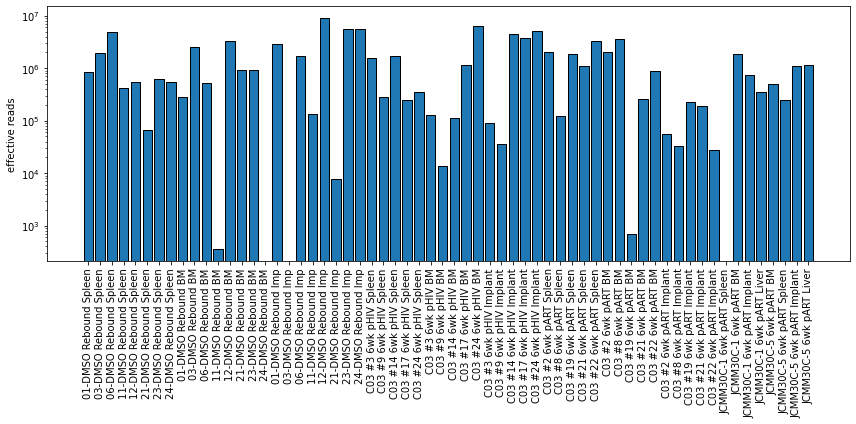

In [6]:
plt.figure(figsize=(12,6))
refdata['effective reads'] = refdata['UDP'].apply(lambda x:sum(adata[x]['read count']) if x in adata else 0)
plt.bar(refdata['sample name'],refdata['effective reads'],edgecolor='black')
plt.ylabel('effective reads')
plt.xticks(rotation=90)
plt.yscale('log')
plt.tight_layout()

on average we have ~1 million reads per sample. But some samples are missing.   
They are 30C-1-Spleen (UDP19,26), 24-rebound-BM (UDP16) ,03-rebound-Imp (UDP18).  
Try to avoid these UDP in the future runs.

In [7]:
refdata.drop(index=54,inplace=True)

In [8]:
#remove all plasmid reads
for UDP in adata:
    adata[UDP] = adata[UDP][adata[UDP]['provirus type']!='plasmid']
adata[UDP]

,UMI,read count,barcode,barcode_confidence,2nd_barcode_freq,provirus type,site,site_confidence,2nd_site_freq,mapping length
0,CGTGCACTCTCGAT,601,CTTATAGTAGCGGATGCAGTCGTAGAATTATAG,0.55574,0.099834,HIV,BCNFNSX:9637:+,0.500832,0.131448,20
2,CCGGTTACTAGGGA,1,CTTATAGCGGAGGTAGAAGTCGAGGAGTTATAG,1.00000,NaN,hg38,chr14:20857333:-,1.000000,NaN,129
3,AAATCGTCCTTTTT,1,CTTATAGCTGATGCGGAAGAGGGAGCGTTATAG,1.00000,NaN,hg38,chr12:105710394:-,1.000000,NaN,70
4,TGGGCGTATCTCGG,1,CTTATAGCGGACGCTGAAGACTTATAG,1.00000,NaN,hg38,chr11:63849006:-,1.000000,NaN,42
5,AATCTACTTTGCAG,3,CTTATAGTGGAAGCAGGAGAAGGCGTCTTATAG,1.00000,NaN,hg38,chr8:85170333:+,1.000000,NaN,129
...,...,...,...,...,...,...,...,...,...,...
14718,GAGTTCTGATTTAT,1,CTTATAGCCGGTGCAGTAGACGCTGTATTATAG,1.00000,NaN,free,AC,1.000000,NaN,2
14719,TACTCTCAAATA,1,CTTATAGTAGAAGTGGAAGATGCGGCATTATAG,1.00000,NaN,free,AGCAC,1.000000,NaN,5
14720,GTACTCTCAGATA,1,CTTATAGTAGAAGTGGAAGATGCGGCATTATAG,1.00000,NaN,free,AGCAC,1.000000,NaN,5
14721,CACGGGCATAGGTA,1,CTTATAGCCGGTGCAGAGGAGGAGGCACCTACAA,1.00000,NaN,free,AGCAG,1.000000,NaN,5


In [9]:
refdata[refdata['sample name']=='C03 #19 6wk pART BM']

,UDP,Series,Mouse,Timepoint,Organ,HIV DNA copy/~500ng,sample name,effective reads
46,UDP61,C03 #19,C03 #19,6wk pART,BM,12.76,C03 #19 6wk pART BM,684


In [10]:
refdata[refdata['sample name'].str.contains('JCMM30C')]

,UDP,Series,Mouse,Timepoint,Organ,HIV DNA copy/~500ng,sample name,effective reads
55,UDP25,JCMM30C,JCMM30C-1,6wk pART,BM,6.36,JCMM30C-1 6wk pART BM,1841620
56,UDP26,JCMM30C,JCMM30C-1,6wk pART,Spleen,9.41,JCMM30C-1 6wk pART Spleen,0
57,UDP27,JCMM30C,JCMM30C-1,6wk pART,Implant,3.10,JCMM30C-1 6wk pART Implant,742114
58,UDP28,JCMM30C,JCMM30C-1,6wk pART,Liver,107.01,JCMM30C-1 6wk pART Liver,354855
59,UDP29,JCMM30C,JCMM30C-5,6wk pART,BM,4.10,JCMM30C-5 6wk pART BM,503497
60,UDP30,JCMM30C,JCMM30C-5,6wk pART,Spleen,18.49,JCMM30C-5 6wk pART Spleen,246492
61,UDP31,JCMM30C,JCMM30C-5,6wk pART,Implant,1.76,JCMM30C-5 6wk pART Implant,1089399
62,UDP32,JCMM30C,JCMM30C-5,6wk pART,Liver,152.15,JCMM30C-5 6wk pART Liver,1143870


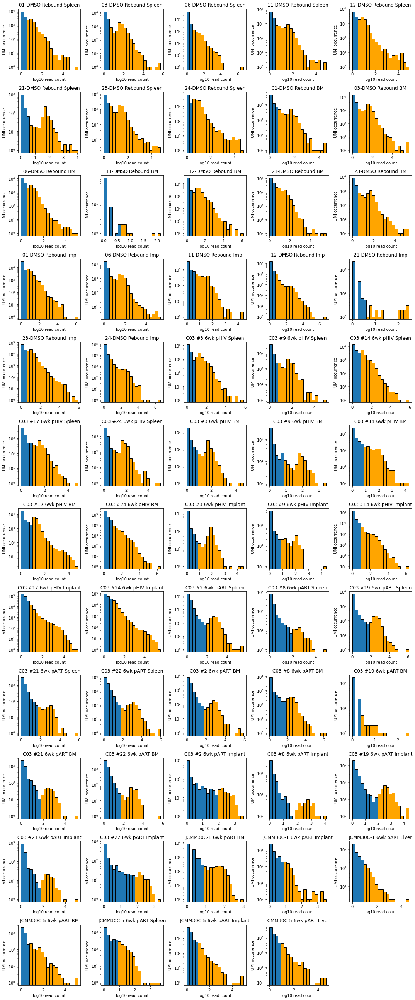

In [11]:
#UMI read count distribution
plt.figure(figsize=(15,36))
ploti = 0
thredict = {}
for UDP in adata:
    ploti += 1
    plt.subplot(12,5,ploti)
    sample = refdata[refdata['UDP']==UDP]['sample name'].iloc[0]
    ns,bins,patches = plt.hist(np.log10(adata[UDP]['read count']),edgecolor='black',bins=20)
    if 'Rebound' in sample:
        thre = 5
    elif 'pHIV' in sample:
        thre = 10
    elif 'pART' in sample:
        thre = 100
    if sample == 'C03 #19 6wk pART BM':
        thre = 3
    elif 'JCMM30C' in sample:
        thre = 10
    for i in range(0,len(ns)):
        if bins[i+1] >= np.log10(thre):
            patches[i].set_facecolor('orange')
    thredict[UDP] = thre
    plt.yscale('log')
    plt.xlabel('log10 read count')
    plt.ylabel('UMI occurrence')
    plt.title(sample)
plt.tight_layout()

Text(0, 0.5, 'UMI occurrence')

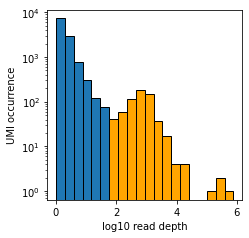

In [12]:
sample = 'C03 #2 6wk pART BM'
UDP = refdata[refdata['sample name']==sample]['UDP'].iloc[0]
plt.figure(figsize=(3.5,3.5))
ns,bins,patches = plt.hist(np.log10(adata[UDP]['read count']),edgecolor='black',bins=20)
thre = 100
for i in range(0,len(ns)):
    if bins[i+1] >= np.log10(thre):
        patches[i].set_facecolor('orange')
plt.yscale('log')
plt.xlabel('log10 read depth')
plt.ylabel('UMI occurrence')

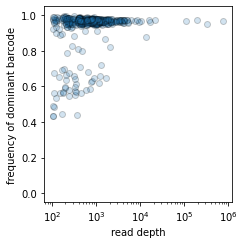

In [13]:
plt.figure(figsize=(3.5,3.5))
tdata = adata[UDP][adata[UDP]['read count']>thredict[UDP]]
plt.scatter(tdata['read count'],tdata['barcode_confidence'],alpha=0.2,edgecolor='black')
plt.xscale('log')
plt.ylim(-0.05,1.05)
plt.xlabel('read depth')
plt.ylabel('frequency of dominant barcode')
plt.tight_layout()

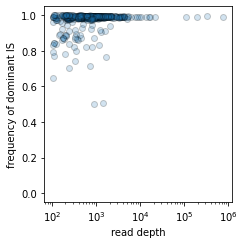

In [14]:
plt.figure(figsize=(3.5,3.5))
tdata = adata[UDP][adata[UDP]['read count']>thredict[UDP]]
plt.scatter(tdata['read count'],tdata['site_confidence'],alpha=0.2,edgecolor='black')
plt.xscale('log')
plt.ylim(-0.05,1.05)
plt.xlabel('read depth')
plt.ylabel('frequency of dominant IS')
plt.tight_layout()

In [15]:
rawdata = pd.read_csv('ISS_archive/record_NFNSX_'+UDP+'.txt',sep='\t',names=['UMI','barcode','provirus type','annotation'])
rawdata = rawdata[rawdata['provirus type'] != 'plasmid']
rawdata

,UMI,barcode,provirus type,annotation
0,CCGCGTTGGGCTGT,CTTATAGTAGGCGGAGCCGAAGATGATCCTACAA,hg38,chr8:65796182:+
1,TAGACTCATAAATG,CTTATAGCCGCCGGTGGAGCTGCAGCCCCTACAA,hg38,chr10:13231442:-
2,AGAGCGGATTAAGT,CTTATAGTAGGGGGTGCCGAAGATGAGCCTACAA,hg38,chr17:65605129:-
3,CCATCAACCCCGAATTCGAATTCAGCTCGTGTTCTAA,CTTATAGTAGGGGGTGCCGAAGATGAGCCTACAA,hg38,chr6:54707992:+
4,GTGGTGTGAATACC,CTTATAGTAGGGGGTGCCGAAGATGAGCCTACAA,hg38,chr5:158473741:+
...,...,...,...,...
2046933,GTCACTAGGCATAG,CTTATAGCCGCCGGTGGAGTTGCAGCCCCTACAA,free,AGCAGTGGC
2046934,GTCACTAGGCATAG,CTTATAGCCGCCGGTGGAGTTGCAGCCCCTACAA,free,AGCAGTGGC
2046935,CACTCCACTCATTC,CTTATAGCCGCCGGTGGAGTTGCAGCCCCTACAA,free,AGCAGTGGC
2046936,TGGTAAGACGGGGC,CTTATAG,free,AGCAG


In [16]:
UMIdict = {}
for index,row in rawdata.iterrows():
    UMI = row['UMI']
    if UMI not in UMIdict:
        UMIdict[UMI] = {'bc':[],'IS':[]}
    UMIdict[UMI]['bc'].append(row['barcode'])
    UMIdict[UMI]['IS'].append(row['annotation'])
for UMI in UMIdict:
    UMIdict[UMI]['bc'] = Counter(UMIdict[UMI]['bc'])
    UMIdict[UMI]['IS'] = Counter(UMIdict[UMI]['IS'])

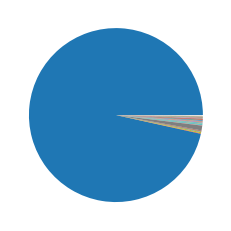

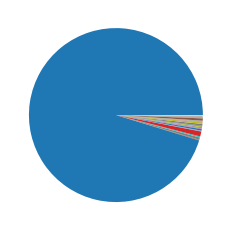

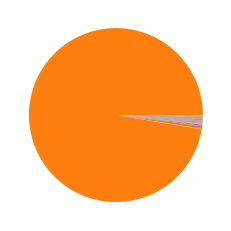

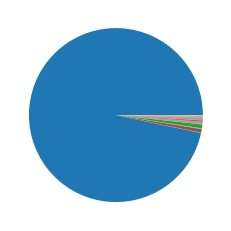

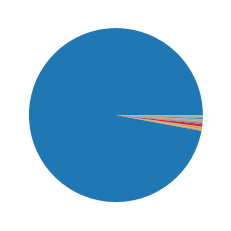

In [17]:
tlist = adata[UDP].sort_values(by='read count',ascending=False)['UMI'][:5]
for UMI in tlist:
    plt.figure(figsize=(4,4))
    plt.pie(UMIdict[UMI]['bc'].values())

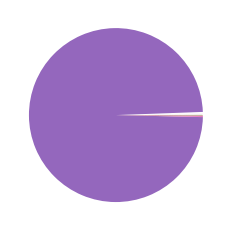

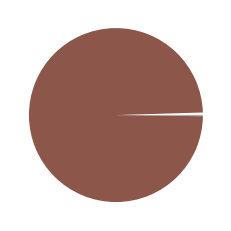

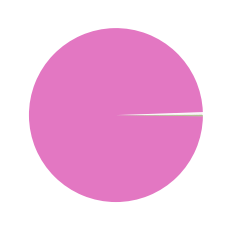

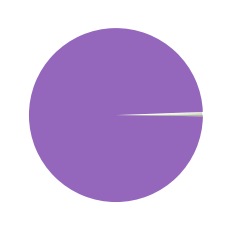

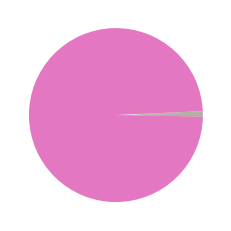

In [18]:
tlist = adata[UDP].sort_values(by='read count',ascending=False)['UMI'][:5]
for UMI in tlist:
    plt.figure(figsize=(4,4))
    plt.pie(UMIdict[UMI]['IS'].values())

In [19]:
#count of UMI in each sample
def count_UMI(x):
    if x in adata:
        return len(adata[x][adata[x]['read count']>thredict[x]])
    else:
        return 0

refdata['UMI count'] = refdata['UDP'].apply(lambda x:count_UMI(x))

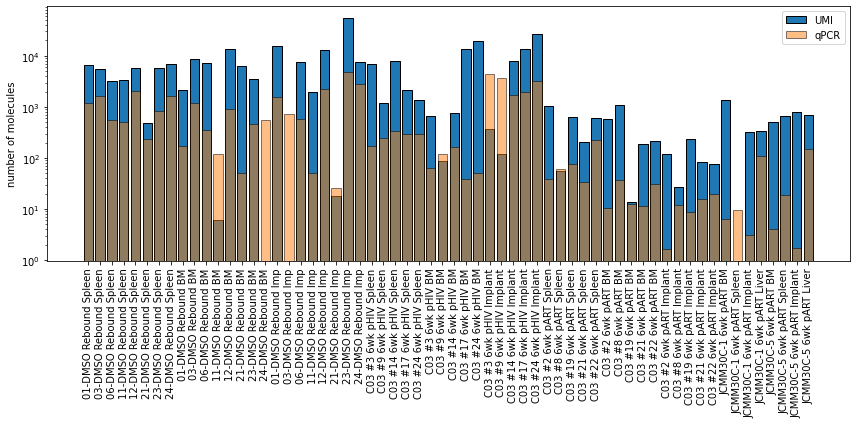

In [20]:
plt.figure(figsize=(12,6))
plt.bar(refdata['sample name'],refdata['UMI count'],edgecolor='black',label='UMI')
plt.bar(refdata['sample name'],refdata['HIV DNA copy/~500ng'],edgecolor='black',label='qPCR',alpha=0.5)
plt.ylabel('number of molecules')
plt.xticks(rotation=90)
plt.yscale('log')
plt.legend()
plt.tight_layout()

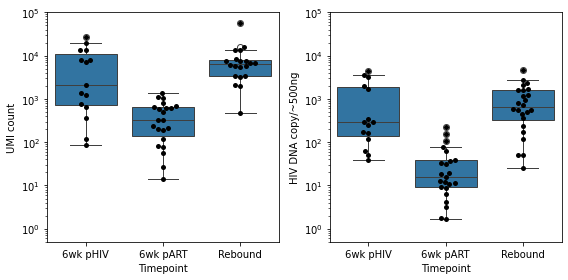

In [21]:
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
tdata = refdata[(refdata['UMI count']>=1)&(refdata['sample name']!='11-DMSO Rebound BM')&(refdata['sample name']!='21-DMSO Rebound Imp')]
sns.boxplot(y=tdata['UMI count'],x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
sns.swarmplot(y=tdata['UMI count'],x=tdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
plt.yscale('log')
plt.ylim(0.5,1e5)
plt.subplot(1,2,2)
sns.boxplot(y=refdata['HIV DNA copy/~500ng'],x=refdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
sns.swarmplot(y=refdata['HIV DNA copy/~500ng'],x=refdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
plt.yscale('log')
plt.ylim(0.5,1e5)
plt.tight_layout()
plt.savefig('figures/compare_UMI_qPCR.svg')

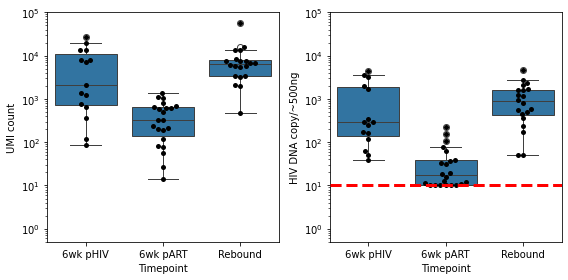

In [22]:
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
tdata = refdata[(refdata['UMI count']>=1)&(refdata['sample name']!='11-DMSO Rebound BM')&(refdata['sample name']!='21-DMSO Rebound Imp')]
tdata['copy'] = tdata['HIV DNA copy/~500ng'].apply(lambda x:x if x > 10 else 10)
sns.boxplot(y=tdata['UMI count'],x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
sns.swarmplot(y=tdata['UMI count'],x=tdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
plt.yscale('log')
plt.ylim(0.5,1e5)
plt.subplot(1,2,2)
sns.boxplot(y=tdata['copy'],x=refdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
sns.swarmplot(y=tdata['copy'],x=refdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
xlim=plt.xlim()
plt.plot(xlim,[10,10],lw=3,ls='--',color='red',zorder=200000)
plt.yscale('log')
plt.ylabel('HIV DNA copy/~500ng')
plt.ylim(0.5,1e5)
plt.xlim(xlim)
plt.tight_layout()
plt.savefig('figures/compare_UMI_qPCR_LLD10.svg')

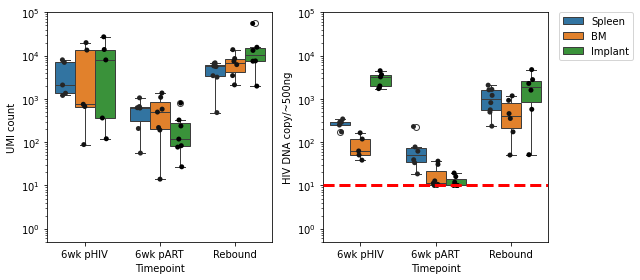

In [23]:
plt.figure(figsize=(9,4))
plt.subplot(1,2,1)
tdata = refdata[(refdata['Organ']!='Liver')&(refdata['UMI count']>=1)&(refdata['sample name']!='11-DMSO Rebound BM')&(refdata['sample name']!='21-DMSO Rebound Imp')]
sns.boxplot(y=tdata['UMI count'],x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'],hue=tdata['Organ'])
sns.stripplot(y=tdata['UMI count'],x=tdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'],hue=tdata['Organ'],dodge=True)
plt.yscale('log')
plt.ylim(0.5,1e5)
plt.legend([],[], frameon=False)

plt.subplot(1,2,2)
tdata['copy'] = tdata['HIV DNA copy/~500ng'].apply(lambda x:x if x > 10 else 10)
sns.boxplot(y=tdata['copy'],x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'],hue=tdata['Organ'])
ax = sns.stripplot(y=tdata['copy'],x=tdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'],hue=tdata['Organ'],dodge=True)
plt.yscale('log')
plt.ylim(0.5,1e5)
plt.ylabel('HIV DNA copy/~500ng')
xlim = plt.xlim()
plt.plot(xlim,[10,10],lw=3,ls='--',color='red',zorder=200000)
plt.xlim(xlim)
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:3], labels[0:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)    
plt.tight_layout()
plt.savefig('figures/compare_UMI_qPCR_by_organ_LLD10.svg')

In [24]:
#focus on the samples with valid sequencing results
mask = (refdata['Organ']!='Liver')&(refdata['UMI count']>=1)&(refdata['sample name']!='11-DMSO Rebound BM')&(refdata['sample name']!='21-DMSO Rebound Imp')
refdata['valid'] = mask

let's use some conservative filters. Now the number of UMI is higher than qPCR result for most samples. But they are correlated.

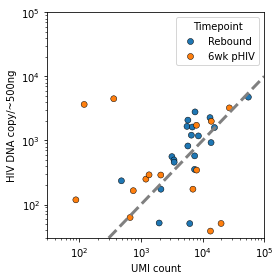

In [25]:
plt.figure(figsize=(4,4))
tdata = refdata[(refdata['valid'])&(refdata['Timepoint']!='6wk pART')]
sns.scatterplot(x=tdata['UMI count'],y=tdata['HIV DNA copy/~500ng'],hue=tdata['Timepoint'],edgecolor='black')
plt.plot([300,1e5],[30,1e4],linewidth=3,linestyle='--',color='grey')
plt.xscale('log')
plt.yscale('log')
plt.ylim(30,1e5)
plt.xlim(30,1e5)
plt.tight_layout()

In [26]:
tdata = refdata[(refdata['valid'])&(refdata['Timepoint']=='Rebound')]
ss.spearmanr(tdata['UMI count'],tdata['HIV DNA copy/~500ng'])

SignificanceResult(statistic=0.6481203007518795, pvalue=0.0019987135591128073)

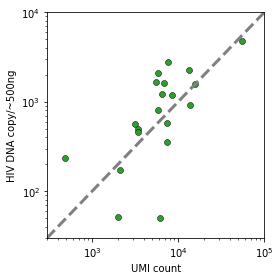

In [27]:
plt.figure(figsize=(4,4))
tdata = refdata[(refdata['valid'])&(refdata['Timepoint']=='Rebound')]
sns.scatterplot(x=tdata['UMI count'],y=tdata['HIV DNA copy/~500ng'],edgecolor='black',facecolor=plt.cm.tab10(2))
plt.legend([],[], frameon=False)
plt.plot([300,1e5],[30,1e4],linewidth=3,linestyle='--',color='grey')
plt.xscale('log')
plt.yscale('log')
plt.xlim(300,1e5)
plt.ylim(30,1e4)
plt.tight_layout()

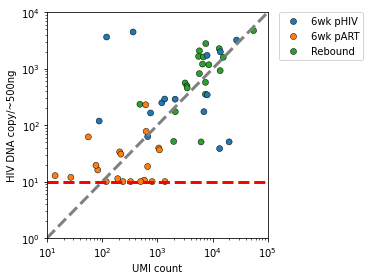

In [28]:
fig,ax=plt.subplots(figsize=(5.3,4))
tdata = refdata[(refdata['valid'])]
tdata['copy'] = tdata['HIV DNA copy/~500ng'].apply(lambda x:x if x > 10 else 10)
sns.scatterplot(x=tdata['UMI count'],y=tdata['copy'],hue=tdata['Timepoint'],edgecolor='black',hue_order=['6wk pHIV','6wk pART','Rebound'])
plt.plot([10,1e5],[1,1e4],linewidth=3,linestyle='--',color='grey')
plt.plot([10,1e5],[10,10],lw=3,ls='--',color='red')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[0:3], labels[0:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)    
plt.xscale('log')
plt.yscale('log')
plt.ylabel('HIV DNA copy/~500ng')
plt.ylim(1,1e4)
plt.xlim(10,1e5)
plt.tight_layout()
plt.savefig('figures/correlate_UMI_qPCR_LLD_10.png',dpi=300)

In [29]:
refdata[~(refdata['valid'])].to_csv('excluded_samples.csv')

In [30]:
tdata = refdata[(refdata['valid'])&(refdata['HIV DNA copy/~500ng']>10)]
ss.spearmanr(tdata['UMI count'],tdata['HIV DNA copy/~500ng'])

SignificanceResult(statistic=0.6126530612244897, pvalue=2.8855131547534843e-06)

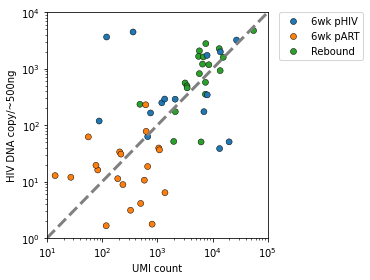

In [31]:
fig,ax=plt.subplots(figsize=(5.3,4))
tdata = refdata[(refdata['valid'])]
sns.scatterplot(x=tdata['UMI count'],y=tdata['HIV DNA copy/~500ng'],hue=tdata['Timepoint'],edgecolor='black',hue_order=['6wk pHIV','6wk pART','Rebound'])
plt.plot([10,1e5],[1,1e4],linewidth=3,linestyle='--',color='grey')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[0:3], labels[0:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)    
plt.xscale('log')
plt.yscale('log')
plt.ylim(1,1e4)
plt.xlim(10,1e5)
plt.tight_layout()
plt.savefig('figures/correlate_UMI_qPCR.svg')

In [32]:
#barcode count
def count_bc(x):
    if x not in adata: return 0
    tdata = adata[x][adata[x]['read count']>thredict[x]]
    return len(list(set(tdata['barcode'])))
    
refdata['barcode count'] = refdata['UDP'].apply(lambda x:count_bc(x))

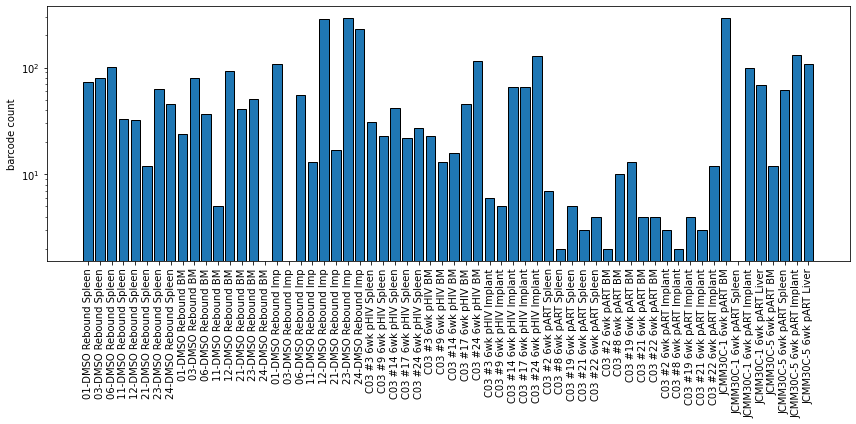

In [33]:
plt.figure(figsize=(12,6))
plt.bar(refdata['sample name'],refdata['barcode count'],edgecolor='black')
plt.ylabel('barcode count')
plt.xticks(rotation=90)
plt.yscale('log')
plt.tight_layout()

Some pART samples have less barcode number. I think it is because we only sequence a little amount of provirus molecules. The number of real barcode may be higher in that mouse. But without replication, it is difficult for a small sample to represent the whole organ.

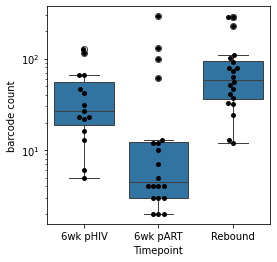

In [34]:
plt.figure(figsize=(4,4))
tdata = refdata[refdata['valid']]
sns.boxplot(y=tdata['barcode count'],x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
sns.swarmplot(y=tdata['barcode count'],x=tdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
plt.yscale('log')

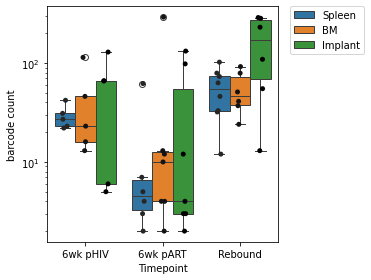

In [35]:
plt.figure(figsize=(5.3,4))
tdata = refdata[refdata['valid']]
sns.boxplot(y=tdata['barcode count'],x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'],hue=tdata['Organ'])
ax = sns.stripplot(y=tdata['barcode count'],x=tdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'],hue=tdata['Organ'],dodge=True)
plt.yscale('log')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:3], labels[0:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)    
plt.tight_layout()
plt.savefig('figures/barcode_count_by_tissue.svg')

In [36]:
mouselist = list(set(refdata['Mouse']))

In [37]:
samplelist = []
for mouse in mouselist:
    samplelist.extend(list(refdata[refdata['Mouse']==mouse]['sample name']))

In [38]:
#UMI contamination.
'''
ovmat = np.zeros((len(refdata),len(refdata)))
for i1,s1 in enumerate(samplelist):
    UDP1 = refdata[refdata['sample name']==s1]['UDP'].iloc[0]
    if UDP1 not in adata: continue
    tdata = adata[UDP1][adata[UDP1]['read count']>thredict[UDP1]]
    umilist1 = list(set(tdata['UMI']))
    for i2,s2 in enumerate(samplelist):
        UDP2 = refdata[refdata['sample name']==s2]['UDP'].iloc[0]
        if UDP2 not in adata: continue
        tdata = adata[UDP2][adata[UDP2]['read count']>thredict[UDP2]]
        umilist2 = list(set(tdata['UMI']))
        for UMI in umilist1:
            if UMI in umilist2:
                ovmat[i1,i2] += 1 
        ovmat[i1,i2] /= len(umilist1)
'''

"\novmat = np.zeros((len(refdata),len(refdata)))\nfor i1,s1 in enumerate(samplelist):\n    UDP1 = refdata[refdata['sample name']==s1]['UDP'].iloc[0]\n    if UDP1 not in adata: continue\n    tdata = adata[UDP1][adata[UDP1]['read count']>thredict[UDP1]]\n    umilist1 = list(set(tdata['UMI']))\n    for i2,s2 in enumerate(samplelist):\n        UDP2 = refdata[refdata['sample name']==s2]['UDP'].iloc[0]\n        if UDP2 not in adata: continue\n        tdata = adata[UDP2][adata[UDP2]['read count']>thredict[UDP2]]\n        umilist2 = list(set(tdata['UMI']))\n        for UMI in umilist1:\n            if UMI in umilist2:\n                ovmat[i1,i2] += 1 \n        ovmat[i1,i2] /= len(umilist1)\n"

In [39]:
'''plt.figure(figsize=(12,10))
sns.heatmap(ovmat,xticklabels=samplelist, yticklabels=samplelist)'''

'plt.figure(figsize=(12,10))\nsns.heatmap(ovmat,xticklabels=samplelist, yticklabels=samplelist)'

In [40]:
#barcode contamination

bcdict = {}
for UDP in adata:
    bcdict[UDP] = {}
    tdata = adata[UDP][adata[UDP]['read count']>thredict[UDP]]
    for index,row in tdata.iterrows():
        bc = row['barcode']
        if bc not in bcdict[UDP]:
            bcdict[UDP][bc] = 0
        bcdict[UDP][bc] += 1
'''
ovmat = np.zeros((len(refdata),len(refdata)))
for i1,s1 in enumerate(samplelist):
    UDP1 = refdata[refdata['sample name']==s1]['UDP'].iloc[0]
    if UDP1 not in adata: continue
    for i2,s2 in enumerate(samplelist):
        UDP2 = refdata[refdata['sample name']==s2]['UDP'].iloc[0]
        if UDP2 not in adata: continue
        for bc in bcdict[UDP1]:
            if bc in bcdict[UDP2]:
                ovmat[i1,i2] += bcdict[UDP1][bc]
        ovmat[i1,i2] /= sum(bcdict[UDP1].values())
'''

"\novmat = np.zeros((len(refdata),len(refdata)))\nfor i1,s1 in enumerate(samplelist):\n    UDP1 = refdata[refdata['sample name']==s1]['UDP'].iloc[0]\n    if UDP1 not in adata: continue\n    for i2,s2 in enumerate(samplelist):\n        UDP2 = refdata[refdata['sample name']==s2]['UDP'].iloc[0]\n        if UDP2 not in adata: continue\n        for bc in bcdict[UDP1]:\n            if bc in bcdict[UDP2]:\n                ovmat[i1,i2] += bcdict[UDP1][bc]\n        ovmat[i1,i2] /= sum(bcdict[UDP1].values())\n"

In [41]:
#plt.figure(figsize=(12,10))
#sns.heatmap(ovmat,xticklabels=samplelist, yticklabels=samplelist,cbar_kws={'label':'barcode overlap'})

In [42]:
refdata

,UDP,Series,Mouse,Timepoint,Organ,HIV DNA copy/~500ng,sample name,effective reads,UMI count,valid,barcode count
0,UDP01,JCKB24,01-DMSO,Rebound,Spleen,1208.19,01-DMSO Rebound Spleen,835123,6571,True,73
1,UDP02,JCKB24,03-DMSO,Rebound,Spleen,1655.62,03-DMSO Rebound Spleen,1982611,5580,True,79
2,UDP03,JCKB24,06-DMSO,Rebound,Spleen,559.38,06-DMSO Rebound Spleen,4932454,3177,True,102
3,UDP04,JCKB24,11-DMSO,Rebound,Spleen,495.58,11-DMSO Rebound Spleen,414968,3433,True,33
4,UDP05,JCKB24,12-DMSO,Rebound,Spleen,2074.42,12-DMSO Rebound Spleen,552524,5767,True,32
...,...,...,...,...,...,...,...,...,...,...,...
58,UDP28,JCMM30C,JCMM30C-1,6wk pART,Liver,107.01,JCMM30C-1 6wk pART Liver,354855,333,False,68
59,UDP29,JCMM30C,JCMM30C-5,6wk pART,BM,4.10,JCMM30C-5 6wk pART BM,503497,497,True,12
60,UDP30,JCMM30C,JCMM30C-5,6wk pART,Spleen,18.49,JCMM30C-5 6wk pART Spleen,246492,665,True,62
61,UDP31,JCMM30C,JCMM30C-5,6wk pART,Implant,1.76,JCMM30C-5 6wk pART Implant,1089399,802,True,132


In [43]:
fdata = {}
for UDP in adata:
    fdata[UDP] = adata[UDP][adata[UDP]['read count']>thredict[UDP]]

In [44]:
fdata[UDP]

,UMI,read count,barcode,barcode_confidence,2nd_barcode_freq,provirus type,site,site_confidence,2nd_site_freq,mapping length
0,CGTGCACTCTCGAT,601,CTTATAGTAGCGGATGCAGTCGTAGAATTATAG,0.555740,0.099834,HIV,BCNFNSX:9637:+,0.500832,0.131448,20
7,ACAGGTGTGTTACA,663,CTTATAGTTGAAGGAGTTGGAGCTGTACCTACAA,0.880845,0.019608,hg38,chr10:22250871:+,0.907994,0.063348,129
9,AAGGATTTAGGGAG,1310,CTTATAGGAGTTGCCGGAGCCGCAGAGTTATAG,0.601527,0.026718,HIV,BCNFNSX:9637:+,0.505344,0.059542,18
10,AGTACCTCTTTCAA,273,CTTATAGGCGAAGATGTTGTTGAGGTATTATAG,0.315018,0.124542,HIV,BCNFNSX:9637:+,0.615385,0.069597,25
12,CAACGTCTTTCTTA,525,CTTATAGACGTTGTAGCGGGTGTAGAATTATAG,0.611429,0.095238,HIV,BCNFNSX:9637:+,0.504762,0.123810,20
...,...,...,...,...,...,...,...,...,...,...
14465,GTACTCTCATATA,32,CTTATAGTAGAAGTGGAAGATGCGGCATTATAG,0.906250,0.031250,free,AGCAC,1.000000,NaN,5
14468,GCGCAGAACATTCT,15,CTTATAGTAGAAGTGGAAGATGCGGCATTATAG,0.933333,0.066667,free,AGCAC,1.000000,NaN,5
14474,TGTAATAGAGATCA,16,CTTATAGAAGGGGTCGTTGTTGATGTGTTATAG,0.937500,0.062500,free,NaN,1.000000,NaN,0
14484,ACTTAATCAGTAGC,14,CTTATAGCGGAGGTAGAAGTCGAGGAGTTATAG,0.857143,0.071429,free,AG,1.000000,NaN,2


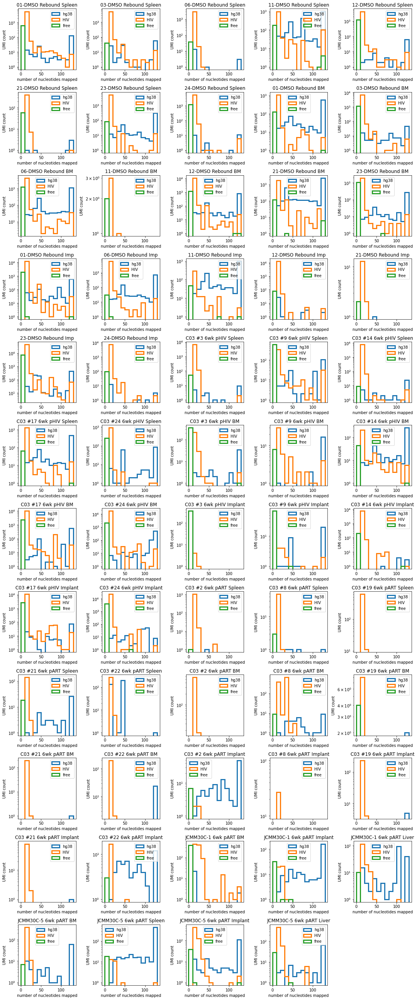

In [45]:
#mapping length
plt.figure(figsize=(15,36))
ploti = 0
for UDP in fdata:
    ploti += 1
    plt.subplot(12,5,ploti)
    tdata = fdata[UDP]
    sample = refdata[refdata['UDP']==UDP]['sample name'].iloc[0]
    for ptype in ['hg38','HIV','free']:
        plt.hist(tdata[tdata['provirus type']==ptype]['mapping length'],bins=range(0,140,10),lw=3,histtype='step',label=ptype)
    plt.yscale('log')
    plt.xlabel('number of nucleotides mapped')
    plt.ylabel('UMI count')
    plt.title(sample)
    plt.legend()
plt.tight_layout()

In [46]:
#the frequency of different DNA types
def find_ptype(x,ptype):
    if x not in fdata: return 0
    tdata = fdata[x]
    if ptype == 'circular':
        return len(tdata[tdata['site']=='BCNFNSX:523:+'])
    if ptype == 'linear':
        return len(tdata[tdata['provirus type']=='free'])
    if ptype == 'integrated':
        return len(tdata[tdata['provirus type']=='hg38'])
    if ptype == 'auto-integrated':
        return len(tdata[(tdata['provirus type']=='HIV')&(tdata['site']!='BCNFNSX:523:+')])

countdict = {}
#typelist = ['hg19', 'plasmid', 'HIV', 'free']
typelist = ['integrated','linear','circular','auto-integrated']
for UDP in fdata:
    countdict[UDP] = fdata[UDP].groupby('provirus type').size()
for ptype in typelist:
    refdata['provirus_type_'+ptype] = refdata['UDP'].apply(lambda x:find_ptype(x,ptype))

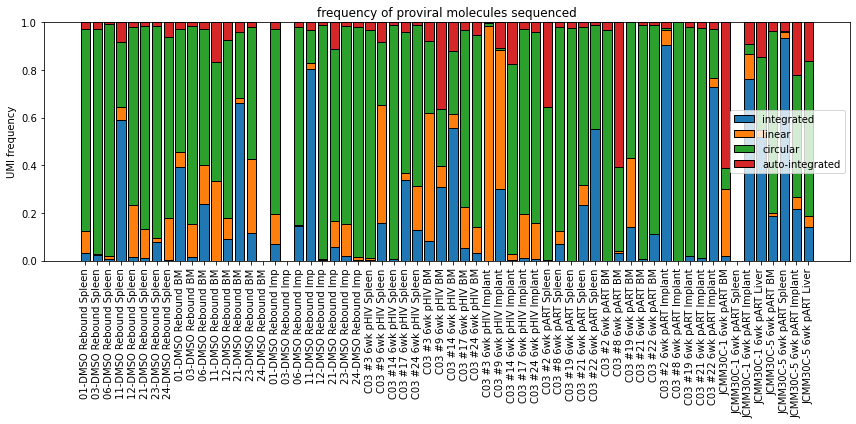

In [47]:
plt.figure(figsize=(12,6))
bottomlist = [0]*len(refdata)
for ptype in typelist:
    freqlist = []
    for index,row in refdata.iterrows():
        if row['UMI count'] == 0: 
            freqlist.append(0)
        else:
            freqlist.append(row['provirus_type_'+ptype]/sum(row[['provirus_type_'+x for x in typelist]]))
    plt.bar(refdata['sample name'],freqlist,edgecolor='black',label=ptype,bottom=bottomlist)
    for i in range(len(refdata)):
        bottomlist[i] += freqlist[i]
plt.ylabel('UMI frequency')
plt.xticks(rotation=90)
plt.title('frequency of proviral molecules sequenced')
plt.legend()
plt.tight_layout()

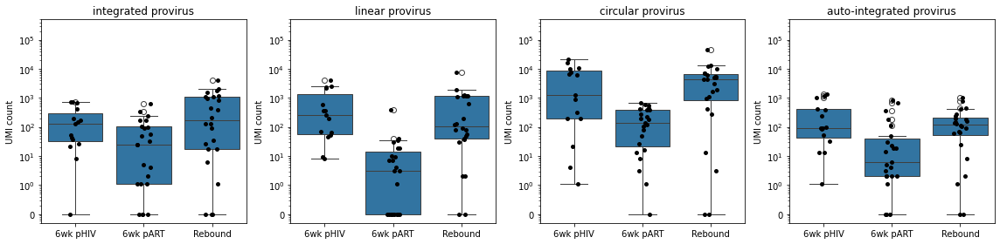

In [48]:
plt.figure(figsize=(16,4))
ploti = 0
for ptype in typelist:
    ploti += 1
    plt.subplot(1,4,ploti)
    sns.boxplot(y=refdata['provirus_type_'+ptype]+0.1,x=refdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
    sns.stripplot(y=refdata['provirus_type_'+ptype]+0.1,x=refdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
    plt.title(ptype+' provirus')
    plt.yscale('log')
    plt.xlabel('')
    locs,labels=plt.yticks()
    labels[2] = '0'
    plt.yticks(locs,labels)
    plt.ylim(0.05,5e5)
    plt.ylabel('UMI count')
plt.tight_layout()
plt.savefig('figures/provirus_UMI_count_by_type.png')

In [49]:
for ptype in typelist:
    tdata = refdata[refdata['valid']]
    rho,p = ss.ranksums(tdata[tdata['Timepoint']=='6wk pHIV']['provirus_type_'+ptype],tdata[tdata['Timepoint']=='6wk pART']['provirus_type_'+ptype])
    print(ptype+', pHIV vs pART, p='+str(p))
    rho,p = ss.ranksums(tdata[tdata['Timepoint']=='Rebound']['provirus_type_'+ptype],tdata[tdata['Timepoint']=='6wk pART']['provirus_type_'+ptype])
    print(ptype+', Rebound vs pART, p='+str(p))

integrated, pHIV vs pART, p=0.03876557417763719
integrated, Rebound vs pART, p=0.0003561484630907232
linear, pHIV vs pART, p=1.3613753198668086e-05
linear, Rebound vs pART, p=5.607514411947966e-07
circular, pHIV vs pART, p=0.011847085301651895
circular, Rebound vs pART, p=2.562945863395653e-07
auto-integrated, pHIV vs pART, p=0.00538034975399193
auto-integrated, Rebound vs pART, p=0.000509072918078457


In [50]:
for ptype in typelist:
    tdata = refdata[refdata['valid']]
    p = ss.gmean(tdata[tdata['Timepoint']!='6wk pART']['provirus_type_'+ptype]+0.1)/ss.gmean(tdata[tdata['Timepoint']=='6wk pART']['provirus_type_'+ptype]+0.1)
    print(ptype+', ohters vs pART, reduction='+str(p))

integrated, ohters vs pART, reduction=14.05707578148986
linear, ohters vs pART, reduction=148.35992593391248
circular, ohters vs pART, reduction=22.7081064830127
auto-integrated, ohters vs pART, reduction=13.755470941328651


In [51]:
umicountdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    umicountdict[time] = {}
    for ptype in typelist:
        tdata = refdata[(refdata['valid'])&(refdata['Timepoint']==time)]
        umicountdict[time][ptype] = ss.gmean(tdata[tdata['Timepoint']==time]['provirus_type_'+ptype]+0.1) 
pd.DataFrame(umicountdict)

,6wk pHIV,6wk pART,Rebound
integrated,68.886948,10.536696,262.994281
linear,221.802504,1.686509,273.879519
circular,762.030941,84.033307,3798.631880
auto-integrated,102.504823,8.940493,140.979646


In [52]:
#numerical mean
umicountdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    umicountdict[time] = {}
    for ptype in typelist:
        tdata = refdata[(refdata['valid'])&(refdata['Timepoint']==time)]
        umicountdict[time][ptype] = np.mean(tdata[tdata['Timepoint']==time]['provirus_type_'+ptype]) 
pd.DataFrame(umicountdict)

,6wk pHIV,6wk pART,Rebound
integrated,223.866667,89.10,807.80
linear,876.066667,26.65,905.10
circular,5480.333333,217.70,7044.25
auto-integrated,342.400000,109.20,235.80


In [53]:
#exclude 0
umicountdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    umicountdict[time] = {}
    for ptype in typelist:
        tdata = refdata[(refdata['valid'])&(refdata['Timepoint']==time)&(refdata['provirus_type_'+ptype]>0)]
        umicountdict[time][ptype] = ss.gmean(tdata[tdata['Timepoint']==time]['provirus_type_'+ptype]) 
pd.DataFrame(umicountdict)

,6wk pHIV,6wk pART,Rebound
integrated,109.622422,23.414890,262.478998
linear,221.323931,10.870042,273.624483
circular,755.640005,83.338188,3798.414532
auto-integrated,101.679421,14.396737,140.773075


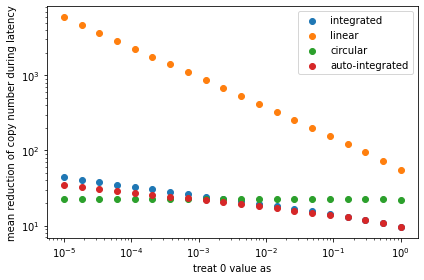

In [54]:
for ptype in typelist:
    redlist = []
    for zeroUMI in np.logspace(-5,0,20):
        tdata = refdata[refdata['valid']]
        p = ss.gmean(tdata[tdata['Timepoint']!='6wk pART']['provirus_type_'+ptype]+zeroUMI)/ss.gmean(tdata[tdata['Timepoint']=='6wk pART']['provirus_type_'+ptype]+zeroUMI)
        redlist.append(p)
    plt.scatter(np.logspace(-5,0,20),redlist,label=ptype)
plt.legend()
plt.xlabel('treat 0 value as')
plt.ylabel('mean reduction of copy number during latency')
plt.xscale('log')
plt.yscale('log')
plt.tight_layout()

In [55]:
refdata.to_csv('count_summary_0126.csv')

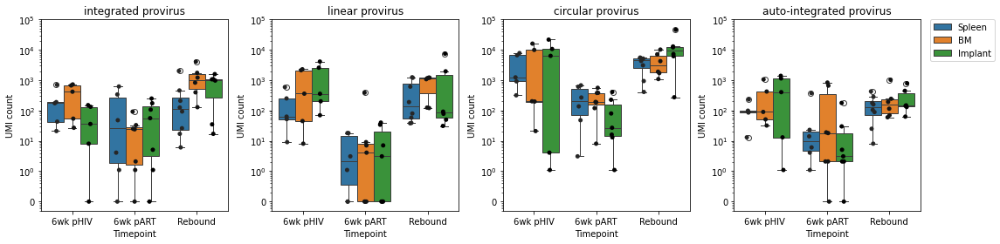

In [56]:
plt.figure(figsize=(16,4))
ploti = 0
tdata = refdata[refdata['valid']]
for ptype in typelist:
    ploti += 1
    plt.subplot(1,4,ploti)
    sns.boxplot(y=tdata['provirus_type_'+ptype]+0.1,x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'],hue=tdata['Organ'])
    ax = sns.stripplot(y=tdata['provirus_type_'+ptype]+0.1,x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'],hue=tdata['Organ'],dodge=True,color='black')
    plt.title(ptype+' provirus')
    plt.yscale('log')
    locs,labels=plt.yticks()
    for i,label in enumerate(labels):
        if label.get_position()[1] == 0.1:
            labels[i] = '0'
    plt.yticks(locs,labels)
    plt.ylim(0.05,1e5)
    plt.ylabel('UMI count')
    plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:3], labels[0:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)    
plt.tight_layout()
plt.savefig('figures/provirus_UMI_count_by_type_and_organ.png',dpi=300)

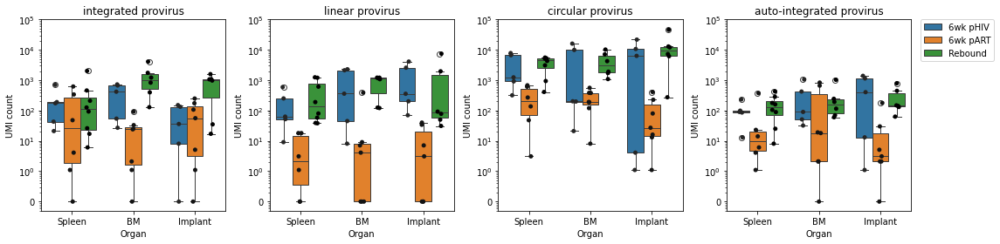

In [57]:
plt.figure(figsize=(16,4))
ploti = 0
tdata = refdata[refdata['valid']]
for ptype in typelist:
    ploti += 1
    plt.subplot(1,4,ploti)
    sns.boxplot(y=tdata['provirus_type_'+ptype]+0.1,hue=tdata['Timepoint'],hue_order=['6wk pHIV','6wk pART','Rebound'],x=tdata['Organ'])
    ax = sns.stripplot(y=tdata['provirus_type_'+ptype]+0.1,hue=tdata['Timepoint'],hue_order=['6wk pHIV','6wk pART','Rebound'],x=tdata['Organ'],dodge=True,color='black')
    plt.title(ptype+' provirus')
    plt.yscale('log')
    locs,labels=plt.yticks()
    for i,label in enumerate(labels):
        if label.get_position()[1] == 0.1:
            labels[i] = '0'
    plt.yticks(locs,labels)
    plt.ylim(0.05,1e5)
    plt.ylabel('UMI count')
    plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:3], labels[0:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)    
plt.tight_layout()
plt.savefig('figures/provirus_UMI_count_by_type_and_organ.svg')

HIV count is auto-integrating virus.  
free count is unintegrated virus.  
plasmid count is contamination/carry-over from infection.  
hg19 count is integrated virus.  

It seems virus has many autointegrated form and unintegrated form during pHIV and Rebound period.

In [58]:
refdata.to_csv('summary.csv',index=False)
for UDP in fdata:
    fdata[UDP].to_csv('ISS_cleanup/linkage_list_'+UDP+'.csv',index=False)

In [59]:
mcount = 0
for UDP in refdata[refdata['valid']]['UDP']:
    mcount += len(fdata[UDP])
print(mcount)

292552


In [60]:
iscount = 0
for UDP in refdata[refdata['valid']]['UDP']:
    tdata = fdata[UDP]
    tdata = tdata[tdata['provirus type']=='hg38']
    iscount += len(set(tdata['site']))
print(iscount)

14885


In [61]:
fdata[UDP]

,UMI,read count,barcode,barcode_confidence,2nd_barcode_freq,provirus type,site,site_confidence,2nd_site_freq,mapping length
2,AATACACGATTGTG,1223,CTTATAGCAGTTGGCGTAGATGGCGGATTATAG,0.645135,0.121832,HIV,BCNFNSX:9637:+,0.548651,0.103843,21
3,GATTTCCACGTCTA,12,CTTATAG,0.916667,0.083333,hg38,chr13:52738443:-,1.000000,NaN,91
6,GCTGACACTTTTTA,45594,CTTATAG,0.859565,0.009343,HIV,BCNFNSX:9637:+,0.905295,0.055446,28
7,ATAATCTCCCCACC,2026,CTTATAGATGATGATGTAGAAGCCGCATTATAG,0.627345,0.140671,HIV,BCNFNSX:9637:+,0.502962,0.080948,18
9,CTGACACTTTTTA,412,CTTATAG,0.958738,0.009709,HIV,BCNFNSX:9637:+,0.885922,0.055825,28
...,...,...,...,...,...,...,...,...,...,...
14080,AGGTCTTCTATAGT,11,CTTATAG,0.818182,0.090909,free,TATAAGTGC,1.000000,NaN,9
14082,GACTCCGGGTACTG,17,CTTATAGCGGTTGCCGTAGGGGAAGTTCCTACAA,0.352941,0.294118,free,AGCAG,0.941176,0.058824,5
14087,ACAGGAAATT,12,CTTATAGCGGAGGTAGAAGTCGAGGAGTTATAG,1.000000,NaN,free,AGCA,1.000000,NaN,4
14096,GTGCTCCGAATTAA,11,CTTATAGCTGTTGAAGACGACGTGGAATTATAG,0.909091,0.090909,free,AGCACCCA,1.000000,NaN,8


Todo list:
1. Pick some barcode to visualize its DNA composition
2. Plot integration sites on human genome and HIV genome(autointegration)
2. Correlate DNA diversity with RNA diversity


In [62]:
#make human readable barcode indexed dataframe for all samples.
#barcode   annotation(unintegrated/chr.../NFNSX...)   UMI_count   read_count
bcdata = {}
for UDP in fdata:
    bclist = []
    annotlist = []
    UMIcount = []
    readcount = []
    mlength = []
    bcdict = {}
    for index,row in fdata[UDP].iterrows():
        bc = row['barcode']
        if bc not in bcdict:
            bcdict[bc] = {}
        ptype = row['provirus type']
        if ptype == 'free':
            annot = 'linear'
        elif ptype == 'HIV' and row['site'] == 'BCNFNSX:523:+':
            annot = 'circular'
        elif ptype == 'hg38' or ptype == 'HIV':
            annot = row['site']
        else:
            annot = 'plasmid'
        if annot not in bcdict[bc]:
            bcdict[bc][annot] = [0,0,[]]
        bcdict[bc][annot][0] += 1
        bcdict[bc][annot][1] += row['read count']
        bcdict[bc][annot][2].append(row['mapping length'])
    for bc in bcdict:
        for annot in bcdict[bc]:
            bclist.append(bc)
            annotlist.append(annot)
            UMIcount.append(bcdict[bc][annot][0])
            readcount.append(bcdict[bc][annot][1])
            mlength.append(np.mean(bcdict[bc][annot][2]))
    bcdata[UDP] = pd.DataFrame(zip(bclist,annotlist,UMIcount,readcount,mlength),columns=['barcode','annotation','UMI count','read count','mapping length'])

In [63]:
for UDP in bcdata:
    bcdata[UDP].to_csv('ISS_count/barcode_list_'+UDP+'.csv',index=False)

In [64]:
def rand_jitter(arr):
    stdev = .01 * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev

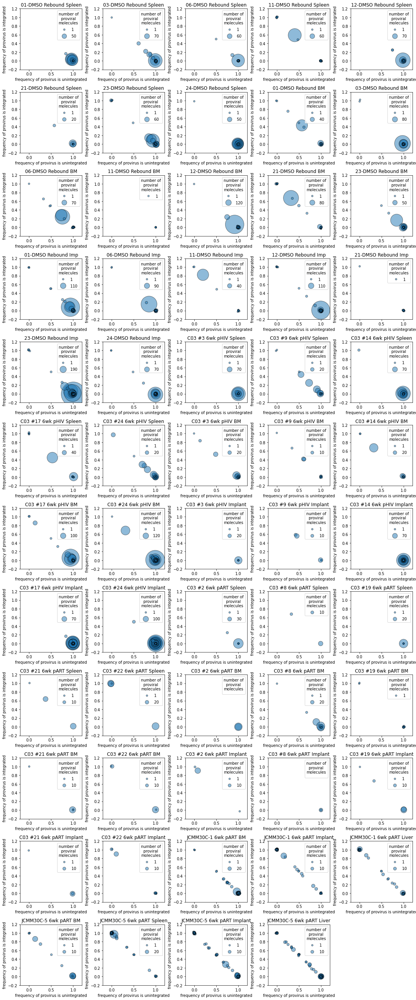

In [65]:
%matplotlib inline
plt.figure(figsize=(15,36))
ploti = 0
for UDP in bcdata:
    sample = refdata[refdata['UDP']==UDP]['sample name'].iloc[0]
    bcdict = {}
    for index,row in bcdata[UDP].iterrows(): 
        bc = row['barcode']
        if bc not in bcdict:
            bcdict[bc] = [0,0,0]
        bcdict[bc][0] += row['UMI count']
        if row['annotation'] == 'linear' or row['annotation'] == 'circular' or 'NFNSX' in row['annotation']:
            bcdict[bc][1] += row['UMI count']
        elif 'chr' in row['annotation']:
            bcdict[bc][2] += row['UMI count']
    xlist = []; ylist = []; slist = []
    for bc in bcdict:
        slist.append((np.sqrt(bcdict[bc][0]))*20)
        xlist.append(bcdict[bc][1]/bcdict[bc][0])
        ylist.append(bcdict[bc][2]/bcdict[bc][0])
        
    ploti += 1
    plt.subplot(12,5,ploti)
    sc = plt.scatter(rand_jitter(xlist),rand_jitter(ylist),s=slist,edgecolor='black',alpha=0.5)
    plt.xlabel('frequency of provirus is unintegrated')
    plt.ylabel('frequency of provirus is integrated')
    plt.title(sample)
    maxcount = max([bcdict[x][0] for x in bcdict])    
    plt.xlim(-0.2,1.2)
    plt.ylim(-0.2,1.2)
    plt.legend(*sc.legend_elements("sizes", num=[1,round(np.sqrt(maxcount),-1)],color=plt.cm.tab10(0),markeredgecolor='black',func=lambda s:(s*s/400)),title='number of\n  proviral\nmolecules',frameon=True)
plt.tight_layout()

In [66]:
refdata[refdata['Mouse']=='23-DMSO']

,UDP,Series,Mouse,Timepoint,Organ,HIV DNA copy/~500ng,sample name,effective reads,UMI count,valid,barcode count,provirus_type_integrated,provirus_type_linear,provirus_type_circular,provirus_type_auto-integrated
6,UDP07,JCKB24,23-DMSO,Rebound,Spleen,818.86,23-DMSO Rebound Spleen,621614,5761,True,63,459,80,5133,89
14,UDP15,JCKB24,23-DMSO,Rebound,BM,457.40,23-DMSO Rebound BM,933267,3455,True,51,398,1081,1906,70
22,UDP37,JCKB24,23-DMSO,Rebound,Implant,4743.20,23-DMSO Rebound Imp,5597534,55174,True,288,975,7497,45911,791


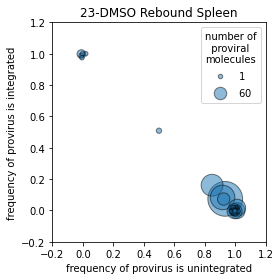

In [67]:
    UDP = 'UDP07'
    sample = refdata[refdata['UDP']==UDP]['sample name'].iloc[0]
    bcdict = {}
    for index,row in bcdata[UDP].iterrows(): 
        bc = row['barcode']
        if bc not in bcdict:
            bcdict[bc] = [0,0,0]
        bcdict[bc][0] += row['UMI count']
        if row['annotation'] == 'linear' or row['annotation'] == 'circular' or 'NFNSX' in row['annotation']:
            bcdict[bc][1] += row['UMI count']
        elif 'chr' in row['annotation']:
            bcdict[bc][2] += row['UMI count']
    xlist = []; ylist = []; slist = []
    for bc in bcdict:
        slist.append((np.sqrt(bcdict[bc][0]))*20)
        xlist.append(bcdict[bc][1]/bcdict[bc][0])
        ylist.append(bcdict[bc][2]/bcdict[bc][0])

    plt.figure(figsize=(4,4))
    sc = plt.scatter(rand_jitter(xlist),rand_jitter(ylist),s=slist,edgecolor='black',alpha=0.5)
    plt.xlabel('frequency of provirus is unintegrated')
    plt.ylabel('frequency of provirus is integrated')
    plt.title(sample)
    maxcount = max([bcdict[x][0] for x in bcdict])    
    plt.xlim(-0.2,1.2)
    plt.ylim(-0.2,1.2)
    plt.legend(*sc.legend_elements("sizes", num=[1,round(np.sqrt(maxcount),-1)],color=plt.cm.tab10(0),markeredgecolor='black',func=lambda s:(s*s/400)),title='number of\n  proviral\nmolecules',frameon=True)
    plt.tight_layout()

If a barcode has more provirus, it is more likely to be unintegrated...

In [68]:
%matplotlib inline
seed = 0
for UDP in bcdata:
    seed += 1
    np.random.seed(seed)
    colordict = {}
    for annot in set(bcdata[UDP]['annotation']):
        c=np.random.rand(3,)
        while (abs(c[0]-c[1] < 0.1) and abs(c[0]-c[2] < 0.1) and abs(c[1]-c[2] < 0.1)):
            c=np.random.rand(3,)
        colordict[annot] = c
    colordict['linear'] = [0.5,0.5,0.5]
    colordict['circular'] = [0, 79./255, 152./255]
    sample = refdata[refdata['UDP']==UDP]['sample name'].iloc[0]
    bccount = {}
    for index,row in bcdata[UDP].iterrows():
        if row['annotation'] == 'plasmid': continue
        bc = row['barcode']
        if bc not in bccount: bccount[bc] = 0
        bccount[bc] += row['UMI count']
    bccount = {k: v for k, v in sorted(bccount.items(), key=lambda item: -item[1])}
    piecount = 0
    plt.figure(figsize=(10,25))
    for bc in bccount:
        piecount += 1
        if piecount > 5: break
        plt.subplot(5,1,piecount)
        tdata = bcdata[UDP][(bcdata[UDP]['barcode']==bc)&(bcdata[UDP]['annotation']!='plasmid')]
        if piecount == 1: maxcount = sum(tdata['UMI count'])
        ylist = list(tdata['UMI count'])
        llist = list(tdata.apply(lambda x:x['annotation']+'(UMI count:'+str(x['UMI count'])+')',axis=1))
        clist = list([colordict[x] for x in tdata['annotation']])
        plt.pie(ylist,labels=llist,colors=clist,radius=np.sqrt(sum(tdata['UMI count'])/maxcount))
        plt.title(bc)
    plt.tight_layout()
    plt.savefig('figures/pie_chart_integration_site_in_barcode_'+sample+'.png')
    plt.close()

In [69]:
HIVISdictp = {}
HIVISdictm = {}
for UDP in bcdata:
    for index,row in bcdata[UDP].iterrows():
        if 'NFNSX' in row['annotation']:
            annot = row['annotation'].rsplit(':')
            if annot[2] == '+':
                if int(annot[1]) not in HIVISdictp: HIVISdictp[int(annot[1])] = 0
                HIVISdictp[int(annot[1])] += row['UMI count']
            else:
                if int(annot[1]) not in HIVISdictm: HIVISdictm[int(annot[1])] = 0
                HIVISdictm[int(annot[1])] -= row['UMI count']

In [70]:
infile = open('BC_Nef_new_NL43.fa')
for record in SeqIO.parse(infile,'fasta'):
    refseq = str(record.seq)
infile.close()

In [71]:
orfdict = {'Gag':range(790,2293),'Pol':range(2085,5097),'Vif':range(5041,5620),'Vpr':range(5559,5850),'Vpu':range(6061,6307),'Env':range(6221,8786),'Tat':chain(range(5830,6045),range(8369,8460)),'Rev':chain(range(5969,6045),range(8369,8644)),'Nef':range(8813,9434)}

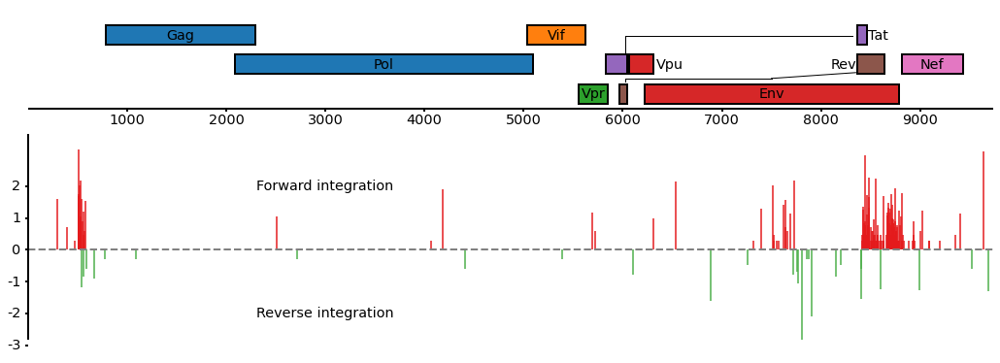

In [72]:
#draw genome
import matplotlib.patches as patches

def label_orf(gene,y):
    p1 = orfdict[gene][0]
    p2 = orfdict[gene][-1]
    p = (p1+p2)/2
    ax[0].text(p,y,gene,size='x-large',ha='center', va='center')

LW = 2
colordict = {'genomic RNA':0,'Vif':1,'Vpr':2,'Vpu':3,'Tat':4,'Rev':5,'Nef':6}    
fig, ax = plt.subplots(2,1,figsize=(18,5),gridspec_kw={'height_ratios': [1, 2]})

rect1 = patches.Rectangle((orfdict['Gag'][0],61), len(orfdict['Gag']), 20, linewidth=LW,  edgecolor='black', facecolor=plt.cm.tab10(colordict['genomic RNA']))
ax[0].add_patch(rect1)
label_orf('Gag',70)

rect2 = patches.Rectangle((orfdict['Pol'][0],31), len(orfdict['Pol']), 20, linewidth=LW,  edgecolor='black', facecolor=plt.cm.tab10(colordict['genomic RNA']))
ax[0].add_patch(rect2)
label_orf('Pol',40)

rect3 = patches.Rectangle((orfdict['Vif'][0],61), len(orfdict['Vif']), 20, linewidth=LW,  edgecolor='black', facecolor=plt.cm.tab10(colordict['Vif']))
ax[0].add_patch(rect3)
label_orf('Vif',70)

rect4 = patches.Rectangle((orfdict['Vpr'][0],0), len(orfdict['Vpr']), 20, linewidth=LW,  edgecolor='black', facecolor=plt.cm.tab10(colordict['Vpr']))
ax[0].add_patch(rect4)
label_orf('Vpr',10)

rect5 = patches.Rectangle((orfdict['Vpu'][0],31), len(orfdict['Vpu']), 20, linewidth=LW,  edgecolor='black', facecolor=plt.cm.tab10(colordict['Vpu']))
ax[0].add_patch(rect5)
ax[0].text(6337,40,'Vpu',size='x-large',ha='left', va='center')

rect6 = patches.Rectangle((orfdict['Env'][0],0), len(orfdict['Env']), 20, linewidth=LW,  edgecolor='black', facecolor=plt.cm.tab10(colordict['Vpu']))
ax[0].add_patch(rect6)
label_orf('Env',10)

rect7 = patches.Rectangle((orfdict['Nef'][0],31), len(orfdict['Nef']), 20, linewidth=LW,  edgecolor='black', facecolor=plt.cm.tab10(colordict['Nef']))
ax[0].add_patch(rect7)
label_orf('Nef',40)

rect8 = patches.Rectangle((5830,31), 215, 20, linewidth=LW,  edgecolor='black', facecolor=plt.cm.tab10(colordict['Tat']))
ax[0].add_patch(rect8)
rect9 = patches.Rectangle((8369,61), 91, 20, linewidth=LW,  edgecolor='black', facecolor=plt.cm.tab10(colordict['Tat']))
ax[0].add_patch(rect9)
ax[0].text(8470,70,'Tat',size='x-large',ha='left', va='center')

rect10 = patches.Rectangle((5969,0), 76, 20, linewidth=LW,  edgecolor='black', facecolor=plt.cm.tab10(colordict['Rev']))
ax[0].add_patch(rect10)
rect11 = patches.Rectangle((8369,31), 275, 20, linewidth=LW,  edgecolor='black', facecolor=plt.cm.tab10(colordict['Rev']))
ax[0].add_patch(rect11)
ax[0].text(8359,40,'Rev',size='x-large',ha='right', va='center')

ax[0].plot((6030,6030),(53,70),linewidth=1,color='black')
ax[0].plot((6030,8320),(70,70),linewidth=1,color='black')

ax[0].plot((6030,6030),(23,26),linewidth=1,color='black')
ax[0].plot((6030,7500),(26,26),linewidth=1,color='black')
ax[0].plot((7500,8350),(26,32),linewidth=1,color='black')
ax[0].hlines(-5,0,9736,linewidth=LW,color='black')
ax[0].vlines(range(1000,10000,1000),-8,-5,linewidth=LW,color='black')
for pos in range(1000,10000,1000):
    ax[0].text(pos,-10,str(pos),size='x-large',ha='center', va='top')
ax[0].axis('off')
ax[0].set_xlim(-100,9736)
ax[0].set_ylim(-20,100)


#integration plot
xlist = []; ylist = []
for pos in HIVISdictp:
    xlist.append(pos)
    ylist.append(HIVISdictp[pos])
ymax=max(ylist)
ax[1].vlines(xlist,[0]*len(xlist),np.log10(ylist),color=plt.cm.Set1(0))
xlist = []; ylist = []
for pos in HIVISdictm:
    xlist.append(pos)
    ylist.append(-HIVISdictm[pos])
ymin=max(ylist)
ax[1].vlines(xlist,[0]*len(xlist),-np.log10(ylist),color=plt.cm.Set1(2))
ax[1].text(3000,2,'Forward integration',size='x-large',ha='center', va='center')
ax[1].text(3000,-2,'Reverse integration',size='x-large',ha='center', va='center')
ax[1].hlines(0,0,9736,linewidth=2,linestyle='--',color='grey')
ax[1].axis('off')
ax[1].vlines(1, -np.log10(ymin), np.log10(ymax), color='black', linewidth=2)
ax[1].hlines(range(-3,3),-30, 0, color='black', linewidth=2)
ax[1].set_xlim(-100,9736)
for tick in range(-3,3):
    ax[1].text(-70,tick,str(tick),size='x-large',ha='right', va='center')
#ax[1].set_yscale('log')
#ax[1].set_ylim(isocount-1,1)
plt.subplots_adjust(bottom=0,  top=1, wspace=0, hspace=0)

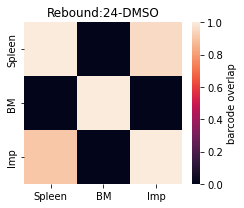

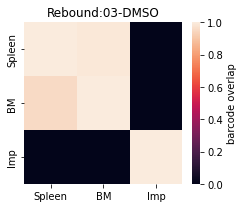

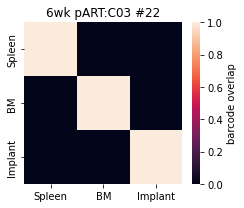

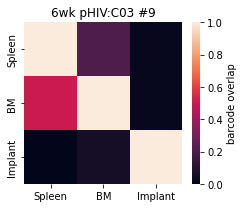

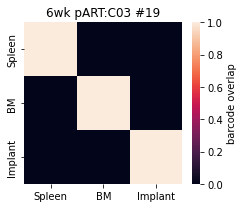

...

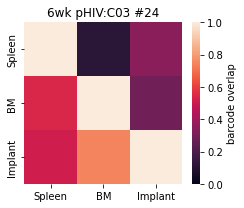

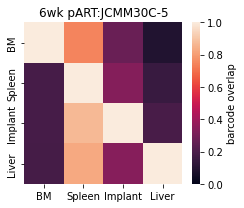

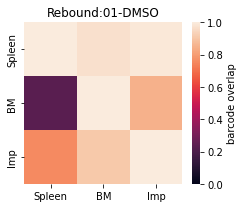

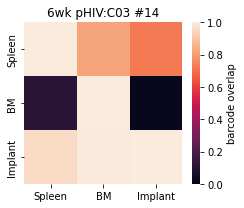

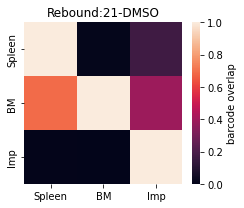

In [73]:
#whether different organ have same IS / barcode
mlist = []; o1list = []; o2list = []; freqlist = []
for mouse in mouselist:
    group = refdata.loc[refdata['Mouse']==mouse,'Timepoint'].iloc[0]
    tlist = list(refdata.loc[refdata['Mouse']==mouse,'sample name'])
    tdata = {}
    bcovmat = np.zeros((len(tlist),len(tlist)))
    labellist = [x.rsplit(' ')[-1] for x in tlist]
    depthdict = {}
    for i,sample1 in enumerate(tlist):
        UDP1 = refdata.loc[refdata['sample name']==sample1,'UDP'].iloc[0]
        if UDP1 in bcdata:
            bclist = list(bcdata[UDP1]['barcode'])
            for j,sample2 in enumerate(tlist):
                UDP2 = refdata.loc[refdata['sample name']==sample2,'UDP'].iloc[0]
                if UDP2 in bcdata:
                    for index,row in bcdata[UDP2].iterrows():
                        if row['barcode'] in bclist:
                            bcovmat[i,j] += row['UMI count']
                    bcovmat[i,j] /= sum(bcdata[UDP2]['UMI count'])
                    mlist.append(mouse);o1list.append(labellist[i]);o2list.append(labellist[j]);
                    freqlist.append(bcovmat[i,j])
    plt.figure(figsize=(3.5,3))
    for i in range(len(tlist)):
        bcovmat[i,i] = 1
    sns.heatmap(bcovmat,xticklabels=labellist , yticklabels=labellist,vmin=0,vmax=1,cbar_kws={'label':'barcode overlap'})
    plt.title(group+':'+mouse)
    plt.tight_layout()
    plt.savefig('heatmap_barcode_'+mouse+'.png',dpi=300)
bcovdata = pd.DataFrame(zip(mlist,o1list,o2list,freqlist),columns=['mouse','organ1','organ2','barcode_frequency_overlap'])

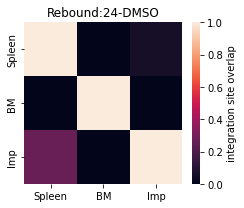

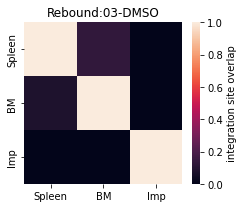

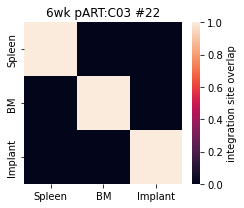

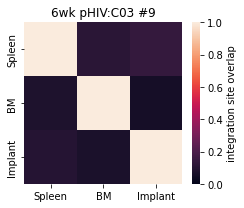

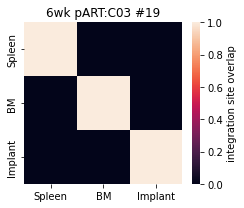

...

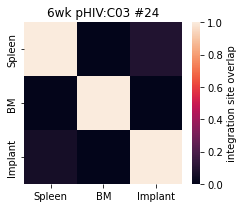

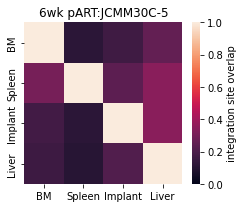

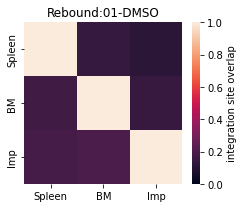

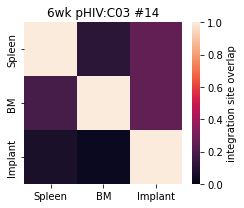

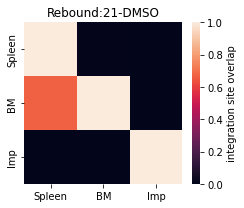

In [74]:
mlist = []; o1list = []; o2list = []; freqlist = []; spearmanlist = []
for mouse in mouselist:
    group = refdata.loc[refdata['Mouse']==mouse,'Timepoint'].iloc[0]
    tlist = list(refdata.loc[refdata['Mouse']==mouse,'sample name'])
    tdata = {}
    bcovmat = np.zeros((len(tlist),len(tlist)))
    labellist = [x.rsplit(' ')[-1] for x in tlist]
    for i,sample1 in enumerate(tlist):
        UDP1 = refdata.loc[refdata['sample name']==sample1,'UDP'].iloc[0]
        if UDP1 in bcdata:
            tdata = bcdata[UDP1]
            sitelist = list(tdata[tdata['annotation'].str.contains('chr')]['annotation'])
            for j,sample2 in enumerate(tlist):
                UDP2 = refdata.loc[refdata['sample name']==sample2,'UDP'].iloc[0]
                if UDP2 in bcdata:
                    tdata = bcdata[UDP2]
                    tdata = tdata[tdata['annotation'].str.contains('chr')]
                    if len(tdata) == 0: continue
                    for index,row in tdata.iterrows():
                        if row['annotation'] in sitelist:
                            bcovmat[i,j] += row['UMI count']
                    bcovmat[i,j] /= sum(tdata['UMI count'])
                    mlist.append(mouse);o1list.append(labellist[i]);o2list.append(labellist[j]);freqlist.append(bcovmat[i,j])
    for i in range(len(tlist)):
        bcovmat[i,i] = 1
    plt.figure(figsize=(3.5,3))
    sns.heatmap(bcovmat,xticklabels=labellist , yticklabels=labellist,vmin=0,vmax=1,cbar_kws={'label':'integration site overlap'})
    plt.title(group+':'+mouse)
    plt.tight_layout()
    plt.savefig('figures/heatmap_IS_'+mouse+'.png',dpi=300)
tdata = pd.DataFrame(zip(mlist,o1list,o2list,freqlist),columns=['mouse','organ1','organ2','IS_frequency_overlap'])

In [75]:
def get_IS_ov(x):
    ttdata = tdata[(tdata['mouse']==x['mouse'])&(tdata['organ1']==x['organ1'])&(tdata['organ2']==x['organ2'])]['IS_frequency_overlap']
    if len(ttdata) == 0: return 0
    return ttdata.iloc[0]
    
bcovdata['IS_frequency_overlap'] = bcovdata.apply(lambda x:get_IS_ov(x),axis=1)
bcovdata

,mouse,organ1,organ2,barcode_frequency_overlap,IS_frequency_overlap
0,24-DMSO,Spleen,Spleen,1.000000,1.000000
1,24-DMSO,Spleen,Imp,0.956458,0.058824
2,24-DMSO,Imp,Spleen,0.906103,0.269231
3,24-DMSO,Imp,Imp,1.000000,1.000000
4,03-DMSO,Spleen,Spleen,1.000000,1.000000
...,...,...,...,...,...
172,21-DMSO,BM,BM,1.000000,1.000000
173,21-DMSO,BM,Imp,0.388889,0.000000
174,21-DMSO,Imp,Spleen,0.006224,0.000000
175,21-DMSO,Imp,BM,0.001131,0.000000


In [76]:
bcovdata.to_csv('barcode_and_IS_frequency_overlap_among_organs.csv')

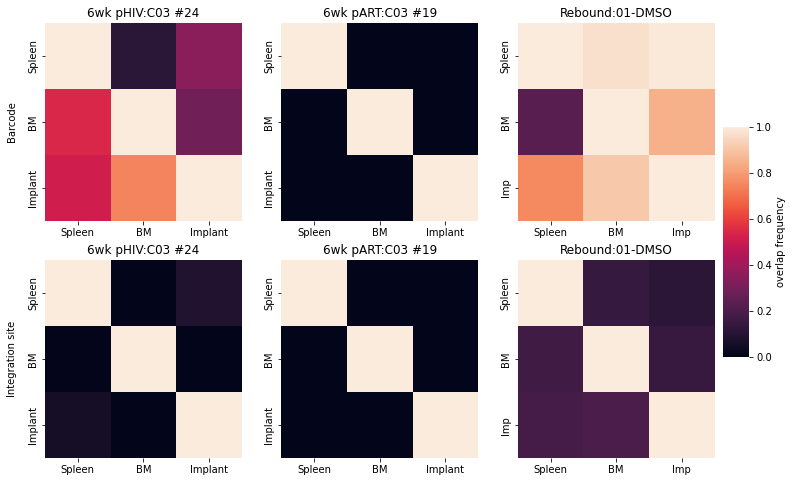

In [77]:
#use C03 #24, C03 #19 and 01-DMSO as example
explist = ['C03 #24','C03 #19','01-DMSO']
fig, axn = plt.subplots(2, 3,figsize=(12,8))
cbar_ax = fig.add_axes([.91, .3, .03, .4]) #left,bottom,width,height
ploti = 0
#barcode
for mouse in explist:
    group = refdata.loc[(refdata['Mouse']==mouse)&(refdata['valid']),'Timepoint'].iloc[0]
    tlist = list(refdata.loc[refdata['Mouse']==mouse,'sample name'])
    tdata = {}
    bcovmat = np.zeros((len(tlist),len(tlist)))
    labellist = [x.rsplit(' ')[-1] for x in tlist]
    depthdict = {}
    for i,sample1 in enumerate(tlist):
        UDP1 = refdata.loc[refdata['sample name']==sample1,'UDP'].iloc[0]
        if UDP1 in bcdata:
            bclist = list(bcdata[UDP1]['barcode'])
            for j,sample2 in enumerate(tlist):
                UDP2 = refdata.loc[refdata['sample name']==sample2,'UDP'].iloc[0]
                if UDP2 in bcdata:
                    for index,row in bcdata[UDP2].iterrows():
                        if row['barcode'] in bclist:
                            bcovmat[i,j] += row['UMI count']
                    bcovmat[i,j] /= sum(bcdata[UDP2]['UMI count'])
    for i in range(len(tlist)):
        bcovmat[i,i] = 1
    sns.heatmap(bcovmat,ax=axn.flat[ploti],cbar=(ploti==0),cbar_ax=None if ploti else cbar_ax,xticklabels=labellist,yticklabels=labellist,vmin=0,vmax=1,cbar_kws={'label':'overlap frequency'})
    axn.flat[ploti].set_title(group+':'+mouse)
    ploti += 1
axn.flat[0].text(-0.5,1.5,'Barcode',rotation=90,ha='center',va='center')
#integration site    
for mouse in explist:
    group = refdata.loc[(refdata['Mouse']==mouse)&(refdata['valid']),'Timepoint'].iloc[0]
    tlist = list(refdata.loc[refdata['Mouse']==mouse,'sample name'])
    tdata = {}
    bcovmat = np.zeros((len(tlist),len(tlist)))
    labellist = [x.rsplit(' ')[-1] for x in tlist]
    for i,sample1 in enumerate(tlist):
        UDP1 = refdata.loc[refdata['sample name']==sample1,'UDP'].iloc[0]
        if UDP1 in bcdata:
            tdata = bcdata[UDP1]
            sitelist = list(tdata[tdata['annotation'].str.contains('chr')]['annotation'])
            for j,sample2 in enumerate(tlist):
                UDP2 = refdata.loc[refdata['sample name']==sample2,'UDP'].iloc[0]
                if UDP2 in bcdata:
                    tdata = bcdata[UDP2]
                    tdata = tdata[tdata['annotation'].str.contains('chr')]
                    if len(tdata) == 0: continue
                    for index,row in tdata.iterrows():
                        if row['annotation'] in sitelist:
                            bcovmat[i,j] += row['UMI count']
                    bcovmat[i,j] /= sum(tdata['UMI count'])
    for i in range(len(tlist)):
        bcovmat[i,i] = 1
    sns.heatmap(bcovmat,ax=axn.flat[ploti],cbar=(ploti==0),cbar_ax=None if ploti else cbar_ax,xticklabels=labellist,yticklabels=labellist,vmin=0,vmax=1,cbar_kws={'label':'overlap frequency'})
    axn.flat[ploti].set_title(group+':'+mouse)
    ploti += 1
axn.flat[3].text(-0.5,1.5,'Integration site',rotation=90,ha='center',va='center')
plt.savefig('figures/DNA_overlap_example_heatmap.png',dpi=300)

In [78]:
mouse = '01-DMSO'
UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']=='BM')]['UDP'].iloc[0]
Counter(bcdata[UDP]['barcode']).most_common(5)

[('CTTATAGCTGAAGTTGCGGCCGAAGTGCCTACAA', 673),
 ('CTTATAGTTGAAGGGGCAGAAGCAGATCCTACAA', 5),
 ('CTTATAGCTGAAGTTGTGGCCGAAGTGCCTACAA', 4),
 ('CTTATAGCTGAAGTAGCTGTGGCAGCTCCTACAA', 3),
 ('CTTATAGCCGGTGGAGATGCAGCGGAATTATAG', 2)]

In [79]:
mouse = '01-DMSO'
UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']=='Spleen')]['UDP'].iloc[0]
Counter(bcdata[UDP]['barcode']).most_common(5)

[('CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA', 116),
 ('CTTATAGTGGACGACGTAGAGGGAGGCCCTACAA', 79),
 ('CTTATAGCTGAAGTTGCGGCCGAAGTGCCTACAA', 32),
 ('CTTATAGGCGTAGGAGGAGGTGAGGCCCCTACAA', 27),
 ('CTTATAGAAGAGGAAGACGCAGGTGAACCTACAA', 5)]

similarity score is defined as the average overlapping frequency among organs.

In [80]:
similist = []
timelist = []
for mouse in mouselist:
    group = refdata.loc[refdata['Mouse']==mouse,'Timepoint'].iloc[0]
    timelist.append(group)
    tlist = list(refdata.loc[refdata['Mouse']==mouse,'sample name'])
    tdata = {}
    bcovmat = np.zeros((len(tlist),len(tlist)))
    for i,sample1 in enumerate(tlist):
        UDP1 = refdata.loc[refdata['sample name']==sample1,'UDP'].iloc[0]
        if UDP1 in bcdata:
            tdata = bcdata[UDP1]
            sitelist = list(tdata[tdata['annotation'].str.contains('chr')]['annotation'])
            for j,sample2 in enumerate(tlist):
                UDP2 = refdata.loc[refdata['sample name']==sample2,'UDP'].iloc[0]
                if UDP2 in bcdata:
                    tdata = bcdata[UDP2]
                    tdata = tdata[tdata['annotation'].str.contains('chr')]
                    if len(tdata) == 0: continue
                    for index,row in tdata.iterrows():
                        if row['annotation'] in sitelist:
                            bcovmat[i,j] += row['UMI count']
                    bcovmat[i,j] /= sum(tdata['UMI count'])
    simi = []
    for i in range(len(tlist)):
        for j in range(len(tlist)):
            if i != j:
                simi.append(bcovmat[i,j])
    similist.append(ss.gmean([x+1e-3 for x in simi]))
mousedata = pd.DataFrame(zip(mouselist,timelist,similist),columns=['mouse','Timepoint','T cell similarity score'])

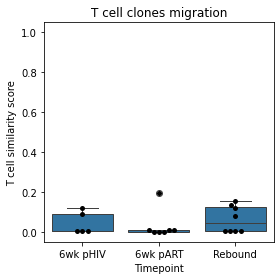

In [81]:
plt.figure(figsize=(4,4))
sns.boxplot(y=mousedata['T cell similarity score'],x=mousedata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
sns.swarmplot(y=mousedata['T cell similarity score'],x=mousedata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
plt.title('T cell clones migration')
plt.ylim(-0.05,1.05)
plt.tight_layout()
plt.savefig('figures/proviral_IS_similarity.png',dpi=300)

In [82]:
similist = []
timelist = []
for mouse in mouselist:
    group = refdata.loc[refdata['Mouse']==mouse,'Timepoint'].iloc[0]
    tlist = list(refdata.loc[refdata['Mouse']==mouse,'sample name'])
    tdata = {}
    bcovmat = np.zeros((len(tlist),len(tlist)))
    labellist = [x.rsplit(' ')[-1] for x in tlist]
    for i,sample1 in enumerate(tlist):
        UDP1 = refdata.loc[refdata['sample name']==sample1,'UDP'].iloc[0]
        if UDP1 in bcdata:
            bclist = list(bcdata[UDP1]['barcode'])
            for j,sample2 in enumerate(tlist):
                UDP2 = refdata.loc[refdata['sample name']==sample2,'UDP'].iloc[0]
                if UDP2 in bcdata:
                    for index,row in bcdata[UDP2].iterrows():
                        if row['barcode'] in bclist:
                            bcovmat[i,j] += row['UMI count']
                    bcovmat[i,j] /= sum(bcdata[UDP2]['UMI count'])
    simi = []
    for i in range(len(tlist)):
        for j in range(len(tlist)):
            if i != j:
                simi.append(bcovmat[i,j])
    similist.append(ss.gmean([x+1e-3 for x in simi]))
mousedata['barcode similarity score'] = similist

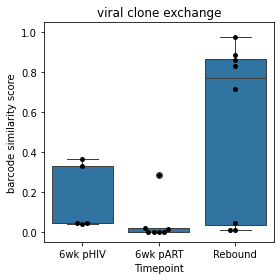

In [83]:
plt.figure(figsize=(4,4))
sns.boxplot(y=mousedata['barcode similarity score'],x=mousedata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
sns.swarmplot(y=mousedata['barcode similarity score'],x=mousedata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
plt.title('viral clone exchange')
plt.ylim(-0.05,1.05)
plt.tight_layout()
plt.savefig('figures/proviral_barcode_similarity.png',dpi=300)

In [84]:
ss.ranksums(mousedata[mousedata['Timepoint']=='Rebound']['T cell similarity score'],mousedata[mousedata['Timepoint']=='6wk pART']['T cell similarity score'])

RanksumsResult(statistic=0.9258200997725514, pvalue=0.3545394797735013)

In [85]:
ss.ranksums(mousedata[mousedata['Timepoint']=='6wk pHIV']['T cell similarity score'],mousedata[mousedata['Timepoint']=='6wk pART']['T cell similarity score'])

RanksumsResult(statistic=0.5683985600588051, pvalue=0.5697643679606206)

In [86]:
ss.ranksums(mousedata[mousedata['Timepoint']=='6wk pHIV']['T cell similarity score'],mousedata[mousedata['Timepoint']=='Rebound']['T cell similarity score'])

RanksumsResult(statistic=-0.14638501094227999, pvalue=0.8836174593813683)

In [87]:
ss.ranksums(mousedata[mousedata['Timepoint']=='6wk pART']['T cell similarity score'],mousedata[mousedata['Timepoint']!='6wk pART']['T cell similarity score'])

RanksumsResult(statistic=-0.9112931795128764, pvalue=0.36214091915024105)

In [88]:
ss.ranksums(mousedata[mousedata['Timepoint']=='Rebound']['barcode similarity score'],mousedata[mousedata['Timepoint']=='6wk pART']['barcode similarity score'])

RanksumsResult(statistic=2.430277761902947, pvalue=0.015087255494406496)

In [89]:
ss.ranksums(mousedata[mousedata['Timepoint']=='6wk pHIV']['barcode similarity score'],mousedata[mousedata['Timepoint']=='6wk pART']['barcode similarity score'])

RanksumsResult(statistic=2.3547940345293354, pvalue=0.01853297487702655)

In [90]:
ss.ranksums(mousedata[mousedata['Timepoint']!='6wk pART']['barcode similarity score'],mousedata[mousedata['Timepoint']=='6wk pART']['barcode similarity score'])

RanksumsResult(statistic=2.813122423713662, pvalue=0.0049062967952974365)

In [91]:
ss.ranksums(mousedata[mousedata['Timepoint']=='6wk pHIV']['barcode similarity score'],mousedata[mousedata['Timepoint']=='Rebound']['barcode similarity score'])

RanksumsResult(statistic=-0.8783100656536799, pvalue=0.379775474840949)

UMI per BC/IS and IS per BC by mouse - done

Match during the active replication stages the RNA and DNA - done

Is the defective integration rate, similar to the data. -done

DNA with a lot of auointegration is under active replication and should have more RNA - no?

Autointegrated DNA and integrated DNA and RNA barcode in an actively replicating infectious should share the same barcode.

Is the T cell that has provirus and is proliferating the most have RNA barcode in circulation? We suspect not. That mean T cells with little to no proliferation should represent most of the RNA barcode.

Look at IS (particularly in high proliferating T cell clones) and see if that is consistent with literature. Compare with published data sets. Histone acetylation and CHIP-seq

In [92]:
#per mice analysis

In [93]:
def count_bc(mouse):
    tref = refdata[refdata['Mouse']==mouse]
    bclist = []
    for UDP in tref['UDP']:
        if UDP not in bcdata: continue
        bclist.extend(list(bcdata[UDP]['barcode']))
    return len(set(bclist))

mousedata['barcode count'] = mousedata['mouse'].apply(lambda x:count_bc(x))
mousedata

,mouse,Timepoint,T cell similarity score,barcode similarity score,barcode count
0,24-DMSO,Rebound,0.005028,0.009768,264
1,03-DMSO,Rebound,0.004692,0.009910,140
2,C03 #22,6wk pART,0.001000,0.001000,20
3,C03 #9,6wk pHIV,0.090175,0.038783,35
4,C03 #19,6wk pART,0.001000,0.001000,22
5,C03 #3,6wk pHIV,0.005308,0.044955,55
6,C03 #21,6wk pART,0.007944,0.001000,10
7,12-DMSO,Rebound,0.081188,0.976696,355
8,C03 #2,6wk pART,0.007569,0.014893,10
9,06-DMSO,Rebound,0.120087,0.888975,154


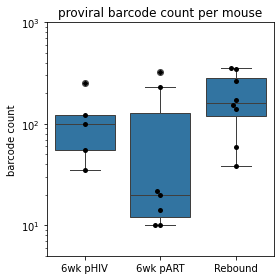

In [94]:
plt.figure(figsize=(4,4))
sns.boxplot(y=mousedata['barcode count'],x=mousedata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
sns.swarmplot(y=mousedata['barcode count'],x=mousedata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
plt.ylim(5,1e3)
plt.yscale('log')
plt.xlabel('')
plt.title('proviral barcode count per mouse')
plt.tight_layout()
plt.savefig('figures/DNA_barcode_count_per_mouse.png')

In [95]:
#IS per barcode(all kinds)/UMI per barcode(all kinds)/UMI per IS(integrated)
#data points represents: mouse, sample, barcode(IS)
#group by timepoint, by mouse, by sample

bclist = []; UMIcountlist = []; IScountlist = []; freqInte = []; freqUnin = []
tmouselist = []; tsamplelist = []; ttimelist = []; tUDPlist = []
for UDP in refdata[refdata['valid']]['UDP']:
    bcdict = {}
    for index,row in bcdata[UDP].iterrows():
        bc = row['barcode']
        if 'chr' not in row['annotation']: continue
        if bc not in bcdict: bcdict[bc] = {'UMI':0,'IS':0,'Inte':0}
        bcdict[bc]['IS'] += 1
        bcdict[bc]['UMI'] += row['UMI count']
        if 'chr' in row['annotation']:
            bcdict[bc]['Inte'] += row['UMI count']
    for bc in bcdict:
        bclist.append(bc)
        UMIcountlist.append(bcdict[bc]['UMI'])
        IScountlist.append(bcdict[bc]['IS'])
        freqInte.append(bcdict[bc]['Inte']/bcdict[bc]['UMI'])
        freqUnin.append(1-bcdict[bc]['Inte']/bcdict[bc]['UMI'])
        tmouselist.append(refdata[refdata['UDP']==UDP]['Mouse'].iloc[0])
        tsamplelist.append(refdata[refdata['UDP']==UDP]['sample name'].iloc[0])
        ttimelist.append(refdata[refdata['UDP']==UDP]['Timepoint'].iloc[0])
        tUDPlist.append(UDP)
combinebc = pd.DataFrame(zip(bclist,UMIcountlist,IScountlist,freqInte,freqUnin,tmouselist,tsamplelist,ttimelist,tUDPlist),columns=['barcode','UMI count','IS count','integrated frequency','unintegrated frequency','Mouse','sample name','Timepoint','UDP'])
combinebc

,barcode,UMI count,IS count,integrated frequency,unintegrated frequency,Mouse,sample name,Timepoint,UDP
0,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,103,93,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
1,CTTATAGTGGACGACGTAGAGGGAGGCCCTACAA,63,61,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
2,CTTATAGGCGTAGGAGGAGGTGAGGCCCCTACAA,19,19,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
3,CTTATAGCTGAAGTTGCGGCCGAAGTGCCTACAA,23,23,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
4,CTTATAGACGAAGCTGAGGAAGCGGGCTTATAG,1,1,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
...,...,...,...,...,...,...,...,...,...
499,CTTATAGTGGGGGTAGACGGAGAGGTGGTTGATGTTTTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31
500,CTTATAGCCGGTGGAGATGCAGCGGAATTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31
501,CTTATAGAAGAGGTAGTCGCAGAGGAATTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31
502,CTTATAGACGCAGGGGCAGTCGGCGCTTTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31


In [96]:
samplelist = sorted(samplelist,key=lambda x:x.rsplit(' ')[-2],reverse=True)

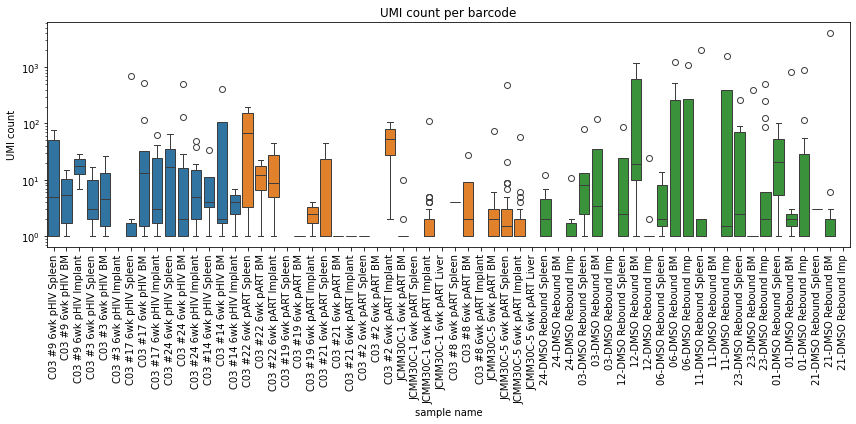

In [97]:
plt.figure(figsize=(12,6))
colordict = {}
for sample in samplelist:
    if 'pART' in sample:
        colordict[sample] = plt.cm.tab10(1)
    elif 'pHIV' in sample:
        colordict[sample] = plt.cm.tab10(0)
    elif 'Rebound' in sample:
        colordict[sample] = plt.cm.tab10(2)
sns.boxplot(y=combinebc['UMI count'],x=combinebc['sample name'],order=samplelist,palette=colordict)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['sample name'],color='black',order=samplelist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('UMI count per barcode')
plt.tight_layout()

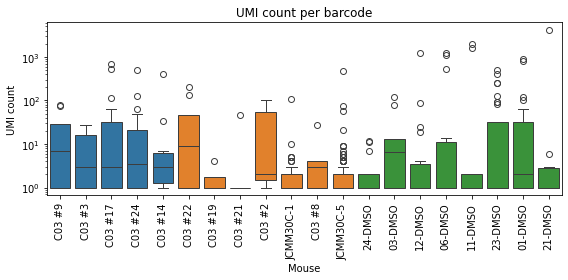

In [98]:
mouselist = {'6wk pHIV':[],'6wk pART':[],'Rebound':[]}
for mouse in set(refdata['Mouse']):
    time = refdata[refdata['Mouse']==mouse]['Timepoint'].iloc[0]
    mouselist[time].append(mouse)
colordict = {}
for i,time in enumerate(mouselist):
    for mouse in mouselist[time]:
        colordict[mouse] = plt.cm.tab10(i)
mouselist = mouselist['6wk pHIV']+mouselist['6wk pART']+mouselist['Rebound']
plt.figure(figsize=(8,4))
sns.boxplot(y=combinebc['UMI count'],x=combinebc['Mouse'],order=mouselist,palette=colordict)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('UMI count per barcode')
plt.tight_layout()

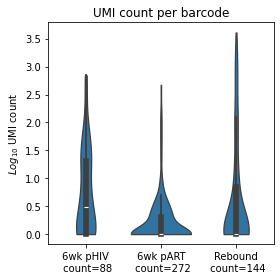

In [99]:
plt.figure(figsize=(4,4))
sns.violinplot(y=np.log10(combinebc['UMI count']),x=combinebc['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'],cut=0)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
#plt.yscale('log')
cdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    cdict[time] = len(combinebc[combinebc['Timepoint']==time])
locs,labels = plt.xticks()
labels = [x.get_text()+'\n count='+str(cdict[x.get_text()]) for x in labels]
plt.xticks(locs,labels)
plt.ylabel('$Log_{10}$ UMI count')
plt.xlabel('')
plt.title('UMI count per barcode')
plt.tight_layout()
plt.savefig('figures/UMI_per_bc.svg')

In [100]:
ss.ranksums(combinebc.loc[combinebc['Timepoint']=='6wk pHIV','UMI count'],combinebc.loc[combinebc['Timepoint']=='6wk pART','UMI count'])

RanksumsResult(statistic=5.650668702941885, pvalue=1.5982486246697767e-08)

In [101]:
ss.ranksums(combinebc.loc[combinebc['Timepoint']=='Rebound','UMI count'],combinebc.loc[combinebc['Timepoint']=='6wk pART','UMI count'])

RanksumsResult(statistic=2.5945934562338686, pvalue=0.009470286317434943)

In [102]:
combinebc.to_csv('per_barcode_summary_0126.csv')

In [103]:
combinebc

,barcode,UMI count,IS count,integrated frequency,unintegrated frequency,Mouse,sample name,Timepoint,UDP
0,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,103,93,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
1,CTTATAGTGGACGACGTAGAGGGAGGCCCTACAA,63,61,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
2,CTTATAGGCGTAGGAGGAGGTGAGGCCCCTACAA,19,19,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
3,CTTATAGCTGAAGTTGCGGCCGAAGTGCCTACAA,23,23,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
4,CTTATAGACGAAGCTGAGGAAGCGGGCTTATAG,1,1,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
...,...,...,...,...,...,...,...,...,...
499,CTTATAGTGGGGGTAGACGGAGAGGTGGTTGATGTTTTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31
500,CTTATAGCCGGTGGAGATGCAGCGGAATTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31
501,CTTATAGAAGAGGTAGTCGCAGAGGAATTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31
502,CTTATAGACGCAGGGGCAGTCGGCGCTTTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31


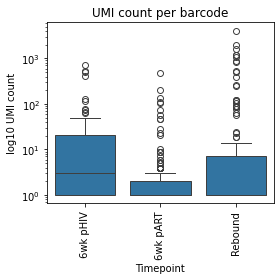

In [104]:
plt.figure(figsize=(4,4))
sns.boxplot(y=combinebc['UMI count'],x=combinebc['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylabel('log10 UMI count')
plt.title('UMI count per barcode')
plt.tight_layout()

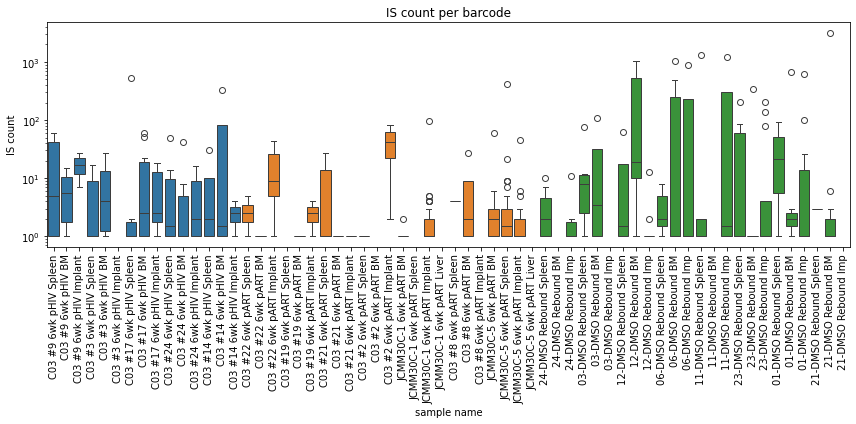

In [105]:
plt.figure(figsize=(12,6))
colordict = {}
for sample in samplelist:
    if 'pART' in sample:
        colordict[sample] = plt.cm.tab10(1)
    elif 'pHIV' in sample:
        colordict[sample] = plt.cm.tab10(0)
    elif 'Rebound' in sample:
        colordict[sample] = plt.cm.tab10(2)
sns.boxplot(y=combinebc['IS count'],x=combinebc['sample name'],order=samplelist,palette=colordict)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['sample name'],color='black',order=samplelist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('IS count per barcode')
plt.tight_layout()

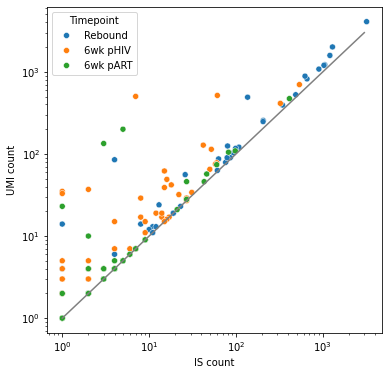

In [106]:
plt.figure(figsize=(6,6))
sns.scatterplot(y=combinebc['UMI count'],x=combinebc['IS count'],hue=combinebc['Timepoint'])
plt.yscale('log')
plt.xscale('log')
plt.plot([1,3e3],[1,3e3],color='grey')

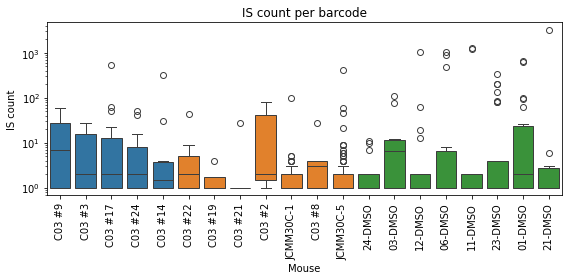

In [107]:
mouselist = {'6wk pHIV':[],'6wk pART':[],'Rebound':[]}
for mouse in set(refdata['Mouse']):
    time = refdata[refdata['Mouse']==mouse]['Timepoint'].iloc[0]
    mouselist[time].append(mouse)
colordict = {}
for i,time in enumerate(mouselist):
    for mouse in mouselist[time]:
        colordict[mouse] = plt.cm.tab10(i)
mouselist = mouselist['6wk pHIV']+mouselist['6wk pART']+mouselist['Rebound']
plt.figure(figsize=(8,4))
sns.boxplot(y=combinebc['IS count'],x=combinebc['Mouse'],order=mouselist,palette=colordict)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('IS count per barcode')
plt.tight_layout()

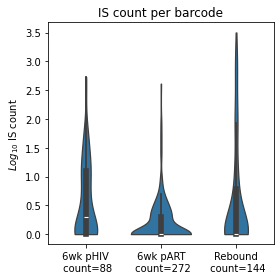

In [108]:
plt.figure(figsize=(4,4))
sns.violinplot(y=np.log10(combinebc['IS count']),x=combinebc['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'],cut=0)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
#plt.yscale('log')
cdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    cdict[time] = len(combinebc[combinebc['Timepoint']==time])
locs,labels = plt.xticks()
labels = [x.get_text()+'\n count='+str(cdict[x.get_text()]) for x in labels]
plt.xticks(locs,labels)
plt.ylabel('$Log_{10}$ IS count')
plt.xlabel('')
plt.title('IS count per barcode')
plt.tight_layout()
plt.savefig('figures/IS_per_bc.png')

In [109]:
rho,p = ss.ranksums(combinebc.loc[combinebc['Timepoint']=='6wk pHIV','IS count'],combinebc.loc[combinebc['Timepoint']=='6wk pART','IS count'])
print('pHIV vs pART: p='+str(p))
rho,p = ss.ranksums(combinebc.loc[combinebc['Timepoint']=='Rebound','IS count'],combinebc.loc[combinebc['Timepoint']=='6wk pART','IS count'])
print('Rebound vs pART: p='+str(p))
rho,p = ss.ranksums(combinebc.loc[combinebc['Timepoint']=='Rebound','IS count'],combinebc.loc[combinebc['Timepoint']=='6wk pHIV','IS count'])
print('Rebound vs pHIV: p='+str(p))

pHIV vs pART: p=5.0887762846833766e-05
Rebound vs pART: p=0.019549848998077143
Rebound vs pHIV: p=0.1948767411607154


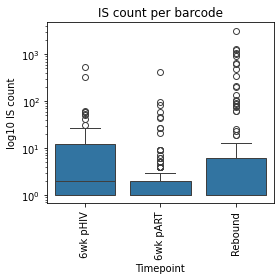

In [110]:
plt.figure(figsize=(4,4))
sns.boxplot(y=combinebc['IS count'],x=combinebc['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylabel('log10 IS count')
plt.title('IS count per barcode')
plt.tight_layout()

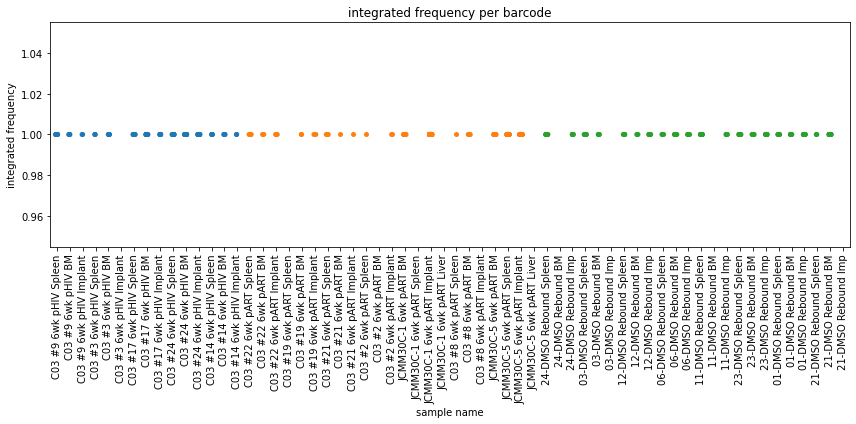

In [111]:
plt.figure(figsize=(12,6))
colordict = {}
for sample in samplelist:
    if 'pART' in sample:
        colordict[sample] = plt.cm.tab10(1)
    elif 'pHIV' in sample:
        colordict[sample] = plt.cm.tab10(0)
    elif 'Rebound' in sample:
        colordict[sample] = plt.cm.tab10(2)
sns.stripplot(y=combinebc['integrated frequency'],x=combinebc['sample name'],order=samplelist,palette=colordict)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['sample name'],color='black',order=samplelist)
#plt.yscale('log')
plt.xticks(rotation=90)
plt.title('integrated frequency per barcode')
plt.tight_layout()

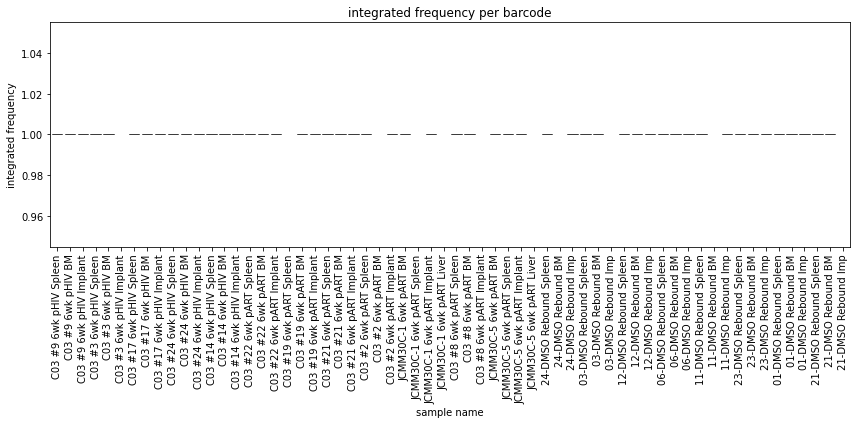

In [112]:
plt.figure(figsize=(12,6))
colordict = {}
for sample in samplelist:
    if 'pART' in sample:
        colordict[sample] = plt.cm.tab10(1)
    elif 'pHIV' in sample:
        colordict[sample] = plt.cm.tab10(0)
    elif 'Rebound' in sample:
        colordict[sample] = plt.cm.tab10(2)
sns.boxplot(y=combinebc['integrated frequency'],x=combinebc['sample name'],order=samplelist,palette=colordict)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['sample name'],color='black',order=samplelist)
#plt.yscale('log')
plt.xticks(rotation=90)
plt.title('integrated frequency per barcode')
plt.tight_layout()

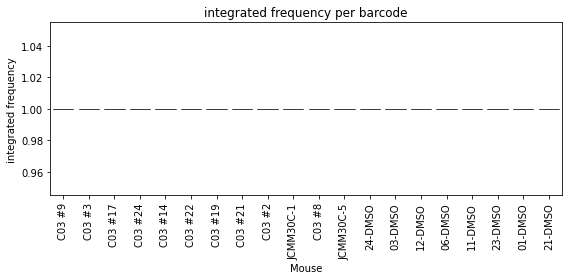

In [113]:
mouselist = {'6wk pHIV':[],'6wk pART':[],'Rebound':[]}
for mouse in set(refdata['Mouse']):
    time = refdata[refdata['Mouse']==mouse]['Timepoint'].iloc[0]
    mouselist[time].append(mouse)
colordict = {}
for i,time in enumerate(mouselist):
    for mouse in mouselist[time]:
        colordict[mouse] = plt.cm.tab10(i)
mouselist = mouselist['6wk pHIV']+mouselist['6wk pART']+mouselist['Rebound']
plt.figure(figsize=(8,4))
sns.boxplot(y=combinebc['integrated frequency'],x=combinebc['Mouse'],order=mouselist,palette=colordict)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
#plt.yscale('log')
plt.xticks(rotation=90)
plt.title('integrated frequency per barcode')
plt.tight_layout()

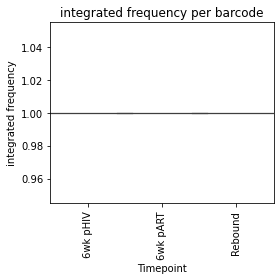

In [114]:
plt.figure(figsize=(4,4))
sns.violinplot(y=combinebc['integrated frequency'],x=combinebc['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'],cut=0,width=1.2)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
#plt.yscale('log')
plt.xticks(rotation=90)
#plt.ylabel('integrated frequency')
plt.title('integrated frequency per barcode')
plt.tight_layout()

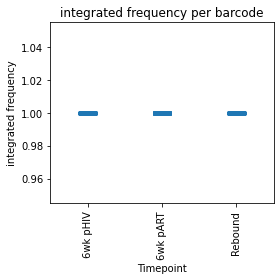

In [115]:
plt.figure(figsize=(4,4))
sns.stripplot(y=combinebc['integrated frequency'],x=combinebc['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
#plt.yscale('log')
plt.xticks(rotation=90)
#plt.ylabel('integrated frequency')
plt.title('integrated frequency per barcode')
plt.tight_layout()

In [116]:
ISlist = []; UMIcountlist = []; 
tmouselist = []; tsamplelist = []; ttimelist = []; tUDPlist = []; tbclist = []; torganlist = []
for UDP in refdata[refdata['valid']]['UDP']:
    for index,row in bcdata[UDP].iterrows():
        IS = row['annotation']
        bc = row['barcode']
        if 'chr' not in IS: continue
        ISlist.append(IS)
        UMIcountlist.append(row['UMI count'])
        tmouselist.append(refdata[refdata['UDP']==UDP]['Mouse'].iloc[0])
        tsamplelist.append(refdata[refdata['UDP']==UDP]['sample name'].iloc[0])
        ttimelist.append(refdata[refdata['UDP']==UDP]['Timepoint'].iloc[0])
        tUDPlist.append(UDP)
        tbclist.append(bc)
        torganlist.append(refdata[refdata['UDP']==UDP]['Organ'].iloc[0])
combineIS = pd.DataFrame(zip(ISlist,UMIcountlist,tmouselist,tsamplelist,ttimelist,tUDPlist,tbclist,torganlist),columns=['Integration site','UMI count','Mouse','sample name','Timepoint','UDP','barcode','Organ'])
combineIS

,Integration site,UMI count,Mouse,sample name,Timepoint,UDP,barcode,Organ
0,chr2:85708835:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen
1,chr5:168423417:-,4,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen
2,chr11:34258609:+,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen
3,chr1:48676335:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen
4,chr4:2695114:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen
...,...,...,...,...,...,...,...,...
15300,chr1:228648975:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGTGGGGGTAGACGGAGAGGTGGTTGATGTTTTATAG,Implant
15301,chr14:90787111:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGCCGGTGGAGATGCAGCGGAATTATAG,Implant
15302,chr5:176462542:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGAAGAGGTAGTCGCAGAGGAATTATAG,Implant
15303,chr11:76699025:-,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGACGCAGGGGCAGTCGGCGCTTTATAG,Implant


In [117]:
def find_mapping_length(x):
    tdata = bcdata[x['UDP']]
    mlength = tdata[(tdata['barcode']==x['barcode'])&(tdata['annotation']==x['Integration site'])]['mapping length']
    if len(mlength) == 0: print(x)
    return mlength.iloc[0]

combineIS['mapping length'] = combineIS.apply(lambda x:find_mapping_length(x),axis=1)

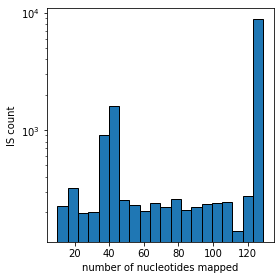

In [118]:
plt.figure(figsize=(4,4))
plt.hist(combineIS['mapping length'],bins=20,edgecolor='black')
plt.yscale('log')
plt.xlabel('number of nucleotides mapped')
plt.ylabel('IS count')
plt.tight_layout()

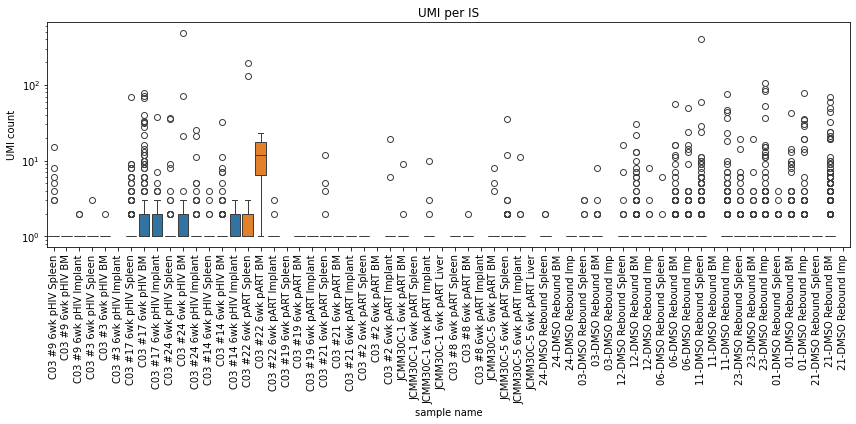

In [119]:
plt.figure(figsize=(12,6))
colordict = {}
for sample in samplelist:
    if 'pART' in sample:
        colordict[sample] = plt.cm.tab10(1)
    elif 'pHIV' in sample:
        colordict[sample] = plt.cm.tab10(0)
    elif 'Rebound' in sample:
        colordict[sample] = plt.cm.tab10(2)
sns.boxplot(y=combineIS['UMI count'],x=combineIS['sample name'],order=samplelist,palette=colordict)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['sample name'],color='black',order=samplelist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('UMI per IS')
plt.tight_layout()

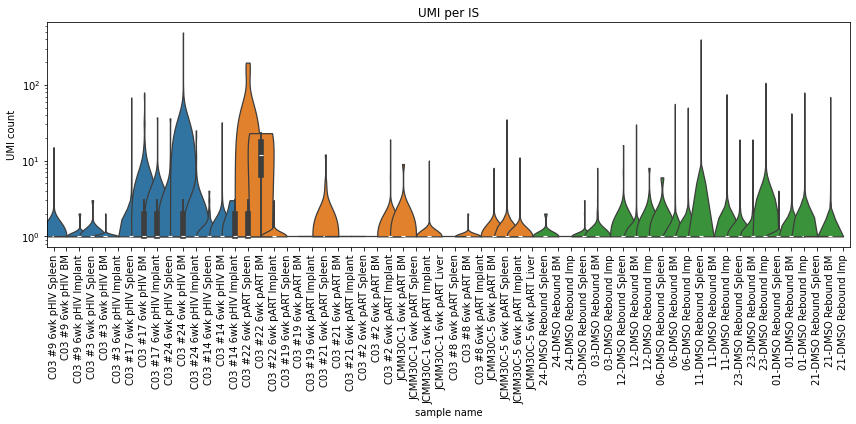

In [120]:
plt.figure(figsize=(12,6))
colordict = {}
for sample in samplelist:
    if 'pART' in sample:
        colordict[sample] = plt.cm.tab10(1)
    elif 'pHIV' in sample:
        colordict[sample] = plt.cm.tab10(0)
    elif 'Rebound' in sample:
        colordict[sample] = plt.cm.tab10(2)
sns.violinplot(y=combineIS['UMI count'],x=combineIS['sample name'],order=samplelist,palette=colordict,cut=0,width=2)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['sample name'],color='black',order=samplelist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('UMI per IS')
plt.tight_layout()

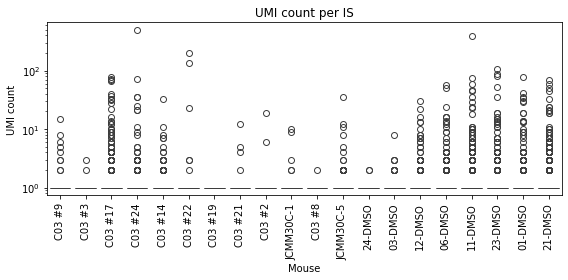

In [121]:
mouselist = {'6wk pHIV':[],'6wk pART':[],'Rebound':[]}
for mouse in set(refdata['Mouse']):
    time = refdata[refdata['Mouse']==mouse]['Timepoint'].iloc[0]
    mouselist[time].append(mouse)
colordict = {}
for i,time in enumerate(mouselist):
    for mouse in mouselist[time]:
        colordict[mouse] = plt.cm.tab10(i)
mouselist = mouselist['6wk pHIV']+mouselist['6wk pART']+mouselist['Rebound']
plt.figure(figsize=(8,4))
sns.boxplot(y=combineIS['UMI count'],x=combineIS['Mouse'],order=mouselist,palette=colordict)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('UMI count per IS')
plt.tight_layout()

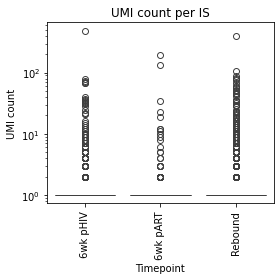

In [122]:
plt.figure(figsize=(4,4))
sns.boxplot(y=combineIS['UMI count'],x=combineIS['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
plt.yscale('log')
plt.xticks(rotation=90)
#plt.ylabel('integrated frequency')
plt.title('UMI count per IS')
plt.tight_layout()

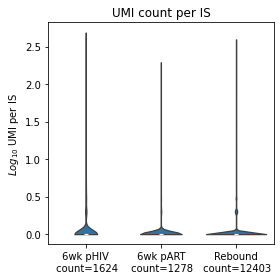

In [123]:
plt.figure(figsize=(4,4))
sns.violinplot(y=np.log10(combineIS['UMI count']),x=combineIS['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'],cut=0)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
#plt.yscale('log')
cdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    cdict[time] = len(combineIS[combineIS['Timepoint']==time])
locs,labels = plt.xticks()
labels = [x.get_text()+'\n count='+str(cdict[x.get_text()]) for x in labels]
plt.xticks(locs,labels)
plt.xlabel('')
plt.ylabel('$Log_{10}$ UMI per IS')
plt.title('UMI count per IS')
plt.tight_layout()
plt.savefig('figures/UMI_per_IS.png')

In [124]:
rho,p = ss.ranksums(combineIS.loc[combineIS['Timepoint']=='6wk pHIV','UMI count'],combineIS.loc[combineIS['Timepoint']=='6wk pART','UMI count'])
print('pHIV vs pART: p='+str(p))
rho,p = ss.ranksums(combineIS.loc[combineIS['Timepoint']=='Rebound','UMI count'],combineIS.loc[combineIS['Timepoint']=='6wk pART','UMI count'])
print('Rebound vs pART: p='+str(p))
rho,p = ss.ranksums(combineIS.loc[combineIS['Timepoint']=='Rebound','UMI count'],combineIS.loc[combineIS['Timepoint']=='6wk pHIV','UMI count'])
print('Rebound vs pHIV: p='+str(p))

pHIV vs pART: p=2.6686507070191088e-05
Rebound vs pART: p=0.031081499836482163
Rebound vs pHIV: p=0.0002797996250946376


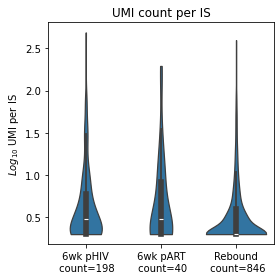

In [125]:
plt.figure(figsize=(4,4))
tdata = combineIS[combineIS['UMI count']>1]
sns.violinplot(y=np.log10(tdata['UMI count']),x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'],cut=0)
#sns.swarmplot(y=combinebc['UMI count'],x=combinebc['Mouse'],color='black',order=samplelist)
#plt.yscale('log')
cdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    cdict[time] = len(tdata[tdata['Timepoint']==time])
locs,labels = plt.xticks()
labels = [x.get_text()+'\n count='+str(cdict[x.get_text()]) for x in labels]
plt.xticks(locs,labels)
plt.xlabel('')
plt.ylabel('$Log_{10}$ UMI per IS')
plt.title('UMI count per IS')
plt.tight_layout()
plt.savefig('figures/UMI_per_IS_morethan1.png')

In [126]:
tdata = combineIS[combineIS['UMI count']>1]
rho,p = ss.ranksums(tdata.loc[tdata['Timepoint']=='6wk pHIV','UMI count'],tdata.loc[tdata['Timepoint']=='6wk pART','UMI count'])
print('pHIV vs pART: p='+str(p))
rho,p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound','UMI count'],tdata.loc[tdata['Timepoint']=='6wk pART','UMI count'])
print('Rebound vs pART: p='+str(p))
rho,p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound','UMI count'],tdata.loc[tdata['Timepoint']=='6wk pHIV','UMI count'])
print('Rebound vs pHIV: p='+str(p))

pHIV vs pART: p=0.8600981801081258
Rebound vs pART: p=0.08920900582284105
Rebound vs pHIV: p=1.4118461113981751e-05


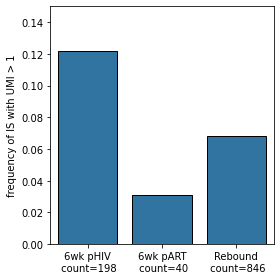

In [127]:
expandfreq = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    tdata = combineIS[combineIS['Timepoint']==time]
    expandfreq[time] = len(tdata[tdata['UMI count']>1])/len(tdata)
plt.figure(figsize=(4,4))
sns.barplot(x=list(expandfreq.keys()),y=list(expandfreq.values()),edgecolor='black')
plt.ylabel('frequency of IS with UMI > 1')
locs,labels = plt.xticks()
labels = [x.get_text()+'\n count='+str(cdict[x.get_text()]) for x in labels]
plt.xticks(locs,labels)
plt.ylim(0,0.15)
plt.tight_layout()
plt.savefig('figures/UMI_per_IS_morethan1_freq.svg')

In [128]:
def compare_expandfreq(t1,t2):
    len1 = len(combineIS[(combineIS['Timepoint']==t1)&(combineIS['UMI count']>1)])
    len2 = len(combineIS[(combineIS['Timepoint']==t1)&(combineIS['UMI count']==1)])
    len3 = len(combineIS[(combineIS['Timepoint']==t2)&(combineIS['UMI count']>1)])
    len4 = len(combineIS[(combineIS['Timepoint']==t2)&(combineIS['UMI count']==1)])
    odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
    print(t1+' v.s '+t2+': Odds='+str(odds)+',p='+str(p))

compare_expandfreq('6wk pHIV','6wk pART')
compare_expandfreq('6wk pART','Rebound')
compare_expandfreq('6wk pHIV','Rebound')

6wk pHIV v.s 6wk pART: Odds=4.297405329593268,p=2.6073647896289485e-20
6wk pART v.s Rebound: Odds=0.4413814701512773,p=3.282265883594819e-08
6wk pHIV v.s Rebound: Odds=1.8967950822118111,p=4.168188462290494e-13


#### sample level and mouse level analysis

In [129]:
def UMI_per_bc(x):
    tdata = combinebc[combinebc['UDP']==x]
    return np.mean(tdata['UMI count'])

def IS_per_bc(x):
    tdata = combinebc[combinebc['UDP']==x]
    return np.mean(tdata['IS count'])

def UMI_per_IS(x):
    tdata = combineIS[combineIS['UDP']==x]
    return np.mean(tdata['UMI count'])

refdata['UMI_per_bc'] = refdata['UDP'].apply(lambda x:UMI_per_bc(x))
refdata['IS_per_bc'] = refdata['UDP'].apply(lambda x:IS_per_bc(x))
refdata['UMI_per_IS'] = refdata['UDP'].apply(lambda x:UMI_per_IS(x))

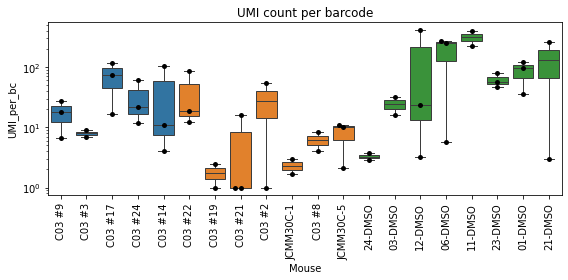

In [130]:
mouselist = {'6wk pHIV':[],'6wk pART':[],'Rebound':[]}
for mouse in set(refdata['Mouse']):
    time = refdata[refdata['Mouse']==mouse]['Timepoint'].iloc[0]
    mouselist[time].append(mouse)
colordict = {}
for i,time in enumerate(mouselist):
    for mouse in mouselist[time]:
        colordict[mouse] = plt.cm.tab10(i)
mouselist = mouselist['6wk pHIV']+mouselist['6wk pART']+mouselist['Rebound']
plt.figure(figsize=(8,4))
tdata = refdata[refdata['valid']]
sns.boxplot(y=tdata['UMI_per_bc'],x=tdata['Mouse'],order=mouselist,palette=colordict)
sns.swarmplot(y=tdata['UMI_per_bc'],x=tdata['Mouse'],color='black',order=mouselist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('UMI count per barcode')
plt.tight_layout()

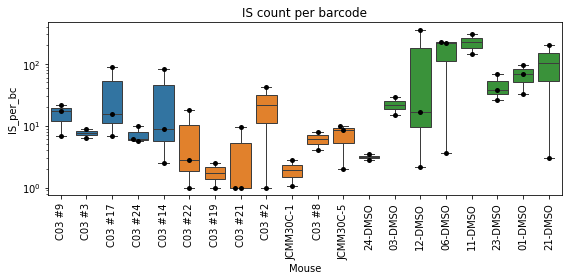

In [131]:
mouselist = {'6wk pHIV':[],'6wk pART':[],'Rebound':[]}
for mouse in set(refdata['Mouse']):
    time = refdata[refdata['Mouse']==mouse]['Timepoint'].iloc[0]
    mouselist[time].append(mouse)
colordict = {}
for i,time in enumerate(mouselist):
    for mouse in mouselist[time]:
        colordict[mouse] = plt.cm.tab10(i)
mouselist = mouselist['6wk pHIV']+mouselist['6wk pART']+mouselist['Rebound']
plt.figure(figsize=(8,4))
tdata = refdata[refdata['valid']]
sns.boxplot(y=tdata['IS_per_bc'],x=tdata['Mouse'],order=mouselist,palette=colordict)
sns.swarmplot(y=tdata['IS_per_bc'],x=tdata['Mouse'],color='black',order=mouselist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('IS count per barcode')
plt.tight_layout()

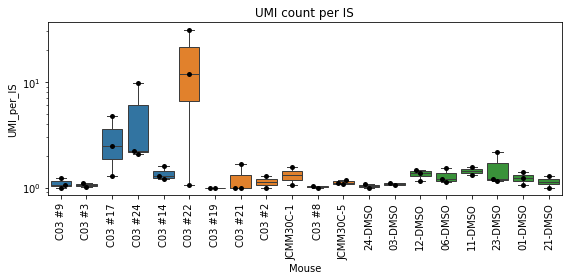

In [132]:
mouselist = {'6wk pHIV':[],'6wk pART':[],'Rebound':[]}
for mouse in set(refdata['Mouse']):
    time = refdata[refdata['Mouse']==mouse]['Timepoint'].iloc[0]
    mouselist[time].append(mouse)
colordict = {}
for i,time in enumerate(mouselist):
    for mouse in mouselist[time]:
        colordict[mouse] = plt.cm.tab10(i)
mouselist = mouselist['6wk pHIV']+mouselist['6wk pART']+mouselist['Rebound']
plt.figure(figsize=(8,4))
tdata = refdata[refdata['valid']&(refdata['UMI_per_IS'])]
sns.boxplot(y=tdata['UMI_per_IS'],x=tdata['Mouse'],order=mouselist,palette=colordict)
sns.swarmplot(y=tdata['UMI_per_IS'],x=tdata['Mouse'],color='black',order=mouselist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('UMI count per IS')
plt.tight_layout()

In [133]:
combinebc

,barcode,UMI count,IS count,integrated frequency,unintegrated frequency,Mouse,sample name,Timepoint,UDP
0,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,103,93,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
1,CTTATAGTGGACGACGTAGAGGGAGGCCCTACAA,63,61,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
2,CTTATAGGCGTAGGAGGAGGTGAGGCCCCTACAA,19,19,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
3,CTTATAGCTGAAGTTGCGGCCGAAGTGCCTACAA,23,23,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
4,CTTATAGACGAAGCTGAGGAAGCGGGCTTATAG,1,1,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01
...,...,...,...,...,...,...,...,...,...
499,CTTATAGTGGGGGTAGACGGAGAGGTGGTTGATGTTTTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31
500,CTTATAGCCGGTGGAGATGCAGCGGAATTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31
501,CTTATAGAAGAGGTAGTCGCAGAGGAATTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31
502,CTTATAGACGCAGGGGCAGTCGGCGCTTTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31


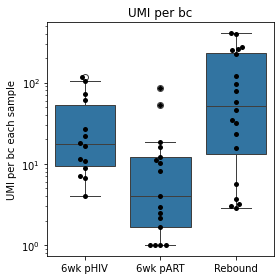

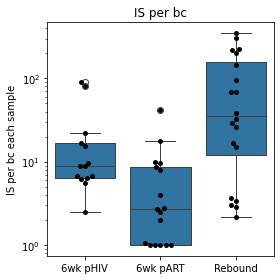

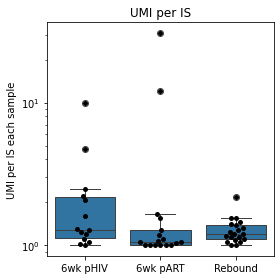

In [134]:
testlist = ['UMI_per_bc','IS_per_bc','UMI_per_IS']
ploti = 0
for parameter in testlist:
    ploti += 1
    plt.figure(figsize=(4,4))
    tdata = refdata[(refdata['valid'])&(refdata[parameter])]
    sns.boxplot(y=tdata[parameter],x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
    sns.swarmplot(y=tdata[parameter],x=tdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
    plt.yscale('log')
    plt.xlabel('')
    plt.ylabel(parameter.replace('_',' ')+' each sample')
    plt.title(parameter.replace('_',' '))
    plt.tight_layout()
    plt.savefig('figures/per_sample_'+parameter+'.png',dpi=300)

In [135]:
def UMI_per_bc(x):
    tdata = combinebc[combinebc['UDP']==x]
    return ss.gmean(tdata['UMI count'])

def IS_per_bc(x):
    tdata = combinebc[combinebc['UDP']==x]
    return ss.gmean(tdata['IS count'])

def UMI_per_IS(x):
    tdata = combineIS[combineIS['UDP']==x]
    return ss.gmean(tdata['UMI count'])

refdata['gmean_UMI_per_bc'] = refdata['UDP'].apply(lambda x:UMI_per_bc(x))
refdata['gmean_IS_per_bc'] = refdata['UDP'].apply(lambda x:IS_per_bc(x))
refdata['gmean_UMI_per_IS'] = refdata['UDP'].apply(lambda x:UMI_per_IS(x))

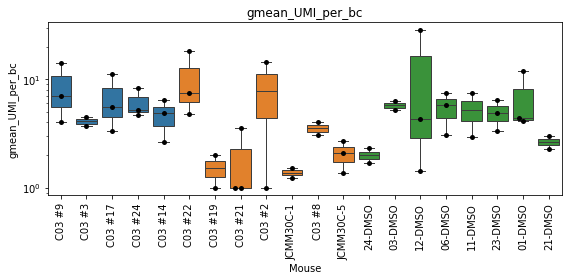

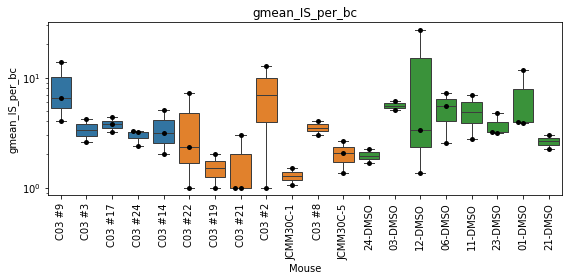

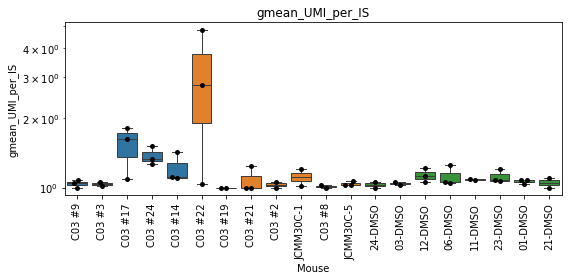

In [136]:
testlist = ['UMI_per_bc','IS_per_bc','UMI_per_IS']
for parameter in testlist:
    plt.figure(figsize=(8,4))
    tdata = refdata[refdata['valid']&(refdata['gmean_'+parameter])]
    sns.boxplot(y=tdata['gmean_'+parameter],x=tdata['Mouse'],order=mouselist,palette=colordict)
    sns.swarmplot(y=tdata['gmean_'+parameter],x=tdata['Mouse'],color='black',order=mouselist)
    plt.yscale('log')
    plt.xticks(rotation=90)
    plt.title('gmean_'+parameter)
    plt.tight_layout()

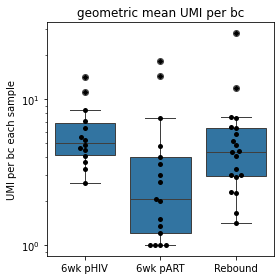

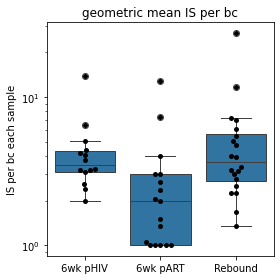

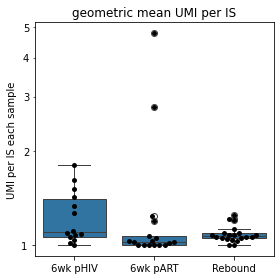

In [137]:
testlist = ['UMI_per_bc','IS_per_bc','UMI_per_IS']
ploti = 0
for parameter in testlist:
    ploti += 1
    plt.figure(figsize=(4,4))
    tdata = refdata[(refdata['valid'])&(refdata['gmean_'+parameter])]
    sns.boxplot(y=tdata['gmean_'+parameter],x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
    ax = sns.swarmplot(y=tdata['gmean_'+parameter],x=tdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
    plt.yscale('log')
    if parameter == 'UMI_per_IS':
        ax.get_yaxis().set_minor_formatter(
            matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x))))
        ax.get_yaxis().set_major_formatter(
            matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x))))
    plt.xlabel('')
    plt.ylabel(parameter.replace('_',' ')+' each sample')
    plt.title('geometric mean '+parameter.replace('_',' '))
    plt.tight_layout()
    plt.savefig('figures/per_sample_gmean_'+parameter+'.png',dpi=300)

In [138]:
for parameter in testlist:
    tdata = refdata[(refdata['valid'])&(refdata[parameter])]
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='6wk pHIV',parameter],tdata.loc[tdata['Timepoint']=='6wk pART',parameter])
    print(parameter,'pHIV vs pART: p='+str(p))
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound',parameter],tdata.loc[tdata['Timepoint']=='6wk pART',parameter])
    print(parameter,'Rebound vs pART: p='+str(p))

UMI_per_bc pHIV vs pART: p=0.010458891307007728
UMI_per_bc Rebound vs pART: p=0.0007173860856742731
IS_per_bc pHIV vs pART: p=0.0117160839800187
IS_per_bc Rebound vs pART: p=0.00015743654221703085
UMI_per_IS pHIV vs pART: p=0.05673822137519339
UMI_per_IS Rebound vs pART: p=0.1435076836139022


In [139]:
for parameter in testlist:
    tdata = refdata[(refdata['valid'])&(refdata['gmean_'+parameter])]
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='6wk pHIV','gmean_'+parameter],tdata.loc[tdata['Timepoint']=='6wk pART','gmean_'+parameter])
    print(parameter,'pHIV vs pART: p='+str(p))
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound','gmean_'+parameter],tdata.loc[tdata['Timepoint']=='6wk pART','gmean_'+parameter])
    print(parameter,'Rebound vs pART: p='+str(p))
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound','gmean_'+parameter],tdata.loc[tdata['Timepoint']=='6wk pHIV','gmean_'+parameter])
    print(parameter,'Rebound vs pHIV: p='+str(p))

UMI_per_bc pHIV vs pART: p=0.007825393693027836
UMI_per_bc Rebound vs pART: p=0.02411881570295319
UMI_per_bc Rebound vs pHIV: p=0.24818894673782166
IS_per_bc pHIV vs pART: p=0.0035282206147545796
IS_per_bc Rebound vs pART: p=0.004592948033665569
IS_per_bc Rebound vs pHIV: p=0.9302885701156912
UMI_per_IS pHIV vs pART: p=0.02902244573230509
UMI_per_IS Rebound vs pART: p=0.06746466499488243
UMI_per_IS Rebound vs pHIV: p=0.06881674875036703


In [140]:
def find_expand_freq(x):
    tdata = combineIS[combineIS['UDP']==x]
    if len(tdata) == 0: return np.nan
    return len(tdata[tdata['UMI count']>1])/len(tdata)
    
refdata['freq_IS_expanded'] = refdata['UDP'].apply(lambda x:find_expand_freq(x))

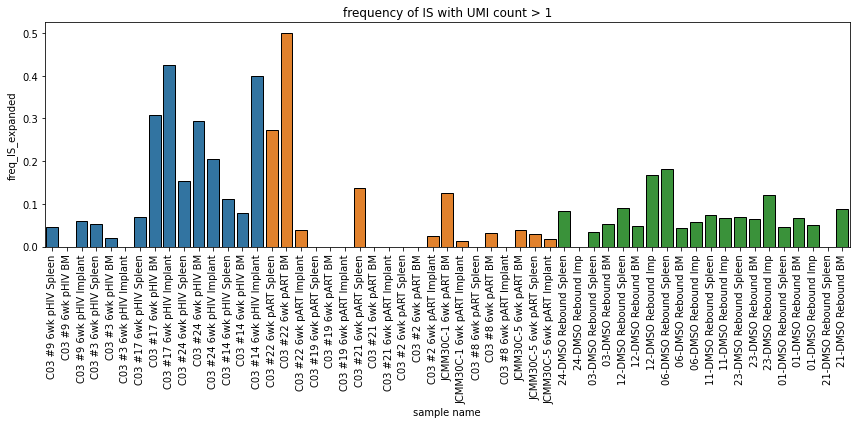

In [141]:
scolordict = {}
for i,time in enumerate(['6wk pHIV','6wk pART','Rebound']):
    for j,row in refdata.iterrows():
        sample = row['sample name']
        if row['Timepoint']==time:
            scolordict[sample] = plt.cm.tab10(i)
plt.figure(figsize=(12,6))
tdata = refdata[(refdata['valid'])]
sns.barplot(x=tdata['sample name'],y=tdata['freq_IS_expanded'],palette=scolordict,edgecolor='black',order=[x for x in samplelist if x in list(tdata['sample name'])])
plt.xticks(rotation=90)
plt.title('frequency of IS with UMI count > 1')
plt.tight_layout()

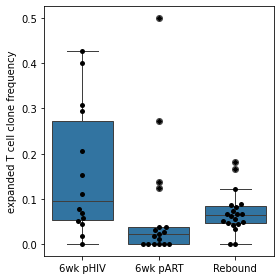

In [142]:
    plt.figure(figsize=(4,4))
    tdata = refdata[(refdata['valid'])]
    sns.boxplot(y=tdata['freq_IS_expanded'],x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
    ax = sns.swarmplot(y=tdata['freq_IS_expanded'],x=tdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
    plt.xlabel('')
    plt.ylabel('expanded T cell clone frequency')
    #plt.title('frequency of IS with UMI count > 1')
    plt.tight_layout()
    plt.savefig('figures/per_sample_UMI_per_IS_morethan1.png')

In [143]:
    tdata = refdata[(refdata['valid'])]
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='6wk pHIV','freq_IS_expanded'],tdata.loc[tdata['Timepoint']=='6wk pART','freq_IS_expanded'],nan_policy='omit')
    print('UMI/IS>1','pHIV vs pART: p='+str(p))
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound','freq_IS_expanded'],tdata.loc[tdata['Timepoint']=='6wk pART','freq_IS_expanded'],nan_policy='omit')
    print('UMI/IS>1','Rebound vs pART: p='+str(p))
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound','freq_IS_expanded'],tdata.loc[tdata['Timepoint']=='6wk pHIV','freq_IS_expanded'],nan_policy='omit')
    print('UMI/IS>1','Rebound vs pHIV: p='+str(p))

UMI/IS>1 pHIV vs pART: p=0.011071644553191878
UMI/IS>1 Rebound vs pART: p=0.028215352453887482
UMI/IS>1 Rebound vs pHIV: p=0.10004048278005462


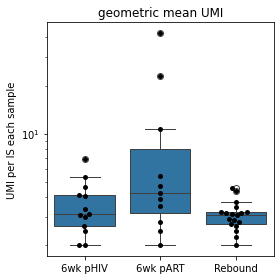

In [144]:

def UMI_per_IS(x):
    tdata = combineIS[combineIS['UDP']==x]
    return ss.gmean(tdata[tdata['UMI count']>1]['UMI count'])

refdata['UMI_per_IS_morethan1'] = refdata['UDP'].apply(lambda x:UMI_per_IS(x))

parameter = 'UMI_per_IS_morethan1'
plt.figure(figsize=(4,4))
tdata = refdata[(refdata['valid'])&(refdata['UMI_per_IS_morethan1'])]
sns.boxplot(y=tdata['UMI_per_IS_morethan1'],x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
ax = sns.swarmplot(y=tdata['UMI_per_IS_morethan1'],x=tdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
plt.yscale('log')
plt.xlabel('')
plt.ylabel('UMI per IS each sample')
plt.title('geometric mean UMI')
plt.tight_layout()
plt.savefig('figures/per_sample_gmean_'+parameter+'.png',dpi=300)

In [145]:
    parameter = 'UMI_per_IS_morethan1'
    tdata = refdata[(refdata['valid'])&(refdata[parameter])]
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound',parameter],tdata.loc[tdata['Timepoint']=='6wk pHIV',parameter])
    print(parameter,'Rebound vs pHIV: p='+str(p))
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='6wk pHIV',parameter],tdata.loc[tdata['Timepoint']=='6wk pART',parameter])
    print(parameter,'6wk pART vs pHIV: p='+str(p))
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound',parameter],tdata.loc[tdata['Timepoint']=='6wk pART',parameter])
    print(parameter,'Rebound vs pART: p='+str(p))

UMI_per_IS_morethan1 Rebound vs pHIV: p=0.5349308944044924
UMI_per_IS_morethan1 6wk pART vs pHIV: p=0.16438404758801328
UMI_per_IS_morethan1 Rebound vs pART: p=0.03464419410171789


In [146]:
def UMI_per_bc(x):
    tdata = combinebc[combinebc['Mouse']==x]
    return np.mean(tdata['UMI count'])

def IS_per_bc(x):
    tdata = combinebc[combinebc['Mouse']==x]
    return np.mean(tdata['IS count'])

def UMI_per_IS(x):
    tdata = combineIS[combineIS['Mouse']==x]
    return np.mean(tdata['UMI count'])

mousedata['UMI_per_bc'] = mousedata['mouse'].apply(lambda x:UMI_per_bc(x))
mousedata['IS_per_bc'] = mousedata['mouse'].apply(lambda x:IS_per_bc(x))
mousedata['UMI_per_IS'] = mousedata['mouse'].apply(lambda x:UMI_per_IS(x))

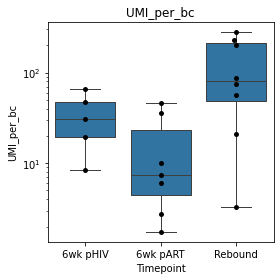

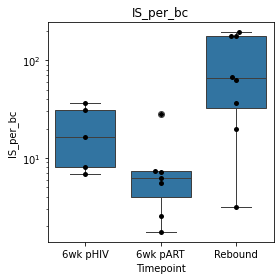

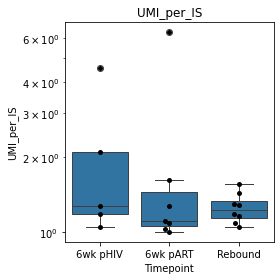

In [147]:

testlist = ['UMI_per_bc','IS_per_bc','UMI_per_IS']
ploti = 0
for parameter in testlist:
    ploti += 1
    plt.figure(figsize=(4,4))
    tdata = mousedata[mousedata[parameter]>0]
    sns.boxplot(y=tdata[parameter],x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
    sns.swarmplot(y=tdata[parameter],x=tdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
    plt.yscale('log')
    plt.title(parameter)
    plt.tight_layout()

In [148]:
def UMI_per_bc(x):
    tdata = combinebc[combinebc['Mouse']==x]
    return ss.gmean(tdata['UMI count'])

def IS_per_bc(x):
    tdata = combinebc[combinebc['Mouse']==x]
    return ss.gmean(tdata['IS count'])

def UMI_per_IS(x):
    tdata = combineIS[combineIS['Mouse']==x]
    return ss.gmean(tdata['UMI count'])

mousedata['gmean_UMI_per_bc'] = mousedata['mouse'].apply(lambda x:UMI_per_bc(x))
mousedata['gmean_IS_per_bc'] = mousedata['mouse'].apply(lambda x:IS_per_bc(x))
mousedata['gmean_UMI_per_IS'] = mousedata['mouse'].apply(lambda x:UMI_per_IS(x))

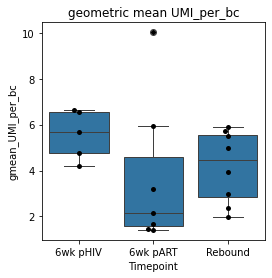

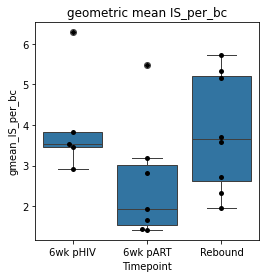

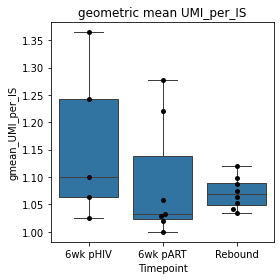

In [149]:

testlist = ['UMI_per_bc','IS_per_bc','UMI_per_IS']
ploti = 0
for parameter in testlist:
    ploti += 1
    plt.figure(figsize=(4,4))
    tdata = mousedata[mousedata[parameter]>0]
    sns.boxplot(y=tdata['gmean_'+parameter],x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'])
    sns.swarmplot(y=tdata['gmean_'+parameter],x=tdata['Timepoint'],color='black',order=['6wk pHIV','6wk pART','Rebound'])
    #plt.yscale('log')
    plt.title('geometric mean '+parameter)
plt.tight_layout()

In [150]:
for parameter in testlist:
    tdata = mousedata
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='6wk pHIV',parameter],tdata.loc[tdata['Timepoint']=='6wk pART',parameter])
    print(parameter,'pHIV vs pART: p='+str(p))
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound',parameter],tdata.loc[tdata['Timepoint']=='6wk pART',parameter])
    print(parameter,'Rebound vs pART: p='+str(p))

UMI_per_bc pHIV vs pART: p=0.08815793541979457
UMI_per_bc Rebound vs pART: p=0.015087255494406496
IS_per_bc pHIV vs pART: p=0.042357062026854894
IS_per_bc Rebound vs pART: p=0.010896354195387441
UMI_per_IS pHIV vs pART: p=0.3717512896455607
UMI_per_IS Rebound vs pART: p=0.6434288435636205


In [151]:
for parameter in testlist:
    tdata = mousedata
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='6wk pHIV','gmean_'+parameter],tdata.loc[tdata['Timepoint']=='6wk pART','gmean_'+parameter])
    print(parameter,'pHIV vs pART: p='+str(p))
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound','gmean_'+parameter],tdata.loc[tdata['Timepoint']=='6wk pART','gmean_'+parameter])
    print(parameter,'Rebound vs pART: p='+str(p))

UMI_per_bc pHIV vs pART: p=0.1228802580882282
UMI_per_bc Rebound vs pART: p=0.3545394797735013
IS_per_bc pHIV vs pART: p=0.042357062026854894
IS_per_bc Rebound vs pART: p=0.0825792741523268
UMI_per_IS pHIV vs pART: p=0.22322514530675575
UMI_per_IS Rebound vs pART: p=0.2976214678911162


#### organ analysis

In [152]:
combineIS['Organ'] = combineIS['UDP'].apply(lambda x:refdata.loc[refdata['UDP']==x,'Organ'].iloc[0])
combinebc['Organ'] = combinebc['UDP'].apply(lambda x:refdata.loc[refdata['UDP']==x,'Organ'].iloc[0])

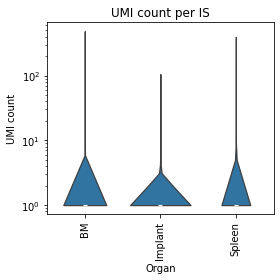

In [153]:
plt.figure(figsize=(4,4))
sns.violinplot(y=combineIS['UMI count'],x=combineIS['Organ'],cut=0,order=['BM','Implant','Spleen'])
#sns.swarmplot(y=combineIS['UMI count'],x=combineIS['Organ'],color='black')
plt.yscale('log')
plt.xticks(rotation=90)
#plt.ylabel('integrated frequency')
plt.title('UMI count per IS')
plt.tight_layout()

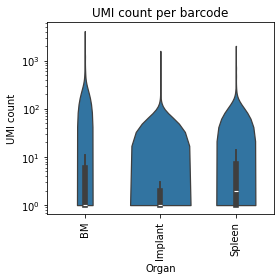

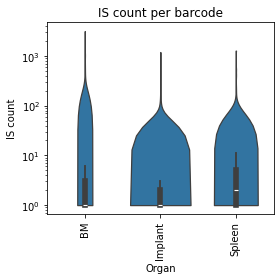

In [154]:
plt.figure(figsize=(4,4))
sns.violinplot(y=combinebc['UMI count'],x=combinebc['Organ'],cut=0,order=['BM','Implant','Spleen'])
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('UMI count per barcode')
plt.tight_layout()
plt.figure(figsize=(4,4))
sns.violinplot(y=combinebc['IS count'],x=combinebc['Organ'],cut=0,order=['BM','Implant','Spleen'])
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('IS count per barcode')
plt.tight_layout()

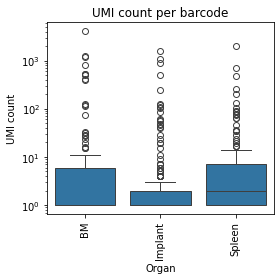

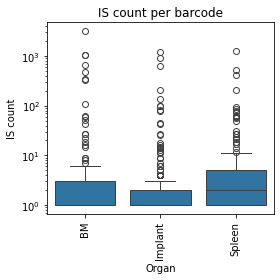

In [155]:
plt.figure(figsize=(4,4))
sns.boxplot(y=combinebc['UMI count'],x=combinebc['Organ'],order=['BM','Implant','Spleen'])
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('UMI count per barcode')
plt.tight_layout()
plt.figure(figsize=(4,4))
sns.boxplot(y=combinebc['IS count'],x=combinebc['Organ'],order=['BM','Implant','Spleen'])
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('IS count per barcode')
plt.tight_layout()

In [156]:
rho,p = ss.ranksums(combinebc[combinebc['Organ']=='BM']['UMI count'],combinebc[combinebc['Organ']=='Implant']['UMI count'])
print('UMI_per_bc, BM vs Implant, p='+str(p))
rho,p = ss.ranksums(combinebc[combinebc['Organ']=='Spleen']['UMI count'],combinebc[combinebc['Organ']=='Implant']['UMI count'])
print('UMI_per_bc, Spleen vs Implant, p='+str(p))
rho,p = ss.ranksums(combinebc[combinebc['Organ']=='BM']['UMI count'],combinebc[combinebc['Organ']=='Spleen']['UMI count'])
print('UMI_per_bc, BM vs Spleen, p='+str(p))

UMI_per_bc, BM vs Implant, p=0.06944319192706006
UMI_per_bc, Spleen vs Implant, p=0.0007052690315477484
UMI_per_bc, BM vs Spleen, p=0.36717418442349803


In [157]:
rho,p = ss.ranksums(combinebc[combinebc['Organ']=='BM']['IS count'],combinebc[combinebc['Organ']=='Implant']['IS count'])
print('IS_per_bc, BM vs Implant, p='+str(p))
rho,p = ss.ranksums(combinebc[combinebc['Organ']=='Spleen']['IS count'],combinebc[combinebc['Organ']=='Implant']['IS count'])
print('IS_per_bc, Spleen vs Implant, p='+str(p))
rho,p = ss.ranksums(combinebc[combinebc['Organ']=='BM']['IS count'],combinebc[combinebc['Organ']=='Spleen']['IS count'])
print('IS_per_bc, BM vs Spleen, p='+str(p))

IS_per_bc, BM vs Implant, p=0.2620620587621416
IS_per_bc, Spleen vs Implant, p=0.0030672660022427077
IS_per_bc, BM vs Spleen, p=0.23295236910527073


In [158]:
rho,p = ss.ranksums(combineIS[combineIS['Organ']=='BM']['UMI count'],combineIS[combineIS['Organ']=='Implant']['UMI count'])
print('UMI_per_IS, BM vs Implant, p='+str(p))
rho,p = ss.ranksums(combineIS[combineIS['Organ']=='Spleen']['UMI count'],combineIS[combineIS['Organ']=='Implant']['UMI count'])
print('UMI_per_IS, Spleen vs Implant, p='+str(p))
rho,p = ss.ranksums(combineIS[combineIS['Organ']=='BM']['UMI count'],combineIS[combineIS['Organ']=='Spleen']['UMI count'])
print('UMI_per_IS, BM vs Spleen, p='+str(p))

UMI_per_IS, BM vs Implant, p=0.6424714533510736
UMI_per_IS, Spleen vs Implant, p=0.7754195151344276
UMI_per_IS, BM vs Spleen, p=0.4419444423791221


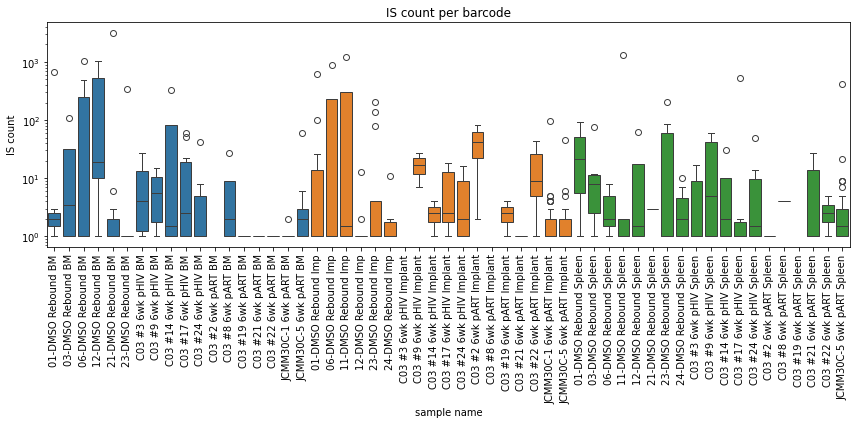

In [159]:
plt.figure(figsize=(12,6))
colordict = {}
tdata = combinebc[combinebc['Organ']!='Liver']
osamplelist = sorted(refdata[refdata['valid']]['sample name'],key=lambda x:x.rsplit(' ')[-1])
for sample in osamplelist:
    if 'BM' in sample:
        colordict[sample] = plt.cm.tab10(0)
    elif 'Spleen' in sample:
        colordict[sample] = plt.cm.tab10(2)
    elif 'Imp' in sample:
        colordict[sample] = plt.cm.tab10(1)
sns.boxplot(y=tdata['IS count'],x=tdata['sample name'],order=osamplelist,palette=colordict)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('IS count per barcode')
plt.tight_layout()

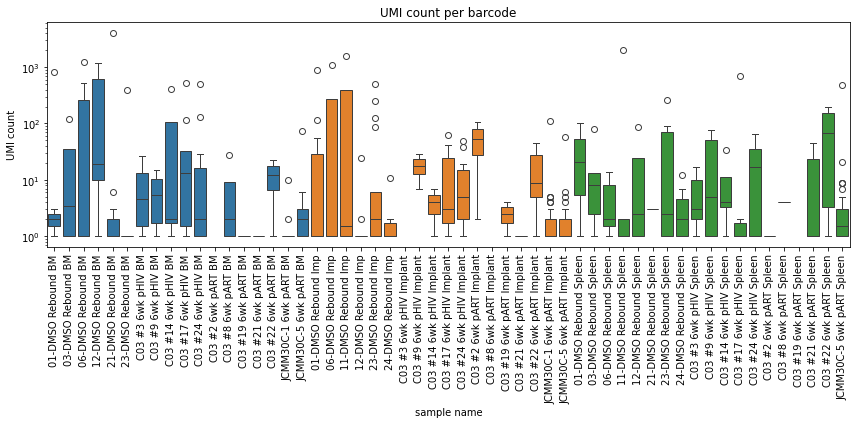

In [160]:
plt.figure(figsize=(12,6))
colordict = {}
tdata = combinebc[combinebc['Organ']!='Liver']
osamplelist = sorted(refdata[refdata['valid']]['sample name'],key=lambda x:x.rsplit(' ')[-1])
for sample in osamplelist:
    if 'BM' in sample:
        colordict[sample] = plt.cm.tab10(0)
    elif 'Spleen' in sample:
        colordict[sample] = plt.cm.tab10(2)
    elif 'Imp' in sample:
        colordict[sample] = plt.cm.tab10(1)
sns.boxplot(y=tdata['UMI count'],x=tdata['sample name'],order=osamplelist,palette=colordict)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('UMI count per barcode')
plt.tight_layout()

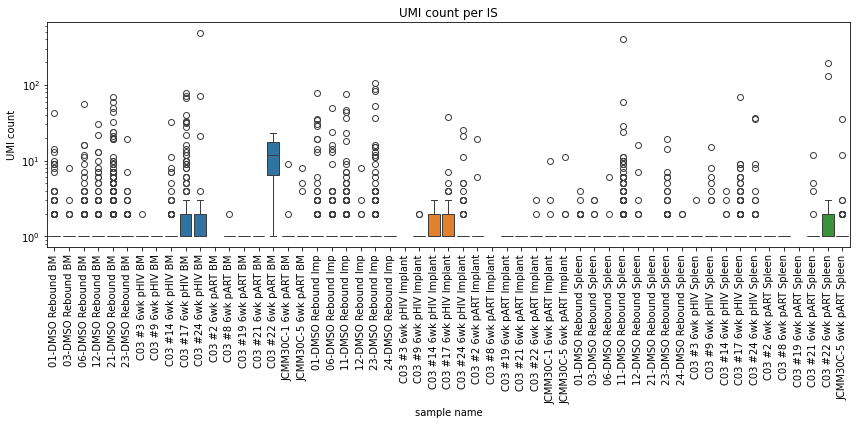

In [161]:
plt.figure(figsize=(12,6))
colordict = {}
tdata = combineIS[combineIS['Organ']!='Liver']
osamplelist = sorted(refdata[refdata['valid']]['sample name'],key=lambda x:x.rsplit(' ')[-1])
for sample in osamplelist:
    if 'BM' in sample:
        colordict[sample] = plt.cm.tab10(0)
    elif 'Spleen' in sample:
        colordict[sample] = plt.cm.tab10(2)
    elif 'Imp' in sample:
        colordict[sample] = plt.cm.tab10(1)
sns.boxplot(y=tdata['UMI count'],x=tdata['sample name'],order=osamplelist,palette=colordict)
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('UMI count per IS')
plt.tight_layout()

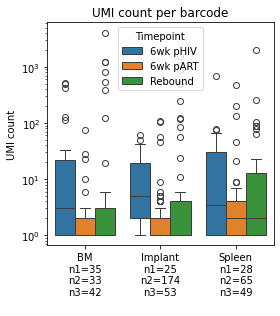

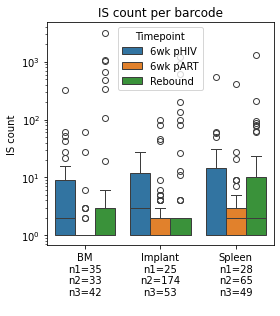

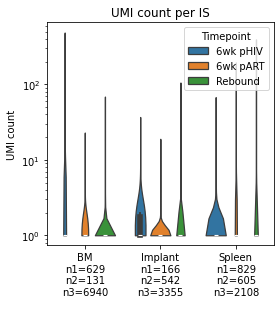

In [162]:
plt.figure(figsize=(4,4.5))
sns.boxplot(y=combinebc['UMI count'],x=combinebc['Organ'],hue=combinebc['Timepoint'],order=['BM','Implant','Spleen'],hue_order=['6wk pHIV','6wk pART','Rebound'])
plt.yscale('log')
locs,labels = plt.xticks()
cdict = {}
for i,organ in enumerate(['BM','Implant','Spleen']):
    tdata = combinebc[(combinebc['Organ']==organ)]
    labels[i] = organ+'\n'
    for j,time in enumerate(['6wk pHIV','6wk pART','Rebound']):
        labels[i] += ('n'+str(j+1)+'='+str(len(tdata[tdata['Timepoint']==time]))+'\n')
plt.xticks(locs,labels)
plt.xlabel('')
plt.title('UMI count per barcode')
plt.tight_layout()
plt.savefig('figures/Organ_UMI_per_bc.svg')

plt.figure(figsize=(4,4.5))
sns.boxplot(y=combinebc['IS count'],x=combinebc['Organ'],hue=combinebc['Timepoint'],order=['BM','Implant','Spleen'],hue_order=['6wk pHIV','6wk pART','Rebound'])
plt.yscale('log')
locs,labels = plt.xticks()
cdict = {}
for i,organ in enumerate(['BM','Implant','Spleen']):
    tdata = combinebc[(combinebc['Organ']==organ)]
    labels[i] = organ+'\n'
    for j,time in enumerate(['6wk pHIV','6wk pART','Rebound']):
        labels[i] += ('n'+str(j+1)+'='+str(len(tdata[tdata['Timepoint']==time]))+'\n')
plt.xticks(locs,labels)
plt.xlabel('')
plt.title('IS count per barcode')
plt.tight_layout()
plt.savefig('figures/Organ_IS_per_bc.svg')

plt.figure(figsize=(4,4.5))
sns.violinplot(y=combineIS['UMI count'],x=combineIS['Organ'],hue=combineIS['Timepoint'],cut=0,order=['BM','Implant','Spleen'],hue_order=['6wk pHIV','6wk pART','Rebound'])
plt.yscale('log')
locs,labels = plt.xticks()
cdict = {}
for i,organ in enumerate(['BM','Implant','Spleen']):
    tdata = combineIS[(combineIS['Organ']==organ)]
    labels[i] = organ+'\n'
    for j,time in enumerate(['6wk pHIV','6wk pART','Rebound']):
        labels[i] += ('n'+str(j+1)+'='+str(len(tdata[tdata['Timepoint']==time]))+'\n')
plt.xticks(locs,labels)
plt.xlabel('')
plt.title('UMI count per IS')
plt.tight_layout()
plt.savefig('figures/Organ_UMI_per_IS.svg')

In [163]:
organlist = ['BM','Implant','Spleen']
timelist = ['6wk pHIV','6wk pART','Rebound']
for i1,o1 in enumerate(organlist):
    for i2,o2 in enumerate(organlist):
        if i1 < i2: continue
        for j1,t1 in enumerate(timelist):
            for j2,t2 in enumerate(timelist):
                if j1 < j2: continue
                rho,p = ss.ranksums(combinebc[(combinebc['Timepoint']==t1)&(combinebc['Organ']==o1)]['UMI count'],combinebc[(combinebc['Timepoint']==t2)&(combinebc['Organ']==o2)]['UMI count'])
                if (p < 0.05) and (i1 == i2 or j1 == j2):
                    print('UMI_per_bc, '+t1+' '+o1+' vs '+t2+' '+o2+', p='+str(round(p,6)))

UMI_per_bc, 6wk pART BM vs 6wk pHIV BM, p=0.00486
UMI_per_bc, 6wk pART Implant vs 6wk pHIV Implant, p=4e-06
UMI_per_bc, Rebound Implant vs 6wk pHIV Implant, p=0.01671
UMI_per_bc, 6wk pART Spleen vs 6wk pART Implant, p=0.011088


In [164]:
organlist = ['BM','Implant','Spleen']
timelist = ['6wk pHIV','6wk pART','Rebound']
for i1,o1 in enumerate(organlist):
    for i2,o2 in enumerate(organlist):
        if i1 < i2: continue
        for j1,t1 in enumerate(timelist):
            for j2,t2 in enumerate(timelist):
                if j1 < j2: continue
                rho,p = ss.ranksums(combinebc[(combinebc['Timepoint']==t1)&(combinebc['Organ']==o1)]['IS count'],combinebc[(combinebc['Timepoint']==t2)&(combinebc['Organ']==o2)]['IS count'])
                if (p < 0.05) and (i1 == i2 or j1 == j2):
                    print('IS_per_bc, '+t1+' '+o1+' vs '+t2+' '+o2+', p='+str(round(p,6)))

IS_per_bc, 6wk pART BM vs 6wk pHIV BM, p=0.017287
IS_per_bc, 6wk pART Implant vs 6wk pHIV Implant, p=0.000143
IS_per_bc, Rebound Implant vs 6wk pHIV Implant, p=0.022572
IS_per_bc, 6wk pART Spleen vs 6wk pART BM, p=0.038711
IS_per_bc, 6wk pART Spleen vs 6wk pART Implant, p=0.016018


In [165]:
organlist = ['BM','Implant','Spleen']
timelist = ['6wk pHIV','6wk pART','Rebound']
for i1,o1 in enumerate(organlist):
    for i2,o2 in enumerate(organlist):
        if i1 < i2: continue
        for j1,t1 in enumerate(timelist):
            for j2,t2 in enumerate(timelist):
                if j1 < j2: continue
                rho,p = ss.ranksums(combineIS[(combineIS['Timepoint']==t1)&(combineIS['Organ']==o1)]['UMI count'],combineIS[(combineIS['Timepoint']==t2)&(combineIS['Organ']==o2)]['UMI count'])
                if (p < 0.05) and (i1 == i2 or j1 == j2):
                    print('UMI_per_IS, '+t1+' '+o1+' vs '+t2+' '+o2+', p='+str(round(p,6)))

UMI_per_IS, Rebound BM vs 6wk pHIV BM, p=0.000454
UMI_per_IS, 6wk pART Implant vs 6wk pHIV Implant, p=5e-06
UMI_per_IS, Rebound Implant vs 6wk pHIV Implant, p=5.2e-05
UMI_per_IS, 6wk pHIV Spleen vs 6wk pHIV BM, p=0.013132
UMI_per_IS, 6wk pHIV Spleen vs 6wk pHIV Implant, p=0.000326


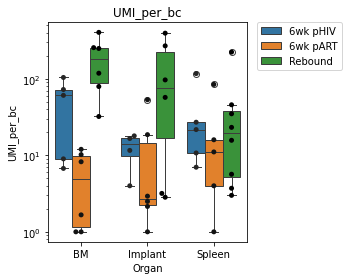

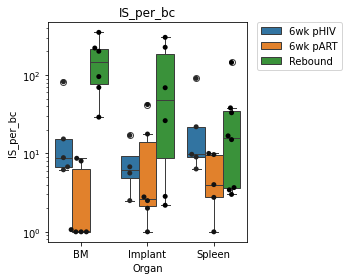

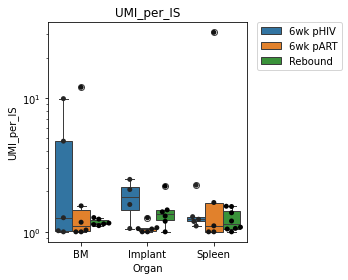

In [166]:
tdata = refdata[refdata['valid']]
for test in testlist:
    plt.figure(figsize=(5,4))
    sns.boxplot(y=tdata[test],x=tdata['Organ'],hue=tdata['Timepoint'],order=['BM','Implant','Spleen'],hue_order=['6wk pHIV','6wk pART','Rebound'])
    ax = sns.swarmplot(y=tdata[test],x=tdata['Organ'],hue=tdata['Timepoint'],order=['BM','Implant','Spleen'],hue_order=['6wk pHIV','6wk pART','Rebound'],dodge=True,color='black')
    plt.yscale('log')
    #plt.xticks(rotation=90)
    plt.title(test)
    plt.legend([],[], frameon=False)
    handles, labels = ax.get_legend_handles_labels()
    l = plt.legend(handles[0:3], labels[0:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)    
    plt.tight_layout()
    plt.savefig('figures/Organ_per_sample_mean_'+test+'.svg')

In [167]:
organlist = ['BM','Implant','Spleen']
timelist = ['6wk pHIV','6wk pART','Rebound']
tdata = refdata[refdata['valid']&refdata['UMI_per_bc']]
for i1,o1 in enumerate(organlist):
    for i2,o2 in enumerate(organlist):
        if i1 < i2: continue
        for j1,t1 in enumerate(timelist):
            for j2,t2 in enumerate(timelist):
                if j1 < j2: continue
                rho,p = ss.ranksums(tdata[(tdata['Timepoint']==t1)&(tdata['Organ']==o1)]['UMI_per_bc'],tdata[(tdata['Timepoint']==t2)&(tdata['Organ']==o2)]['UMI_per_bc'])
                if (p<0.05) and (i1 == i2 or j1 == j2):
                    print('UMI_per_bc, '+t1+' '+o1+' vs '+t2+' '+o2+', p='+str(round(p,6)))

UMI_per_bc, Rebound BM vs 6wk pHIV BM, p=0.04461
UMI_per_bc, Rebound BM vs 6wk pART BM, p=0.003948
UMI_per_bc, Rebound Implant vs 6wk pART Implant, p=0.037373
UMI_per_bc, Rebound Spleen vs Rebound BM, p=0.014171


In [168]:
organlist = ['BM','Implant','Spleen']
timelist = ['6wk pHIV','6wk pART','Rebound']
tdata = refdata[refdata['valid']&refdata['IS_per_bc']]
for i1,o1 in enumerate(organlist):
    for i2,o2 in enumerate(organlist):
        if i1 < i2: continue
        for j1,t1 in enumerate(timelist):
            for j2,t2 in enumerate(timelist):
                if j1 < j2: continue
                rho,p = ss.ranksums(tdata[(tdata['Timepoint']==t1)&(tdata['Organ']==o1)]['IS_per_bc'],tdata[(tdata['Timepoint']==t2)&(tdata['Organ']==o2)]['IS_per_bc'])
                if (p<0.05) and (i1 == i2 or j1 == j2):
                    print('IS_per_bc, '+t1+' '+o1+' vs '+t2+' '+o2+', p='+str(round(p,6)))

IS_per_bc, 6wk pART BM vs 6wk pHIV BM, p=0.04461
IS_per_bc, Rebound BM vs 6wk pHIV BM, p=0.017622
IS_per_bc, Rebound BM vs 6wk pART BM, p=0.003948
IS_per_bc, Rebound Spleen vs Rebound BM, p=0.014171


In [169]:
organlist = ['BM','Implant','Spleen']
timelist = ['6wk pHIV','6wk pART','Rebound']
tdata = refdata[refdata['valid']&refdata['UMI_per_IS']]
for i1,o1 in enumerate(organlist):
    for i2,o2 in enumerate(organlist):
        if i1 < i2: continue
        for j1,t1 in enumerate(timelist):
            for j2,t2 in enumerate(timelist):
                if j1 < j2: continue
                rho,p = ss.ranksums(tdata[(tdata['Timepoint']==t1)&(tdata['Organ']==o1)]['UMI_per_IS'],tdata[(tdata['Timepoint']==t2)&(tdata['Organ']==o2)]['UMI_per_IS'])
                if (p<0.05) and (i1 == i2 or j1 == j2):
                    print('UMI_per_IS, '+t1+' '+o1+' vs '+t2+' '+o2+', p='+str(round(p,6)))

UMI_per_IS, 6wk pART Implant vs 6wk pHIV Implant, p=0.033006


In [170]:
refdata.to_csv('summary_per_sample.csv')

#### RNA data

In [171]:
C30ref = pd.read_csv('../mouse2/C03_barcode/PrimerID_batch20_summary.txt',sep='\t',index_col=0)
C30ref = C30ref[C30ref['sample'].str.contains('C03')]
C30ref['Timepoint'] = C30ref['sample'].apply(lambda x:x[-7:-4]+' '+x[-4:])

def find_organ(sample):
    organ = sample.rsplit('-')[1]
    if organ == 'Imp':
        organ = 'Implant'
    elif organ == 'Sp':
        organ = 'Spleen'
    return organ

C30ref['Organ'] = C30ref['sample'].apply(lambda x:find_organ(x))

def find_mouse(sample):
    mouse = sample.rsplit('-')[-2]
    mouse = mouse[2:]
    return 'C03 #'+mouse

C30ref['Mouse'] = C30ref['sample'].apply(lambda x:find_mouse(x))

def find_UDP(x):
    UDP = refdata[(refdata['Mouse']==x['Mouse'])&(refdata['Timepoint']==x['Timepoint'])&(refdata['Organ']==x['Organ'])]
    if len(UDP) == 0:
        return 'NA'
    return UDP['UDP'].iloc[0]
    
C30ref['UDP'] = C30ref.apply(lambda x:find_UDP(x),axis=1)
C30ref

,sample,depth,PrimerID_count,barcode_raw,cluster_raw,Timepoint,Organ,Mouse,UDP
sample_bc,,,,,,,,,
0,C03-BM-No14-6wkpHIV,3391092,2396,71,62,6wk pHIV,BM,C03 #14,UDP46
1,C03-BM-No17-6wkpHIV,3035595,1150,41,37,6wk pHIV,BM,C03 #17,UDP47
2,C03-BM-No24-6wkpHIV,2962966,2221,48,43,6wk pHIV,BM,C03 #24,UDP48
3,C03-BM-No3-6wkpHIV,3399196,905,14,13,6wk pHIV,BM,C03 #3,UDP44
4,C03-BM-No9-6wkpHIV,3429279,1358,45,40,6wk pHIV,BM,C03 #9,UDP45
5,C03-Imp-No14-6wkpHIV,3184680,115984,258,100,6wk pHIV,Implant,C03 #14,UDP51
6,C03-Imp-No17-6wkpHIV,3141709,169026,314,77,6wk pHIV,Implant,C03 #17,UDP52
7,C03-Imp-No24-6wkpHIV,3570587,108722,280,75,6wk pHIV,Implant,C03 #24,UDP53
8,C03-Imp-No3-6wkpHIV,2761249,230554,177,43,6wk pHIV,Implant,C03 #3,UDP49


In [172]:
rnadata = {}
for sample in C30ref.index:
    UDP = C30ref.loc[sample,'UDP']
    sname = C30ref.loc[sample,'sample']
    rnadata[sname] = pd.read_csv('../mouse2/C03_barcode/cluster/barcode_occurrence_'+sname+'.txt',sep='\t',index_col=0)

In [173]:
B24samplelist = sorted(glob.glob('../mouse2/JCKB24_barcode/JCKB24/2021-05-04_cluster/00/*DMSO*')+glob.glob('../mouse2/JCKB24_barcode/JCKB24/2021-04-23_cluster/*DMSO*'))
slist = [];tlist = []; olist = []; mlist = []; ulist = []
for sample in B24samplelist:
    sname = sample.rsplit('/')[-1].rsplit('_')
    mouse = sname[0]+'-'+sname[1]
    if sname[2] == 'BM':
        organ = 'BM'
    elif sname[2] == 'Imp':
        organ = 'Implant'
    elif sname[2] == 'Sp':
        organ = 'Spleen'
    elif sname[2] == 'Bld':
        organ = 'TB'
    else:
        continue
    time = 'Rebound'
    UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]['UDP']
    sname = mouse+'_'+organ+'_'+time
    rnadata[sname] = pd.read_csv(sample,sep='\t',index_col=0)
    if len(UDP) > 0:
        UDP = UDP.iloc[0]       
    else:
        UDP = 'NA'
    slist.append(sname)
    tlist.append(time)
    olist.append(organ)
    mlist.append(mouse)
    ulist.append(UDP)
B24ref = pd.DataFrame(zip(slist,tlist,olist,mlist,ulist),columns=['sample','Timepoint','Organ','Mouse','UDP'])

In [174]:
rnaref = pd.concat([C30ref[['sample','Timepoint','Organ','Mouse','UDP']],B24ref])
rnaref

,sample,Timepoint,Organ,Mouse,UDP
0,C03-BM-No14-6wkpHIV,6wk pHIV,BM,C03 #14,UDP46
1,C03-BM-No17-6wkpHIV,6wk pHIV,BM,C03 #17,UDP47
2,C03-BM-No24-6wkpHIV,6wk pHIV,BM,C03 #24,UDP48
3,C03-BM-No3-6wkpHIV,6wk pHIV,BM,C03 #3,UDP44
4,C03-BM-No9-6wkpHIV,6wk pHIV,BM,C03 #9,UDP45
5,C03-Imp-No14-6wkpHIV,6wk pHIV,Implant,C03 #14,UDP51
6,C03-Imp-No17-6wkpHIV,6wk pHIV,Implant,C03 #17,UDP52
7,C03-Imp-No24-6wkpHIV,6wk pHIV,Implant,C03 #24,UDP53
8,C03-Imp-No3-6wkpHIV,6wk pHIV,Implant,C03 #3,UDP49
9,C03-Imp-No9-6wkpHIV,6wk pHIV,Implant,C03 #9,UDP50


In [175]:
def strip_bc(x):
    if x[-6:] == 'TTATAG':
        x = x[:-6]
    elif x[-7:] == 'CCTACAA':
        x = x[:-7]
    if x[:6] == 'CTTATA':
        x = x[6:]
    return str(Seq(x).reverse_complement())

combinebc['truebc'] = combinebc['barcode'].apply(lambda x:strip_bc(x))

In [176]:
def find_transcription(x):
    sample = rnaref[rnaref['UDP']==UDP]['sample']
    if len(sample) == 0:
        return 0
    else:
        sample = sample.iloc[0]
    if x in rnadata[sample].index:
        return rnadata[sample].loc[x,'occurrence']/sum(rnadata[sample]['occurrence'])
    else:
        return 0
    
for UDP in bcdata:
    bcdata[UDP]['truebc'] = bcdata[UDP]['barcode'].apply(lambda x:strip_bc(x))
    bcdata[UDP]['transcription'] = bcdata[UDP]['truebc'].apply(lambda x:find_transcription(x))

For RNA, we also have data for terminal bleed.

1. barplot for each mouse showing bc abundance.

2. Heatmap showing sample similarity for each mice.

3. Find the defective integration sites and barcodes.

4. Compare similarity in 3 complexity:
    * organ
    * RNA/DNA
    * provirus type (integrated/linear/circular/autointegrated)
5. Is the T cell that has provirus and is proliferating the most have RNA barcode in circulation? Does RNA abundance correlate with IS/bc or UMI/IS? 


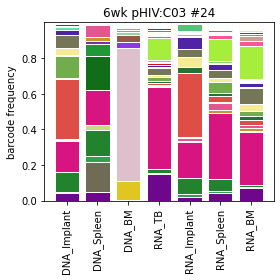

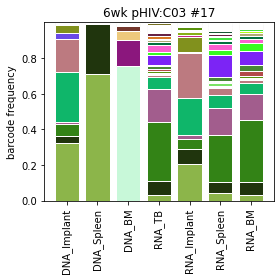

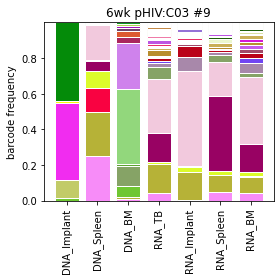

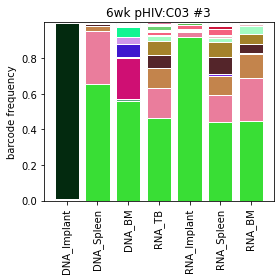

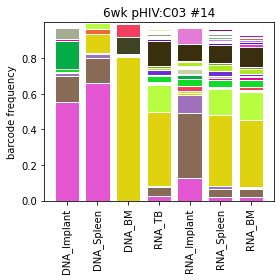

...

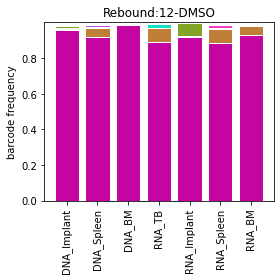

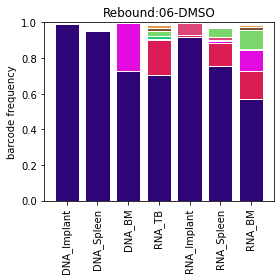

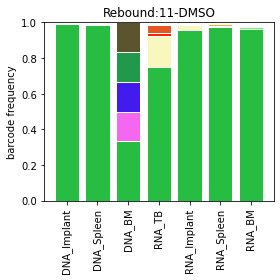

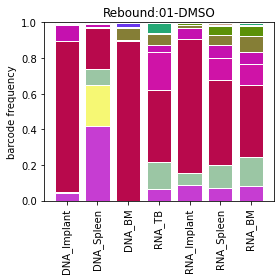

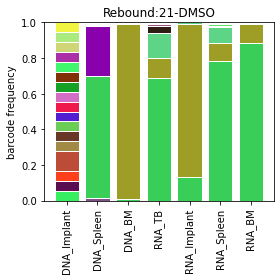

In [177]:
seed = 1
for time in ['6wk pHIV','Rebound']:
    for mouse in set(refdata[refdata['Timepoint']==time]['Mouse']):
        seed += 1
        np.random.seed(seed)
        dnasamples = refdata[refdata['Mouse']==mouse]
        rnasamples = rnaref[rnaref['Mouse']==mouse]
        #tsamplelist = ['DNA_'+x for x in list(dnasamples['Organ'])]+list(['RNA_'+x for x in list(rnasamples['Organ'])])
        tsamplelist = ['DNA_Implant','DNA_Spleen','DNA_BM','RNA_TB','RNA_Implant','RNA_Spleen','RNA_BM']
        bcdict = {}
        for index,row in dnasamples.iterrows():
            UDP = row['UDP']
            if UDP not in bcdata:
                continue
            tdata = bcdata[UDP]
            organ = 'DNA_'+row['Organ']
            if len(tdata) == 0:
                continue
            for i,r in tdata.iterrows():
                bc = r['truebc']
                if bc not in bcdict:
                    bcdict[bc] = {}
                    for sample in tsamplelist:
                        bcdict[bc][sample] = 0
                bcdict[bc][organ] += r['UMI count']/sum(tdata['UMI count'])
        for index,row in rnasamples.iterrows():
            organ = 'RNA_'+row['Organ']
            tdata = rnadata[row['sample']]
            for i,r in tdata.iterrows():
                if i not in bcdict:
                    bcdict[i] = {}
                    for sample in tsamplelist:
                        bcdict[i][sample] = 0
                bcdict[i][organ] += r['occurrence']/sum(tdata['occurrence'])
        colordict = {}; bottomlist = [0]*len(tsamplelist)
        plt.figure(figsize=(4,4))
        for bc in bcdict:
            c=np.random.rand(3,)
            while (abs(c[0]-c[1] < 0.1) and abs(c[0]-c[2] < 0.1) and abs(c[1]-c[2] < 0.1)):
                c=np.random.rand(3,)
            colordict[bc] = c
            ylist = list(bcdict[bc].values())
            plt.bar(tsamplelist,ylist,bottom=bottomlist,color=c,edgecolor='white')
            for i in range(len(ylist)):
                bottomlist[i] += ylist[i]
        plt.ylabel('barcode frequency')
        plt.xticks(rotation=90)
        plt.title(time+':'+mouse)
        plt.tight_layout()
        plt.savefig('figures/barplot_barcode_similarity_'+mouse+'.png',dpi=300)

In [178]:
for time in ['6wk pHIV','Rebound']:
    for mouse in set(refdata[refdata['Timepoint']==time]['Mouse']):
        dnasamples = refdata[refdata['Mouse']==mouse]
        rnasamples = rnaref[rnaref['Mouse']==mouse]
        #tsamplelist = ['DNA_'+x for x in list(dnasamples['Organ'])]+list(['RNA_'+x for x in list(rnasamples['Organ'])])
        tsamplelist = ['DNA_Implant','DNA_Spleen','DNA_BM','RNA_TB','RNA_Implant','RNA_Spleen','RNA_BM']
        bcdict = {}
        for index,row in dnasamples.iterrows():
            UDP = row['UDP']
            if UDP not in bcdata:
                continue
            tdata = bcdata[UDP]
            organ = 'DNA_'+row['Organ']
            if len(tdata) == 0:
                continue
            for i,r in tdata.iterrows():
                bc = r['truebc']
                if bc not in bcdict:
                    bcdict[bc] = {}
                    for sample in tsamplelist:
                        bcdict[bc][sample] = 0
                bcdict[bc][organ] += r['UMI count']
        for index,row in rnasamples.iterrows():
            organ = 'RNA_'+row['Organ']
            tdata = rnadata[row['sample']]
            for i,r in tdata.iterrows():
                if i not in bcdict:
                    bcdict[i] = {}
                    for sample in tsamplelist:
                        bcdict[i][sample] = 0
                bcdict[i][organ] += r['occurrence']
        outfile = open('analysis/barcode_occurrence/'+mouse.replace(' ','_')+'.txt','w')
        outfile.write('barcode\t'+'\t'.join(tsamplelist)+'\n')
        for bc in bcdict:
            outfile.write(bc)
            for sample in tsamplelist:
                outfile.write('\t'+str(bcdict[bc][sample]))
            outfile.write('\n')
        outfile.close()

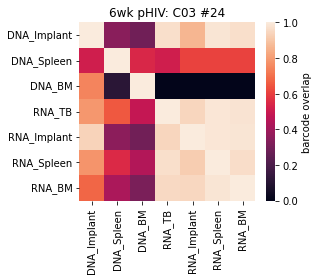

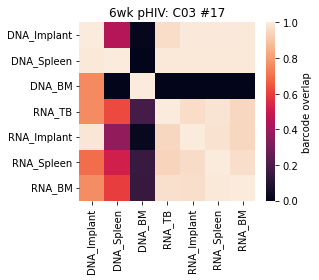

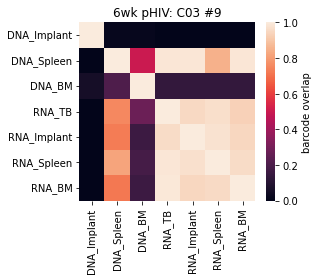

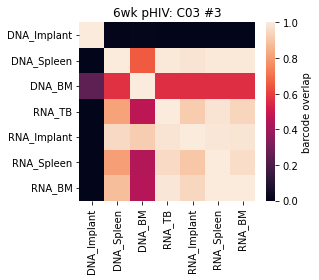

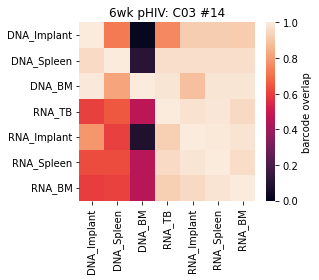

...

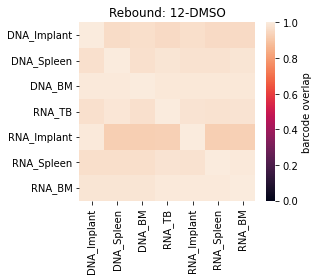

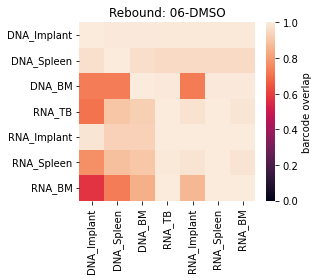

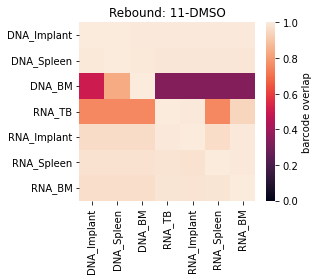

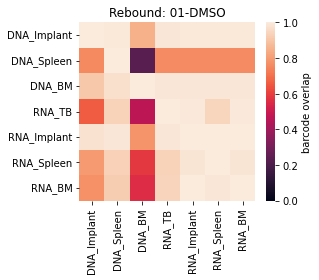

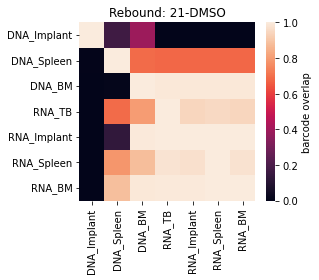

In [179]:
for time in ['6wk pHIV','Rebound']:
    for mouse in set(refdata[refdata['Timepoint']==time]['Mouse']):
        dnasamples = refdata[refdata['Mouse']==mouse]
        rnasamples = rnaref[rnaref['Mouse']==mouse]
        #tsamplelist = ['DNA_'+x for x in list(dnasamples['Organ'])]+list(['RNA_'+x for x in list(rnasamples['Organ'])])
        tsamplelist = ['DNA_Implant','DNA_Spleen','DNA_BM','RNA_TB','RNA_Implant','RNA_Spleen','RNA_BM']
        bcdict = {}
        for index,row in dnasamples.iterrows():
            UDP = row['UDP']
            if UDP not in bcdata:
                continue
            tdata = bcdata[UDP]
            organ = 'DNA_'+row['Organ']
            if len(tdata) == 0:
                continue
            bcdict[organ] = {}
            for i,r in tdata.iterrows():
                bc = r['truebc']
                if bc not in bcdict[organ]: bcdict[organ][bc] = 0
                bcdict[organ][bc] += r['UMI count']/sum(tdata['UMI count'])
        for index,row in rnasamples.iterrows():
            organ = 'RNA_'+row['Organ']
            tdata = rnadata[row['sample']]
            bcdict[organ] = {}
            for i,r in tdata.iterrows():
                bcdict[organ][i] = r['occurrence']/sum(tdata['occurrence'])
       
        bcovmat = np.zeros((len(tsamplelist),len(tsamplelist)))
        for i,sample1 in enumerate(tsamplelist):
            if sample1 in bcdict:
                for j,sample2 in enumerate(tsamplelist):
                    if sample2 in bcdict:
                        for bc in bcdict[sample2]:
                            if bc in bcdict[sample1]:
                                bcovmat[i,j] += bcdict[sample1][bc]
        plt.figure(figsize=(4.5,4))
        sns.heatmap(bcovmat,xticklabels=tsamplelist,yticklabels=tsamplelist,vmin=0,vmax=1,cbar_kws={'label':'barcode overlap'})
        plt.title(time+': '+mouse)
        plt.tight_layout()
        plt.savefig('figures/heatplot_barcode_similarity_'+mouse+'.svg')

In [180]:
#number(frequency) of proviral barcode being transcriptional active
def find_active_freq_local(x):
    if x not in bcdata: return np.nan
    bclist = list(set(bcdata[x]['truebc']))
    rnasample = rnaref[rnaref['UDP']==x]
    if len(rnasample) == 0: return np.nan
    rnasample = rnasample['sample'].iloc[0]
    tdata = rnadata[rnasample]
    return len([x for x in bclist if x in tdata.index])/len(bclist)

def find_active_freq_TB(x):
    if x not in bcdata: return np.nan
    bclist = list(set(bcdata[x]['truebc']))
    mouse = refdata[refdata['UDP']==x]['Mouse'].iloc[0]
    rnasample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']=='TB')]
    if len(rnasample) == 0: return np.nan
    rnasample = rnasample['sample'].iloc[0]
    tdata = rnadata[rnasample]
    return len([x for x in bclist if x in tdata.index])/len(bclist)
    
def find_active_freq_all(x):
    if x not in bcdata: return np.nan
    bclist = list(set(bcdata[x]['truebc']))
    mouse = refdata[refdata['UDP']==x]['Mouse'].iloc[0]
    rnasamples = rnaref[(rnaref['Mouse']==mouse)]
    if len(rnasamples) == 0: return np.nan
    tlist = []
    for i,r in rnasamples.iterrows():
        sample = r['sample']
        tlist.extend(list(rnadata[sample].index))
    tlist = list(set(tlist))
    return len([x for x in bclist if x in tlist])/len(bclist)

refdata['barcode active frequency (local RNA)'] = refdata['UDP'].apply(lambda x:find_active_freq_local(x))
refdata['barcode active frequency (TB RNA)'] = refdata['UDP'].apply(lambda x:find_active_freq_TB(x))
refdata['barcode active frequency (all RNA)'] = refdata['UDP'].apply(lambda x:find_active_freq_all(x))

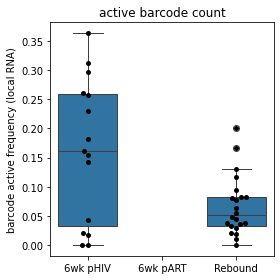

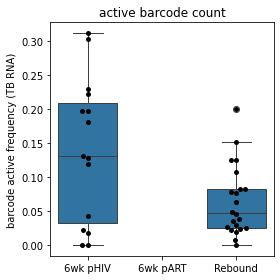

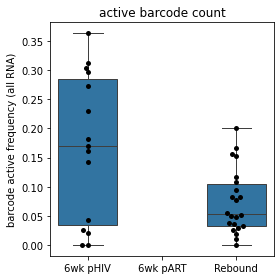

In [181]:
def draw_active_freq(title):
    plt.figure(figsize=(4,4))
    sns.boxplot(x=refdata['Timepoint'],y=refdata['barcode active frequency ('+title+')'],order=['6wk pHIV','6wk pART','Rebound'])
    sns.swarmplot(x=refdata['Timepoint'],y=refdata['barcode active frequency ('+title+')'],order=['6wk pHIV','6wk pART','Rebound'],color='black')
    plt.xlabel('')
    plt.title('active barcode count')
    plt.tight_layout()
    plt.savefig('figures/active_barcode_count'+title.replace(' ','_')+'.svg')

draw_active_freq('local RNA')
draw_active_freq('TB RNA')
draw_active_freq('all RNA')

In [182]:
def calc_active_bc(x):
    dnasamples = refdata[refdata['Mouse']==x]
    if len(dnasamples) == 0: return np.nan
    dnalist = []
    for i,r in dnasamples.iterrows():
        UDP = r['UDP']
        if UDP not in bcdata: continue
        dnalist.extend(list(bcdata[UDP]['truebc']))
    dnalist = list(set(dnalist))
    rnasamples = rnaref[rnaref['Mouse']==x]
    if len(rnasamples) == 0: return np.nan
    rnalist = []
    for i,r in rnasamples.iterrows():
        tdata = rnadata[r['sample']]
        rnalist.extend(list(tdata.index))
    rnalist = list(set(rnalist))
    return len([x for x in dnalist if x in rnalist])
        
def count_vRNA(x):
    rnasamples = rnaref[rnaref['Mouse']==x]
    if len(rnasamples) == 0: return np.nan
    rnalist = []
    for i,r in rnasamples.iterrows():
        tdata = rnadata[r['sample']]
        rnalist.extend(list(tdata.index))
    rnalist = list(set(rnalist))
    return len(rnalist)

mousedata['active proviral barcode count'] = mousedata['mouse'].apply(lambda x:calc_active_bc(x))
mousedata['vRNA barcode count'] = mousedata['mouse'].apply(lambda x:count_vRNA(x))

In [183]:
mouse_rnadata = {}
for mouse in mousedata['mouse']:
    tref = rnaref[rnaref['Mouse']==mouse]
    if len(tref) == 0: continue
    sample_count = 0
    for sample in tref['sample']:
        if sample in rnadata:
            sample_count += 1
            for bc,r in rnadata[sample].iterrows():
                if mouse not in mouse_rnadata: mouse_rnadata[mouse] = {}
                if bc not in mouse_rnadata[mouse]: mouse_rnadata[mouse][bc] = 0
                mouse_rnadata[mouse][bc] += r['occurrence']/sum(rnadata[sample]['occurrence'])
    for bc in mouse_rnadata[mouse]:
        mouse_rnadata[mouse][bc] /= sample_count

In [184]:
def calc_active_bc_total(x):
    dnasamples = refdata[refdata['Mouse']==x]
    if len(dnasamples) == 0: return np.nan
    dnalist = []
    for i,r in dnasamples.iterrows():
        UDP = r['UDP']
        if UDP not in bcdata: continue
        dnalist.extend(list(bcdata[UDP]['truebc']))
    dnalist = list(set(dnalist))
    if x not in mouse_rnadata: return np.nan
    rnalist = list(mouse_rnadata[x].keys())
    return len([x for x in dnalist if x in rnalist])

mousedata['active proviral barcode count(total)'] = mousedata['mouse'].apply(lambda x:calc_active_bc_total(x))

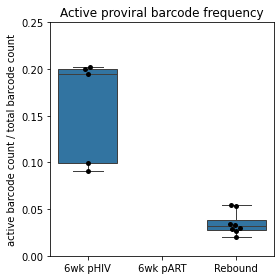

In [185]:
plt.figure(figsize=(4,4))
sns.boxplot(x=mousedata['Timepoint'],y=mousedata['active proviral barcode count']/mousedata['barcode count'],order=['6wk pHIV','6wk pART','Rebound'])
sns.swarmplot(x=mousedata['Timepoint'],y=mousedata['active proviral barcode count']/mousedata['barcode count'],order=['6wk pHIV','6wk pART','Rebound'],color='black')
plt.ylabel('active barcode count / total barcode count')
plt.xlabel('')
plt.ylim(0,0.25)
plt.title('Active proviral barcode frequency')
plt.tight_layout()
plt.savefig('figures/active_proviral_by_mouse.png')

In [186]:
mousedata.to_csv('per_mouse_summary_020723.csv')

In [187]:
tdata1 = mousedata[mousedata['Timepoint']=='6wk pHIV']
tdata2 = mousedata[mousedata['Timepoint']=='Rebound']
ss.ranksums(tdata1['active proviral barcode count']/tdata1['barcode count'],tdata2['active proviral barcode count']/tdata2['barcode count'])

RanksumsResult(statistic=2.9277002188455996, pvalue=0.0034147911781178164)

In [188]:
#similarity summary
#what is the most similar organ to TB?
targetsample = 'RNA_TB'
simidict = {}
for time in ['6wk pHIV','Rebound']:
    for mouse in set(refdata[refdata['Timepoint']==time]['Mouse']):
        simidict[mouse] = {}
        tsamplelist = ['DNA_Implant','DNA_Spleen','DNA_BM','RNA_TB','RNA_Implant','RNA_Spleen','RNA_BM']
        for sample in tsamplelist:
            if sample != targetsample:
                simidict[mouse][sample] = 0
        dnasamples = refdata[refdata['Mouse']==mouse]
        rnasamples = rnaref[rnaref['Mouse']==mouse]
        bcdict = {}
        for index,row in dnasamples.iterrows():
            UDP = row['UDP']
            if UDP not in bcdata:
                continue
            tdata = bcdata[UDP]
            organ = 'DNA_'+row['Organ']
            if len(tdata) == 0:
                continue
            for i,r in tdata.iterrows():
                bc = r['truebc']
                if bc not in bcdict:
                    bcdict[bc] = {}
                    for sample in tsamplelist:
                        bcdict[bc][sample] = 0
                bcdict[bc][organ] += r['UMI count']/sum(tdata['UMI count'])
        for index,row in rnasamples.iterrows():
            organ = 'RNA_'+row['Organ']
            tdata = rnadata[row['sample']]
            for i,r in tdata.iterrows():
                if i not in bcdict:
                    bcdict[i] = {}
                    for sample in tsamplelist:
                        bcdict[i][sample] = 0
                bcdict[i][organ] += r['occurrence']/sum(tdata['occurrence'])
        
        for sample in simidict[mouse]:
            tlist = []; slist = []
            for bc in bcdict:
                tlist.append(bcdict[bc][targetsample])
                slist.append(bcdict[bc][sample])
            simidict[mouse][sample] = ss.spearmanr(tlist,slist)[0]

In [189]:
simidata = pd.DataFrame(simidict).transpose()
simidata = pd.melt(simidata,var_name='Organ', value_name='similarity to TB',ignore_index=False)
simidata['Timepoint'] = simidata.index.map(lambda x:refdata[refdata['Mouse']==x]['Timepoint'].iloc[0])
simidata

,Organ,similarity to TB,Timepoint
C03 #24,DNA_Implant,0.124507,6wk pHIV
C03 #17,DNA_Implant,0.147139,6wk pHIV
C03 #9,DNA_Implant,-0.101393,6wk pHIV
C03 #3,DNA_Implant,-0.105018,6wk pHIV
C03 #14,DNA_Implant,0.036766,6wk pHIV
...,...,...,...
12-DMSO,RNA_BM,0.469516,Rebound
06-DMSO,RNA_BM,0.643585,Rebound
11-DMSO,RNA_BM,0.249330,Rebound
01-DMSO,RNA_BM,0.703121,Rebound


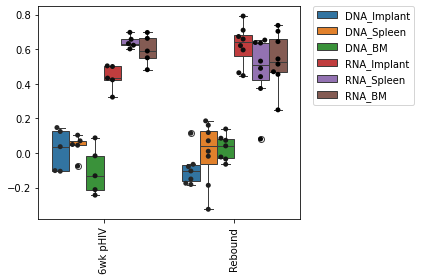

In [190]:
sns.boxplot(hue=list(simidata['Organ']),y=list(simidata['similarity to TB']),x=list(simidata['Timepoint']))
ax = sns.swarmplot(hue=list(simidata['Organ']),y=list(simidata['similarity to TB']),x=list(simidata['Timepoint']),color='black',dodge=True)
plt.xticks(rotation=90)
plt.xlabel('')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:6], labels[0:6], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.tight_layout()
plt.savefig('figures/similarity_to_TB.png')

In [191]:
tdata = simidata[(simidata['Timepoint']=='Rebound')&simidata['similarity to TB']]
for o1 in set(tdata['Organ']):
    for o2 in set(tdata['Organ']):
        if o1 != o2 and o1[:3] == o2[:3]:
            print(o1+' vs '+o2+', p='+str(ss.ranksums(tdata[tdata['Organ']==o1]['similarity to TB'],tdata[tdata['Organ']==o2]['similarity to TB'])))

DNA_BM vs DNA_Implant, p=RanksumsResult(statistic=2.3638432904997777, pvalue=0.018086461315687384)
DNA_BM vs DNA_Spleen, p=RanksumsResult(statistic=-0.23145502494313785, pvalue=0.8169613217153913)
DNA_Implant vs DNA_BM, p=RanksumsResult(statistic=-2.3638432904997777, pvalue=0.018086461315687384)
DNA_Implant vs DNA_Spleen, p=RanksumsResult(statistic=-1.273002637187258, pvalue=0.20301710604921375)
RNA_Spleen vs RNA_Implant, p=RanksumsResult(statistic=-1.6803361008336117, pvalue=0.09289194088370532)
RNA_Spleen vs RNA_BM, p=RanksumsResult(statistic=-0.7351470441147051, pvalue=0.4622499461255427)
DNA_Spleen vs DNA_BM, p=RanksumsResult(statistic=0.23145502494313785, pvalue=0.8169613217153913)
DNA_Spleen vs DNA_Implant, p=RanksumsResult(statistic=1.273002637187258, pvalue=0.20301710604921375)
RNA_Implant vs RNA_Spleen, p=RanksumsResult(statistic=1.6803361008336117, pvalue=0.09289194088370532)
RNA_Implant vs RNA_BM, p=RanksumsResult(statistic=0.8401680504168059, pvalue=0.40081416938293446)
RNA

In [192]:
#similarity to local RNA v.s. circulating RNA.
dnaorgans = ['Implant','Spleen','BM']
rnaorgans = ['TB','Implant','Spleen','BM']
labellist = []
for organ in dnaorgans:
    labellist.append(organ+'_local')
    labellist.append(organ+'_circulating')
samplelist = []
for organ in dnaorgans:
    samplelist.append('RNA_'+organ)
    samplelist.append('DNA_'+organ)
samplelist.append('RNA_TB')
simidict = {}
for time in ['6wk pHIV','Rebound']:
    for mouse in set(refdata[refdata['Timepoint']==time]['Mouse']):
        simidict[mouse] = {}
        for label in labellist:
            simidict[mouse][label] = 0
        bcdict = {}
        for organ in dnaorgans:
            UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]['UDP']
            if len(UDP) == 0: continue
            UDP = UDP.iloc[0]
            if UDP not in bcdata: continue
            tdata = bcdata[UDP]
            for i,r in tdata.iterrows():
                bc = r['truebc']
                if bc not in bcdict:
                    bcdict[bc] = {}
                    for sample in samplelist:
                        bcdict[bc][sample] = 0
                bcdict[bc]['DNA_'+organ] += r['UMI count']/sum(tdata['UMI count'])
        for organ in rnaorgans:
            sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==organ)]['sample'].iloc[0]
            tdata = rnadata[sample]
            for i,r in tdata.iterrows():
                if i not in bcdict:
                    bcdict[i] = {}
                    for tsample in samplelist:
                        bcdict[i][tsample] = 0
                bcdict[i]['RNA_'+organ] += r['occurrence']/sum(tdata['occurrence'])
        
        for organ in dnaorgans:
            tlist = []; slist = []
            for bc in bcdict:
                tlist.append(bcdict[bc]['RNA_'+organ])
                slist.append(bcdict[bc]['DNA_'+organ])
            simidict[mouse][organ+'_local'] = ss.spearmanr(tlist,slist)[0]
            tlist = []; slist = []
            for bc in bcdict:
                tlist.append(bcdict[bc]['RNA_TB'])
                slist.append(bcdict[bc]['DNA_'+organ])
            simidict[mouse][organ+'_circulating'] = ss.spearmanr(tlist,slist)[0]

In [193]:
simidata = pd.DataFrame(simidict).transpose()
simidata = pd.melt(simidata,var_name='label', value_name='Spearman\'s correlation',ignore_index=False)
simidata['Timepoint'] = simidata.index.map(lambda x:refdata[refdata['Mouse']==x]['Timepoint'].iloc[0])
simidata['Organ'] = simidata['label'].apply(lambda x:x.rsplit('_')[0])
simidata['Target'] = simidata['label'].apply(lambda x:x.rsplit('_')[1])
simidata

,label,Spearman's correlation,Timepoint,Organ,Target
C03 #24,Implant_local,0.004983,6wk pHIV,Implant,local
C03 #17,Implant_local,0.182245,6wk pHIV,Implant,local
C03 #9,Implant_local,-0.199525,6wk pHIV,Implant,local
C03 #3,Implant_local,-0.216758,6wk pHIV,Implant,local
C03 #14,Implant_local,-0.036495,6wk pHIV,Implant,local
...,...,...,...,...,...
12-DMSO,BM_circulating,-0.023030,Rebound,BM,circulating
06-DMSO,BM_circulating,0.085620,Rebound,BM,circulating
11-DMSO,BM_circulating,0.041244,Rebound,BM,circulating
01-DMSO,BM_circulating,0.073710,Rebound,BM,circulating


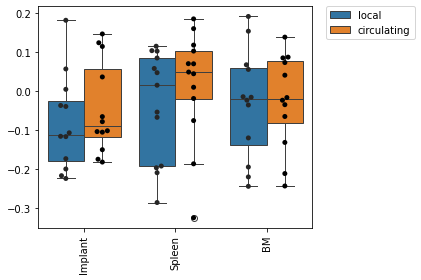

In [194]:
sns.boxplot(x=list(simidata['Organ']),y=list(simidata['Spearman\'s correlation']),hue=list(simidata['Target']))
ax = sns.swarmplot(x=list(simidata['Organ']),y=list(simidata['Spearman\'s correlation']),hue=list(simidata['Target']),color='black',dodge=True)
plt.xticks(rotation=90)
plt.xlabel('')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.tight_layout()

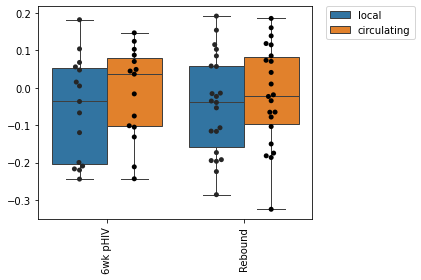

In [195]:
sns.boxplot(x=list(simidata['Timepoint']),y=list(simidata['Spearman\'s correlation']),hue=list(simidata['Target']))
ax = sns.swarmplot(x=list(simidata['Timepoint']),y=list(simidata['Spearman\'s correlation']),hue=list(simidata['Target']),color='black',dodge=True)
plt.xticks(rotation=90)
plt.xlabel('')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.tight_layout()

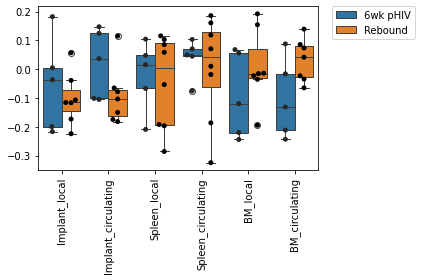

In [196]:
sns.boxplot(x=list(simidata['label']),y=list(simidata['Spearman\'s correlation']),hue=list(simidata['Timepoint']))
ax = sns.swarmplot(x=list(simidata['label']),y=list(simidata['Spearman\'s correlation']),hue=list(simidata['Timepoint']),color='black',dodge=True)
plt.xticks(rotation=90)
plt.xlabel('')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.tight_layout()

In [197]:
#print correlation between any two samples in each mouse
dnaorgans = ['Implant','Spleen','BM']
rnaorgans = ['TB','Implant','Spleen','BM']
samplelist = []
for organ in dnaorgans:
    samplelist.append('DNA_'+organ)
for organ in rnaorgans:
    samplelist.append('RNA_'+organ)
simidict = {}
ovdict = {}
for mouse in set(refdata[refdata['Timepoint']!='6wk pART']['Mouse']):
    simidict[mouse] = {}
    ovdict[mouse] = {}
    bcdict = {}
    for organ in dnaorgans:
        UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]['UDP']
        if len(UDP) == 0: continue
        UDP = UDP.iloc[0]
        if UDP not in bcdata: continue
        tdata = bcdata[UDP]
        for i,r in tdata.iterrows():
            bc = r['truebc']
            if bc not in bcdict:
                bcdict[bc] = {}
                for sample in samplelist:
                    bcdict[bc][sample] = 0
            bcdict[bc]['DNA_'+organ] += r['UMI count']/sum(tdata['UMI count'])
    rnatotal = {}
    for organ in rnaorgans:
        sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==organ)]['sample'].iloc[0]
        tdata = rnadata[sample]
        for i,r in tdata.iterrows():
            if i not in rnatotal:
                rnatotal[i] = 0
            rnatotal[i] += r['occurrence']/sum(tdata['occurrence'])
            if i not in bcdict:
                bcdict[i] = {}
                for sample in samplelist:
                    bcdict[i][sample] = 0
            bcdict[i]['RNA_'+organ] += r['occurrence']/sum(tdata['occurrence'])
    for i in rnatotal:
        bcdict[i]['RNA_total'] = rnatotal[i]/4
    for i in bcdict:
        if 'RNA_total' not in bcdict[i]:
            bcdict[i]['RNA_total'] = 0
        
    for s1 in samplelist+['RNA_total']:
        for s2 in samplelist+['RNA_total']:    
            tlist1 = []; tlist2 = []
            for bc in bcdict:
                tlist1.append(bcdict[bc][s1])
                tlist2.append(bcdict[bc][s2])
            simidict[mouse][s1+':'+s2] = ss.spearmanr(tlist1,tlist2)[0]
            ovfreq = 0
            for bc in bcdict:
                if bcdict[bc][s1] > 0 and bcdict[bc][s2] > 0:
                    ovfreq += bcdict[bc][s1]
            ovdict[mouse][s1+':'+s2] = ovfreq

In [198]:
def count_bc(x,s):
    mouse = x.name
    organ = x['Sample'+str(s)].rsplit('_')[1]
    if organ == 'total':
        return mousedata[mousedata['mouse']==mouse]['vRNA barcode count'].iloc[0]
    if 'DNA' in x['Sample'+str(s)]:
        tdata = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]
        if len(tdata) > 0:
            return tdata['barcode count'].iloc[0]
        else:
            return 0
    if 'RNA' in x['Sample'+str(s)]:
        sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==organ)]['sample'].iloc[0]
        return len(rnadata[sample])
    return 0

simidata = pd.DataFrame(simidict).transpose()
simidata = pd.melt(simidata,var_name='label', value_name='Spearman\'s correlation',ignore_index=False)
simidata['Sample1'] = simidata['label'].apply(lambda x:x.rsplit(':')[0])
simidata['Sample2'] = simidata['label'].apply(lambda x:x.rsplit(':')[1])
simidata['number of barcode in sample1'] = simidata.apply(lambda x:count_bc(x,1),axis=1)
simidata['number of barcode in sample2'] = simidata.apply(lambda x:count_bc(x,2),axis=1)
simidata.index.name='Mouse'
simidata.drop(columns=['label'],inplace=True)
simidata

,Spearman's correlation,Sample1,Sample2,number of barcode in sample1,number of barcode in sample2
Mouse,,,,,
23-DMSO,1.0,DNA_Implant,DNA_Implant,288.0,288.0
C03 #3,1.0,DNA_Implant,DNA_Implant,6.0,6.0
24-DMSO,1.0,DNA_Implant,DNA_Implant,230.0,230.0
03-DMSO,NaN,DNA_Implant,DNA_Implant,0.0,0.0
C03 #24,1.0,DNA_Implant,DNA_Implant,129.0,129.0
...,...,...,...,...,...
06-DMSO,1.0,RNA_total,RNA_total,38.0,38.0
11-DMSO,1.0,RNA_total,RNA_total,31.0,31.0
01-DMSO,1.0,RNA_total,RNA_total,27.0,27.0


In [199]:
def count_bc(x,s):
    mouse = x.name
    organ = x['Sample'+str(s)].rsplit('_')[1]
    if organ == 'total':
        return mousedata[mousedata['mouse']==mouse]['vRNA barcode count'].iloc[0]
    if 'DNA' in x['Sample'+str(s)]:
        tdata = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]
        if len(tdata) > 0:
            return tdata['barcode count'].iloc[0]
        else:
            return 0
    if 'RNA' in x['Sample'+str(s)]:
        sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==organ)]['sample'].iloc[0]
        return len(rnadata[sample])
    return 0
        
ovdata = pd.DataFrame(ovdict).transpose()
ovdata = pd.melt(ovdata,var_name='label', value_name='frequency of sample1 also observed in sample2',ignore_index=False)
ovdata['Sample1'] = ovdata['label'].apply(lambda x:x.rsplit(':')[0])
ovdata['Sample2'] = ovdata['label'].apply(lambda x:x.rsplit(':')[1])
ovdata.index.name='Mouse'
ovdata['number of barcode in sample1'] = ovdata.apply(lambda x:count_bc(x,1),axis=1)
ovdata['number of barcode in sample2'] = ovdata.apply(lambda x:count_bc(x,2),axis=1)
ovdata.drop(columns=['label'],inplace=True)
ovdata

,frequency of sample1 also observed in sample2,Sample1,Sample2,number of barcode in sample1,number of barcode in sample2
Mouse,,,,,
23-DMSO,1.0,DNA_Implant,DNA_Implant,288.0,288.0
C03 #3,1.0,DNA_Implant,DNA_Implant,6.0,6.0
24-DMSO,1.0,DNA_Implant,DNA_Implant,230.0,230.0
03-DMSO,0.0,DNA_Implant,DNA_Implant,0.0,0.0
C03 #24,1.0,DNA_Implant,DNA_Implant,129.0,129.0
...,...,...,...,...,...
06-DMSO,1.0,RNA_total,RNA_total,38.0,38.0
11-DMSO,1.0,RNA_total,RNA_total,31.0,31.0
01-DMSO,1.0,RNA_total,RNA_total,27.0,27.0


Text(0, 0.5, 'frequency overlap')

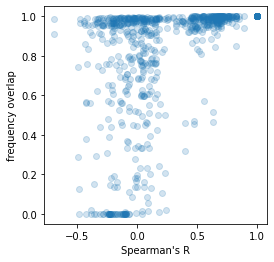

In [200]:
plt.figure(figsize=(4,4))
plt.scatter(simidata['Spearman\'s correlation'],ovdata['frequency of sample1 also observed in sample2'],alpha=0.2)
plt.xlabel('Spearman\'s R')
plt.ylabel('frequency overlap')

In [201]:
simidata.to_csv('Summary_organ_barcode_spearmanr.csv')

In [202]:
ovdata['Spearman\'s correlation'] = simidata['Spearman\'s correlation']
ovdata.to_csv('Summary_organ_barcode_overlap.csv')

In [203]:
ovdata['Mouse'] = ovdata.index
ovdata.index = range(len(ovdata))

In [204]:
def count_ov(x):
    s1 = x['Sample1']; s2 = x['Sample2']
    mouse = x['Mouse']
    o1 = s1.rsplit('_')[1]; o2 = s2.rsplit('_')[1]
    if o1 == 'total':
        if mouse in mouse_rnadata:
            bclist1 = list(mouse_rnadata[mouse].keys())
        else:
            bclist1 = []
    elif 'DNA' in s1:
        UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==o1)]['UDP']
        if len(UDP) == 0 or UDP.iloc[0] not in bcdata: return np.nan
        bclist1 = list(set(bcdata[UDP.iloc[0]]['truebc']))
    elif 'RNA' in s1:
        sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==o1)]['sample']
        if len(sample) == 0 or sample.iloc[0] not in rnadata: return np.nan
        bclist1 = list(set(rnadata[sample.iloc[0]].index))
    if o2 == 'total':
        if mouse in mouse_rnadata:
            bclist2 = list(mouse_rnadata[mouse].keys())
        else:
            bclist2 = []
    elif 'DNA' in s2:
        UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==o2)]['UDP']
        if len(UDP) == 0 or UDP.iloc[0] not in bcdata: return np.nan
        bclist2 = list(set(bcdata[UDP.iloc[0]]['truebc']))
    elif 'RNA' in s2:
        sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==o2)]['sample']
        if len(sample) == 0 or sample.iloc[0] not in rnadata: return np.nan
        bclist2 = list(set(rnadata[sample.iloc[0]].index))
    return len([x for x in bclist1 if x in bclist2])

ovdata['overlap barcode count'] = ovdata.apply(lambda x:count_ov(x),axis=1)
ovdata['Timepoint'] = ovdata['Mouse'].apply(lambda x:refdata[refdata['Mouse']==x]['Timepoint'].iloc[0])
ovdata

,frequency of sample1 also observed in sample2,Sample1,Sample2,number of barcode in sample1,number of barcode in sample2,Spearman's correlation,Mouse,overlap barcode count,Timepoint
0,1.0,DNA_Implant,DNA_Implant,288.0,288.0,1.0,23-DMSO,288.0,Rebound
1,1.0,DNA_Implant,DNA_Implant,6.0,6.0,1.0,C03 #3,6.0,6wk pHIV
2,1.0,DNA_Implant,DNA_Implant,230.0,230.0,1.0,24-DMSO,230.0,Rebound
3,0.0,DNA_Implant,DNA_Implant,0.0,0.0,NaN,03-DMSO,NaN,Rebound
4,1.0,DNA_Implant,DNA_Implant,129.0,129.0,1.0,C03 #24,129.0,6wk pHIV
...,...,...,...,...,...,...,...,...,...
827,1.0,RNA_total,RNA_total,38.0,38.0,1.0,06-DMSO,38.0,Rebound
828,1.0,RNA_total,RNA_total,31.0,31.0,1.0,11-DMSO,31.0,Rebound
829,1.0,RNA_total,RNA_total,27.0,27.0,1.0,01-DMSO,27.0,Rebound
830,1.0,RNA_total,RNA_total,205.0,205.0,1.0,C03 #9,205.0,6wk pHIV


In [205]:
ovdata.to_csv('Summary_organ_barcode_overlap.csv')

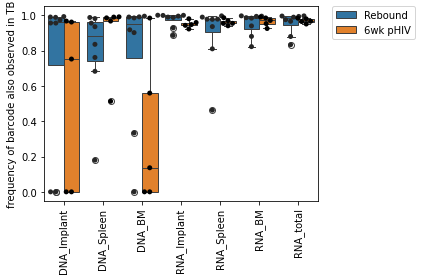

In [206]:
tdata = ovdata[(ovdata['Sample2']=='RNA_TB')&(ovdata['Sample1']!='RNA_TB')]
sns.boxplot(x=tdata['Sample1'],y=tdata['frequency of sample1 also observed in sample2'],hue=tdata['Timepoint'])
ax = sns.swarmplot(x=tdata['Sample1'],y=tdata['frequency of sample1 also observed in sample2'],hue=tdata['Timepoint'],color='black',dodge=True)
plt.xticks(rotation=90)
plt.xlabel('')
plt.ylabel('frequency of barcode also observed in TB')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.tight_layout()
plt.savefig('figures/overlap_freq_to_TB.svg')

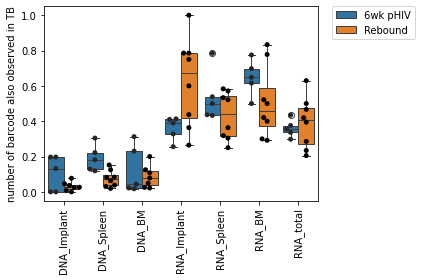

In [207]:
tdata = ovdata[(ovdata['Sample2']=='RNA_TB')&(ovdata['Sample1']!='RNA_TB')]
sns.boxplot(x=tdata['Sample1'],y=tdata['overlap barcode count']/tdata['number of barcode in sample1'],hue=tdata['Timepoint'],hue_order=['6wk pHIV','Rebound'])
ax = sns.swarmplot(x=tdata['Sample1'],y=tdata['overlap barcode count']/tdata['number of barcode in sample1'],hue=tdata['Timepoint'],hue_order=['6wk pHIV','Rebound'],color='black',dodge=True)
plt.xticks(rotation=90)
plt.xlabel('')
plt.ylabel('number of barcode also observed in TB')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.tight_layout()
plt.savefig('figures/overlap_count_to_TB.png')

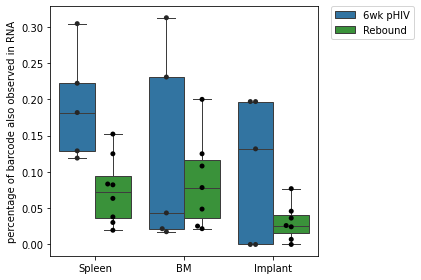

In [208]:
tdata = ovdata[(ovdata['Sample2']=='RNA_TB')&(~ovdata['Sample1'].str.contains('RNA'))]
organlist = ['Spleen','BM','Implant']
xorder = ['DNA_'+x for x in organlist]
my_pal = {'6wk pHIV':plt.cm.tab10(0),'Rebound':plt.cm.tab10(2)}
sns.boxplot(x=tdata['Sample1'],y=tdata['overlap barcode count']/tdata['number of barcode in sample1'],hue=tdata['Timepoint'],hue_order=['6wk pHIV','Rebound'],order=xorder,palette=my_pal)
ax = sns.swarmplot(x=tdata['Sample1'],y=tdata['overlap barcode count']/tdata['number of barcode in sample1'],hue=tdata['Timepoint'],hue_order=['6wk pHIV','Rebound'],color='black',dodge=True,order=xorder)
plt.xticks(labels=organlist,ticks=range(3))
plt.xlabel('')
plt.ylabel('percentage of barcode also observed in RNA')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.tight_layout()
plt.savefig('figures/overlap_count_DNA_to_TB.png')

In [209]:
def test_active(o):
    tdata = ovdata[(ovdata['Sample2']=='RNA_TB')&(ovdata['Sample1']!='RNA_TB')]
    tdata = tdata[tdata['Sample1']=='DNA_'+o]
    tdata1 = tdata[(tdata['Timepoint']=='6wk pHIV')]
    tdata2 = tdata[(tdata['Timepoint']=='Rebound')]
    W,p = ss.ranksums(tdata1['overlap barcode count']/tdata1['number of barcode in sample1'],tdata2['overlap barcode count']/tdata2['number of barcode in sample1'],nan_policy='omit')
    print(o,'6wk pHIV vs Rebound','p=',p)
    

test_active('Implant')
test_active('Spleen')
test_active('BM')

Implant 6wk pHIV vs Rebound p= 0.4649024545473547
Spleen 6wk pHIV vs Rebound p= 0.01282669364548545
BM 6wk pHIV vs Rebound p= 0.8709911947974633


In [210]:
#overlap: local RNA v.s circulating RNA.
dnaorgans = ['Implant','Spleen','BM']
rnaorgans = ['TB','Implant','Spleen','BM']
labellist = []
for organ in dnaorgans:
    labellist.append(organ+'_local')
    labellist.append(organ+'_circulating')
samplelist = []
for organ in dnaorgans:
    samplelist.append('RNA_'+organ)
    samplelist.append('DNA_'+organ)
samplelist.append('RNA_TB')
samplelist.append('RNA_all')
ovdict = {}
for time in ['6wk pHIV','Rebound']:
    for mouse in set(refdata[refdata['Timepoint']==time]['Mouse']):
        ovdict[mouse] = {}
        for label in labellist:
            ovdict[mouse][label] = 0
        bcdict = {}
        for organ in dnaorgans:
            UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]['UDP']
            if len(UDP) == 0: continue
            UDP = UDP.iloc[0]
            if UDP not in bcdata: continue
            tdata = bcdata[UDP]
            for i,r in tdata.iterrows():
                bc = r['truebc']
                if bc not in bcdict:
                    bcdict[bc] = {}
                    for sample in samplelist:
                        bcdict[bc][sample] = 0
                bcdict[bc]['DNA_'+organ] += r['UMI count']/sum(tdata['UMI count'])
        for organ in rnaorgans:
            sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==organ)]['sample'].iloc[0]
            tdata = rnadata[sample]
            for i,r in tdata.iterrows():
                if i not in bcdict:
                    bcdict[i] = {}
                    for tsample in samplelist:
                        bcdict[i][tsample] = 0
                bcdict[i]['RNA_'+organ] += r['occurrence']/sum(tdata['occurrence'])
                bcdict[i]['RNA_all'] += r['occurrence']/sum(tdata['occurrence'])
        
        for organ in dnaorgans:
            tlist = []; slist = []
            for bc in bcdict:
                if bcdict[bc]['RNA_'+organ] > 0 and bcdict[bc]['DNA_'+organ] > 0:
                    ovdict[mouse][organ+'_local'] += bcdict[bc]['DNA_'+organ]
            tlist = []; slist = []
            for bc in bcdict:
                if bcdict[bc]['RNA_all'] > 0 and bcdict[bc]['DNA_'+organ] > 0:
                    ovdict[mouse][organ+'_circulating'] += bcdict[bc]['DNA_'+organ]

In [211]:
simidata = pd.DataFrame(ovdict).transpose()
simidata = pd.melt(simidata,var_name='label', value_name='active provirus frequency',ignore_index=False)
simidata['Timepoint'] = simidata.index.map(lambda x:refdata[refdata['Mouse']==x]['Timepoint'].iloc[0])
simidata['Organ'] = simidata['label'].apply(lambda x:x.rsplit('_')[0])
simidata['Target'] = simidata['label'].apply(lambda x:x.rsplit('_')[1])
simidata

,label,active provirus frequency,Timepoint,Organ,Target
C03 #24,Implant_local,0.861866,6wk pHIV,Implant,local
C03 #17,Implant_local,0.995730,6wk pHIV,Implant,local
C03 #9,Implant_local,0.000000,6wk pHIV,Implant,local
C03 #3,Implant_local,0.000000,6wk pHIV,Implant,local
C03 #14,Implant_local,0.920841,6wk pHIV,Implant,local
...,...,...,...,...,...
12-DMSO,BM_circulating,0.990150,Rebound,BM,circulating
06-DMSO,BM_circulating,0.994597,Rebound,BM,circulating
11-DMSO,BM_circulating,0.333333,Rebound,BM,circulating
01-DMSO,BM_circulating,0.987186,Rebound,BM,circulating


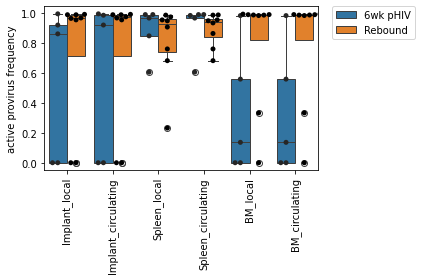

In [212]:
sns.boxplot(x=simidata['label'],y=simidata['active provirus frequency'],hue=simidata['Timepoint'])
ax = sns.swarmplot(x=list(simidata['label']),y=list(simidata['active provirus frequency']),hue=list(simidata['Timepoint']),color='black',dodge=True)
plt.xticks(rotation=90)
plt.xlabel('')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.tight_layout()
plt.savefig('figures/local_to_circulating_active_freq.png')

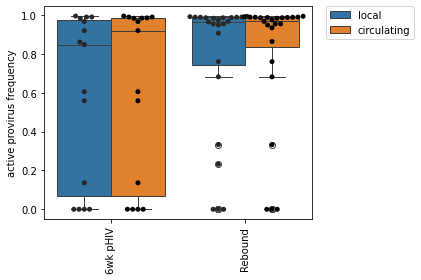

In [213]:
sns.boxplot(x=simidata['Timepoint'],y=simidata['active provirus frequency'],hue=simidata['Target'])
ax = sns.swarmplot(x=list(simidata['Timepoint']),y=list(simidata['active provirus frequency']),hue=list(simidata['Target']),color='black',dodge=True)
plt.xticks(rotation=90)
plt.xlabel('')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.tight_layout()

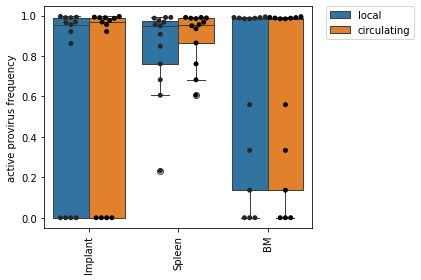

In [214]:
sns.boxplot(x=simidata['Organ'],y=simidata['active provirus frequency'],hue=simidata['Target'])
ax = sns.swarmplot(x=list(simidata['Organ']),y=list(simidata['active provirus frequency']),hue=list(simidata['Target']),color='black',dodge=True)
plt.xticks(rotation=90)
plt.xlabel('')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.tight_layout()

In [215]:
#overlap: local RNA v.s circulating RNA.
dnaorgans = ['Implant','Spleen','BM']
rnaorgans = ['TB','Implant','Spleen','BM']
labellist = []
for organ in dnaorgans:
    labellist.append(organ+'_local')
    labellist.append(organ+'_circulating')
samplelist = []
for organ in dnaorgans:
    samplelist.append('RNA_'+organ)
    samplelist.append('DNA_'+organ)
samplelist.append('RNA_TB')
samplelist.append('RNA_all')
ovdict = {}
for time in ['6wk pHIV','Rebound']:
    for mouse in set(refdata[refdata['Timepoint']==time]['Mouse']):
        ovdict[mouse] = {}
        for label in labellist:
            ovdict[mouse][label] = 0
        bcdict = {}
        for organ in dnaorgans:
            UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]['UDP']
            if len(UDP) == 0: continue
            UDP = UDP.iloc[0]
            if UDP not in bcdata: continue
            tdata = bcdata[UDP]
            for i,r in tdata.iterrows():
                bc = r['truebc']
                if bc not in bcdict:
                    bcdict[bc] = {}
                    for sample in samplelist:
                        bcdict[bc][sample] = 0
                bcdict[bc]['DNA_'+organ] += r['UMI count']/sum(tdata['UMI count'])
        for organ in rnaorgans:
            sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==organ)]['sample'].iloc[0]
            tdata = rnadata[sample]
            for i,r in tdata.iterrows():
                if i not in bcdict:
                    bcdict[i] = {}
                    for tsample in samplelist:
                        bcdict[i][tsample] = 0
                bcdict[i]['RNA_'+organ] += r['occurrence']/sum(tdata['occurrence'])
                bcdict[i]['RNA_all'] += r['occurrence']/sum(tdata['occurrence'])
        
        for organ in dnaorgans:
            tlist = []; slist = []
            for bc in bcdict:
                if bcdict[bc]['RNA_'+organ] > 0 and bcdict[bc]['DNA_'+organ] > 0:
                    ovdict[mouse][organ+'_local'] += 1
            tlist = []; slist = []
            for bc in bcdict:
                if bcdict[bc]['RNA_all'] > 0 and bcdict[bc]['DNA_'+organ] > 0:
                    ovdict[mouse][organ+'_circulating'] += 1
                    
def count_freq_active(x):
    count = refdata[(refdata['Organ']==x['Organ'])&(refdata['Mouse']==x.name)]['barcode count'].iloc[0]
    return x['active provirus count']/count
    
tdata = pd.DataFrame(ovdict).transpose()
tdata = pd.melt(tdata,var_name='label', value_name='active provirus count',ignore_index=False)
simidata['active provirus count'] = tdata['active provirus count']
simidata['active provirus count freq'] = simidata.apply(lambda x:count_freq_active(x),axis=1)
simidata

,label,active provirus frequency,Timepoint,Organ,Target,active provirus count,active provirus count freq
C03 #24,Implant_local,0.861866,6wk pHIV,Implant,local,20,0.155039
C03 #17,Implant_local,0.995730,6wk pHIV,Implant,local,24,0.363636
C03 #9,Implant_local,0.000000,6wk pHIV,Implant,local,0,0.000000
C03 #3,Implant_local,0.000000,6wk pHIV,Implant,local,0,0.000000
C03 #14,Implant_local,0.920841,6wk pHIV,Implant,local,17,0.257576
...,...,...,...,...,...,...,...
12-DMSO,BM_circulating,0.990150,Rebound,BM,circulating,3,0.032609
06-DMSO,BM_circulating,0.994597,Rebound,BM,circulating,4,0.108108
11-DMSO,BM_circulating,0.333333,Rebound,BM,circulating,1,0.200000
01-DMSO,BM_circulating,0.987186,Rebound,BM,circulating,4,0.166667


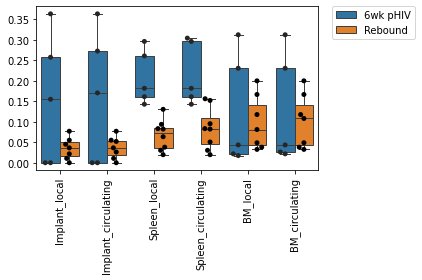

In [216]:
sns.boxplot(x=list(simidata['label']),y=list(simidata['active provirus count freq']),hue=list(simidata['Timepoint']))
ax = sns.swarmplot(x=list(simidata['label']),y=list(simidata['active provirus count freq']),hue=list(simidata['Timepoint']),color='black',dodge=True)
plt.xticks(rotation=90)
plt.xlabel('')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.tight_layout()
plt.savefig('figures/local_to_circulating_active_count.png')

In [217]:
#IS correlation among organs
dnaorgans = ['Implant','Spleen','BM']
samplelist = []
for organ in dnaorgans:
    samplelist.append('DNA_'+organ)
simidict = {}
ovdict = {}
for mouse in set(refdata['Mouse']):
    simidict[mouse] = {}
    ovdict[mouse] = {}
    ISdict = {}
    for organ in dnaorgans:
        UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]['UDP']
        if len(UDP) == 0: continue
        UDP = UDP.iloc[0]
        if UDP not in bcdata: continue
        tdata = bcdata[UDP][bcdata[UDP]['annotation'].str.contains('chr')]
        for i,r in tdata.iterrows():
            IS = r['annotation']
            if IS not in ISdict:
                ISdict[IS] = {}
                for sample in samplelist:
                    ISdict[IS][sample] = 0
            ISdict[IS]['DNA_'+organ] += r['UMI count']/sum(tdata['UMI count'])
        
    for s1 in samplelist:
        for s2 in samplelist:    
            tlist1 = []; tlist2 = []
            for IS in ISdict:
                if ISdict[IS][s1] > 0 and ISdict[IS][s2] > 0:
                    tlist1.append(ISdict[IS][s1])
                    tlist2.append(ISdict[IS][s2])
            simidict[mouse][s1+':'+s2] = ss.spearmanr(tlist1,tlist2)[0]
            ovfreq = 0
            for IS in ISdict:
                if ISdict[IS][s1] > 0 and ISdict[IS][s2] > 0:
                    ovfreq += ISdict[IS][s1]
            ovdict[mouse][s1+':'+s2] = ovfreq

In [218]:
def count_IS(x,s):
    mouse = x.name 
    organ = x['Sample'+str(s)].rsplit('_')[1]
    tdata = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]
    if len(tdata) > 0:
        UDP = tdata['UDP'].iloc[0]
    else:
        return 0
    if UDP in bcdata:
        return len(set(bcdata[UDP][bcdata[UDP]['annotation'].str.contains('chr')]['annotation']))
    else:
        return 0  


ISsimidata = pd.DataFrame(simidict).transpose()
ISsimidata = pd.melt(ISsimidata,var_name='label', value_name='Spearman\'s correlation',ignore_index=False)
ISsimidata['Sample1'] = ISsimidata['label'].apply(lambda x:x.rsplit(':')[0])
ISsimidata['Sample2'] = ISsimidata['label'].apply(lambda x:x.rsplit(':')[1])
ISsimidata['number of IS in sample1'] = ISsimidata.apply(lambda x:count_IS(x,1),axis=1)
ISsimidata['number of IS in sample2'] = ISsimidata.apply(lambda x:count_IS(x,2),axis=1)
ISsimidata.index.name='Mouse'
ISsimidata.drop(columns=['label'],inplace=True)

ISovdata = pd.DataFrame(ovdict).transpose()
ISovdata = pd.melt(ISovdata,var_name='label', value_name='frequency of sample1 also observed in sample2',ignore_index=False)
ISovdata['Sample1'] = ISovdata['label'].apply(lambda x:x.rsplit(':')[0])
ISovdata['Sample2'] = ISovdata['label'].apply(lambda x:x.rsplit(':')[1])
ISovdata.index.name='Mouse'
ISovdata['number of IS in sample1'] = ISovdata.apply(lambda x:count_IS(x,1),axis=1)
ISovdata['number of IS in sample2'] = ISovdata.apply(lambda x:count_IS(x,2),axis=1)
ISovdata.drop(columns=['label'],inplace=True)
ISovdata['Spearman\'s correlation'] = ISsimidata['Spearman\'s correlation']
ISovdata

,frequency of sample1 also observed in sample2,Sample1,Sample2,number of IS in sample1,number of IS in sample2,Spearman's correlation
Mouse,,,,,,
24-DMSO,1.0,DNA_Implant,DNA_Implant,17,17,NaN
03-DMSO,0.0,DNA_Implant,DNA_Implant,0,0,NaN
C03 #22,1.0,DNA_Implant,DNA_Implant,52,52,1.0
C03 #9,1.0,DNA_Implant,DNA_Implant,34,34,1.0
C03 #19,1.0,DNA_Implant,DNA_Implant,5,5,NaN
...,...,...,...,...,...,...
C03 #24,1.0,DNA_BM,DNA_BM,56,56,1.0
JCMM30C-5,1.0,DNA_BM,DNA_BM,76,76,1.0
01-DMSO,1.0,DNA_BM,DNA_BM,663,663,1.0


In [219]:
ISovdata['Timepoint'] = ISovdata.index.map(lambda x:refdata[refdata['Mouse']==x]['Timepoint'].iloc[0])

In [220]:
IS

'chr3:152288619:-'

In [221]:
ISovdata.to_csv('IS_overlap_and_spearmanr(only_shared)_among_organs.csv')

#### Defective IS analysis

In [222]:
combineIS['truebc'] = combineIS['barcode'].apply(lambda x:strip_bc(x))
combineIS

,Integration site,UMI count,Mouse,sample name,Timepoint,UDP,barcode,Organ,mapping length,truebc
0,chr2:85708835:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,18.0,GCCTCCCTCTACGTCGTCTAC
1,chr5:168423417:-,4,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,96.5,GCCTCCCTCTACGTCGTCTAC
2,chr11:34258609:+,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,129.0,GCCTCCCTCTACGTCGTCTAC
3,chr1:48676335:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,129.0,GCCTCCCTCTACGTCGTCTAC
4,chr4:2695114:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,127.0,GCCTCCCTCTACGTCGTCTAC
...,...,...,...,...,...,...,...,...,...,...
15300,chr1:228648975:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGTGGGGGTAGACGGAGAGGTGGTTGATGTTTTATAG,Implant,35.0,AACATCAACCACCTCTCCGTCTACCCCCAC
15301,chr14:90787111:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGCCGGTGGAGATGCAGCGGAATTATAG,Implant,18.0,TTCCGCTGCATCTCCACCGGC
15302,chr5:176462542:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGAAGAGGTAGTCGCAGAGGAATTATAG,Implant,129.0,TTCCTCTGCGACTACCTCTTC
15303,chr11:76699025:-,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGACGCAGGGGCAGTCGGCGCTTTATAG,Implant,129.0,AGCGCCGACTGCCCCTGCGTC


In [223]:
def find_transcription(x):
    UDP = x['UDP']
    bc = x['truebc']
    sample = rnaref[rnaref['UDP']==UDP]['sample']
    if len(sample) == 0:
        return 0
    else:
        sample = sample.iloc[0]
    if bc in rnadata[sample].index:
        return rnadata[sample].loc[bc,'occurrence']/sum(rnadata[sample]['occurrence'])
    else:
        return 0
    
combineIS['transcription'] = combineIS.apply(lambda x:find_transcription(x),axis=1)

In [224]:
def find_mean_RNA(x):
    mouse = x['Mouse']
    bc = x['truebc']
    samples = rnaref[rnaref['Mouse']==mouse]['sample']
    if len(samples) == 0:
        return 0
    else:
        explist = []
        for sample in samples:
            if bc in rnadata[sample].index:
                exp = rnadata[sample].loc[bc,'occurrence']/sum(rnadata[sample]['occurrence'])
                explist.append(exp)
            else:
                explist.append(0)
        return sum(explist)/len(explist)
    
    
def find_TB_RNA(x):
    mouse = x['Mouse']
    bc = x['truebc']
    samples = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']=='TB')]['sample']
    if len(samples) == 0:
        return 0
    else:
        sample = samples.iloc[0]
        if bc in rnadata[sample].index:
            return rnadata[sample].loc[bc,'occurrence']/sum(rnadata[sample]['occurrence'])
        else:
            return 0
        
combineIS['transcription 4-organ mean'] = combineIS.apply(lambda x:find_mean_RNA(x),axis=1)
combineIS['transcription TB'] = combineIS.apply(lambda x:find_TB_RNA(x),axis=1)

In [225]:
def norm_UMI(x):
    UDP = x['UDP']
    depth = sum(combineIS[combineIS['UDP']==UDP]['UMI count'])
    return x['UMI count']/depth

combineIS['UMI normalized'] = combineIS.apply(lambda x:norm_UMI(x),axis=1)
combineIS

,Integration site,UMI count,Mouse,sample name,Timepoint,UDP,barcode,Organ,mapping length,truebc,transcription,transcription 4-organ mean,transcription TB,UMI normalized
0,chr2:85708835:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,18.0,GCCTCCCTCTACGTCGTCTAC,0.069424,0.076087,0.064383,0.004762
1,chr5:168423417:-,4,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,96.5,GCCTCCCTCTACGTCGTCTAC,0.069424,0.076087,0.064383,0.019048
2,chr11:34258609:+,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,129.0,GCCTCCCTCTACGTCGTCTAC,0.069424,0.076087,0.064383,0.004762
3,chr1:48676335:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,129.0,GCCTCCCTCTACGTCGTCTAC,0.069424,0.076087,0.064383,0.004762
4,chr4:2695114:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,127.0,GCCTCCCTCTACGTCGTCTAC,0.069424,0.076087,0.064383,0.004762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15300,chr1:228648975:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGTGGGGGTAGACGGAGAGGTGGTTGATGTTTTATAG,Implant,35.0,AACATCAACCACCTCTCCGTCTACCCCCAC,0.000000,0.000000,0.000000,0.005747
15301,chr14:90787111:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGCCGGTGGAGATGCAGCGGAATTATAG,Implant,18.0,TTCCGCTGCATCTCCACCGGC,0.000000,0.000000,0.000000,0.005747
15302,chr5:176462542:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGAAGAGGTAGTCGCAGAGGAATTATAG,Implant,129.0,TTCCTCTGCGACTACCTCTTC,0.000000,0.000000,0.000000,0.005747
15303,chr11:76699025:-,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGACGCAGGGGCAGTCGGCGCTTTATAG,Implant,129.0,AGCGCCGACTGCCCCTGCGTC,0.000000,0.000000,0.000000,0.005747


In [226]:
combineIS.to_csv('per_IS_summary_lite_050823.csv')

In [227]:
#frequency of defective particles in each type of provirus
def typing_DNA(x):
    if 'chr' in x:
        return 'integrated'
    elif 'BCNFNSX' in x:
        return 'auto-integrated'
    else:
        return x
    
for UDP in bcdata:
    bcdata[UDP]['provirus type'] = bcdata[UDP]['annotation'].apply(lambda x:typing_DNA(x))

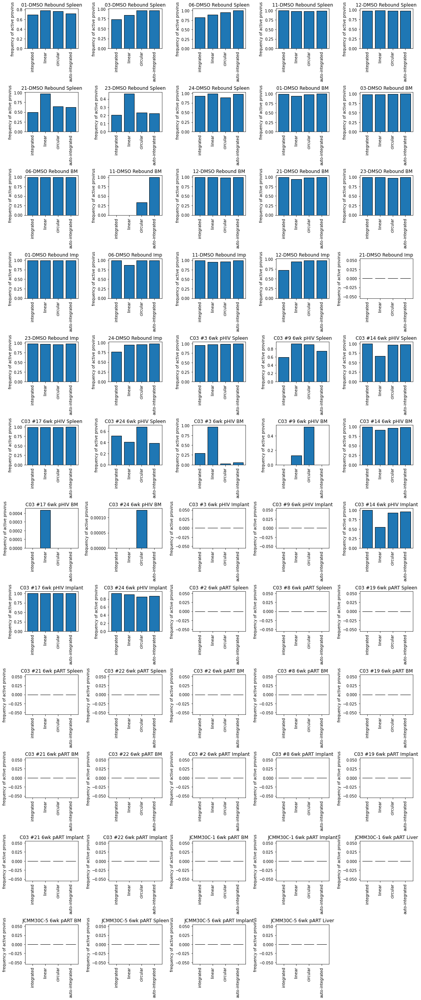

In [228]:
plt.figure(figsize=(15,36))
ploti = 0
activedict = {}
for UDP in bcdata:
    sample = refdata[refdata['UDP']==UDP]['sample name'].iloc[0]
    ylist = []
    activedict[UDP] = {}
    for ptype in typelist:
        tdata = bcdata[UDP]
        tdata = tdata[(tdata['provirus type']==ptype)]
        if len(tdata) == 0:
            ylist.append(0)
            activedict[UDP][ptype] = 0
            continue
        depth = sum(tdata['UMI count'])
        freq = sum(tdata[(tdata['transcription']>0)]['UMI count']) / depth
        ylist.append(freq)
        activedict[UDP][ptype] = freq
    ploti += 1
    plt.subplot(12,5,ploti)
    plt.bar(typelist,ylist,edgecolor='black')
    plt.ylabel('frequency of active provirus')
    plt.xticks(rotation=90)
    plt.title(sample)
plt.tight_layout()

In [229]:
freqdata = pd.DataFrame(activedict).transpose()
freqdata = pd.melt(freqdata,var_name='provirus type', value_name='active frequency',ignore_index=False)
freqdata['Timepoint'] = freqdata.index.map(lambda x:refdata[refdata['UDP']==x]['Timepoint'].iloc[0])
freqdata['Organ'] = freqdata.index.map(lambda x:refdata[refdata['UDP']==x]['Organ'].iloc[0])
freqdata['label'] = freqdata.apply(lambda x:x['Organ']+'_'+x['provirus type'],axis=1)
freqdata

,provirus type,active frequency,Timepoint,Organ,label
UDP01,integrated,0.695238,Rebound,Spleen,Spleen_integrated
UDP02,integrated,0.730159,Rebound,Spleen,Spleen_integrated
UDP03,integrated,0.823529,Rebound,Spleen,Spleen_integrated
UDP04,integrated,0.994554,Rebound,Spleen,Spleen_integrated
UDP05,integrated,0.978495,Rebound,Spleen,Spleen_integrated
...,...,...,...,...,...
UDP28,auto-integrated,0.000000,6wk pART,Liver,Liver_auto-integrated
UDP29,auto-integrated,0.000000,6wk pART,BM,BM_auto-integrated
UDP30,auto-integrated,0.000000,6wk pART,Spleen,Spleen_auto-integrated
UDP31,auto-integrated,0.000000,6wk pART,Implant,Implant_auto-integrated


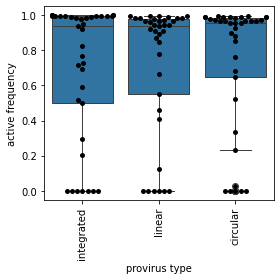

In [230]:
plt.figure(figsize=(4,4))
tdata = freqdata[(freqdata['Timepoint']!='6wk pART')&(freqdata['provirus type']!='auto-integrated')]
sns.boxplot(x=tdata['provirus type'],y=tdata['active frequency'])
sns.swarmplot(x=tdata['provirus type'],y=tdata['active frequency'],color='black')
plt.xticks(rotation=90)
plt.tight_layout()

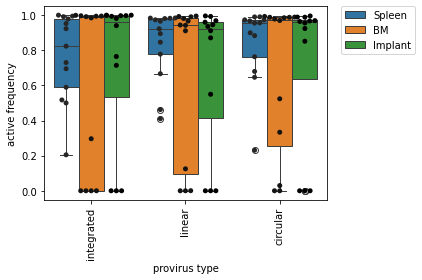

In [231]:
plt.figure(figsize=(6,4))
tdata = freqdata[(freqdata['Timepoint']!='6wk pART')&(freqdata['provirus type']!='auto-integrated')]
sns.boxplot(x=tdata['provirus type'],y=tdata['active frequency'],hue=tdata['Organ'])
ax = sns.swarmplot(x=tdata['provirus type'],y=tdata['active frequency'],color='black',hue=tdata['Organ'],dodge=True)
plt.xticks(rotation=90)
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:3], labels[0:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.tight_layout()

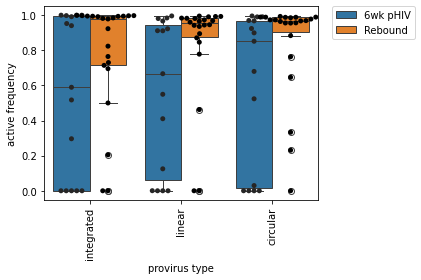

In [232]:
plt.figure(figsize=(6,4))
tdata = freqdata[(freqdata['Timepoint']!='6wk pART')&(freqdata['provirus type']!='auto-integrated')]
sns.boxplot(x=tdata['provirus type'],y=tdata['active frequency'],hue=tdata['Timepoint'],hue_order=['6wk pHIV','Rebound'])
ax = sns.swarmplot(x=tdata['provirus type'],y=tdata['active frequency'],color='black',hue=tdata['Timepoint'],dodge=True,hue_order=['6wk pHIV','Rebound'])
plt.xticks(rotation=90)
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.tight_layout()

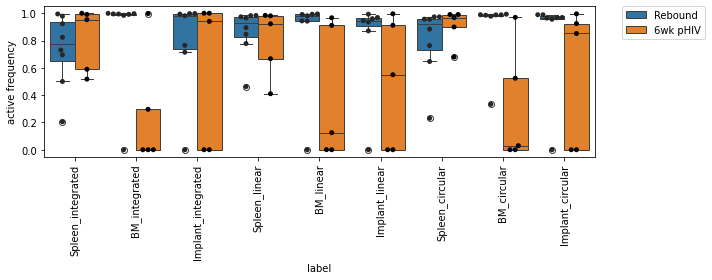

In [233]:
plt.figure(figsize=(10,4))
tdata = freqdata[(freqdata['Timepoint']!='6wk pART')&(freqdata['provirus type']!='auto-integrated')]
sns.boxplot(x=tdata['label'],y=tdata['active frequency'],hue=tdata['Timepoint'])
ax = sns.swarmplot(x=tdata['label'],y=tdata['active frequency'],color='black',hue=tdata['Timepoint'],dodge=True)
plt.xticks(rotation=90)
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.tight_layout()

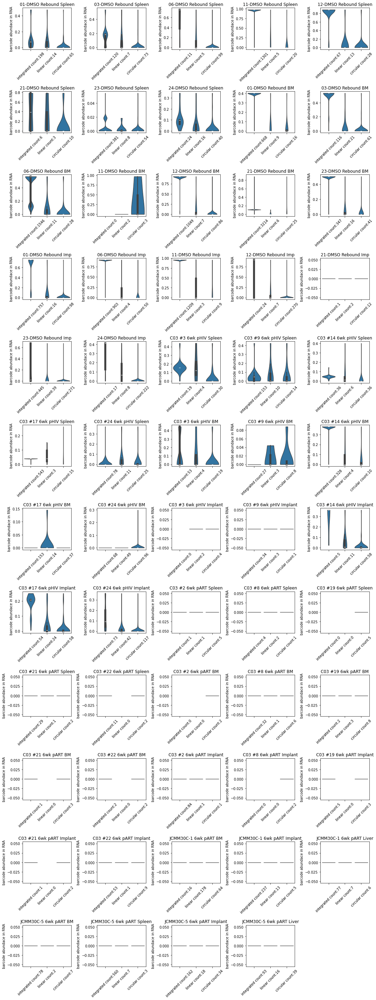

In [234]:
plt.figure(figsize=(15,40))
ploti = 0
activedict = {}
for UDP in bcdata:
    sample = refdata[refdata['UDP']==UDP]['sample name'].iloc[0]
    tdata = bcdata[UDP][bcdata[UDP]['provirus type']!='auto-integrated']
    xlist = ['integrated','linear','circular']
    xlabel = [x+' count:'+str(len(tdata[tdata['provirus type']==x])) for x in xlist]
    ploti += 1
    plt.subplot(12,5,ploti)
    sns.violinplot(x=tdata['provirus type'],y=tdata['transcription'],order=xlist,cut=0)
    plt.ylabel('barcode abundace in RNA')
    plt.xticks(range(3),xlabel,rotation=45)
    plt.xlabel('')
    plt.title(sample)
plt.tight_layout()

Autointegrated DNA and integrated DNA and RNA barcode in an actively replicating infectious should share the same barcode.

Is the T cell that has provirus and is proliferating the most have RNA barcode in circulation? We suspect not. That mean T cells with little to no proliferation should represent most of the RNA barcode.

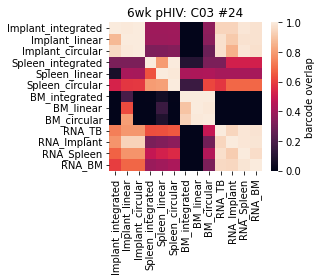

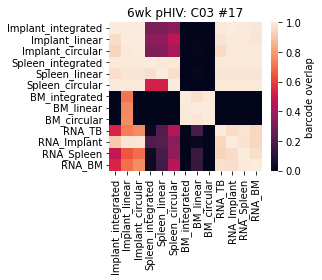

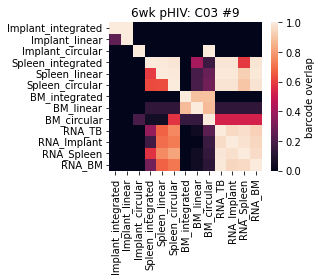

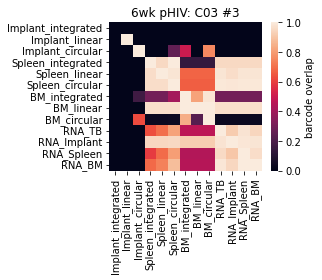

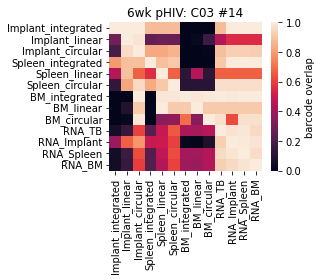

...

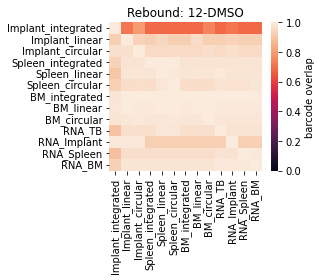

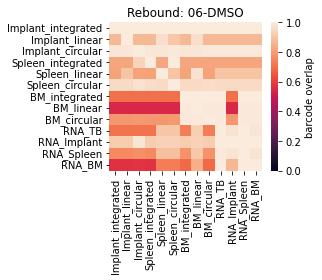

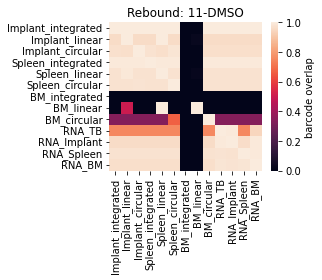

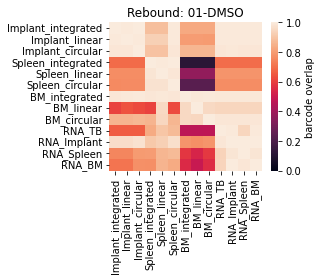

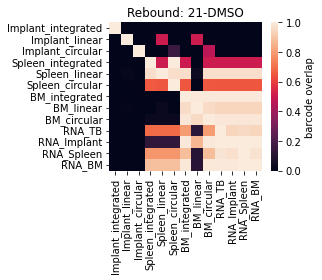

In [235]:
dnaorgans = ['Implant','Spleen','BM']
rnaorgans = ['TB','Implant','Spleen','BM']
for time in ['6wk pHIV','Rebound']:
    for mouse in set(refdata[refdata['Timepoint']==time]['Mouse']):
        labellist = []
        for label in product(dnaorgans,typelist[:3]):
            labellist.append(label[0]+'_'+label[1])
        for organ in rnaorgans:
            labellist.append('RNA_'+organ)
        bcdict = {}
        for ptype in typelist[:3]:
            for organ in dnaorgans:
                UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]['UDP'].iloc[0]
                tlabel = organ+'_'+ptype
                if UDP not in bcdata: 
                    continue
                tdata = bcdata[UDP][bcdata[UDP]['provirus type']==ptype]
                for i,r in tdata.iterrows():
                    bc = r['truebc']
                    if bc not in bcdict:
                        bcdict[bc] = {}
                        for label in labellist:
                            bcdict[bc][label] = 0
                    bcdict[bc][tlabel] += r['UMI count']/sum(tdata['UMI count'])
        for organ in rnaorgans:
            tlabel = 'RNA_'+organ
            sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==organ)]['sample'].iloc[0]
            tdata = rnadata[sample]
            for i,r in tdata.iterrows():
                if i not in bcdict:
                    bcdict[i] = {}
                    for label in labellist:
                        bcdict[i][label] = 0
                bcdict[i][tlabel] += r['occurrence']/sum(tdata['occurrence'])
       
        bcovmat = np.zeros((len(labellist),len(labellist)))
        for bc in bcdict:
            for i,l1 in enumerate(labellist):
                for j,l2 in enumerate(labellist):
                    if bcdict[bc][l1] > 0 and bcdict[bc][l2] > 0:
                        bcovmat[i,j] += bcdict[bc][l1]
        plt.figure(figsize=(4.5,4))
        sns.heatmap(bcovmat,xticklabels=labellist,yticklabels=labellist,vmin=0,vmax=1,cbar_kws={'label':'barcode overlap'})
        plt.title(time+': '+mouse)
        plt.tight_layout()
        plt.savefig('figures/heatplot_provirus_type_barcode_similarity_'+mouse+'.svg')

In [236]:
#Integrated DNA has more overlap with local and circulating RNA than unintegrated types do.
dnaorgans = ['Implant','Spleen','BM']
rnaorgans = ['TB','Implant','Spleen','BM','total']
mouse_rnadata
labellist = []
for label in product(dnaorgans,typelist):
    labellist.append(label[0]+'_'+label[1])
for organ in rnaorgans:
    labellist.append('RNA_'+organ)
simidict = {}
ovdict = {}
for mouse in set(refdata[refdata['Timepoint']!='6wk pART']['Mouse']):
    simidict[mouse] = {}
    ovdict[mouse] = {}
    bcdict = {}
    for organ in dnaorgans:
        UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]['UDP']
        if len(UDP) == 0: continue
        UDP = UDP.iloc[0]
        if UDP not in bcdata: continue
        for ptype in typelist:
            tdata = bcdata[UDP][bcdata[UDP]['provirus type']==ptype]
            for i,r in tdata.iterrows():
                bc = r['truebc']            
                if bc not in bcdict:
                    bcdict[bc] = {}
                    for label in labellist:
                        bcdict[bc][label] = 0
                bcdict[bc][organ+'_'+ptype] += r['UMI count']/sum(tdata['UMI count']) #this is abundance 
                #bcdict[bc][organ+'_'+ptype] += 1/len(tdata) #this count each T cell clone as 1
    for organ in rnaorgans:
        if organ == 'total':
            tdata = mouse_rnadata[mouse]
            for i in tdata:
                if i not in bcdict:
                    bcdict[i] = {}
                    for label in labellist:
                        bcdict[i][label] = 0
                bcdict[i]['RNA_'+organ] += tdata[i]
        else:
            sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==organ)]['sample'].iloc[0]
            tdata = rnadata[sample]
            for i,r in tdata.iterrows():
                if i not in bcdict:
                    bcdict[i] = {}
                    for label in labellist:
                        bcdict[i][label] = 0
                bcdict[i]['RNA_'+organ] += r['occurrence']/sum(tdata['occurrence'])
        
    for s1 in labellist:
        for s2 in labellist:    
            tlist1 = []; tlist2 = []
            for bc in bcdict:
                tlist1.append(bcdict[bc][s1])
                tlist2.append(bcdict[bc][s2])
            simidict[mouse][s1+':'+s2] = ss.spearmanr(tlist1,tlist2)[0]
            ovfreq = 0
            for bc in bcdict:
                if bcdict[bc][s1] > 0 and bcdict[bc][s2] > 0:
                    ovfreq += bcdict[bc][s1]
            ovdict[mouse][s1+':'+s2] = ovfreq

In [237]:
def count_bc(x,s):
    mouse = x.name 
    if 'RNA' in x['Sample'+str(s)]:
        organ = x['Sample'+str(s)].rsplit('_')[1]
        if organ == 'total':
            return len(mouse_rnadata[mouse])
        sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==organ)]['sample'].iloc[0]
        return len(rnadata[sample])
    else:
        organ = x['Sample'+str(s)].rsplit('_')[0]
        ptype = x['Sample'+str(s)].rsplit('_')[1]
        tdata = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]
        if len(tdata) > 0:
            UDP = tdata['UDP'].iloc[0]
        else:
            return 0
        if UDP in bcdata:
            return len(set(bcdata[UDP][bcdata[UDP]['provirus type']==ptype]['barcode']))
        else:
            return 0

simidata = pd.DataFrame(simidict).transpose()
simidata = pd.melt(simidata,var_name='label', value_name='Spearman\'s correlation',ignore_index=False)
simidata['Sample1'] = simidata['label'].apply(lambda x:x.rsplit(':')[0])
simidata['Sample2'] = simidata['label'].apply(lambda x:x.rsplit(':')[1])
simidata['number of barcode in sample1'] = simidata.apply(lambda x:count_bc(x,1),axis=1)
simidata['number of barcode in sample2'] = simidata.apply(lambda x:count_bc(x,2),axis=1)
simidata.index.name='Mouse'
simidata.drop(columns=['label'],inplace=True)
simidata

,Spearman's correlation,Sample1,Sample2,number of barcode in sample1,number of barcode in sample2
Mouse,,,,,
23-DMSO,1.0,Implant_integrated,Implant_integrated,17,17
C03 #3,NaN,Implant_integrated,Implant_integrated,0,0
24-DMSO,1.0,Implant_integrated,Implant_integrated,6,6
03-DMSO,NaN,Implant_integrated,Implant_integrated,0,0
C03 #24,1.0,Implant_integrated,Implant_integrated,13,13
...,...,...,...,...,...
06-DMSO,1.0,RNA_total,RNA_total,38,38
11-DMSO,1.0,RNA_total,RNA_total,31,31
01-DMSO,1.0,RNA_total,RNA_total,27,27


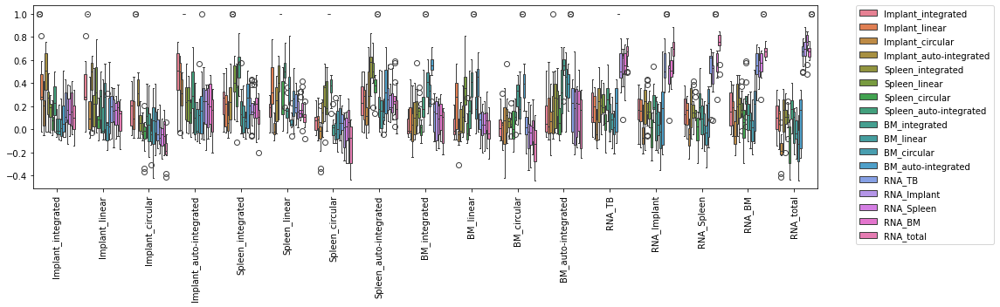

In [238]:
plt.figure(figsize=(16,5))
ax = sns.boxplot(y=list(simidata['Spearman\'s correlation']),x=list(simidata['Sample2']),hue=list(simidata['Sample1']))
plt.xticks(rotation=90)
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) 
plt.xlabel('')
plt.tight_layout()

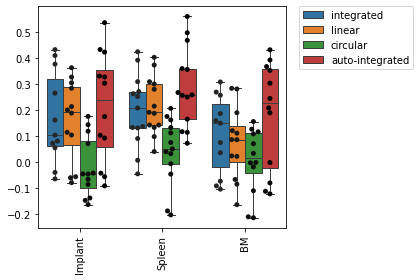

In [239]:
tdata = simidata[(simidata['Sample2']=='RNA_TB')&(~simidata['Sample1'].str.contains('RNA'))]
tdata['Organ'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[0])
tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
plt.figure(figsize=(6,4))
sns.boxplot(y=list(tdata['Spearman\'s correlation']),hue=list(tdata['provirus type']),x=list(tdata['Organ']))
ax = sns.swarmplot(y=list(tdata['Spearman\'s correlation']),hue=list(tdata['provirus type']),x=list(tdata['Organ']),dodge=True,color='black')
plt.xticks(rotation=90)
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[:4], labels[:4], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.tight_layout()            

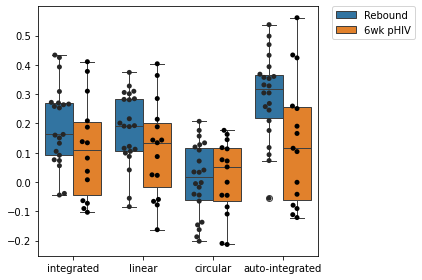

In [240]:
tdata = simidata[(simidata['Sample2']=='RNA_TB')&(~simidata['Sample1'].str.contains('RNA'))]
tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
tdata['Timepoint'] = tdata.index.map(lambda x:refdata[refdata['Mouse']==x]['Timepoint'].iloc[0])
plt.figure(figsize=(6,4))
sns.boxplot(y=list(tdata['Spearman\'s correlation']),x=list(tdata['provirus type']),hue=list(tdata['Timepoint']))
ax = sns.swarmplot(y=list(tdata['Spearman\'s correlation']),x=list(tdata['provirus type']),color='black',hue=list(tdata['Timepoint']),dodge=True)
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[:2], labels[:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.tight_layout()
plt.savefig('figures/proviral_type_correlate_with_TB_RNA_all_organ.svg')

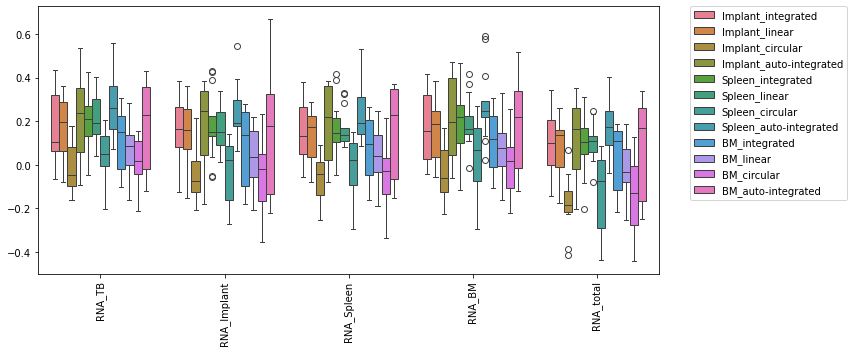

In [241]:
tdata = simidata[(simidata['Sample2'].str.contains('RNA'))&(~simidata['Sample1'].str.contains('RNA'))]
plt.figure(figsize=(12,5))
ax = sns.boxplot(y=list(tdata['Spearman\'s correlation']),x=list(tdata['Sample2']),hue=list(tdata['Sample1']))
plt.xticks(rotation=90)
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.xlabel('')
plt.tight_layout()

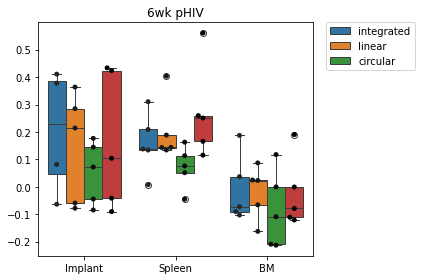

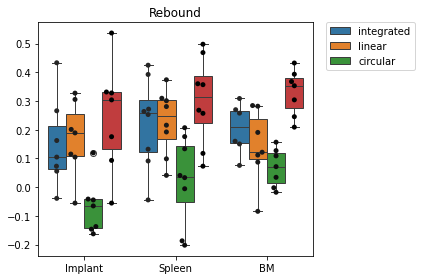

In [242]:
for time in ['6wk pHIV','Rebound']:
    tdata = simidata[(simidata['Sample2']=='RNA_TB')&(~simidata['Sample1'].str.contains('RNA'))]
    tdata['Organ'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[0])
    tdata['Timepoint'] = tdata.index.map(lambda x:refdata[(refdata['Mouse']==x)]['Timepoint'].iloc[0])
    tdata = tdata[tdata['Timepoint']==time]
    tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
    plt.figure(figsize=(6,4))
    sns.boxplot(y=list(tdata['Spearman\'s correlation']),hue=list(tdata['provirus type']),x=list(tdata['Organ']))
    ax = sns.swarmplot(y=list(tdata['Spearman\'s correlation']),hue=list(tdata['provirus type']),x=list(tdata['Organ']),dodge=True,color='black')
    #plt.xticks(rotation=90)
    plt.xlabel('')
    plt.legend([],[], frameon=False)
    handles, labels = ax.get_legend_handles_labels()
    l = plt.legend(handles[:3], labels[:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.title(time)
    plt.tight_layout() 
    plt.savefig('figures/provirus_form_correlation_with_TB_'+time.replace(' ','_')+'.svg')

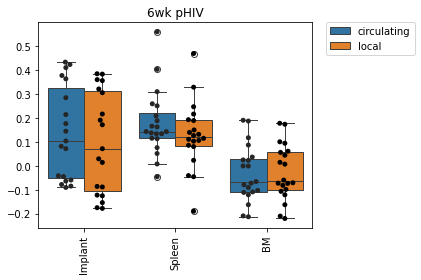

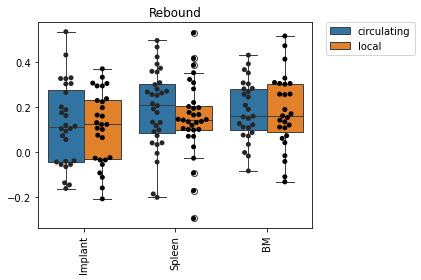

In [243]:
def define_local(x):
    dna = x['Sample1']
    rna = x['Sample2']
    if dna.rsplit('_')[0] == rna.rsplit('_')[1]:
        return 'local'
    if rna.rsplit('_')[1] == 'TB':
        return 'circulating'
    return 'others'

for time in ['6wk pHIV','Rebound']:
    tdata = simidata[(simidata['Sample2'].str.contains('RNA'))&(~simidata['Sample1'].str.contains('RNA'))]
    tdata['compare type'] = tdata.apply(lambda x:define_local(x),axis=1)
    tdata = tdata[tdata['compare type'] != 'others']
    tdata['Timepoint'] = tdata.index.map(lambda x:refdata[(refdata['Mouse']==x)]['Timepoint'].iloc[0])
    tdata['Organ'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[0])
    tdata = tdata[tdata['Timepoint']==time]
    tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
    plt.figure(figsize=(6,4))
    sns.boxplot(y=list(tdata['Spearman\'s correlation']),hue=list(tdata['compare type']),x=list(tdata['Organ']))
    ax = sns.swarmplot(y=list(tdata['Spearman\'s correlation']),hue=list(tdata['compare type']),x=list(tdata['Organ']),dodge=True,color='black')
    plt.xticks(rotation=90)
    plt.legend([],[], frameon=False)
    handles, labels = ax.get_legend_handles_labels()
    l = plt.legend(handles[:2], labels[:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.title(time)
    plt.tight_layout()  

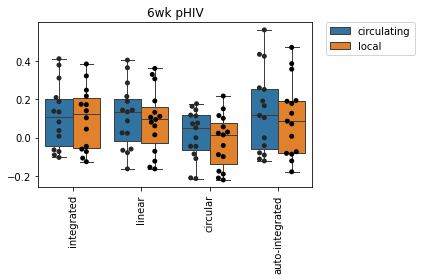

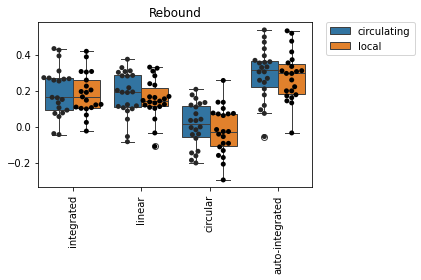

In [244]:
for time in ['6wk pHIV','Rebound']:
    tdata = simidata[(simidata['Sample2'].str.contains('RNA'))&(~simidata['Sample1'].str.contains('RNA'))]
    tdata['compare type'] = tdata.apply(lambda x:define_local(x),axis=1)
    tdata = tdata[tdata['compare type'] != 'others']
    tdata['Timepoint'] = tdata.index.map(lambda x:refdata[(refdata['Mouse']==x)]['Timepoint'].iloc[0])
    tdata['Organ'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[0])
    tdata = tdata[tdata['Timepoint']==time]
    tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
    plt.figure(figsize=(6,4))
    sns.boxplot(y=list(tdata['Spearman\'s correlation']),hue=list(tdata['compare type']),x=list(tdata['provirus type']))
    ax = sns.swarmplot(y=list(tdata['Spearman\'s correlation']),hue=list(tdata['compare type']),x=list(tdata['provirus type']),dodge=True,color='black')
    plt.xticks(rotation=90)
    plt.legend([],[], frameon=False)
    handles, labels = ax.get_legend_handles_labels()
    l = plt.legend(handles[:2], labels[:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.title(time)
    plt.tight_layout() 

In [245]:
for time in ['6wk pHIV','Rebound']:
    tdata = simidata[(simidata['Sample2']=='RNA_TB')&(~simidata['Sample1'].str.contains('RNA'))]
    tdata['Timepoint'] = tdata.index.map(lambda x:refdata[(refdata['Mouse']==x)]['Timepoint'].iloc[0])
    tdata = tdata[(tdata['Timepoint']==time)&(tdata['Spearman\'s correlation'])]
    slist = list(set(tdata['Sample1']))
    for i,s1 in enumerate(slist):
        o1 = s1.rsplit('_')[0]
        t1 = s1.rsplit('_')[1]
        for j,s2 in enumerate(slist):
            o2 = s2.rsplit('_')[0]
            t2 = s2.rsplit('_')[1]
            if (o1 == o2 or t1 == t2) and (i < j):
                tlist1 = list(tdata[tdata['Sample1'] == s1]['Spearman\'s correlation'])
                tlist2 = list(tdata[tdata['Sample1'] == s2]['Spearman\'s correlation'])
                W,p = ss.ttest_ind(tlist1,tlist2)
                if p < 0.05:
                    print(time+': '+s1+' vs '+s2+': p='+str(p))

6wk pHIV: Spleen_circular vs Spleen_auto-integrated: p=0.047164850855260294
6wk pHIV: Spleen_linear vs BM_linear: p=0.010873920265396242
6wk pHIV: Spleen_auto-integrated vs BM_auto-integrated: p=0.015744547098939445
Rebound: Spleen_integrated vs Spleen_circular: p=0.022691448620694214
Rebound: Implant_circular vs Implant_integrated: p=0.008296261424161977
Rebound: Implant_circular vs BM_circular: p=0.00954341064149283
Rebound: Implant_circular vs Implant_linear: p=0.0022328005666678113
Rebound: Implant_circular vs Implant_auto-integrated: p=0.002298384010644763
Rebound: BM_integrated vs BM_circular: p=0.009355354510860708
Rebound: BM_integrated vs BM_auto-integrated: p=0.02165843264639412
Rebound: Spleen_circular vs Spleen_linear: p=0.009594580547317705
Rebound: Spleen_circular vs Spleen_auto-integrated: p=0.0028913737525275937
Rebound: BM_circular vs BM_auto-integrated: p=2.4909144161178466e-05
Rebound: BM_linear vs BM_auto-integrated: p=0.006502099657772761


In [246]:
ovdata = pd.DataFrame(ovdict).transpose()
ovdata = pd.melt(ovdata,var_name='label', value_name='frequency observed',ignore_index=False)
ovdata['Sample1'] = ovdata['label'].apply(lambda x:x.rsplit(':')[0])
ovdata['Sample2'] = ovdata['label'].apply(lambda x:x.rsplit(':')[1])
ovdata['number of barcode in sample1'] = ovdata.apply(lambda x:count_bc(x,1),axis=1)
ovdata['number of barcode in sample2'] = ovdata.apply(lambda x:count_bc(x,2),axis=1)
ovdata.index.name='Mouse'
ovdata.drop(columns=['label'],inplace=True)
ovdata

,frequency observed,Sample1,Sample2,number of barcode in sample1,number of barcode in sample2
Mouse,,,,,
23-DMSO,1.0,Implant_integrated,Implant_integrated,17,17
C03 #3,0.0,Implant_integrated,Implant_integrated,0,0
24-DMSO,1.0,Implant_integrated,Implant_integrated,6,6
03-DMSO,0.0,Implant_integrated,Implant_integrated,0,0
C03 #24,1.0,Implant_integrated,Implant_integrated,13,13
...,...,...,...,...,...
06-DMSO,1.0,RNA_total,RNA_total,38,38
11-DMSO,1.0,RNA_total,RNA_total,31,31
01-DMSO,1.0,RNA_total,RNA_total,27,27


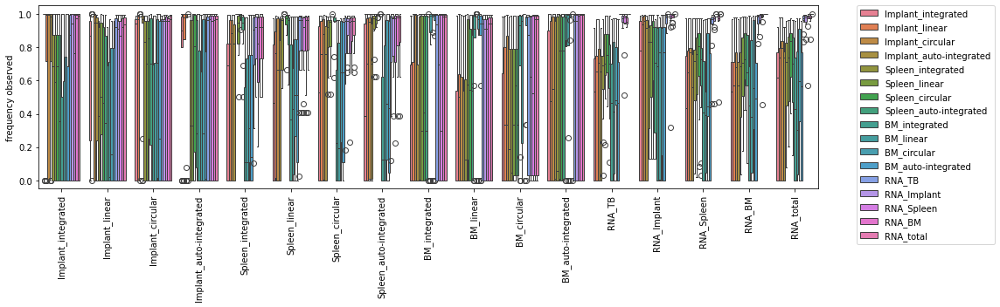

In [247]:
plt.figure(figsize=(16,5))
ax = sns.boxplot(y=ovdata['frequency observed'],x=ovdata['Sample1'],hue=ovdata['Sample2'])
plt.xticks(rotation=90)
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) 
plt.xlabel('')
plt.tight_layout()

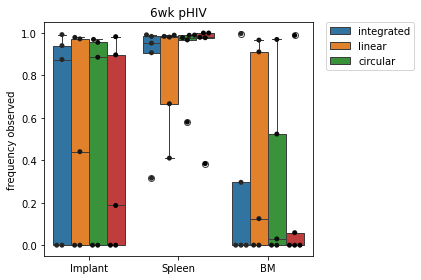

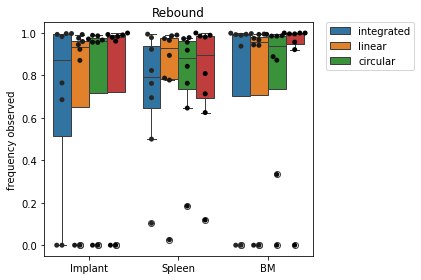

In [248]:
for time in ['6wk pHIV','Rebound']:
    tdata = ovdata[(ovdata['Sample2']=='RNA_TB')&(~ovdata['Sample1'].str.contains('RNA'))]
    tdata['Organ'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[0])
    tdata['Timepoint'] = tdata.index.map(lambda x:refdata[(refdata['Mouse']==x)]['Timepoint'].iloc[0])
    tdata = tdata[tdata['Timepoint']==time]
    tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
    plt.figure(figsize=(6,4))
    sns.boxplot(y=tdata['frequency observed'],hue=tdata['provirus type'],x=tdata['Organ'])
    ax = sns.swarmplot(y=list(tdata['frequency observed']),hue=list(tdata['provirus type']),x=list(tdata['Organ']),dodge=True,color='black')
    #plt.xticks(rotation=90)
    plt.xlabel('')
    plt.legend([],[], frameon=False)
    handles, labels = ax.get_legend_handles_labels()
    l = plt.legend(handles[:3], labels[:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.title(time)
    plt.tight_layout()
    plt.savefig('figures/provirus_form_overlap_freq_with_TB_'+time.replace(' ','_')+'.svg')

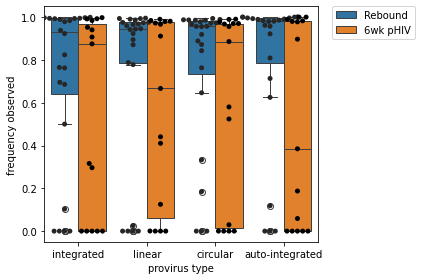

In [249]:
tdata = ovdata[(ovdata['Sample2']=='RNA_TB')&(~ovdata['Sample1'].str.contains('RNA'))]
tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
tdata['Timepoint'] = tdata.index.map(lambda x:refdata[refdata['Mouse']==x]['Timepoint'].iloc[0])
plt.figure(figsize=(6,4))
sns.boxplot(y=tdata['frequency observed'],x=tdata['provirus type'],hue=tdata['Timepoint'])
ax = sns.swarmplot(y=list(tdata['frequency observed']),x=list(tdata['provirus type']),color='black',hue=list(tdata['Timepoint']),dodge=True)
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[:2], labels[:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.tight_layout()
plt.savefig('figures/proviral_type_frequency_overlap_with_TB_RNA_all_organ.svg')

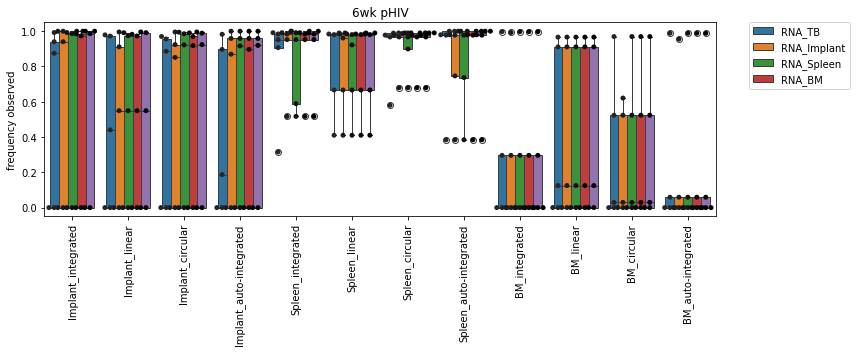

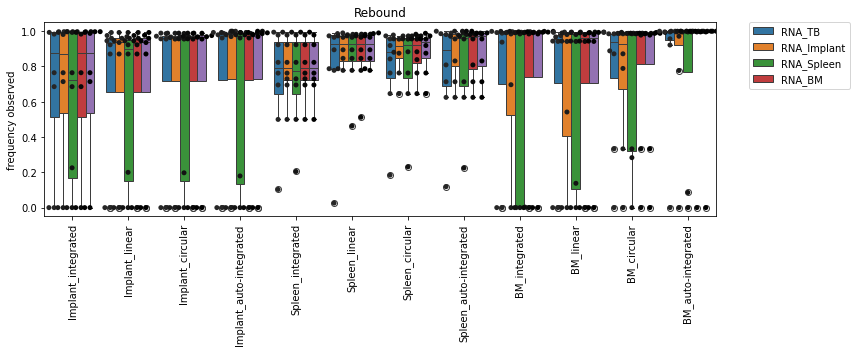

In [250]:
for time in ['6wk pHIV','Rebound']:
    tdata = ovdata[(ovdata['Sample2'].str.contains('RNA'))&(~ovdata['Sample1'].str.contains('RNA'))]
    tdata['Organ'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[0])
    tdata['Timepoint'] = tdata.index.map(lambda x:refdata[(refdata['Mouse']==x)]['Timepoint'].iloc[0])
    tdata = tdata[tdata['Timepoint']==time]
    tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
    plt.figure(figsize=(12,5))
    sns.boxplot(y=tdata['frequency observed'],hue=tdata['Sample2'],x=tdata['Sample1'])
    ax = sns.swarmplot(y=list(tdata['frequency observed']),hue=list(tdata['Sample2']),x=list(tdata['Sample1']),dodge=True,color='black')
    plt.xticks(rotation=90)
    plt.legend([],[], frameon=False)
    handles, labels = ax.get_legend_handles_labels()
    l = plt.legend(handles[:4], labels[:4], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.title(time)
    plt.xlabel('')
    plt.tight_layout()  

In [251]:
ovdata['Mouse'] = ovdata.index
ovdata.index = range(len(ovdata))

In [252]:
def generate_bclist(sample,mouse):
    if 'RNA' in sample:
        organ = sample.rsplit('_')[1]
        if organ == 'total':
            return list(mouse_rnadata[mouse].keys())
        rnasample = rnaref[(rnaref['Organ']==organ)&(rnaref['Mouse']==mouse)]['sample']
        if len(rnasample) > 0 and rnasample.iloc[0] in rnadata:
            return list(set(rnadata[rnasample.iloc[0]].index))
        else:
            return []
    else:
        pform = sample.rsplit('_')[1]
        organ = sample.rsplit('_')[0]
        UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]['UDP']
        if len(UDP) > 0 and UDP.iloc[0] in bcdata:
            tdata = bcdata[UDP.iloc[0]]
            tdata = tdata[tdata['provirus type']==pform]
            return list(set(tdata['truebc']))
        else:
            return []
        
def count_ov_bc(x):
    bclist1 = generate_bclist(x['Sample1'],x['Mouse'])
    bclist2 = generate_bclist(x['Sample2'],x['Mouse'])
    return len([x for x in bclist1 if x in bclist2])

ovdata['overlap barcode count'] = ovdata.apply(lambda x:count_ov_bc(x),axis=1)

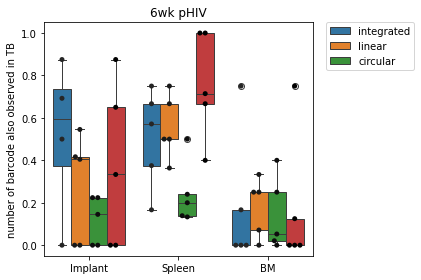

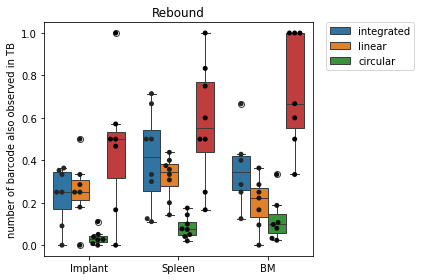

In [253]:
for time in ['6wk pHIV','Rebound']:
    tdata = ovdata[(ovdata['Sample2']=='RNA_TB')&(~ovdata['Sample1'].str.contains('RNA'))]
    tdata['Organ'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[0])
    tdata['Timepoint'] = tdata['Mouse'].apply(lambda x:refdata[(refdata['Mouse']==x)]['Timepoint'].iloc[0])
    tdata = tdata[tdata['Timepoint']==time]
    tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
    plt.figure(figsize=(6,4))
    sns.boxplot(y=tdata['overlap barcode count']/tdata['number of barcode in sample1'],hue=tdata['provirus type'],x=tdata['Organ'])
    ax = sns.swarmplot(y=tdata['overlap barcode count']/tdata['number of barcode in sample1'],hue=tdata['provirus type'],x=tdata['Organ'],dodge=True,color='black')
    #plt.xticks(rotation=90)
    plt.xlabel('')
    plt.ylabel('number of barcode also observed in TB')
    plt.legend([],[], frameon=False)
    handles, labels = ax.get_legend_handles_labels()
    l = plt.legend(handles[:3], labels[:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.title(time)
    plt.tight_layout()
    plt.savefig('figures/provirus_form_overlap_count_with_TB_'+time.replace(' ','_')+'.png')

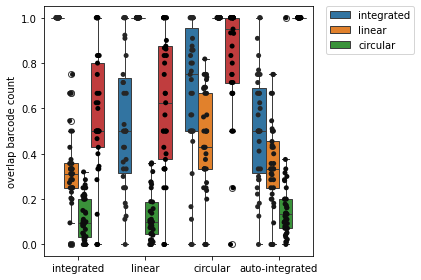

In [254]:
plt.figure(figsize=(6,4))
tdata = ovdata[(~ovdata['Sample1'].str.contains('RNA'))&(~ovdata['Sample2'].str.contains('RNA'))]
tdata['Organ1'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[0])
tdata['Organ2'] = tdata['Sample2'].apply(lambda x:x.rsplit('_')[0])
tdata = tdata[tdata['Organ1']==tdata['Organ2']]
tdata['sample1 provirus form'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[-1])
tdata['sample2 provirus form'] = tdata['Sample2'].apply(lambda x:x.rsplit('_')[-1])
ax = sns.boxplot(y=tdata['overlap barcode count']/tdata['number of barcode in sample1'],x=tdata['sample2 provirus form'],hue=tdata['sample1 provirus form'])
sns.stripplot(y=tdata['overlap barcode count']/tdata['number of barcode in sample1'],x=tdata['sample2 provirus form'],hue=tdata['sample1 provirus form'],dodge=True,color='black')
#plt.xticks(rotation=90)
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[:3], labels[:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) 
plt.xlabel('')
plt.ylabel('overlap barcode count')
plt.tight_layout()

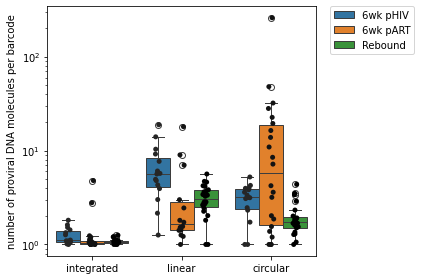

In [255]:
#UMI per bc for different forms
def count_UMI_ptype(UDP):
    if UDP not in bcdata:return np.nan
    tdata = bcdata[UDP]
    tdata = tdata[tdata['provirus type']==ptype]
    return ss.gmean(tdata['UMI count'])

tlist = []; ulist = []; plist = []
for ptype in ['integrated','linear','circular']:
    refdata[ptype+'_UMI_per_bc'] = refdata['UDP'].apply(lambda x:count_UMI_ptype(x))
    tlist.extend(refdata['Timepoint'])
    ulist.extend(list(refdata[ptype+'_UMI_per_bc']))
    plist.extend([ptype]*len(refdata))
plt.figure(figsize=(6,4))
ax = sns.boxplot(x=plist,y=ulist,hue=tlist,hue_order=['6wk pHIV','6wk pART','Rebound'])
ax = sns.stripplot(x=plist,y=ulist,hue=tlist,dodge=True,color='black',hue_order=['6wk pHIV','6wk pART','Rebound'])
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[:3], labels[:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) 
plt.ylabel('number of proviral DNA molecules per barcode')
plt.yscale('log')
plt.tight_layout()
plt.savefig('figures/UMI_per_bc_by_ptype.png',dpi=300)

In [256]:
ss.ranksums(refdata['circular_UMI_per_bc'],list(refdata['integrated_UMI_per_bc'])+list(refdata['linear_UMI_per_bc']),nan_policy='omit')

RanksumsResult(statistic=3.3029730447034704, pvalue=0.0009566558319751143)

In [257]:
tlist1 = refdata['circular_UMI_per_bc']
tlist1 = tlist1[~np.isnan(tlist1)]
tlist2 = pd.concat((refdata['integrated_UMI_per_bc'],refdata['linear_UMI_per_bc']))
tlist2 = tlist2[~np.isnan(tlist2)]
np.mean(tlist1)/np.mean(tlist2)

3.568085265203774

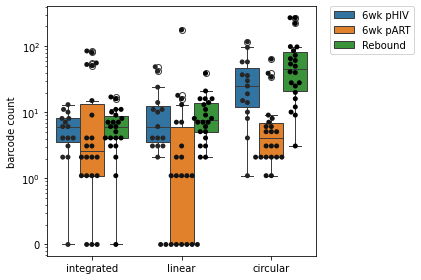

In [258]:
#number of barcode in different form
def count_bc_ptype(UDP):
    if UDP not in bcdata:return np.nan
    tdata = bcdata[UDP]
    tdata = tdata[tdata['provirus type']==ptype]
    return len(set(tdata['barcode']))

tlist = []; ulist = []; plist = []
for ptype in ['integrated','linear','circular']:
    refdata[ptype+' barcode count'] = refdata['UDP'].apply(lambda x:count_bc_ptype(x))
    tlist.extend(refdata['Timepoint'])
    ulist.extend(list(refdata[ptype+' barcode count']+0.1))
    plist.extend([ptype]*len(refdata))
plt.figure(figsize=(6,4))
ax = sns.boxplot(x=plist,y=ulist,hue=tlist,hue_order=['6wk pHIV','6wk pART','Rebound'])
ax = sns.swarmplot(x=plist,y=ulist,hue=tlist,dodge=True,color='black',hue_order=['6wk pHIV','6wk pART','Rebound'])
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[:3], labels[:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) 
plt.ylabel('barcode count')
plt.yscale('log')
ylim = plt.gca().get_ylim()
locs,labels = plt.yticks()
labels[2] = '0'
plt.yticks(locs,labels)
plt.gca().set_ylim(ylim)
plt.tight_layout()
plt.savefig('figures/barcode_count_by_ptype.png',dpi=300)

In [259]:
ss.ranksums(refdata['circular barcode count'],list(refdata['integrated barcode count'])+list(refdata['linear barcode count']),nan_policy='omit')

RanksumsResult(statistic=4.695727131841097, pvalue=2.6565998568434377e-06)

In [260]:
tlist1 = refdata['circular barcode count']
tlist1 = tlist1[~np.isnan(tlist1)]
tlist2 = pd.concat((refdata['integrated barcode count'],refdata['linear barcode count']))
tlist2 = tlist2[~np.isnan(tlist2)]
np.mean(tlist1)/np.mean(tlist2)

3.647798742138365

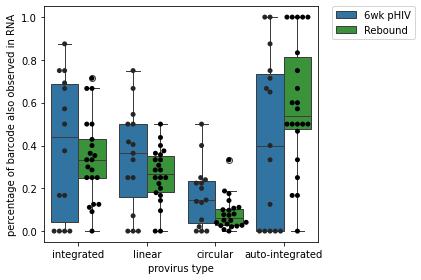

In [261]:
tdata = ovdata[(ovdata['Sample2']=='RNA_TB')&(~ovdata['Sample1'].str.contains('RNA'))]
tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
tdata['Timepoint'] = tdata['Mouse'].apply(lambda x:refdata[refdata['Mouse']==x]['Timepoint'].iloc[0])
plt.figure(figsize=(6,4))
sns.boxplot(y=tdata['overlap barcode count']/tdata['number of barcode in sample1'],x=tdata['provirus type'],hue=tdata['Timepoint'],hue_order=['6wk pHIV','Rebound'],palette=my_pal)
ax = sns.swarmplot(y=tdata['overlap barcode count']/tdata['number of barcode in sample1'],x=list(tdata['provirus type']),color='black',hue=list(tdata['Timepoint']),dodge=True,hue_order=['6wk pHIV','Rebound'])
plt.ylabel('percentage of barcode also observed in RNA')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[:2], labels[:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.tight_layout()
plt.savefig('figures/proviral_type_barcode_count_overlap_with_TB_RNA_all_organ.png',dpi=300)

In [262]:
ovdata.to_csv('overlap_confomration_summary(with_autointegrated).csv')

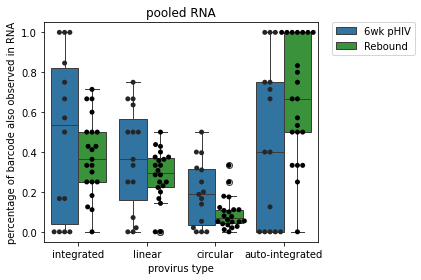

In [263]:
tdata = ovdata[(ovdata['Sample2']=='RNA_total')&(~ovdata['Sample1'].str.contains('RNA'))]
tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
tdata['Timepoint'] = tdata['Mouse'].apply(lambda x:refdata[refdata['Mouse']==x]['Timepoint'].iloc[0])
plt.figure(figsize=(6,4))
sns.boxplot(y=tdata['overlap barcode count']/tdata['number of barcode in sample1'],x=tdata['provirus type'],hue=tdata['Timepoint'],hue_order=['6wk pHIV','Rebound'],palette=my_pal)
ax = sns.swarmplot(y=tdata['overlap barcode count']/tdata['number of barcode in sample1'],x=list(tdata['provirus type']),color='black',hue=list(tdata['Timepoint']),dodge=True,hue_order=['6wk pHIV','Rebound'])
plt.ylabel('percentage of barcode also observed in RNA')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[:2], labels[:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.title('pooled RNA')
plt.tight_layout()
plt.savefig('figures/proviral_type_barcode_count_overlap_with_total_RNA_all_organ.png',dpi=300)

In [264]:
ovdata.to_csv('Organ_conformation_barcode_overlap.csv')

In [265]:
def count_active_bc(x):
    mouse = x['Mouse']
    organ = x['Organ']
    tdata = ovdata[(ovdata['Mouse']==mouse)&(ovdata['Sample1'].str.contains(organ))&(ovdata['Sample1'].str.contains(ptype))&(ovdata['Sample2']=='RNA_total')]
    if len(tdata) > 0:
        return tdata['overlap barcode count'].iloc[0]
    else:
        return np.nan

def count_inactive_bc(x):
    mouse = x['Mouse']
    organ = x['Organ']
    tdata = ovdata[(ovdata['Mouse']==mouse)&(ovdata['Sample1'].str.contains(organ))&(ovdata['Sample1'].str.contains(ptype))&(ovdata['Sample2']=='RNA_total')]
    if len(tdata) > 0:
        return -tdata['overlap barcode count'].iloc[0]+tdata['number of barcode in sample1'].iloc[0]
    else:
        return np.nan
        
for ptype in ['integrated','linear','circular']:
    refdata[ptype+' active barcode count (all RNA)'] = refdata.apply(lambda x:count_active_bc(x),axis=1)
    refdata[ptype+' inactive barcode count (all RNA)'] = refdata.apply(lambda x:count_inactive_bc(x),axis=1)

In [266]:
refdata.to_csv('sample_summary_022623.csv')

In [267]:
def test_active(p1,p2):
    tdata = ovdata[(ovdata['Sample2']=='RNA_TB')&(~ovdata['Sample1'].str.contains('RNA'))]
    tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
    tdata['Timepoint'] = tdata['Mouse'].apply(lambda x:refdata[refdata['Mouse']==x]['Timepoint'].iloc[0])
    tdata = tdata[(tdata['Timepoint']==time)]
    tdata1 = tdata[tdata['provirus type']==p1]
    tdata2 = tdata[tdata['provirus type']==p2]
    W,p = ss.ranksums(tdata1['overlap barcode count']/tdata1['number of barcode in sample1'],tdata2['overlap barcode count']/tdata2['number of barcode in sample1'],nan_policy='omit')
    print(time,p1,'vs',p2,'p=',p)
    
for time in ['6wk pHIV','Rebound']:
    test_active('integrated','linear')
    test_active('integrated','circular')
    test_active('circular','linear')

6wk pHIV integrated vs linear p= 0.5853789284609614
6wk pHIV integrated vs circular p= 0.13214331982716349
6wk pHIV circular vs linear p= 0.03808828420629213
Rebound integrated vs linear p= 0.25856634178780447
Rebound integrated vs circular p= 8.738013428583532e-06
Rebound circular vs linear p= 4.651106632983293e-05


In [268]:
    tdata = ovdata[(ovdata['Sample2']=='RNA_TB')&(~ovdata['Sample1'].str.contains('RNA'))]
    tdata['provirus type'] = tdata['Sample1'].apply(lambda x:x.rsplit('_')[1])
    tdata['Timepoint'] = tdata['Mouse'].apply(lambda x:refdata[refdata['Mouse']==x]['Timepoint'].iloc[0])
    tdata1 = tdata[tdata['provirus type']=='circular']
    tdata2 = tdata[tdata['provirus type']!='circular']
    W,p = ss.ranksums(tdata1['overlap barcode count']/tdata1['number of barcode in sample1'],tdata2['overlap barcode count']/tdata2['number of barcode in sample1'],nan_policy='omit')
    print('p=',p)

p= 1.593996838332711e-07


In [269]:
def count_bc_ptype(mouse):
    tref = refdata[refdata['Mouse']==mouse]
    if len(tref) == 0: return np.nan
    bclist = []
    for UDP in tref['UDP']:
        if UDP not in bcdata: continue
        tdata = bcdata[UDP]
        tdata = tdata[tdata['provirus type']==ptype]
        bclist.extend(list(set(tdata['barcode'])))
    return len(set(bclist))

tlist = []; ulist = []; plist = []
for ptype in ['integrated','linear','circular']:
    mousedata[ptype+' barcode count'] = mousedata['mouse'].apply(lambda x:count_bc_ptype(x))

In [270]:
mousedata.to_csv('per_mouse_summary_022423.csv')

In [271]:
combineIS

,Integration site,UMI count,Mouse,sample name,Timepoint,UDP,barcode,Organ,mapping length,truebc,transcription,transcription 4-organ mean,transcription TB,UMI normalized
0,chr2:85708835:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,18.0,GCCTCCCTCTACGTCGTCTAC,0.069424,0.076087,0.064383,0.004762
1,chr5:168423417:-,4,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,96.5,GCCTCCCTCTACGTCGTCTAC,0.069424,0.076087,0.064383,0.019048
2,chr11:34258609:+,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,129.0,GCCTCCCTCTACGTCGTCTAC,0.069424,0.076087,0.064383,0.004762
3,chr1:48676335:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,129.0,GCCTCCCTCTACGTCGTCTAC,0.069424,0.076087,0.064383,0.004762
4,chr4:2695114:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,127.0,GCCTCCCTCTACGTCGTCTAC,0.069424,0.076087,0.064383,0.004762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15300,chr1:228648975:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGTGGGGGTAGACGGAGAGGTGGTTGATGTTTTATAG,Implant,35.0,AACATCAACCACCTCTCCGTCTACCCCCAC,0.000000,0.000000,0.000000,0.005747
15301,chr14:90787111:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGCCGGTGGAGATGCAGCGGAATTATAG,Implant,18.0,TTCCGCTGCATCTCCACCGGC,0.000000,0.000000,0.000000,0.005747
15302,chr5:176462542:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGAAGAGGTAGTCGCAGAGGAATTATAG,Implant,129.0,TTCCTCTGCGACTACCTCTTC,0.000000,0.000000,0.000000,0.005747
15303,chr11:76699025:-,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGACGCAGGGGCAGTCGGCGCTTTATAG,Implant,129.0,AGCGCCGACTGCCCCTGCGTC,0.000000,0.000000,0.000000,0.005747


In [272]:
#include 6wk pART data
dnaorgans = ['Implant','Spleen','BM']
rnaorgans = ['TB','Implant','Spleen','BM','total']
labellist = []
for label in product(dnaorgans,typelist):
    labellist.append(label[0]+'_'+label[1])
for organ in rnaorgans:
    labellist.append('RNA_'+organ)
simidict = {}
ovdict = {}
for mouse in set(refdata['Mouse']):
    simidict[mouse] = {}
    ovdict[mouse] = {}
    time = refdata[refdata['Mouse']==mouse]['Timepoint'].iloc[0]
    bcdict = {}
    for organ in dnaorgans:
        UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]['UDP']
        if len(UDP) == 0: continue
        UDP = UDP.iloc[0]
        if UDP not in bcdata: continue
        for ptype in typelist:
            tdata = bcdata[UDP][bcdata[UDP]['provirus type']==ptype]
            for i,r in tdata.iterrows():
                bc = r['truebc']            
                if bc not in bcdict:
                    bcdict[bc] = {}
                    for label in labellist:
                        bcdict[bc][label] = 0
                bcdict[bc][organ+'_'+ptype] += r['UMI count']/sum(tdata['UMI count']) #this is abundance 
                #bcdict[bc][organ+'_'+ptype] += 1/len(tdata) #this count each T cell clone as 1
    if time != '6wk pART': 
        for organ in rnaorgans:
            if organ == 'total':
                tdata = mouse_rnadata[mouse]
                for i in tdata:
                    if i not in bcdict:
                        bcdict[i] = {}
                        for label in labellist:
                            bcdict[i][label] = 0
                    bcdict[i]['RNA_'+organ] += tdata[i]
            else:
                sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==organ)]['sample'].iloc[0]
                tdata = rnadata[sample]
                for i,r in tdata.iterrows():
                    if i not in bcdict:
                        bcdict[i] = {}
                        for label in labellist:
                            bcdict[i][label] = 0
                    bcdict[i]['RNA_'+organ] += r['occurrence']/sum(tdata['occurrence'])
        
    for s1 in labellist:
        for s2 in labellist:    
            tlist1 = []; tlist2 = []
            for bc in bcdict:
                tlist1.append(bcdict[bc][s1])
                tlist2.append(bcdict[bc][s2])
            simidict[mouse][s1+':'+s2] = ss.spearmanr(tlist1,tlist2)[0]
            ovfreq = 0
            for bc in bcdict:
                if bcdict[bc][s1] > 0 and bcdict[bc][s2] > 0:
                    ovfreq += bcdict[bc][s1]
            ovdict[mouse][s1+':'+s2] = ovfreq

In [273]:
def count_bc(x,s):
    mouse = x.name 
    time = refdata[refdata['Mouse']==mouse]['Timepoint'].iloc[0]
    if 'RNA' in x['Sample'+str(s)]:
        organ = x['Sample'+str(s)].rsplit('_')[1]
        if time == '6wk pART':
            return 0
        if organ == 'total':
            return len(mouse_rnadata[mouse])
        sample = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']==organ)]['sample'].iloc[0]
        return len(rnadata[sample])
    else:
        organ = x['Sample'+str(s)].rsplit('_')[0]
        ptype = x['Sample'+str(s)].rsplit('_')[1]
        tdata = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]
        if len(tdata) > 0:
            UDP = tdata['UDP'].iloc[0]
        else:
            return 0
        if UDP in bcdata:
            return len(set(bcdata[UDP][bcdata[UDP]['provirus type']==ptype]['barcode']))
        else:
            return 0

ovdata = pd.DataFrame(ovdict).transpose()
ovdata = pd.melt(ovdata,var_name='label', value_name='frequency observed',ignore_index=False)
ovdata['Sample1'] = ovdata['label'].apply(lambda x:x.rsplit(':')[0])
ovdata['Sample2'] = ovdata['label'].apply(lambda x:x.rsplit(':')[1])
ovdata['number of barcode in sample1'] = ovdata.apply(lambda x:count_bc(x,1),axis=1)
ovdata['number of barcode in sample2'] = ovdata.apply(lambda x:count_bc(x,2),axis=1)
ovdata.index.name='Mouse'
ovdata.drop(columns=['label'],inplace=True)

In [274]:
simidata = pd.DataFrame(simidict).transpose()
simidata = pd.melt(simidata,var_name='label', value_name='Spearman\'s correlation',ignore_index=False)
ovdata['Spearman\'s correlation'] = simidata['Spearman\'s correlation']

In [275]:
ovdata['Mouse'] = ovdata.index
ovdata.index = range(len(ovdata))

In [276]:
def generate_bclist(sample,mouse):
    time = refdata[refdata['Mouse']==mouse]['Timepoint'].iloc[0]
    if 'RNA' in sample:
        if time == '6wk pART': return []
        organ = sample.rsplit('_')[1]
        if organ == 'total':
            return list(mouse_rnadata[mouse].keys())
        rnasample = rnaref[(rnaref['Organ']==organ)&(rnaref['Mouse']==mouse)]['sample']
        if len(rnasample) > 0 and rnasample.iloc[0] in rnadata:
            return list(set(rnadata[rnasample.iloc[0]].index))
        else:
            return []
    else:
        pform = sample.rsplit('_')[1]
        organ = sample.rsplit('_')[0]
        UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]['UDP']
        if len(UDP) > 0 and UDP.iloc[0] in bcdata:
            tdata = bcdata[UDP.iloc[0]]
            tdata = tdata[tdata['provirus type']==pform]
            return list(set(tdata['truebc']))
        else:
            return []
        
def count_ov_bc(x):
    bclist1 = generate_bclist(x['Sample1'],x['Mouse'])
    bclist2 = generate_bclist(x['Sample2'],x['Mouse'])
    return len([x for x in bclist1 if x in bclist2])

ovdata['overlap barcode count'] = ovdata.apply(lambda x:count_ov_bc(x),axis=1)

In [277]:
ovdata['Timepoint'] = ovdata['Mouse'].apply(lambda x:refdata[refdata['Mouse']==x]['Timepoint'].iloc[0])

In [278]:
ovdata

,frequency observed,Sample1,Sample2,number of barcode in sample1,number of barcode in sample2,Spearman's correlation,Mouse,overlap barcode count,Timepoint
0,1.0,Implant_integrated,Implant_integrated,6,6,1.0,24-DMSO,6,Rebound
1,0.0,Implant_integrated,Implant_integrated,0,0,NaN,03-DMSO,0,Rebound
2,1.0,Implant_integrated,Implant_integrated,3,3,1.0,C03 #22,3,6wk pART
3,1.0,Implant_integrated,Implant_integrated,2,2,1.0,C03 #9,2,6wk pHIV
4,1.0,Implant_integrated,Implant_integrated,2,2,1.0,C03 #19,2,6wk pART
...,...,...,...,...,...,...,...,...,...
5775,1.0,RNA_total,RNA_total,99,99,1.0,C03 #24,99,6wk pHIV
5776,0.0,RNA_total,RNA_total,0,0,NaN,JCMM30C-5,0,6wk pART
5777,1.0,RNA_total,RNA_total,27,27,1.0,01-DMSO,27,Rebound
5778,1.0,RNA_total,RNA_total,149,149,1.0,C03 #14,149,6wk pHIV


In [279]:
ovdata.to_csv('Organ_conformation_barcode_overlap_with_ART.csv')

#### RNA abundance v.s. UMI/IS

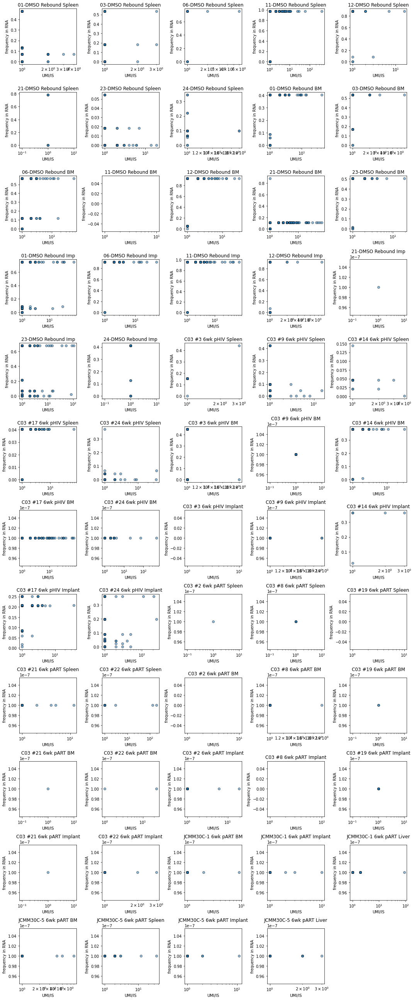

In [280]:
#this analysis focus on integrated DNA
plt.figure(figsize=(15,36))
ploti = 0
for UDP in bcdata:
    ploti += 1
    plt.subplot(12,5,ploti)
    tdata = bcdata[UDP][bcdata[UDP]['provirus type']=='integrated']
    plt.scatter(tdata['UMI count'],tdata['transcription']+1e-7,edgecolor='black',alpha=0.5)
    plt.xscale('log')
    #plt.yscale('log')
    plt.xlabel('UMI/IS')
    plt.ylabel('frequency in RNA')
    plt.title(refdata[refdata['UDP']==UDP]['sample name'].iloc[0])
plt.tight_layout()

In [281]:
#for each bc, calculate average UMI/IS. Compare bc

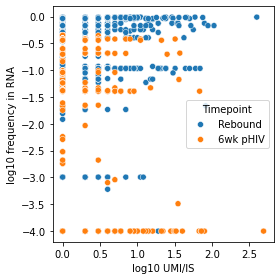

In [282]:
plt.figure(figsize=(4,4))
tdata = combineIS[combineIS['Timepoint']!='6wk pART']
sns.scatterplot(x=np.log10(tdata['UMI count']),y=np.log10(tdata['transcription']+1e-4),hue=tdata['Timepoint'])
plt.xlabel('log10 UMI/IS')
plt.ylabel('log10 frequency in RNA')
#plt.xlim(-0.05,3)
#plt.ylim(-4.05,0.05)
plt.tight_layout()

In [283]:
def find_transcription(x):
    UDP = x['UDP']
    bc = x['truebc']
    sample = rnaref[rnaref['UDP']==UDP]['sample']
    if len(sample) == 0:
        return 0
    else:
        sample = sample.iloc[0]
    if bc in rnadata[sample].index:
        return rnadata[sample].loc[bc,'occurrence']/sum(rnadata[sample]['occurrence'])
    else:
        return 0
    
combinebc['transcription'] = combinebc.apply(lambda x:find_transcription(x),axis=1)
combinebc['UMI_per_IS'] = combinebc['UMI count']/combinebc['IS count'] 

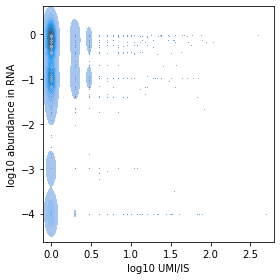

In [284]:
plt.figure(figsize=(4,4))
tdata = combineIS[combineIS['Timepoint']!='6wk pART']
sns.kdeplot(x=np.log10(tdata['UMI count']),y=np.log10(tdata['transcription']+1e-4),fill=True)
sns.scatterplot(x=np.log10(tdata['UMI count']),y=np.log10(tdata['transcription']+1e-4),s=1,color=plt.cm.tab10(0))
plt.xlabel('log10 UMI/IS')
plt.ylabel('log10 abundance in RNA')
#plt.xlim(-0.05,3)
#plt.ylim(-4.05,0.05)
plt.tight_layout()

In [285]:
ss.spearmanr(tdata['UMI count'],tdata['transcription'])

SignificanceResult(statistic=-0.04298995359599217, pvalue=3.516180532929442e-07)

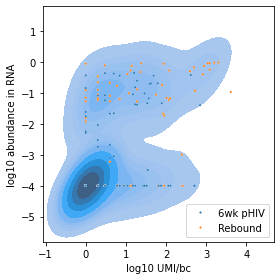

In [286]:
plt.figure(figsize=(4,4))
tdata = combinebc[combinebc['Timepoint']!='6wk pART']
sns.kdeplot(x=np.log10(tdata['UMI count']),y=np.log10(tdata['transcription']+1e-4),fill=True)
sns.scatterplot(x=np.log10(tdata['UMI count']),y=np.log10(tdata['transcription']+1e-4),s=5,hue=tdata['Timepoint'],hue_order=['6wk pHIV','Rebound'])
plt.xlabel('log10 UMI/bc')
plt.ylabel('log10 abundance in RNA')
plt.legend(loc='lower right')
#plt.xlim(-0.05,3)
#plt.ylim(-4.05,0.05)
plt.tight_layout()
plt.savefig('figures/cor_RNA_abundance_with_proviral_per_bc.png',dpi=300)

In [287]:
ss.spearmanr(tdata['UMI count'],tdata['transcription'])

SignificanceResult(statistic=0.5588417863374698, pvalue=1.861541634959854e-20)

In [288]:
def norm_UMI_count(x):
    UDP = x['UDP']
    return x['UMI count']/sum(bcdata[UDP]['UMI count'])

def find_mean_RNA(x):
    mouse = x['Mouse']
    bc = x['truebc']
    samples = rnaref[rnaref['Mouse']==mouse]['sample']
    if len(samples) == 0:
        return 0
    else:
        explist = []
        for sample in samples:
            if bc in rnadata[sample].index:
                exp = rnadata[sample].loc[bc,'occurrence']/sum(rnadata[sample]['occurrence'])
                explist.append(exp)
            else:
                explist.append(0)
        return sum(explist)/len(explist)

combinebc['UMI count normalized'] = combinebc.apply(lambda x:norm_UMI_count(x),axis=1)
combinebc['transcription 4-organ mean'] = combinebc.apply(lambda x:find_mean_RNA(x),axis=1)

In [289]:
def find_TB_RNA(x):
    mouse = x['Mouse']
    bc = x['truebc']
    samples = rnaref[(rnaref['Mouse']==mouse)&(rnaref['Organ']=='TB')]['sample']
    if len(samples) == 0:
        return 0
    else:
        sample = samples.iloc[0]
        if bc in rnadata[sample].index:
            return rnadata[sample].loc[bc,'occurrence']/sum(rnadata[sample]['occurrence'])
        else:
            return 0

combinebc['transcription TB'] = combinebc.apply(lambda x:find_TB_RNA(x),axis=1)

In [290]:
combineIS.to_csv('per_IS_summary_031523.csv')

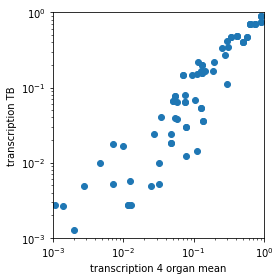

In [291]:
plt.figure(figsize=(4,4))
plt.scatter(combinebc['transcription 4-organ mean'],combinebc['transcription TB'])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('transcription 4 organ mean')
plt.ylabel('transcription TB')
plt.ylim(1e-3,1)
plt.xlim(1e-3,1)
plt.tight_layout()

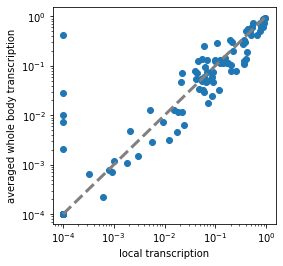

In [292]:
plt.figure(figsize=(4,4))
plt.scatter(combinebc['transcription']+1e-4,combinebc['transcription 4-organ mean']+1e-4)
plt.xlabel('local transcription')
plt.ylabel('averaged whole body transcription')
plt.xscale('log')
plt.yscale('log')
plt.plot((1e-4,1),(1e-4,1),ls='--',color='grey',lw=3)

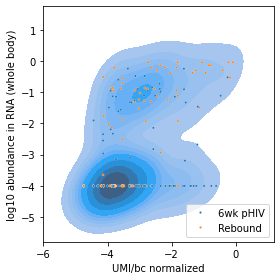

In [293]:
plt.figure(figsize=(4,4))
tdata = combinebc[combinebc['Timepoint']!='6wk pART']
sns.kdeplot(x=np.log10(tdata['UMI count normalized']),y=np.log10(tdata['transcription 4-organ mean']+1e-4),fill=True)
sns.scatterplot(x=np.log10(tdata['UMI count normalized']),y=np.log10(tdata['transcription 4-organ mean']+1e-4),s=5,hue=tdata['Timepoint'],hue_order=['6wk pHIV','Rebound'])
plt.xlabel('UMI/bc normalized')
plt.ylabel('log10 abundance in RNA (whole body)')
plt.legend(loc='lower right')
#plt.xlim(-0.05,3)
#plt.ylim(-4.05,0.05)
plt.tight_layout()
plt.savefig('figures/cor_RNA_abundance_with_proviral_per_bc_normalized.png',dpi=300)

In [294]:
ss.spearmanr(tdata['UMI count normalized'],tdata['transcription 4-organ mean'])

SignificanceResult(statistic=0.42172692497808295, pvalue=2.025177805711377e-11)

In [295]:
combinebc.to_csv('per_bc_summary_022623.csv')

In [296]:
combinebc = pd.read_csv('per_bc_summary_022623.csv',index_col=0)
combinebc

,barcode,UMI count,IS count,integrated frequency,unintegrated frequency,Mouse,sample name,Timepoint,UDP,Organ,truebc,transcription,UMI_per_IS,UMI count normalized,transcription 4-organ mean,transcription TB
0,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,103,93,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,Spleen,GCCTCCCTCTACGTCGTCTAC,0.069424,1.107527,0.015675,0.076087,0.064383
1,CTTATAGTGGACGACGTAGAGGGAGGCCCTACAA,63,61,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,Spleen,GCCTCCCTCTACGTCGTCCAC,0.000000,1.032787,0.009588,0.000000,0.000000
2,CTTATAGGCGTAGGAGGAGGTGAGGCCCCTACAA,19,19,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,Spleen,GGCCTCACCTCCTCCTACGCC,0.131093,1.000000,0.002891,0.128974,0.155346
3,CTTATAGCTGAAGTTGCGGCCGAAGTGCCTACAA,23,23,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,Spleen,CACTTCGGCCGCAACTTCAGC,0.475997,1.000000,0.003500,0.506288,0.398405
4,CTTATAGACGAAGCTGAGGAAGCGGGCTTATAG,1,1,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,Spleen,GCCCGCTTCCTCAGCTTCGTC,0.000000,1.000000,0.000152,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499,CTTATAGTGGGGGTAGACGGAGAGGTGGTTGATGTTTTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,Implant,AACATCAACCACCTCTCCGTCTACCCCCAC,0.000000,1.000000,0.001247,0.000000,0.000000
500,CTTATAGCCGGTGGAGATGCAGCGGAATTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,Implant,TTCCGCTGCATCTCCACCGGC,0.000000,1.000000,0.001247,0.000000,0.000000
501,CTTATAGAAGAGGTAGTCGCAGAGGAATTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,Implant,TTCCTCTGCGACTACCTCTTC,0.000000,1.000000,0.001247,0.000000,0.000000
502,CTTATAGACGCAGGGGCAGTCGGCGCTTTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,Implant,AGCGCCGACTGCCCCTGCGTC,0.000000,1.000000,0.001247,0.000000,0.000000


-0.04675467154192534 0.6197658924426259


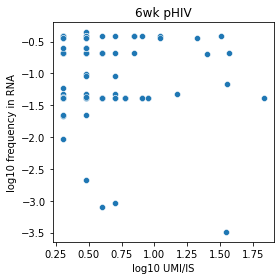

In [297]:
plt.figure(figsize=(4,4))
tdata = combineIS[(combineIS['Timepoint']=='6wk pHIV')&(combineIS['UMI count']>1)&(combineIS['transcription']>0)]
sns.scatterplot(x=np.log10(tdata['UMI count']),y=np.log10(tdata['transcription']+1e-4))
plt.xlabel('log10 UMI/IS')
plt.ylabel('log10 frequency in RNA')
plt.title('6wk pHIV')
plt.tight_layout()
rho,p = ss.spearmanr(tdata['UMI count'],tdata['transcription'])
print(rho,p)

In [298]:
#active vs inactive IS per bc
def active_IS_per_bc(UDP):
    tdata = combinebc[(combinebc['UDP']==UDP)&(combinebc['transcription']>0)]
    return ss.gmean(tdata['IS count'])

def inactive_IS_per_bc(UDP):
    tdata = combinebc[(combinebc['UDP']==UDP)&(combinebc['transcription']==0)]
    return ss.gmean(tdata['IS count'])

refdata['active_IS_per_bc'] = refdata['UDP'].apply(lambda x:active_IS_per_bc(x))
refdata['inactive_IS_per_bc'] = refdata['UDP'].apply(lambda x:inactive_IS_per_bc(x))

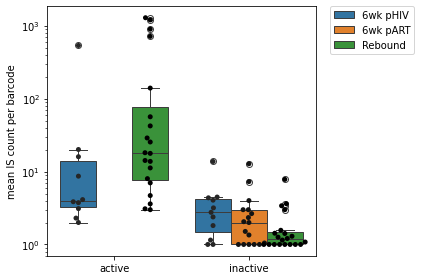

In [299]:
plt.figure(figsize=(6,4))
tlist = list(refdata['Timepoint'])+list(refdata['Timepoint']) 
ISpbclist = list(refdata['active_IS_per_bc'])+list(refdata['inactive_IS_per_bc'])
activelist = ['active']*len(refdata)+['inactive']*len(refdata)
sns.boxplot(hue=tlist,y=ISpbclist,x=activelist,hue_order=['6wk pHIV','6wk pART','Rebound'])
ax = sns.swarmplot(hue=tlist,y=ISpbclist,x=activelist,dodge=True,hue_order=['6wk pHIV','6wk pART','Rebound'],color='black')
plt.ylabel('mean IS count per barcode')
plt.xlabel('')
plt.yscale('log')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:3], labels[0:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.tight_layout()
plt.savefig('figures/active_proviral_IS_per_bc.png')

In [300]:
list(refdata)

['UDP',
 'Series',
 'Mouse',
 'Timepoint',
 'Organ',
 'HIV DNA copy/~500ng',
 'sample name',
 'effective reads',
 'UMI count',
 'valid',
 'barcode count',
 'provirus_type_integrated',
 'provirus_type_linear',
 'provirus_type_circular',
 'provirus_type_auto-integrated',
 'UMI_per_bc',
 'IS_per_bc',
 'UMI_per_IS',
 'gmean_UMI_per_bc',
 'gmean_IS_per_bc',
 'gmean_UMI_per_IS',
 'freq_IS_expanded',
 'UMI_per_IS_morethan1',
 'barcode active frequency (local RNA)',
 'barcode active frequency (TB RNA)',
 'barcode active frequency (all RNA)',
 'integrated_UMI_per_bc',
 'linear_UMI_per_bc',
 'circular_UMI_per_bc',
 'integrated barcode count',
 'linear barcode count',
 'circular barcode count',
 'integrated active barcode count (all RNA)',
 'integrated inactive barcode count (all RNA)',
 'linear active barcode count (all RNA)',
 'linear inactive barcode count (all RNA)',
 'circular active barcode count (all RNA)',
 'circular inactive barcode count (all RNA)',
 'active_IS_per_bc',
 'inactive_IS_pe

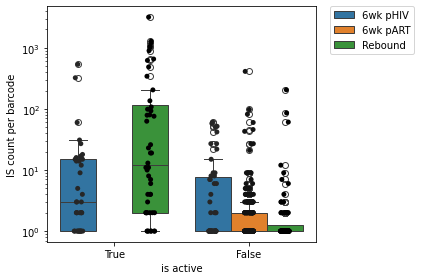

In [301]:
plt.figure(figsize=(6,4))
combinebc['is active'] = combinebc['transcription'].apply(lambda x: True if x > 0 else False)
sns.boxplot(x=combinebc['is active'],y=combinebc['IS count'],hue=combinebc['Timepoint'],hue_order=['6wk pHIV','6wk pART','Rebound'],order=[True,False])
ax = sns.stripplot(x=combinebc['is active'],y=combinebc['IS count'],hue=combinebc['Timepoint'],hue_order=['6wk pHIV','6wk pART','Rebound'],order=[True,False],dodge=True,color='black')
plt.yscale('log')
plt.ylabel('IS count per barcode')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:3], labels[0:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.tight_layout()
plt.savefig('figures/active_proviral_IS_per_bc_show_each_bc.png')

In [302]:
combinebc.to_csv('per_bc_summary_022423.csv')

In [303]:
refdata.to_csv('sample_summary_020723.csv')

In [304]:
ss.ranksums(refdata['active_IS_per_bc'],refdata['inactive_IS_per_bc'],nan_policy='omit')

RanksumsResult(statistic=6.193172026258874, pvalue=5.896531205399254e-10)

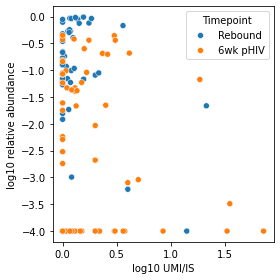

In [305]:
plt.figure(figsize=(4,4))
tdata = combinebc[combinebc['Timepoint']!='6wk pART']
sns.scatterplot(x=np.log10(tdata['UMI_per_IS']),y=np.log10(tdata['transcription']+1e-4),hue=tdata['Timepoint'])
plt.xlabel('log10 UMI/IS')
plt.ylabel('log10 relative abundance')
plt.tight_layout()

In [306]:
ss.spearmanr(np.log10(tdata['UMI_per_IS']),np.log10(tdata['transcription']+1e-4))

SignificanceResult(statistic=0.4111120780138735, pvalue=7.099164607948497e-11)

0.01905645751778929


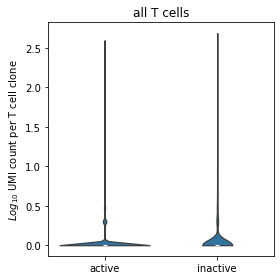

In [307]:
#Separate IS into active and inactive, compare their UMI/IS
tdata = combineIS[combineIS['Timepoint']!='6wk pART']
tdata1 = tdata[tdata['transcription']>0]
tdata2 = tdata[tdata['transcription']==0]
p = ss.ranksums(tdata1['UMI count'],tdata2['UMI count'])[1]
tdata['active'] = tdata['transcription'].apply(lambda x:'active' if x > 0 else 'inactive')
plt.figure(figsize=(4,4))
sns.violinplot(x=tdata['active'],y=np.log10(tdata['UMI count']),cut=0)
plt.xlabel('')
plt.ylabel('$Log_{10}$ UMI count per T cell clone')
plt.title('all T cells')
plt.tight_layout()
plt.savefig('figures/compare_UMI_by_RNA_existance.png',dpi=300)
print(p)

0.0006183402069247896


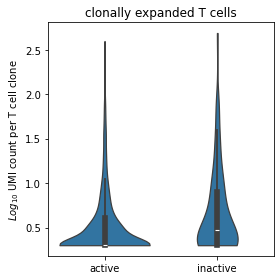

In [308]:
#Separate IS into active and inactive, compare their UMI/IS
tdata = combineIS[(combineIS['Timepoint']!='6wk pART')&(combineIS['UMI count']>1)]
tdata1 = tdata[tdata['transcription']>0]
tdata2 = tdata[tdata['transcription']==0]
p = ss.ranksums(tdata1['UMI count'],tdata2['UMI count'])[1]
tdata['active'] = tdata['transcription'].apply(lambda x:'active' if x > 0 else 'inactive')
plt.figure(figsize=(4,4))
sns.violinplot(x=tdata['active'],y=np.log10(tdata['UMI count']),cut=0)
plt.xlabel('')
plt.ylabel('$Log_{10}$ UMI count per T cell clone')
plt.title('clonally expanded T cells')
plt.tight_layout()
plt.savefig('figures/compare_UMI_by_RNA_existance_UMI_morethan1.png',dpi=300)
print(p)

6.696180305803622e-07


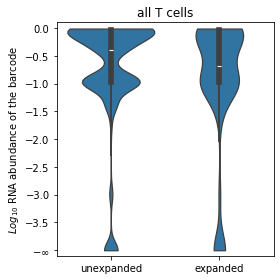

In [309]:
#Separate IS into clonal expanded and un-expanded, compare their transcription
tdata = combineIS[combineIS['Timepoint']!='6wk pART']
tdata1 = tdata[tdata['UMI count']>1]
tdata2 = tdata[tdata['UMI count']==1]
p = ss.ranksums(tdata1['transcription'],tdata2['transcription'])[1]
tdata['expanded'] = tdata['UMI count'].apply(lambda x:'expanded' if x > 1 else 'unexpanded')
plt.figure(figsize=(4,4))
sns.violinplot(x=tdata['expanded'],y=np.log10(tdata['transcription']+1e-4),cut=0)
plt.xlabel('')
plt.ylabel('$Log_{10}$ RNA abundance of the barcode')
locs,labels = plt.yticks()
labels[1] = '$-\infty$'
plt.yticks(locs,labels)
plt.ylim(-4.1,0.1)
plt.title('all T cells')
plt.tight_layout()
plt.savefig('figures/compare_RNA_by_T_cell_expansion.png',dpi=300)
print(p)

In [310]:
#t test also support the hypothesis
tdata = combineIS[combineIS['Timepoint']!='6wk pART']
tdata1 = tdata[tdata['UMI count']>1]
tdata2 = tdata[tdata['UMI count']==1]
ss.ttest_ind(np.log10(tdata1['transcription']+1e-4),np.log10(tdata2['transcription']+1e-4))

Ttest_indResult(statistic=-5.874180124725545, pvalue=4.345687065931743e-09)

0.0015085989945237094


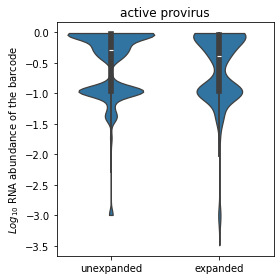

In [311]:
#Separate IS into clonal expanded and un-expanded, compare their transcription
tdata = combineIS[(combineIS['Timepoint']!='6wk pART')&(combineIS['transcription']>0)]
tdata1 = tdata[tdata['UMI count']>1]
tdata2 = tdata[tdata['UMI count']==1]
p = ss.ranksums(tdata1['transcription'],tdata2['transcription'])[1]
tdata['expanded'] = tdata['UMI count'].apply(lambda x:'expanded' if x > 1 else 'unexpanded')
plt.figure(figsize=(4,4))
sns.violinplot(x=tdata['expanded'],y=np.log10(tdata['transcription']+1e-4),cut=0)
plt.xlabel('')
plt.ylabel('$Log_{10}$ RNA abundance of the barcode')
#locs,labels = plt.yticks()
#labels[1] = '$-\infty$'
#plt.yticks(locs,labels)
#plt.ylim(-4.1,0.1)
plt.title('active provirus')
plt.tight_layout()
plt.savefig('figures/compare_RNA_by_T_cell_expansion_transcription_morethan0.png',dpi=300)
print(p)

In [312]:
combineIS.to_csv('all_T_cell_clone_integrated.csv')

In [313]:
#fisher's contigency table
tdata = combineIS[combineIS['Timepoint']!='6wk pART']
len1 = len(tdata[(tdata['UMI count']> 1)&(tdata['transcription']> 0)])
len2 = len(tdata[(tdata['UMI count']==1)&(tdata['transcription']> 0)])
len3 = len(tdata[(tdata['UMI count']> 1)&(tdata['transcription']==0)])
len4 = len(tdata[(tdata['UMI count']==1)&(tdata['transcription']==0)])
print(len1,len2,len3,len4)

934 12138 110 845


In [314]:
IScount = len(set(tdata[(tdata['UMI count']==1)&(tdata['transcription']> 0)]['Integration site']))
bccount = len(set(tdata[(tdata['UMI count']==1)&(tdata['transcription']> 0)]['truebc']))
print(IScount,bccount)

10874 57


In [315]:
ss.fisher_exact([[len1,len2],[len3,len4]])

SignificanceResult(statistic=0.5911038212076274, pvalue=2.8022463222349883e-06)

In [316]:
#cell count
tdata = combineIS[combineIS['Timepoint']!='6wk pART']
len1 = sum(tdata[(tdata['UMI count']> 1)&(tdata['transcription']> 0)]['UMI count'])
len2 = sum(tdata[(tdata['UMI count']==1)&(tdata['transcription']> 0)]['UMI count'])
len3 = sum(tdata[(tdata['UMI count']> 1)&(tdata['transcription']==0)]['UMI count'])
len4 = sum(tdata[(tdata['UMI count']==1)&(tdata['transcription']==0)]['UMI count'])
odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
print(len1,len2,len3,len4,odds,p)

5126 12138 1405 845 0.2539872134744624 1.9067429957045893e-197


In [317]:
(len1+len2+len3+len4)

19514

In [318]:
def test_odds(UDP):
    tdata = combineIS[combineIS['UDP']==UDP]
    if len(tdata) == 0:
        return np.nan
    len1 = len(tdata[(tdata['UMI count']> 1)&(tdata['transcription']> 0)])
    len2 = len(tdata[(tdata['UMI count']==1)&(tdata['transcription']> 0)])
    len3 = len(tdata[(tdata['UMI count']> 1)&(tdata['transcription']==0)])
    len4 = len(tdata[(tdata['UMI count']==1)&(tdata['transcription']==0)])
    odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
    if len2 == 0 or len3 == 0: odds = 10
    if len1 == 0 or len4 == 0: odds = 0.1
    return odds
    
refdata['Odds(RNA abundance vs T cell expansion)'] = refdata['UDP'].apply(lambda x:test_odds(x))

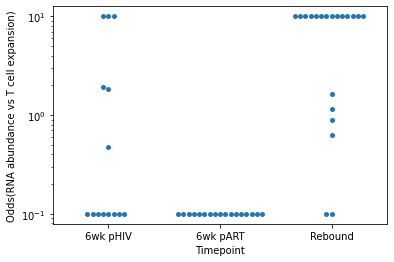

In [319]:
plt.figure(figsize=(6,4))
sns.swarmplot(x=refdata['Timepoint'],y=refdata['Odds(RNA abundance vs T cell expansion)'],order=['6wk pHIV','6wk pART','Rebound'])
plt.yscale('log')

The trend is opposite at barcode level.   
For each provirus, if it has more T cell expansion, it has less viral replication.  
For each viral clone with multiple cells, UMI/IS may be misguided by high UMI cells. 

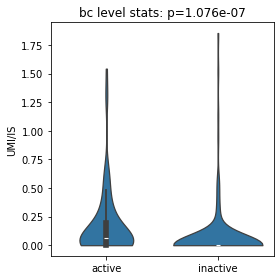

In [320]:
tdata = combinebc[combinebc['Timepoint']!='6wk pART']
tdata1 = tdata[tdata['transcription']>0]
tdata2 = tdata[tdata['transcription']==0]
p = ss.ranksums(tdata1['UMI_per_IS'],tdata2['UMI_per_IS'])[1]
tdata['active'] = tdata['transcription'].apply(lambda x:'active' if x > 0 else 'inactive')
plt.figure(figsize=(4,4))
sns.violinplot(x=tdata['active'],y=np.log10(tdata['UMI_per_IS']),cut=0)
plt.xlabel('')
plt.ylabel('UMI/IS')
plt.title('bc level stats: p='+str(round(p,10)))
plt.tight_layout()

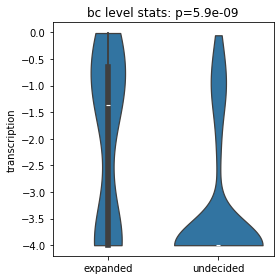

In [321]:
tdata = combinebc[combinebc['Timepoint']!='6wk pART']
tdata1 = tdata[tdata['UMI_per_IS']>1]
tdata2 = tdata[tdata['UMI_per_IS']==1]
p = ss.ranksums(tdata1['transcription'],tdata2['transcription'])[1]
tdata['expanded'] = tdata['UMI_per_IS'].apply(lambda x:'expanded' if x > 1 else 'undecided')
plt.figure(figsize=(4,4))
sns.violinplot(x=tdata['expanded'],y=np.log10(tdata['transcription']+1e-4),cut=0)
plt.xlabel('')
plt.title('bc level stats: p='+str(round(p,10)))
plt.tight_layout()

In [322]:
gmeanlist = []
for index,row in combinebc.iterrows():
    bc = row['truebc']
    UDP = row['UDP']
    tdata = combineIS[(combineIS['truebc']==bc)&(combineIS['UDP']==UDP)]
    gmeanlist.append(ss.gmean(tdata['UMI count']))
combinebc['gmean_UMI_per_IS'] = gmeanlist

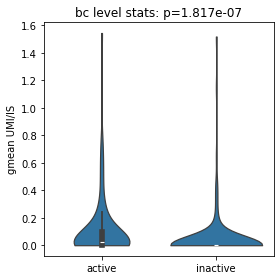

In [323]:
tdata = combinebc[combinebc['Timepoint']!='6wk pART']
tdata1 = tdata[tdata['transcription']>0]
tdata2 = tdata[tdata['transcription']==0]
p = ss.ranksums(tdata1['gmean_UMI_per_IS'],tdata2['gmean_UMI_per_IS'])[1]
tdata['active'] = tdata['transcription'].apply(lambda x:'active' if x > 0 else 'inactive')
plt.figure(figsize=(4,4))
sns.violinplot(x=tdata['active'],y=np.log10(tdata['gmean_UMI_per_IS']),cut=0)
plt.xlabel('')
plt.ylabel('gmean UMI/IS')
plt.title('bc level stats: p='+str(round(p,10)))
plt.tight_layout()

In [324]:
oddsdict = {}
pdict = {}
for time in ['6wk pHIV','Rebound']:
    for organ in dnaorgans:
        tdata = combineIS[(combineIS['Timepoint']==time)&(combineIS['Organ']==organ)]
        len1 = len(tdata[(tdata['UMI count']> 1)&(tdata['transcription']> 0)])
        len2 = len(tdata[(tdata['UMI count']==1)&(tdata['transcription']> 0)])
        len3 = len(tdata[(tdata['UMI count']> 1)&(tdata['transcription']==0)])
        len4 = len(tdata[(tdata['UMI count']==1)&(tdata['transcription']==0)])
        if len3 == 0: len3 = 1
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        oddsdict[time+'_'+organ] = odds
        pdict[time+'_'+organ] = p

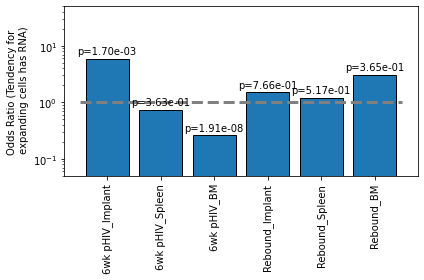

In [325]:
plt.figure(figsize=(6,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.05,50)
plt.hlines(y=1,xmin=-0.5,xmax=5.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio (Tendency for\n expanding cells has RNA)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

6wk pHIV 115 1053 83 373 0.4907950891886635 9.672943464630575e-06
Rebound 819 11085 27 472 1.2915952488347617 0.2379377979946461


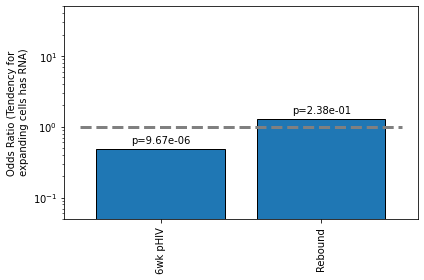

In [326]:
oddsdict = {}
pdict = {}
for time in ['6wk pHIV','Rebound']:
        tdata = combineIS[(combineIS['Timepoint']==time)]
        len1 = len(tdata[(tdata['UMI count']> 1)&(tdata['transcription']> 0)])
        len2 = len(tdata[(tdata['UMI count']==1)&(tdata['transcription']> 0)])
        len3 = len(tdata[(tdata['UMI count']> 1)&(tdata['transcription']==0)])
        len4 = len(tdata[(tdata['UMI count']==1)&(tdata['transcription']==0)])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        oddsdict[time] = odds
        pdict[time] = p
        print(time,len1,len2,len3,len4,odds,p)
plt.figure(figsize=(6,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.05,50)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio (Tendency for\n expanding cells has RNA)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

In [327]:
def count_IS(x):
    return len(combineIS[combineIS['UDP']==x])

refdata['IS count'] = refdata['UDP'].apply(lambda x:count_IS(x))

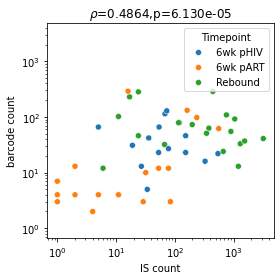

In [328]:
plt.figure(figsize=(4,4))
sns.scatterplot(x=refdata['IS count'],y=refdata['barcode count'],hue=refdata['Timepoint'],hue_order=['6wk pHIV','6wk pART','Rebound'])
plt.xscale('log')
plt.yscale('log')
rho,p = ss.spearmanr(refdata['IS count'],refdata['barcode count'])
plt.title(r'$\rho$='+str(round(rho,4))+',p={:0.3e}'.format(p))
xlim=plt.xlim()
plt.ylim(xlim)
plt.tight_layout()

In [329]:
for UDP in bcdata:
    bcdata[UDP].to_csv('ISS_count/barcode_list_'+UDP+'.csv',index=False)

In [330]:
for UDP in bcdata:
    sample = refdata[refdata['UDP']==UDP]['sample name'].iloc[0].replace(' ','_')
    bcdata[UDP].drop(columns=['barcode']).to_csv('ISS_count_rename/barcode_list_'+sample+'.csv',index=False)

In [331]:
for UDP in bcdata:
    sample = refdata[refdata['UDP']==UDP]['sample name'].iloc[0].replace(' ','_')
    bcdata[UDP][['truebc','annotation','UMI count']].to_csv('clean_IS_abundance/barcode_list_'+sample+'.csv',index=False)

In [332]:
        time = 'Rebound'
        tdata = combineIS[(combineIS['Timepoint']==time)]
        len1 = len(tdata[(tdata['UMI count']> 1)&(tdata['transcription']> 0)])
        len2 = len(tdata[(tdata['UMI count']==1)&(tdata['transcription']> 0)])
        len3 = len(tdata[(tdata['UMI count']> 1)&(tdata['transcription']==0)])
        len4 = len(tdata[(tdata['UMI count']==1)&(tdata['transcription']==0)])
        W,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        print(W,p,[len1,len2],[len3,len4])

1.2915952488347617 0.2379377979946461 [819, 11085] [27, 472]


In [333]:
        time = 'Rebound'
        tdata = combinebc[(combinebc['Timepoint']==time)]
        len1 = len(tdata[(tdata['UMI_per_IS']> 1)&(tdata['transcription']> 0)])
        len2 = len(tdata[(tdata['UMI_per_IS']==1)&(tdata['transcription']> 0)])
        len3 = len(tdata[(tdata['UMI_per_IS']> 1)&(tdata['transcription']==0)])
        len4 = len(tdata[(tdata['UMI_per_IS']==1)&(tdata['transcription']==0)])
        W,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        print(W,p,[len1,len2],[len3,len4])

16.346938775510203 2.384202314477955e-10 [27, 21] [7, 89]


In [334]:
        tdata = combinebc[(combinebc['Timepoint']!='6wk pART')]
        len1 = len(tdata[(tdata['UMI_per_IS']> 1)&(tdata['transcription']> 0)])
        len2 = len(tdata[(tdata['UMI_per_IS']==1)&(tdata['transcription']> 0)])
        len3 = len(tdata[(tdata['UMI_per_IS']> 1)&(tdata['transcription']==0)])
        len4 = len(tdata[(tdata['UMI_per_IS']==1)&(tdata['transcription']==0)])
        W,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        print(W,p,[len1,len2],[len3,len4])

7.4071428571428575 4.0223679679703824e-11 [51, 35] [24, 122]


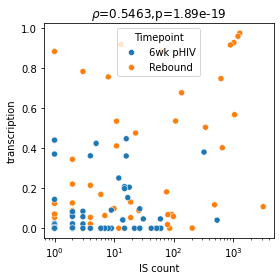

In [335]:
plt.figure(figsize=(4,4))
tdata = combinebc[combinebc['Timepoint']!='6wk pART']
sns.scatterplot(x=tdata['IS count'],y=tdata['transcription'],hue=tdata['Timepoint'],hue_order=['6wk pHIV','Rebound'])
plt.xscale('log')
rho,p = ss.spearmanr(tdata['IS count'],tdata['transcription'])
plt.title(r'$\rho$='+str(round(rho,4))+',p={:0.2e}'.format(p))
plt.tight_layout()

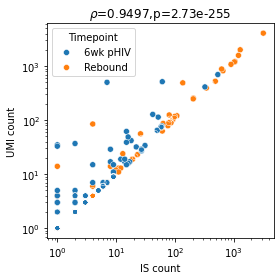

In [336]:
plt.figure(figsize=(4,4))
tdata = combinebc
sns.scatterplot(x=tdata['IS count'],y=tdata['UMI count'],hue=tdata['Timepoint'],hue_order=['6wk pHIV','Rebound'])
plt.xscale('log')
plt.yscale('log')
rho,p = ss.spearmanr(tdata['IS count'],tdata['UMI count'])
plt.title(r'$\rho$='+str(round(rho,4))+',p={:0.2e}'.format(p))
plt.tight_layout()

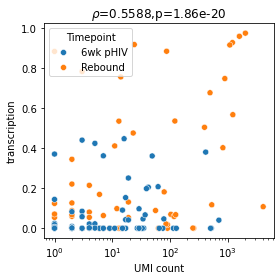

In [337]:
plt.figure(figsize=(4,4))
tdata = combinebc[combinebc['Timepoint']!='6wk pART']
sns.scatterplot(x=tdata['UMI count'],y=tdata['transcription'],hue=tdata['Timepoint'],hue_order=['6wk pHIV','Rebound'])
plt.xscale('log')
rho,p = ss.spearmanr(tdata['UMI count'],tdata['transcription'])
plt.title(r'$\rho$='+str(round(rho,4))+',p={:0.2e}'.format(p))
plt.tight_layout()

#### human genome analysis

In [338]:
bcdata['UDP01']

,barcode,annotation,UMI count,read count,mapping length,truebc,transcription,provirus type
0,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,circular,2356,553084,10.0,GCCTCCCTCTACGTCGTCTAC,0.069424,circular
1,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,chr2:85708835:-,1,8,18.0,GCCTCCCTCTACGTCGTCTAC,0.069424,integrated
2,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,chr5:168423417:-,4,93,96.5,GCCTCCCTCTACGTCGTCTAC,0.069424,integrated
3,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,BCNFNSX:8443:+,40,4192,58.5,GCCTCCCTCTACGTCGTCTAC,0.069424,auto-integrated
4,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,chr11:34258609:+,1,8,129.0,GCCTCCCTCTACGTCGTCTAC,0.069424,integrated
...,...,...,...,...,...,...,...,...
326,CTTATAGTTGAAGGGGCAGAAGCAGATCCTACAA,linear,2,23,3.0,ATCTGCTTCTGCCCCTTCAAC,0.059084,linear
327,CTTATAGCTGAAGTTGCGGCCGAAGAGCCTACAA,linear,1,9,7.0,CTCTTCGGCCGCAACTTCAGC,0.000000,linear
328,CTTATAGTGGACGACGTAGAGGAAGGCCCTACAA,linear,1,6,7.0,GCCTTCCTCTACGTCGTCCAC,0.000000,linear
329,CTTATAGTGGACGACATAGAGGGAGGCCCTACAA,linear,1,6,7.0,GCCTCCCTCTATGTCGTCCAC,0.000000,linear


1. annotate a human readable gene name (or intergenic)
2. annotate an Ensembl ID
3. annotate distance and direction to nearby histone markers
4. annotate ATAC/DNaseI-seq distance and direction
5. annotate nucleus 3D structure, distance to nuclear membrane
6. annotate distance to enhancers/ promoters. Genome composition annotation
7. annotate whether in repeat regions (HERV, LTR, LINE)
8. annotate to cancer related genes (or other HIV related disease).
---
1. Correlate these annotations to UMI count(T cell clonal expansion) and transcription(viral replication).
2. Analyze using contigency table, ranksums test and spearman's correlation test.
3. Analyze in individual IS/bc level, sample/mouse level.

In [339]:
#1. Annotate a human readable gene name (or intergenic)
#2. Annotate an Ensembl ID
#need new column: bacdata[UDP][['in_gene','in_coding_gene','in_ncRNA','in_pseudogene','gene name','Ensembl ID']
#pseudogene may not transcribe or transcribe at low level, but it may still have some TF binding motifs or enhancers.

generef = pd.read_csv('../../database/genome_annotation/hg38_Ensembl_release108.gff3',sep='\t',comment='#',names=['seqid','source','type','start','end','score','strand','phase','attributes'])
generef

,seqid,source,type,start,end,score,strand,phase,attributes
0,1,GRCh38,chromosome,1,248956422,.,.,.,"ID=chromosome:1;Alias=CM000663.2,chr1,NC_00000..."
1,1,.,biological_region,10469,11240,1.3e+03,.,.,external_name=oe %3D 0.79;logic_name=cpg
2,1,.,biological_region,10650,10657,0.999,+,.,logic_name=eponine
3,1,.,biological_region,10655,10657,0.999,-,.,logic_name=eponine
4,1,.,biological_region,10678,10687,0.999,+,.,logic_name=eponine
...,...,...,...,...,...,...,...,...,...
3403472,Y,.,biological_region,26626966,26627137,0.994,-,.,external_name=rank %3D 1;logic_name=firstef
3403473,Y,.,biological_region,26627457,26628186,0.997,+,.,external_name=rank %3D 1;logic_name=firstef
3403474,Y,havana,pseudogene,56855244,56855488,.,+,.,ID=gene:ENSG00000235857;Name=CTBP2P1;biotype=p...
3403475,Y,havana,pseudogenic_transcript,56855244,56855488,.,+,.,ID=transcript:ENST00000431853;Parent=gene:ENSG...


In [340]:
generef.groupby('type').size()

type
CDS                        883815
C_gene_segment                 29
D_gene_segment                 41
J_gene_segment                 97
V_gene_segment                252
biological_region          182510
chromosome                     25
exon                      1642498
five_prime_UTR             173147
gene                        21519
lnc_RNA                     91292
mRNA                       110673
miRNA                        1877
ncRNA                        2220
ncRNA_gene                  25954
pseudogene                  15230
pseudogenic_transcript      15232
rRNA                           55
scRNA                          50
scaffold                      169
snRNA                        1915
snoRNA                        942
tRNA                           22
three_prime_UTR            206310
transcript                  26460
unconfirmed_transcript       1143
dtype: int64

In [341]:
generef = generef[generef['type'].isin(['gene','ncRNA_gene','pseudogene'])]

In [342]:
!awk '$3 == "pseudogene" || $3 == "ncRNA_gene" || $3 == "gene"' ../../database/genome_annotation/hg38_Ensembl_release108.gff3 > ../../database/genome_annotation/hg38_Ensembl_genes.gff3

In [343]:
#host gene
def gene_name_from_attribute(x):
    if 'Name=' not in x:
        return x.rsplit('ID=gene:')[-1].rsplit(';')[0]
    else:
        return x.rsplit(';Name=')[-1].rsplit(';')[0]
    
def find_host_gene(x):
    tdata = interdata[interdata['row number']==x.name]
    x['multiple gene'] = len(tdata)
    if len(tdata) == 0:
        x['host gene'] = np.nan
        x['gene type'] = np.nan
        x['gene direction'] = np.nan
        x['ENSG'] = np.nan
    if len(tdata) > 1:
        ttdata = tdata[tdata['type']=='gene']
        if len(ttdata) >= 1:
            x['host gene'] = gene_name_from_attribute(ttdata['attributes'].iloc[0])
            x['gene type'] = ttdata['type'].iloc[0]
            x['gene direction'] = ttdata['strand2'].iloc[0]
            x['ENSG'] = ttdata['attributes'].iloc[0].rsplit('ID=gene:')[-1].rsplit(';')[0]
        else:
            x['host gene'] = gene_name_from_attribute(tdata['attributes'].iloc[0])
            x['gene type'] = tdata['type'].iloc[0]
            x['gene direction'] = tdata['strand2'].iloc[0]
            x['ENSG'] = tdata['attributes'].iloc[0].rsplit('ID=gene:')[-1].rsplit(';')[0]
    if len(tdata) == 1:
        x['host gene'] = gene_name_from_attribute(tdata['attributes'].iloc[0])
        x['gene type'] = tdata['type'].iloc[0]
        x['gene direction'] = tdata['strand2'].iloc[0]
        x['ENSG'] = tdata['attributes'].iloc[0].rsplit('ID=gene:')[-1].rsplit(';')[0]
    return x
    
for UDP in bcdata:
    outfile = open('bed/IS_hg38_'+UDP+'.bed','w')
    for i,row in bcdata[UDP].iterrows():
        if 'chr' in row['annotation']:
            record = row['annotation'].rsplit(':')
            outfile.write(record[0][3:]+'\t'+record[1]+'\t'+record[1]+'\t'+str(i)+'\t'+str(row['UMI count'])+'\t'+record[2]+'\n')
    outfile.close()
    !bedtools intersect -wb -a bed/IS_hg38_{UDP}.bed -b ../../database/genome_annotation/hg38_Ensembl_genes.gff3 > bed/IS_genes_hg38_{UDP}.bed
    interdata = pd.read_csv('bed/IS_genes_hg38_'+UDP+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','type','start','end','score','strand2','phase','attributes'])
    bcdata[UDP] = bcdata[UDP].apply(find_host_gene,axis=1)
    tlist = ['barcode','annotation','UMI count','read count','mapping length','truebc','transcription','provirus type']
    bcdata[UDP] = bcdata[UDP][tlist+['multiple gene','host gene','ENSG','gene type','gene direction']]

In [344]:
tdata = bcdata[UDP][~bcdata[UDP]['host gene'].isnull()]
tdata

,barcode,annotation,UMI count,read count,mapping length,truebc,transcription,provirus type,multiple gene,host gene,ENSG,gene type,gene direction
8,CTTATAGGCGAAGATGTTGTTGAGGTATTATAG,chr13:108728675:+,1,26,54.0,TACCTCAACAACATCTTCGCC,0,integrated,1,MYO16,ENSG00000041515,gene,+
11,CTTATAG,chr10:127938138:+,1,12,128.0,G,0,integrated,1,PTPRE,ENSG00000132334,gene,+
14,CTTATAG,chr5:34719522:+,1,13,128.0,G,0,integrated,1,RAI14,ENSG00000039560,gene,+
15,CTTATAG,chr11:76699025:-,3,39,129.0,G,0,integrated,2,GUCY2EP,ENSG00000204529,pseudogene,-
17,CTTATAG,chr15:78093588:+,1,14,129.0,G,0,integrated,1,SH2D7,ENSG00000183476,gene,+
...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,CTTATAGTGGGCGGTGATGAAGTAGGTTTATAG,chr1:87710108:-,1,11,71.0,ACCTACTTCATCACCGCCCAC,0,integrated,1,PKN2-AS1,ENSG00000237505,ncRNA_gene,-
150,CTTATAGAAGCGGACGAGGTTGTAGCATTATAG,chr11:76699025:-,1,13,129.0,TGCTACAACCTCGTCCGCTTC,0,integrated,2,GUCY2EP,ENSG00000204529,pseudogene,-
151,CTTATAGTCGATGGAGGAGACGAAGAATTATAG,chr7:128333314:+,1,11,128.0,TTCTTCGTCTCCTCCATCGAC,0,integrated,1,RBM28,ENSG00000106344,gene,-
152,CTTATAGTAGCTGAAGGCGATGCAGTTTTATAG,chrX:46928276:-,1,14,76.0,AACTGCATCGCCTTCAGCTAC,0,integrated,1,JADE3,ENSG00000102221,gene,+


In [345]:
#annotate to combineIS
def find_host_gene_IS(x):
    UDP = x['UDP']
    bc = x['barcode']
    IS = x['Integration site']
    tdata = bcdata[UDP]
    tdata = tdata[(tdata['barcode']==bc)&(tdata['annotation']==IS)]
    x['host gene'] = tdata['host gene'].iloc[0]
    x['gene type'] = tdata['gene type'].iloc[0]
    x['gene direction'] = tdata['gene direction'].iloc[0]
    x['ENSG'] = tdata['ENSG'].iloc[0]
    return x
    
tlist = ['Integration site' ,'UMI count' ,'Mouse' ,'sample name' ,'Timepoint', 'UDP', 'barcode' ,'Organ', 'truebc', 'transcription']
combineIS = combineIS.apply(find_host_gene_IS,axis=1)

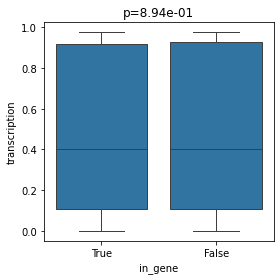

In [346]:
#compare transcription of in gene and out of gene provirus
tdata = combineIS[combineIS['Timepoint']!='6wk pART']
t1data = tdata[tdata['host gene'].isnull()]
t2data = tdata[~tdata['host gene'].isnull()]
W,p = ss.ranksums(t1data['transcription'],t2data['transcription'])
tdata['in_gene'] = tdata['host gene'].apply(lambda x:True if x==x else False)
plt.figure(figsize=(4,4))
sns.boxplot(y=tdata['transcription'],x=tdata['in_gene'],order=[True,False])
plt.title('p=%.2e' % p)
plt.tight_layout()

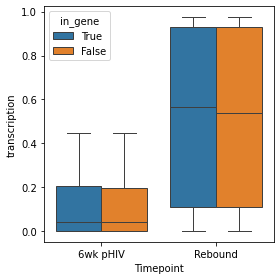

In [347]:
plt.figure(figsize=(4,4))
sns.boxplot(y=tdata['transcription'],x=tdata['Timepoint'],order=['6wk pHIV','Rebound'],hue_order=[True,False],hue=tdata['in_gene'])
plt.tight_layout()

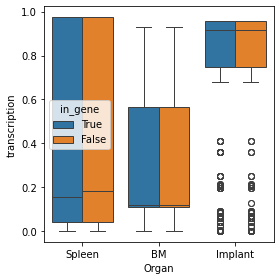

In [348]:
plt.figure(figsize=(4,4))
sns.boxplot(y=tdata['transcription'],x=tdata['Organ'],hue_order=[True,False],hue=tdata['in_gene'])
plt.tight_layout()

0.04819611445679326


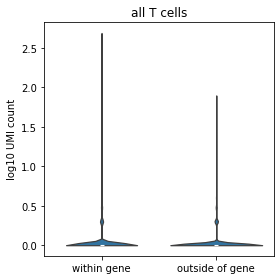

In [349]:
#compare UMI count of in gene and out of gene provirus (clonal expansion)
tdata = combineIS
t1data = tdata[tdata['host gene'].isnull()]
t2data = tdata[~tdata['host gene'].isnull()]
W,p = ss.ranksums(t1data['UMI count'],t2data['UMI count'])
tdata['in_gene'] = tdata['host gene'].apply(lambda x:True if x==x else False)
plt.figure(figsize=(4,4))
sns.violinplot(y=np.log10(tdata['UMI count']),x=tdata['in_gene'],order=[True,False],cut=0)
plt.ylabel('log10 UMI count')
plt.title('all T cells')
plt.xlabel('')
plt.xticks(ticks=[0,1],labels=['within gene','outside of gene'])
plt.tight_layout()
plt.savefig('figures/UMI_per_IS_within_gene_all_T.png',dpi=300)
print(p)

0.013650427771885739


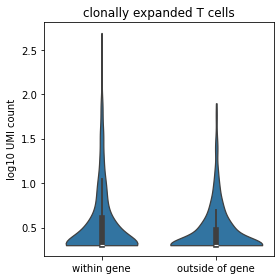

In [350]:
tdata = combineIS[combineIS['UMI count']>1]
t1data = tdata[tdata['host gene'].isnull()]
t2data = tdata[~tdata['host gene'].isnull()]
W,p = ss.ranksums(t1data['UMI count'],t2data['UMI count'])
tdata['in_gene'] = tdata['host gene'].apply(lambda x:True if x==x else False)
plt.figure(figsize=(4,4))
sns.violinplot(y=np.log10(tdata['UMI count']),x=tdata['in_gene'],order=[True,False],cut=0)
plt.ylabel('log10 UMI count')
plt.title('clonally expanded T cells')
plt.xlabel('')
plt.xticks(ticks=[0,1],labels=['within gene','outside of gene'])
plt.tight_layout()
plt.savefig('figures/UMI_per_IS_within_gene_expanded_only.png',dpi=300)
print(p)

In [351]:
l1 = len(combineIS)
l2 = len(combineIS[combineIS['in_gene']])
print(l1,l2)

15305 9547


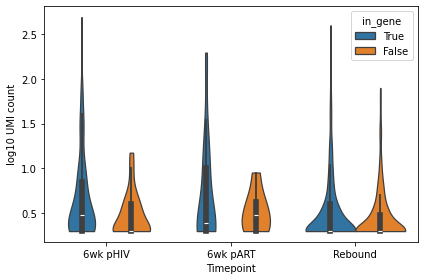

In [352]:
plt.figure(figsize=(6,4))
sns.violinplot(y=np.log10(tdata['UMI count']),x=tdata['Timepoint'],order=['6wk pHIV','6wk pART','Rebound'],hue_order=[True,False],hue=tdata['in_gene'],cut=0)
plt.ylabel('log10 UMI count')
plt.tight_layout()

In [353]:
#contigency table
tdata = combineIS
tdata['in_gene'] = tdata['host gene'].apply(lambda x:True if x==x else False)
len1 = len(tdata[(tdata['UMI count']>1)&(tdata['in_gene'])])
len2 = len(tdata[(tdata['UMI count']>1)&(~tdata['in_gene'])])
len3 = len(tdata[(tdata['UMI count']==1)&(tdata['in_gene'])])
len4 = len(tdata[(tdata['UMI count']==1)&(~tdata['in_gene'])])
odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
print(len1,len2,len3,len4,odds,p)

743 341 8804 5417 1.3406432826454517 1.2804835575726259e-05


In [354]:
oddsdict = {}
pdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    for organ in dnaorgans:
        tdata = combineIS[(combineIS['Timepoint']==time)&(combineIS['Organ']==organ)]
        len1 = len(tdata[(tdata['UMI count']>1)&(tdata['in_gene'])])
        len2 = len(tdata[(tdata['UMI count']>1)&(~tdata['in_gene'])])
        len3 = len(tdata[(tdata['UMI count']==1)&(tdata['in_gene'])])
        len4 = len(tdata[(tdata['UMI count']==1)&(~tdata['in_gene'])])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        oddsdict[time+'_'+organ] = odds
        pdict[time+'_'+organ] = p

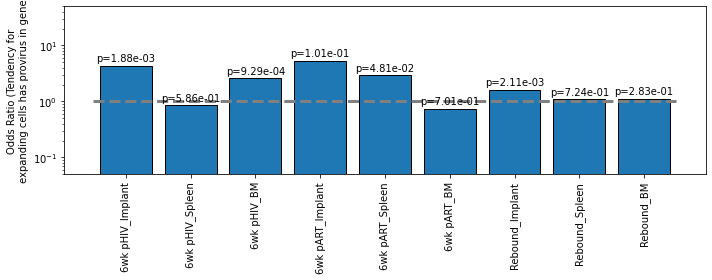

In [355]:
plt.figure(figsize=(10,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.05,50)
plt.hlines(y=1,xmin=-0.5,xmax=8.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio (Tendency for\n expanding cells has provirus in gene)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

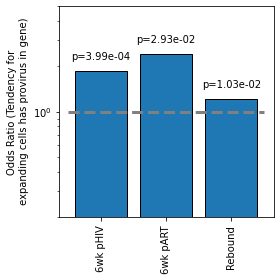

In [356]:
oddsdict = {}
pdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    tdata = combineIS[(combineIS['Timepoint']==time)]
    len1 = len(tdata[(tdata['UMI count']>1)&(tdata['in_gene'])])
    len2 = len(tdata[(tdata['UMI count']>1)&(~tdata['in_gene'])])
    len3 = len(tdata[(tdata['UMI count']==1)&(tdata['in_gene'])])
    len4 = len(tdata[(tdata['UMI count']==1)&(~tdata['in_gene'])])
    odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
    oddsdict[time] = odds
    pdict[time] = p

plt.figure(figsize=(4,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.2,5)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio (Tendency for\n expanding cells has provirus in gene)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

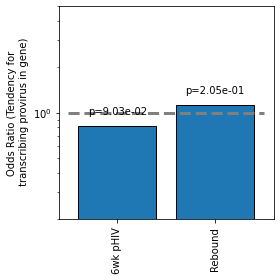

In [357]:
oddsdict = {}
pdict = {}
for time in ['6wk pHIV','Rebound']:
    tdata = combineIS[(combineIS['Timepoint']==time)]
    len1 = len(tdata[(tdata['transcription']>0)&(tdata['in_gene'])])
    len2 = len(tdata[(tdata['transcription']>0)&(~tdata['in_gene'])])
    len3 = len(tdata[(tdata['transcription']==0)&(tdata['in_gene'])])
    len4 = len(tdata[(tdata['transcription']==0)&(~tdata['in_gene'])])
    odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
    oddsdict[time] = odds
    pdict[time] = p

plt.figure(figsize=(4,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.2,5)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio (Tendency for\n transcribing provirus in gene)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

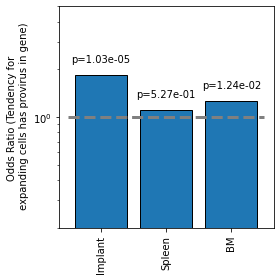

In [358]:
oddsdict = {}
pdict = {}
for organ in dnaorgans:
    tdata = combineIS[(combineIS['Organ']==organ)]
    len1 = len(tdata[(tdata['UMI count']>1)&(tdata['in_gene'])])
    len2 = len(tdata[(tdata['UMI count']>1)&(~tdata['in_gene'])])
    len3 = len(tdata[(tdata['UMI count']==1)&(tdata['in_gene'])])
    len4 = len(tdata[(tdata['UMI count']==1)&(~tdata['in_gene'])])
    odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
    oddsdict[organ] = odds
    pdict[organ] = p

plt.figure(figsize=(4,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.2,5)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio (Tendency for\n expanding cells has provirus in gene)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

In [359]:
#same direction or opposite direction
def gene_direction(x):
    if x['IS direction'] == x['gene direction']:
        return True
    else:
        return False

combineIS['IS direction'] = combineIS['Integration site'].apply(lambda x:x.rsplit(':')[2])
combineIS['same direction with gene'] = combineIS.apply(lambda x:gene_direction(x),axis=1)

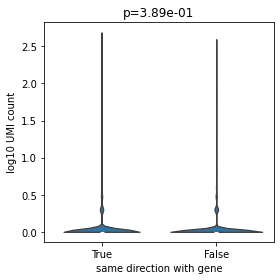

In [360]:
tdata = combineIS[~combineIS['host gene'].isnull()]
t1data = tdata[tdata['same direction with gene']==True]
t2data = tdata[tdata['same direction with gene']==False]
W,p = ss.ranksums(t1data['UMI count'],t2data['UMI count'])
plt.figure(figsize=(4,4))
sns.violinplot(y=np.log10(tdata['UMI count']),x=tdata['same direction with gene'],order=[True,False],cut=0)
plt.ylabel('log10 UMI count')
plt.title('p=%.2e' % p)
plt.tight_layout()

In [361]:
len1 = len(tdata[(tdata['UMI count']>1)&(tdata['same direction with gene'])])
len2 = len(tdata[(tdata['UMI count']>1)&(~tdata['same direction with gene'])])
len3 = len(tdata[(tdata['UMI count']==1)&(tdata['same direction with gene'])])
len4 = len(tdata[(tdata['UMI count']==1)&(~tdata['same direction with gene'])])
odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
print(len1,len2,len3,len4,odds,p)

382 361 4222 4582 1.1483995585713143 0.07240548342367925


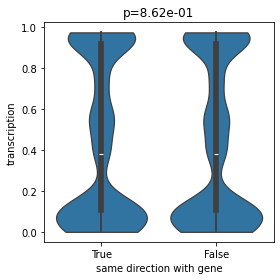

In [362]:
tdata = combineIS[~combineIS['host gene'].isnull()]
t1data = tdata[tdata['same direction with gene']==True]
t2data = tdata[tdata['same direction with gene']==False]
W,p = ss.ranksums(t1data['transcription'],t2data['transcription'])
plt.figure(figsize=(4,4))
sns.violinplot(y=tdata['transcription'],x=tdata['same direction with gene'],order=[True,False],cut=0)
plt.ylabel('transcription')
plt.title('p=%.2e' % p)
plt.tight_layout()

In [363]:
len1 = len(tdata[(tdata['transcription']>0)&(tdata['same direction with gene'])])
len2 = len(tdata[(tdata['transcription']>0)&(~tdata['same direction with gene'])])
len3 = len(tdata[(tdata['transcription']==0)&(tdata['same direction with gene'])])
len4 = len(tdata[(tdata['transcription']==0)&(~tdata['same direction with gene'])])
odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
print(len1,len2,len3,len4,odds,p)

3887 4244 717 699 0.8928884095291802 0.05009371144267405


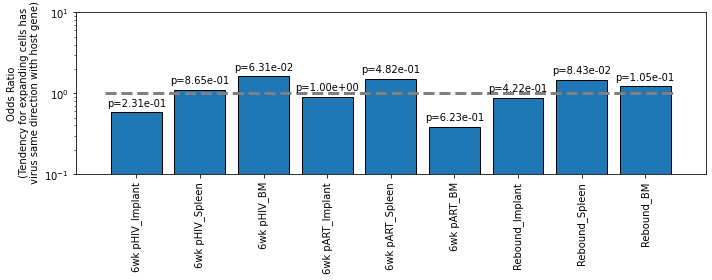

In [364]:
oddsdict = {}
pdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    for organ in dnaorgans:
        tdata = combineIS[(combineIS['Timepoint']==time)&(combineIS['Organ']==organ)&combineIS['host gene']]
        len1 = len(tdata[(tdata['UMI count']>1)&(tdata['same direction with gene'])])
        len2 = len(tdata[(tdata['UMI count']>1)&(~tdata['same direction with gene'])])
        len3 = len(tdata[(tdata['UMI count']==1)&(tdata['same direction with gene'])])
        len4 = len(tdata[(tdata['UMI count']==1)&(~tdata['same direction with gene'])])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        oddsdict[time+'_'+organ] = odds
        pdict[time+'_'+organ] = p
plt.figure(figsize=(10,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.1,10)
plt.hlines(y=1,xmin=-0.5,xmax=8.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio\n (Tendency for expanding cells has\n virus same direction with host gene)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

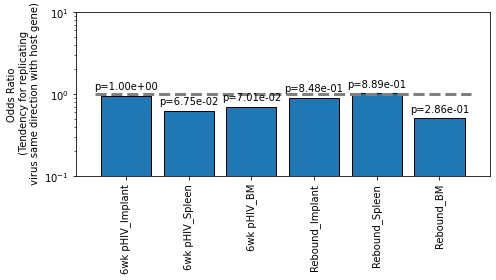

In [365]:
oddsdict = {}
pdict = {}
for time in ['6wk pHIV','Rebound']:
    for organ in dnaorgans:
        tdata = combineIS[(combineIS['Timepoint']==time)&(combineIS['Organ']==organ)&combineIS['host gene']]
        len1 = len(tdata[(tdata['transcription']>0)&(tdata['same direction with gene'])])
        len2 = len(tdata[(tdata['transcription']>0)&(~tdata['same direction with gene'])])
        len3 = len(tdata[(tdata['transcription']==0)&(tdata['same direction with gene'])])
        len4 = len(tdata[(tdata['transcription']==0)&(~tdata['same direction with gene'])])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        oddsdict[time+'_'+organ] = odds
        pdict[time+'_'+organ] = p
plt.figure(figsize=(7,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.1,10)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio\n (Tendency for replicating\n virus same direction with host gene)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

In [366]:
#Does integration favors gene region?
#Generate random integration file

In [367]:
!bedtools random -l 1 -n {len(combineIS)} -seed 0 -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_sites.bed
!bedtools intersect -wb -a bed/random_sites.bed -b ../../database/genome_annotation/hg38_Ensembl_genes.gff3 > bed/random_genes_hg38.bed

In [368]:
randomsite = pd.read_csv('bed/random_sites.bed',sep='\t',names=['chrom','pos','pos1','row number','score','strand'])
interdata = pd.read_csv('bed/random_genes_hg38.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','type','start','end','score','strand2','phase','attributes'])
randomsite = randomsite.apply(find_host_gene,axis=1)
randomsite

,chrom,pos,pos1,row number,score,strand,multiple gene,host gene,gene type,gene direction,ENSG
0,2,156661722,156661723,1,1,+,0,NaN,NaN,NaN,NaN
1,11,8753159,8753160,2,1,-,1,LINC01958,ncRNA_gene,+,ENSG00000283436
2,15,98191623,98191624,3,1,-,1,DENND2B,gene,-,ENSG00000166444
3,2,57726841,57726842,4,1,-,1,ENSG00000259199,ncRNA_gene,-,ENSG00000259199
4,12,57667450,57667451,5,1,+,0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
15300,4,38274484,38274485,15301,1,+,0,NaN,NaN,NaN,NaN
15301,10,63086465,63086466,15302,1,+,0,NaN,NaN,NaN,NaN
15302,1,148597787,148597788,15303,1,-,0,NaN,NaN,NaN,NaN
15303,19,7736772,7736773,15304,1,+,1,NBPF14,gene,-,ENSG00000270629


In [369]:
len1 = len(combineIS[combineIS['host gene']!=combineIS['host gene']])
len2 = len(combineIS[combineIS['host gene']==combineIS['host gene']])
len3 = len(randomsite[randomsite['host gene']!=randomsite['host gene']])
len4 = len(randomsite[randomsite['host gene']==randomsite['host gene']])
odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
print(len1,len2,len3,len4,odds,p)

5758 9547 7129 8176 0.6916987742225994 9.882398544447948e-57


In [370]:
1/odds

1.4457160215787581

UCSC names the chromosomes differently from Ensembl, mainly just adding "chr", but for scaffolds it is more complex, and names must be matched manually.

https://www.biostars.org/p/209119/

In [371]:
#adapt ensembl gff3 chromosome name to work with ucsc reference
chromsizedict = {}
infile = open('../../database/genome_annotation/hg38.chrom.sizes')
for line in infile:
    line = line.rstrip().rsplit('\t')
    chromsizedict[line[0]] = line[1]
infile.close()

In [372]:
def find_newseqid(x):
    if x == 'MT': return 'M'
    if str(x) in chromsizedict: return x
    x = str(x).rsplit('.')[0]
    for chrom in chromsizedict:
        if x in chrom:
            return chrom
    
generef['newseqid'] = generef['seqid'].apply(lambda x:find_newseqid(x))

In [373]:
generef[['newseqid','source','type','start','end','score','strand','phase','attributes']].to_csv('../../database/genome_annotation/hg38_Ensembl_genes_rename.gff3',index=False,header=False,sep='\t')

In [374]:
!bedtools sort -i ../../database/genome_annotation/hg38_Ensembl_genes_rename.gff3 -g ../../database/genome_annotation/hg38.chrom.sizes > ../../database/genome_annotation/hg38_Ensembl_genes_sorted.gff3

In [375]:
generef[['newseqid','start','end','attributes','score','strand']].to_csv('../../database/genome_annotation/hg38_Ensembl_genes_rename.bed',index=False,header=False,sep='\t')
!bedtools sort -i ../../database/genome_annotation/hg38_Ensembl_genes_rename.bed -g ../../database/genome_annotation/hg38.chrom.sizes > ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed

In [376]:
outfile = open('bed/IS_combined.bed','w')
for i,row in combineIS.iterrows():
    if 'chr' in row['Integration site']:
        record = row['Integration site'].rsplit(':')
        outfile.write(record[0][3:]+'\t'+record[1]+'\t'+record[1]+'\t'+str(i)+'\t'+str(row['UMI count'])+'\t'+record[2]+'\n')
outfile.close()
!bedtools sort -i bed/IS_combined.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_sorted.bed
!bedtools closest -d -a bed/IS_combined_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_gene.bed

In [377]:
closedata = pd.read_csv('bed/IS_combined_distance_to_gene.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','pos2','pos21','attribute','score2','strand2','distance'])

In [378]:
!bedtools sort -i bed/random_sites.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_sites_sorted.bed
!bedtools closest -d -a bed/random_sites_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_gene.bed

In [379]:
rclosedata = pd.read_csv('bed/random_site_distance_to_gene.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','pos2','pos21','attribute','score2','strand2','distance'])

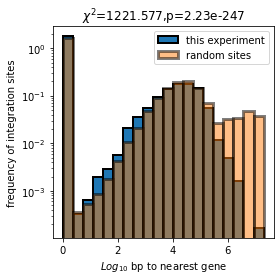

In [380]:
plt.figure(figsize=(4,4))
tdata = closedata[closedata['distance']>=0]
n1,bin1,patch1 = plt.hist(list(np.log10(tdata['distance']+1))+[np.log10(max(rclosedata['distance']))],label='this experiment',bins=20,lw=2,edgecolor='black',density=True)
tdata = rclosedata[rclosedata['distance']>=0]
n2,bin2,patch2 = plt.hist(np.log10(tdata['distance']+1),label='random sites',bins=20,lw=3,alpha=0.5,edgecolor='black',density=True)
plt.yscale('log')
n1 = [x*len(closedata)*bin1[1] for x in n1]
n2 = [x*len(closedata)*bin1[1] for x in n2]
chi,p = ss.chisquare(n1,n2)
plt.title('$\chi^2$='+str(round(chi,4))+',p={:.02e}'.format(p))
plt.xlabel('$Log_{10}$ bp to nearest gene')
plt.ylabel('frequency of integration sites')
plt.legend()
plt.tight_layout()
plt.savefig('figures/integration_site_distance_to_gene.svg')

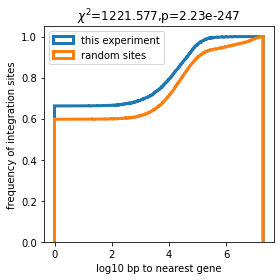

In [381]:
plt.figure(figsize=(4,4))
tdata = closedata[closedata['distance']>=0]
dist_summary = plt.hist(list(np.log10(tdata['distance']+1))+[np.log10(max(rclosedata['distance']))],label='this experiment',bins=len(tdata),lw=3,cumulative=True,density=True,histtype='step')
tdata = rclosedata[rclosedata['distance']>=0]
dist_summary_random = plt.hist(np.log10(tdata['distance']+1),label='random sites',bins=len(tdata),lw=3,cumulative=True,density=True,histtype='step')
#plt.yscale('log')
plt.title('$\chi^2$='+str(round(chi,4))+',p={:.02e}'.format(p))
plt.xlabel('log10 bp to nearest gene')
plt.ylabel('frequency of integration sites')
plt.legend(loc='upper left')
plt.tight_layout()

In [382]:
tdata = pd.DataFrame(zip(dist_summary[0],dist_summary[1],dist_summary_random[0]),columns=['cumulative frequency','log10 distance to gene','cumulative frequency (random)'])
tdata.to_csv('stats_CDF_to_nearest_gene.csv')

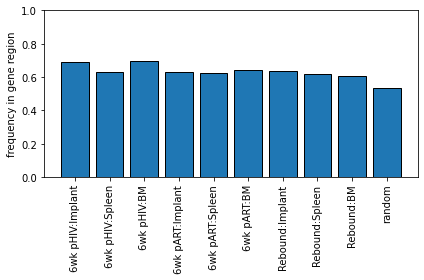

In [383]:
#different time point
ingene_count = {}
ingene_freq = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    for organ in dnaorgans:
        tdata = combineIS[(combineIS['Timepoint']==time)&(combineIS['Organ']==organ)]
        ingene = len(tdata[tdata['host gene']==tdata['host gene']])
        ingene_count[time+':'+organ] = [ingene,len(tdata)-ingene]
        ingene_freq[time+':'+organ] = ingene/(len(tdata))
ingene_freq['random'] = len(randomsite[randomsite['host gene']==randomsite['host gene']])/len(randomsite)
plt.figure(figsize=(6,4))
plt.bar(x=ingene_freq.keys(),height=ingene_freq.values(),edgecolor='black')
plt.ylabel('frequency in gene region')
plt.xticks(rotation=90)
#plt.yscale('log')
plt.ylim(0,1)
plt.tight_layout()

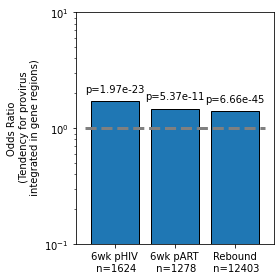

In [384]:
oddsdict = {}
pdict = {}
cdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    tdata = combineIS[(combineIS['Timepoint']==time)]
    len1 = len(tdata[tdata['host gene'].apply(lambda x:True if x==x else False)])
    len2 = len(tdata[~tdata['host gene'].apply(lambda x:True if x==x else False)])
    len3 = len(randomsite[randomsite['host gene'].apply(lambda x:True if x==x else False)])
    len4 = len(randomsite[~randomsite['host gene'].apply(lambda x:True if x==x else False)])
    odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
    oddsdict[time] = odds
    pdict[time] = p
    cdict[time] = len(tdata)
plt.figure(figsize=(4,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
locs,labels = plt.xticks()
for i,time in enumerate(['6wk pHIV','6wk pART','Rebound']):
    labels[i] = time+'\n n='+str(cdict[time])
plt.xticks(locs,labels)
plt.ylim(0.1,10)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio\n (Tendency for provirus\n integrated in gene regions)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()
plt.savefig('figures/odds_integration_site_in_host_gene.svg')

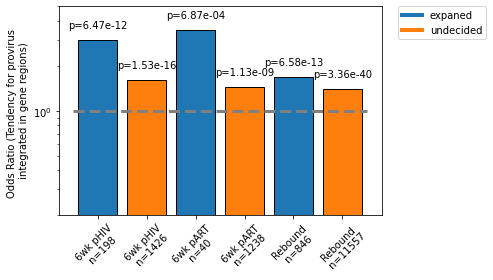

In [385]:
oddsdict = {}
pdict = {}
cdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    for cell in ['expanded','undecided']:
        tdata = combineIS[(combineIS['Timepoint']==time)]
        if cell == 'expanded': tdata = tdata[tdata['UMI count']>1]
        if cell == 'undecided': tdata = tdata[tdata['UMI count']==1]
        len1 = len(tdata[tdata['host gene'].apply(lambda x:True if x==x else False)])
        len2 = len(tdata[~tdata['host gene'].apply(lambda x:True if x==x else False)])
        len3 = len(randomsite[randomsite['host gene'].apply(lambda x:True if x==x else False)])
        len4 = len(randomsite[~randomsite['host gene'].apply(lambda x:True if x==x else False)])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        oddsdict[time+'_'+cell] = odds
        pdict[time+'_'+cell] = p
        cdict[time+'_'+cell] = len(tdata)

plt.figure(figsize=(7,4))
clist = [plt.cm.tab10(0),plt.cm.tab10(1)]*3
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black',color=clist)
plt.yscale('log')
locs,labels = plt.xticks()
for i,time in enumerate(['6wk pHIV','6wk pART','Rebound']):
    for j,cell in enumerate(['expanded','undecided']):
        labels[2*i+j] = time+'\n n='+str(cdict[time+'_'+cell])
plt.xticks(locs,labels,rotation=45)
plt.ylim(0.2,5)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio (Tendency for provirus \n integrated in gene regions)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
legend_elements = [Line2D([0], [0], color=plt.cm.tab10(0), lw=4, label='expaned'),
                   Line2D([0], [0], color=plt.cm.tab10(1), lw=4, label='undecided')]
plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.savefig('figures/odds_integration_site_in_host_gene_by_T_cell_expansion.svg')

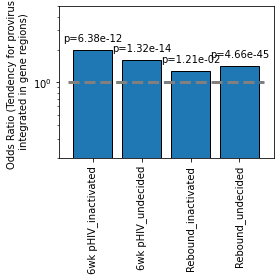

In [386]:
oddsdict = {}
pdict = {}
for time in ['6wk pHIV','Rebound']:
    for cell in ['inactivated','undecided']:
        tdata = combineIS[(combineIS['Timepoint']==time)]
        if cell == 'inactivated': tdata = tdata[tdata['transcription']==0]
        if cell == 'undecided': tdata = tdata[tdata['transcription']>0]
        len1 = len(tdata[tdata['host gene'].apply(lambda x:True if x==x else False)])
        len2 = len(tdata[~tdata['host gene'].apply(lambda x:True if x==x else False)])
        len3 = len(randomsite[randomsite['host gene'].apply(lambda x:True if x==x else False)])
        len4 = len(randomsite[~randomsite['host gene'].apply(lambda x:True if x==x else False)])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        oddsdict[time+'_'+cell] = odds
        pdict[time+'_'+cell] = p

plt.figure(figsize=(4,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.2,5)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio (Tendency for provirus \n integrated in gene regions)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

In [387]:
!bedtools fisher -a bed/IS_combined_sorted.bed  -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes

# Number of query intervals: 15305
# Number of db intervals: 62703
# Number of overlaps: 11077
# Number of possible intervals (estimated): 101118
# phyper(11077 - 1, 15305, 101118 - 15305, 62703, lower.tail=F)
# Contingency Table Of Counts
#_________________________________________
#           |  in -b       | not in -b    |
#     in -a | 11077        | 4228         |
# not in -a | 51626        | 34187        |
#_________________________________________
# p-values for fisher's exact test
left	right	two-tail	ratio
1	6.8372e-188	1.3215e-187	1.735


In [388]:
#make data for circos plot
#3 data tracks, integration position, mean UMI count, mean RNA abundance
#3 reference track, gene density, H3K9me, H3K27Ac peak
bin_length = 2000000
def bin4circos(x):
    if x['plot for circos']:
        pos = int(x['Integration site'].rsplit(':')[1])
        circosbin = pos//bin_length*bin_length
        return x['chromosome']+':'+str(circosbin)
    return np.nan

combineIS['chromosome'] = combineIS['Integration site'].apply(lambda x:x.rsplit(':')[0].replace('chr','hs'))
circos_chroms = ['hs'+str(x) for x in range(1,23)]+['hsX','hsY']
combineIS['plot for circos'] = combineIS['chromosome'].apply(lambda x:True if x in circos_chroms else False)
combineIS['circos bin'] = combineIS.apply(lambda x:bin4circos(x),axis=1)

In [389]:
tdata = combineIS[combineIS['plot for circos']==True]
circoshistdict = dict(tdata.value_counts('circos bin'))
circoshistfile = open('/Users/tianhao/Tools/circos/circos-0.69-9/data/hg38_ISS.txt','w')
for circosbin in circoshistdict:
    chrom = circosbin.rsplit(':')[0]
    pos1 = int(circosbin.rsplit(':')[1])
    pos2 = pos1+bin_length-1
    value = circoshistdict[circosbin]
    circoshistfile.write(chrom+'\t'+str(pos1)+'\t'+str(pos2)+'\t'+str(value)+'\n')
circoshistfile.close()

In [390]:
outfile1 = open('/Users/tianhao/Tools/circos/circos-0.69-9/data/hg38_ISS_UMI.txt','w')
outfile2 = open('/Users/tianhao/Tools/circos/circos-0.69-9/data/hg38_ISS_RNA.txt','w')
for circosbin in circoshistdict:
    tdata = combineIS[combineIS['circos bin']==circosbin]
    chrom = circosbin.rsplit(':')[0]
    pos1 = int(circosbin.rsplit(':')[1])
    pos2 = pos1+bin_length-1
    v1 = ss.gmean(tdata['UMI count'])
    v2 = np.mean(tdata['transcription'])
    outfile1.write(chrom+'\t'+str(pos1)+'\t'+str(pos2)+'\t'+str(v1)+'\n')
    outfile2.write(chrom+'\t'+str(pos1)+'\t'+str(pos2)+'\t'+str(v2)+'\n')
outfile1.close()
outfile2.close()

In [391]:
#use ensembl reference for gene density and peaks
def find_circosbin(x):
    if x['plot for circos']:
        pos = int(x['start'])
        circosbin = pos//bin_length*bin_length
        return 'hs'+str(x['seqid'])+':'+str(circosbin)
    return np.nan
    
generef['plot for circos'] = generef['seqid'].apply(lambda x:True if 'hs'+str(x) in circos_chroms else False)
generef['circos bin'] = generef.apply(lambda x:find_circosbin(x),axis=1)
tdata = generef[generef['plot for circos']==True]
genedensitydict = dict(tdata['circos bin'].value_counts())
outfile = open('/Users/tianhao/Tools/circos/circos-0.69-9/data/hg38_genes.txt','w')
for circosbin in genedensitydict:
    chrom = circosbin.rsplit(':')[0]
    pos1 = int(circosbin.rsplit(':')[1])
    pos2 = pos1+bin_length-1
    value = genedensitydict[circosbin]
    outfile.write(chrom+'\t'+str(pos1)+'\t'+str(pos2)+'\t'+str(value)+'\n')
outfile.close()

In [392]:
!bedtools makewindows -g ../../database/genome_annotation/hg38.chrom.sizes.chr -w {bin_length} > bed/genome_bin.bed
for reffile in sorted(glob.glob('../../database/Ensembl/*.bed')):
    ab = reffile.rsplit('/')[-1].rsplit('.')[3]
    !bedtools intersect -a bed/genome_bin.bed -b {reffile} -c -sorted > bed/genome_count_{ab}.bed
    tdata = pd.read_csv('bed/genome_count_'+ab+'.bed',sep='\t',names=['chrom','pos1','pos2','count'])
    tdata['new_chrom'] = tdata['chrom'].apply(lambda x:'hs'+x[3:])
    tdata[['new_chrom','pos1','pos2','count']].to_csv('/Users/tianhao/Tools/circos/circos-0.69-9/data/genome_count_'+ab+'.bed',index=False,header=False,sep='\t')

go to ```/home/tianhao/Tools/circos/circos-0.69-9``` to run 
``` bin/circos etc/test.conf ```

In [393]:
reguref = pd.read_csv('../../database/genome_annotation/hg38_Ensembl_release108_Regulatory_activity_CD4_ab.gff',sep='\t',comment='#',names=['seqid','source','type','start','end','score','strand','phase','attributes'])
reguref = reguref[reguref['seqid'].apply(lambda x: True if x in [str(x) for x in list(range(1,23))]+['X','Y'] else False)]
reguref

,seqid,source,type,start,end,score,strand,phase,attributes
0,18,Regulatory_Build,enhancer,35116801,35120999,.,.,.,activity=INACTIVE;bound_end=35120999;bound_sta...
1,8,Regulatory_Build,TF_binding_site,37967115,37967453,.,.,.,activity=NA;bound_end=37967531;bound_start=379...
2,6,Regulatory_Build,enhancer,90249202,90257999,.,.,.,activity=ACTIVE;bound_end=90257999;bound_start...
3,3,Regulatory_Build,CTCF_binding_site,57689401,57689600,.,.,.,activity=NA;bound_end=57689600;bound_start=576...
4,16,Regulatory_Build,CTCF_binding_site,55643201,55643800,.,.,.,activity=NA;bound_end=55643800;bound_start=556...
...,...,...,...,...,...,...,...,...,...
622456,11,Regulatory_Build,enhancer,47148801,47150199,.,.,.,activity=INACTIVE;bound_end=47150199;bound_sta...
622457,12,Regulatory_Build,CTCF_binding_site,12033001,12034400,.,.,.,activity=NA;bound_end=12034400;bound_start=120...
622458,12,Regulatory_Build,enhancer,26031001,26031600,.,.,.,activity=INACTIVE;bound_end=26031600;bound_sta...
622459,1,Regulatory_Build,enhancer,54937001,54938600,.,.,.,activity=INACTIVE;bound_end=54938600;bound_sta...


In [394]:
regulist = list(set(reguref['type']))
regudata = {}
for element in regulist:
    tdata = reguref[reguref['type']==element]
    tdata.to_csv('bed/regu_'+element+'.gff3',index=False,header=False,sep='\t')
    !bedtools intersect -wb -a bed/IS_combined.bed -b bed/regu_{element}.gff3 > bed/IS_combined_{element}.bed
    interdata = pd.read_csv('bed/IS_combined_'+element+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','type','start','end','score','strand2','phase','attributes'])
    regudata[element] = combineIS.apply(find_host_gene,axis=1)

In [395]:
for element in regulist:
    tdata = regudata[element]
    print(element,len(tdata[tdata['host gene']==tdata['host gene']]))

TF_binding_site 93
CTCF_binding_site 817
enhancer 2104
promoter 1053
open_chromatin_region 246


this is too few. Use ```bedtools closest``` instead of ```bedtools intersect```

TF_binding_site
CTCF_binding_site
enhancer
promoter
open_chromatin_region


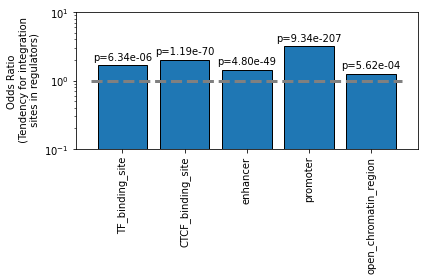

In [396]:
oddsdict = {}
pdict = {}
for element in regulist:
    print(element)
    !bedtools sort -i bed/regu_{element}.gff3 -g ../../database/genome_annotation/hg38.chrom.sizes > bed/regu_{element}.gff3.sort
    !bedtools fisher -a bed/IS_combined_sorted.bed -b bed/regu_{element}.gff3.sort -g ../../database/genome_annotation/hg38.chrom.sizes > bed/fisher_{element}.tsv
    rdata = pd.read_csv('bed/fisher_'+element+'.tsv',sep='\t',comment='#')
    oddsdict[element] = rdata.iloc[0]['ratio']
    pdict[element] = rdata.iloc[0]['two-tail']


plt.figure(figsize=(6,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.1,10)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio\n (Tendency for integration\n sites in regulators)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

In [397]:
def find_regulator(x):
    tdata = interdata[interdata['row number']==x.name]
    x['multiple element'] = len(tdata)
    if len(tdata) == 0:
        x['distance'] = np.nan
        x['ENSR'] = np.nan
    if len(tdata) >= 1:
        x['distance'] = tdata['distance'].iloc[0]
        x['ENSR'] = tdata['attributes'].iloc[0].rsplit('regulatory_feature_stable_id=')[-1]
    return x
    
regulist = list(set(reguref['type']))
regudata = {}
for element in regulist:
    tdata = reguref[reguref['type']==element]
    tdata.to_csv('bed/regu_'+element+'.gff3',index=False,header=False,sep='\t')
    !bedtools sort -i bed/regu_{element}.gff3 -g ../../database/genome_annotation/hg38.chrom.sizes > bed/regu_{element}.sort.gff3
    !bedtools closest -D b -a bed/IS_combined_sorted.bed -b bed/regu_{element}.sort.gff3 > bed/IS_combined_{element}.bed
    interdata = pd.read_csv('bed/IS_combined_'+element+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','type','start','end','score','strand2','phase','attributes','distance'])
    regudata[element] = combineIS.apply(find_regulator,axis=1)

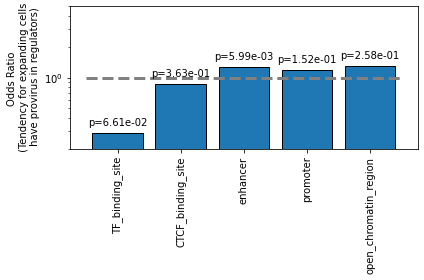

In [398]:
#fisher exact test
#whthin element, within 5000bp of the element, within 5000bp downstream of the element, affect UMI count/transcription?
oddsdict = {}; pdict = {}
for element in regulist:
    tdata = regudata[element]
    len1 = len(tdata[(tdata['UMI count']>1)&(tdata['distance']==0)])
    len2 = len(tdata[(tdata['UMI count']>1)&(tdata['distance']!=0)])
    len3 = len(tdata[(tdata['UMI count']==1)&(tdata['distance']==0)])
    len4 = len(tdata[(tdata['UMI count']==1)&(tdata['distance']!=0)])
    odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
    oddsdict[element] = odds
    pdict[element] = p

plt.figure(figsize=(6,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.2,5)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio\n (Tendency for expanding cells\n have provirus in regulators)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

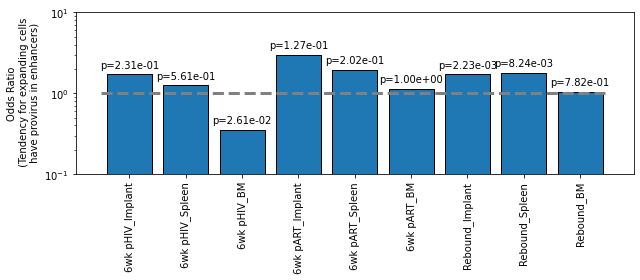

In [399]:
oddsdict = {}
pdict = {}
element = 'enhancer'
for time in ['6wk pHIV','6wk pART','Rebound']:
    for organ in dnaorgans:
        tdata = regudata[element]
        tdata = tdata[(tdata['Timepoint']==time)&(tdata['Organ']==organ)]
        len1 = len(tdata[(tdata['UMI count']>1)&(tdata['distance']==0)])
        len2 = len(tdata[(tdata['UMI count']>1)&(tdata['distance']!=0)])
        len3 = len(tdata[(tdata['UMI count']==1)&(tdata['distance']==0)])
        len4 = len(tdata[(tdata['UMI count']==1)&(tdata['distance']!=0)])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        oddsdict[time+'_'+organ] = odds
        pdict[time+'_'+organ] = p
        
plt.figure(figsize=(9,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.1,10)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio\n (Tendency for expanding cells\n have provirus in enhancers)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

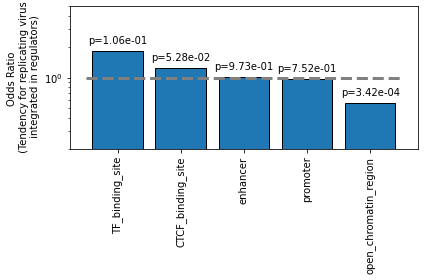

In [400]:
oddsdict = {}; pdict = {}
for element in regulist:
    tdata = regudata[element]
    len1 = len(tdata[(tdata['transcription']>0)&(tdata['distance']==0)])
    len2 = len(tdata[(tdata['transcription']>0)&(tdata['distance']!=0)])
    len3 = len(tdata[(tdata['transcription']==0)&(tdata['distance']==0)])
    len4 = len(tdata[(tdata['transcription']==0)&(tdata['distance']!=0)])
    odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
    oddsdict[element] = odds
    pdict[element] = p

plt.figure(figsize=(6,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.2,5)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio\n (Tendency for replicating virus\n integrated in regulators)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

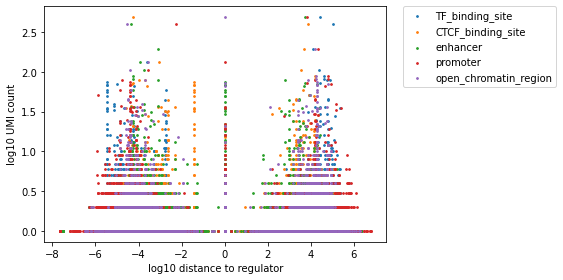

In [401]:
def log_distance(x):
    if x < 0: return -np.log10(-x)
    if x == 0: return 0
    if x > 0: return np.log10(x)

fig,ax = plt.subplots(figsize=(8,4))
for element in regudata:
    regudata[element]['distance_log'] = regudata[element]['distance'].apply(lambda x:log_distance(x))
    tdata = regudata[element]
    plt.scatter(tdata['distance_log'],np.log10(tdata['UMI count']),label=element,alpha=1,s=3)
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.xlabel('log10 distance to regulator')
plt.ylabel('log10 UMI count')
plt.tight_layout()

1075
1079
1078
1032
1079


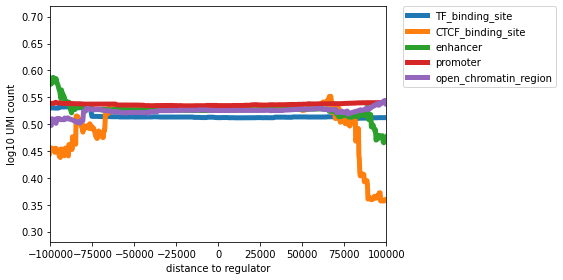

In [402]:
def local_average(xin,yin):
    xin = list(xin); yin = list(yin)
    xmin = xin[0]; xmax=xin[-1]
    frac = 0.5; N = 1000
    xout = np.linspace(xmin,xmax,N)
    yout = []
    for i,x in enumerate(xout):
        if i < N*frac/2:
            xrange = xout[:int(N*frac/2+i)]
        elif i > N*(1-frac/2):
            xrange = xout[int(i-N*frac/2):]
        else:
            xrange = xout[int(i-N*frac/2):int(N*frac/2+i)]
        tmin = xrange[0]; tmax = xrange[-1]
        for i1,x1 in enumerate(xin):
            if x1 >= tmin:
                break
        for i2,x2 in enumerate(xin):
            if x2 >= tmax:
                break
        ylist  = yin[i1:i2]
        yout.append(np.mean(ylist))
    return xout,yout
    
fig,ax = plt.subplots(figsize=(8,4))
window = 1e5
for element in regudata:
    #tdata = regudata[element][regudata[element]['UMI count']>1]
    tdata = regudata[element]
    #plt.scatter(tdata['distance'],np.log10(tdata['UMI count']),label=element,alpha=0.1,s=3)
    tdata = tdata.sort_values(by='distance')
    tdata = tdata[(tdata['distance']>-5*window)&(tdata['distance']<5*window)&(tdata['distance']!=-1)&(tdata['UMI count']>1)]
    print(len(tdata))
    xout, yout = local_average(tdata['distance'],np.log10(tdata['UMI count']))  
    plt.plot(xout,yout,lw=5,label=element)
    plt.xlim([-window,window])
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.xlabel('distance to regulator')
plt.ylabel('log10 UMI count')
plt.tight_layout()

15080
15080
15069
15044
15080


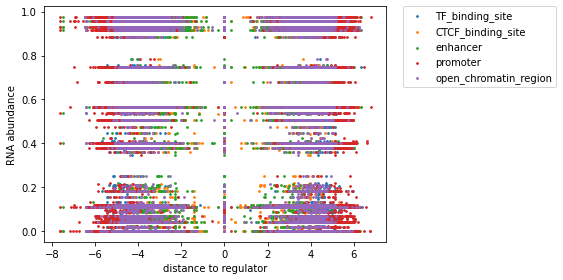

In [403]:
fig,ax = plt.subplots(figsize=(8,4))
window = 1e6
for element in regudata:
    #tdata = regudata[element][regudata[element]['UMI count']>1]
    tdata = regudata[element]
    plt.scatter(tdata['distance_log'],tdata['transcription'],label=element,alpha=1,s=3)
    tdata = tdata.sort_values(by='distance')
    tdata = tdata[(tdata['distance']>-5*window)&(tdata['distance']<5*window)&(tdata['distance']!=-1)]
    print(len(tdata))
    #xout, yout = local_average(tdata['distance'],tdata['transcription'])  
    #plt.plot(xout,yout,lw=5,label=element)
    #plt.xlim([-window,window])
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.xlabel('distance to regulator')
plt.ylabel('RNA abundance')
plt.tight_layout()

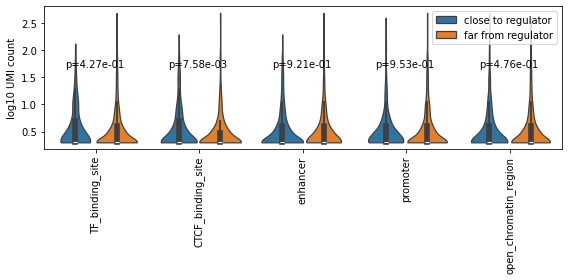

In [404]:
xlist = [];ylist = [];huelist = []; pdict = {}
for element in regudata:
    tdata = regudata[element][regudata[element]['UMI count']>1]
    tdata['within_5k'] = tdata['distance'].apply(lambda x:'close to regulator' if abs(x)<5000 and x!=-1 else 'far from regulator')
    xlist.extend(tdata['within_5k'])
    ylist.extend(np.log10(tdata['UMI count']))
    huelist.extend([element]*len(tdata))
    W,p = ss.ranksums(tdata[tdata['within_5k']=='close to regulator']['UMI count'],tdata[~(tdata['within_5k']=='close to regulator')]['UMI count'])
    pdict[element] = p
plt.figure(figsize=(8,4))
sns.violinplot(x=huelist,y=ylist,hue=xlist,hue_order=['close to regulator','far from regulator'],cut=0)
for i,p in enumerate(pdict.values()):
    plt.text(s='p={:0.2e}'.format(p),x=i-0.3,y=0.6*plt.ylim()[1])
plt.xticks(rotation=90)
plt.ylabel('log10 UMI count')
plt.tight_layout()

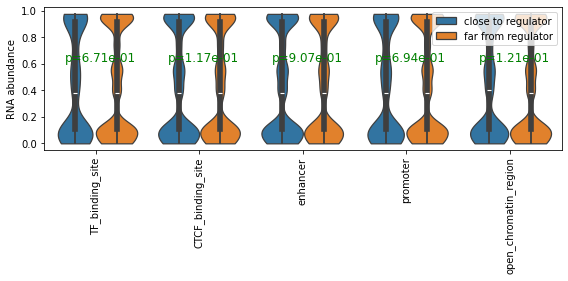

In [405]:
xlist = [];ylist = [];huelist = []; pdict = {}
for element in regudata:
    tdata = regudata[element]
    tdata['within_5k'] = tdata['distance'].apply(lambda x:'close to regulator' if abs(x)<5000 and x!=-1 else 'far from regulator')
    xlist.extend(tdata['within_5k'])
    ylist.extend(tdata['transcription'])
    huelist.extend([element]*len(tdata))
    W,p = ss.ranksums(tdata[tdata['within_5k']=='close to regulator']['transcription'],tdata[~(tdata['within_5k']=='close to regulator')]['transcription'])
    pdict[element] = p
plt.figure(figsize=(8,4))
sns.violinplot(x=huelist,y=ylist,hue=xlist,hue_order=['close to regulator','far from regulator'],cut=0)
for i,p in enumerate(pdict.values()):
    plt.text(s='p={:0.2e}'.format(p),x=i-0.3,y=0.6*plt.ylim()[1],color='green',fontsize=12)
plt.xticks(rotation=90)
plt.ylabel('RNA abundance')
plt.tight_layout()

promoter analysis could be more careful. Focusing on only active promoter and downstream of the promoter, separating promoter occulusion with synergizing. Need another reference for this task.

In [406]:
#Histone marker analysis
histonelist = []
for infile in sorted(glob.glob('../../database/Ensembl/*')):
    histone = infile.rsplit('/')[-1].rsplit('.')[3]
    histonelist.append(histone)
    tdata = pd.read_csv(infile,sep='\t',names=['chrom','start','end','name','score','strand'])
    tdata['new_chrom'] = tdata['chrom'].apply(lambda x:x[3:])
    tdata[['new_chrom','start','end','name','score','strand']].to_csv('bed/Tcell_'+histone+'.bed',sep='\t',index=False,header=False)
    !bedtools sort -i bed/Tcell_{histone}.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/Tcell_{histone}.sort.bed
    !bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/Tcell_{histone}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_{histone}_distance.bed

In [407]:
for histone in histonelist:
    interdata = pd.read_csv('bed/IS_'+histone+'_distance.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
    combineIS['distance to '+histone] = combineIS.index.map(lambda x:interdata[interdata['row number']==x]['distance'].iloc[0])

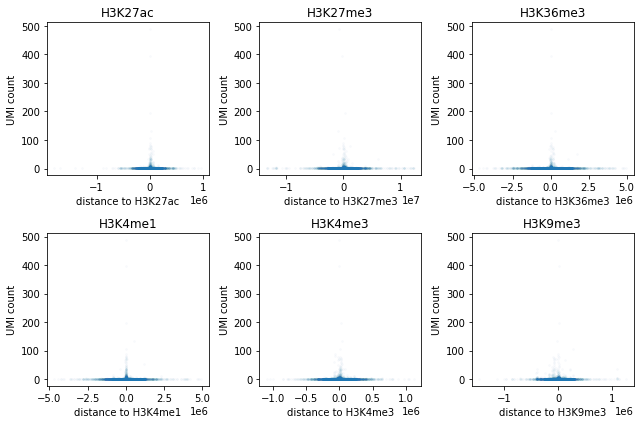

In [408]:
plt.figure(figsize=(9,6))
ploti = 0
for histone in histonelist:
    ploti += 1
    plt.subplot(2,3,ploti)
    plt.scatter(combineIS['distance to '+histone],combineIS['UMI count'],s=3,alpha=0.02)
    plt.ylabel('UMI count')
    plt.xlabel('distance to '+histone)
    plt.title(histone)
plt.tight_layout()

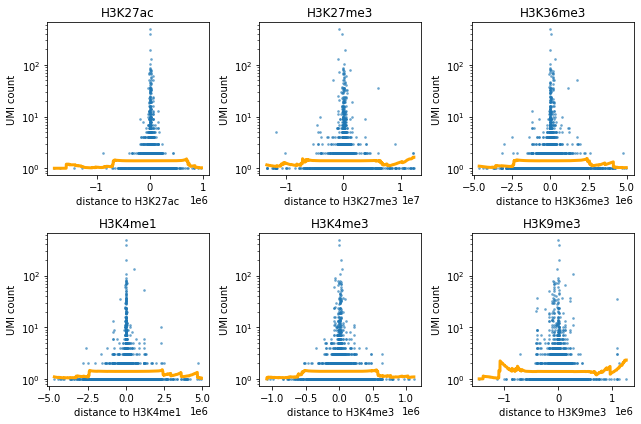

In [409]:
plt.figure(figsize=(9,6))
ploti = 0
for histone in histonelist:
    ploti += 1
    plt.subplot(2,3,ploti)
    tdata = combineIS[combineIS['UMI count']>=1]
    tdata = tdata.sort_values(by='distance to '+histone,ascending=True)
    plt.scatter(tdata['distance to '+histone],tdata['UMI count'],s=3,alpha=0.5)
    xout,yout = local_average(tdata['distance to '+histone],tdata['UMI count'])
    plt.plot(xout,yout,lw=3,c='orange')
    plt.ylabel('UMI count')
    #plt.xlim(-2e4,2e4)
    plt.yscale('log')
    plt.xlabel('distance to '+histone)
    plt.title(histone)
plt.tight_layout()

H3K27ac 368 716 4079 10142 1.2779230313049124 0.00030328795782683744
H3K27me3 24 1060 469 13752 0.6638934706521302 0.049646832752570355
H3K36me3 239 845 2028 12193 1.7005281094266074 4.069025943529034e-11
H3K4me1 288 796 3390 10831 1.155974563080891 0.046391154246406344
H3K4me3 211 871 2832 11388 0.974133569440931 0.7821281411459402
H3K9me3 148 936 2026 12195 0.9517617131141317 0.6196573178636886


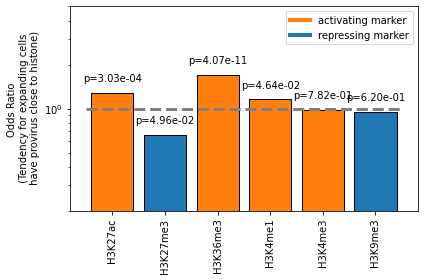

In [410]:
#fisher's test
#within 5k
window = 5e3
oddsdict = {}; pdict = {}
for histone in histonelist:
    tdata = combineIS
    len1 = len(tdata[(tdata['UMI count']>1)&(abs(tdata['distance to '+histone])<window)&(tdata['distance to '+histone]!=-1)])
    len2 = len(tdata[(tdata['UMI count']>1)&((abs(tdata['distance to '+histone])>window)|(tdata['distance to '+histone]==-1))])
    len3 = len(tdata[(tdata['UMI count']==1)&(abs(tdata['distance to '+histone])<window)&(tdata['distance to '+histone]!=-1)])
    len4 = len(tdata[(tdata['UMI count']==1)&((abs(tdata['distance to '+histone])>window)|(tdata['distance to '+histone]==-1))])
    odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
    print(histone,len1,len2,len3,len4,odds,p)
    oddsdict[histone] = odds
    pdict[histone] = p

plt.figure(figsize=(6,4))
colorlist = []
for histone in histonelist:
    if histone in ['H3K27ac','H3K36me3','H3K4me1','H3K4me3']:
        colorlist.append(plt.cm.tab10(1))
    else:
        colorlist.append(plt.cm.tab10(0))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black',color=colorlist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.2,5)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio\n (Tendency for expanding cells\n have provirus close to histone)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
legend_elements = [Line2D([0], [0], color=plt.cm.tab10(1), lw=4, label='activating marker'),
                   Line2D([0], [0], color=plt.cm.tab10(0), lw=4, label='repressing marker')]
plt.legend(handles=legend_elements)
plt.tight_layout()

In [411]:
tdata = combineIS[(abs(combineIS['distance to H3K27ac'])<5000)&(combineIS['distance to H3K27ac']!=-1)&(combineIS['UMI count']>1)]
tdata

,Integration site,UMI count,Mouse,sample name,Timepoint,UDP,barcode,Organ,mapping length,truebc,...,same direction with gene,chromosome,plot for circos,circos bin,distance to H3K27ac,distance to H3K27me3,distance to H3K36me3,distance to H3K4me1,distance to H3K4me3,distance to H3K9me3
198,chr1:154951890:+,3,03-DMSO,03-DMSO Rebound Spleen,Rebound,UDP02,CTTATAGAGGCCGTAGGCGGAGTCGAGCCTACAA,Spleen,128.00,CTCGACTCCGCCTACGGCCTC,...,False,hs1,True,hs1:154000000,0,128369,0,0,0,-240690
330,chr19:38668383:-,396,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,71.00,AACTGCGTCAACAGCAGCTTC,...,False,hs19,True,hs19:38000000,-169,-306696,31603,0,-1128,11543
344,chr2:95074809:-,6,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,31.00,AACTGCGTCAACAGCAGCTTC,...,True,hs2,True,hs2:94000000,0,116669,-11250,0,0,-23530
356,chr14:82431348:-,4,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,52.25,AACTGCGTCAACAGCAGCTTC,...,False,hs14,True,hs14:82000000,-4855,1163988,-260931,895188,65527,-3691
360,chr19:53132153:+,2,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,129.00,AACTGCGTCAACAGCAGCTTC,...,False,hs19,True,hs19:52000000,368,746926,8966,25126,0,1626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14639,chr4:190178543:-,2,JCMM30C-5,JCMM30C-5 6wk pART Spleen,6wk pART,UDP30,CTTATAG,Spleen,129.00,G,...,False,hs4,True,hs4:190000000,0,-6456,143,143,0,63
14644,chr8:23027969:+,2,JCMM30C-5,JCMM30C-5 6wk pART Spleen,6wk pART,UDP30,CTTATAG,Spleen,80.00,G,...,False,hs8,True,hs8:22000000,-1993,-161449,-349,-7509,-8453,5810
14709,chr20:58209836:+,3,JCMM30C-5,JCMM30C-5 6wk pART Spleen,6wk pART,UDP30,CTTATAG,Spleen,106.00,G,...,False,hs20,True,hs20:58000000,0,16243,29723,19023,26753,-100056
14735,chr13:113218961:+,2,JCMM30C-5,JCMM30C-5 6wk pART Spleen,6wk pART,UDP30,CTTATAG,Spleen,128.00,G,...,True,hs13,True,hs13:112000000,1250,-67021,1418,-1381,-7508,-160961


In [412]:
tdata[tdata['barcode']=='CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA']

,Integration site,UMI count,Mouse,sample name,Timepoint,UDP,barcode,Organ,mapping length,truebc,...,same direction with gene,chromosome,plot for circos,circos bin,distance to H3K27ac,distance to H3K27me3,distance to H3K36me3,distance to H3K4me1,distance to H3K4me3,distance to H3K9me3
330,chr19:38668383:-,396,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,71.000000,AACTGCGTCAACAGCAGCTTC,...,False,hs19,True,hs19:38000000,-169,-306696,31603,0,-1128,11543
344,chr2:95074809:-,6,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,31.000000,AACTGCGTCAACAGCAGCTTC,...,True,hs2,True,hs2:94000000,0,116669,-11250,0,0,-23530
356,chr14:82431348:-,4,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,52.250000,AACTGCGTCAACAGCAGCTTC,...,False,hs14,True,hs14:82000000,-4855,1163988,-260931,895188,65527,-3691
360,chr19:53132153:+,2,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,129.000000,AACTGCGTCAACAGCAGCTTC,...,False,hs19,True,hs19:52000000,368,746926,8966,25126,0,1626
366,chr7:139649416:-,6,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,122.000000,AACTGCGTCAACAGCAGCTTC,...,True,hs7,True,hs7:138000000,-55,166456,17356,0,12634,88956
378,chr20:58209836:+,5,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,106.000000,AACTGCGTCAACAGCAGCTTC,...,False,hs20,True,hs20:58000000,0,16243,29723,19023,26753,-100056
413,chr2:32618037:+,6,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,41.000000,AACTGCGTCAACAGCAGCTTC,...,True,hs2,True,hs2:32000000,-2653,-1037457,0,10842,9080,-51857
426,chr11:118437604:+,5,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,129.000000,AACTGCGTCAACAGCAGCTTC,...,True,hs11,True,hs11:118000000,0,-282264,2075,1095,0,-350304
427,chr1:198113794:+,2,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,19.000000,AACTGCGTCAACAGCAGCTTC,...,False,hs1,True,hs1:198000000,2570,-175214,97805,-10134,-27249,-62494
437,chr4:190178882:-,4,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,129.000000,AACTGCGTCAACAGCAGCTTC,...,False,hs4,True,hs4:190000000,0,-6117,482,482,0,402


In [413]:
#adjusting window size
oddsdict = {}; pdict = {}
for histone in histonelist:
    oddsdict[histone] = []
    pdict[histone] = []
    for window in np.logspace(0,5,30):
        tdata = combineIS
        len1 = len(tdata[(tdata['UMI count']>1)&(abs(tdata['distance to '+histone])<window)&(tdata['distance to '+histone]!=-1)])
        len2 = len(tdata[(tdata['UMI count']>1)&((abs(tdata['distance to '+histone])>window)|(tdata['distance to '+histone]==-1))])
        len3 = len(tdata[(tdata['UMI count']==1)&(abs(tdata['distance to '+histone])<window)&(tdata['distance to '+histone]!=-1)])
        len4 = len(tdata[(tdata['UMI count']==1)&((abs(tdata['distance to '+histone])>window)|(tdata['distance to '+histone]==-1))])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        oddsdict[histone].append(odds)
        pdict[histone].append(p)

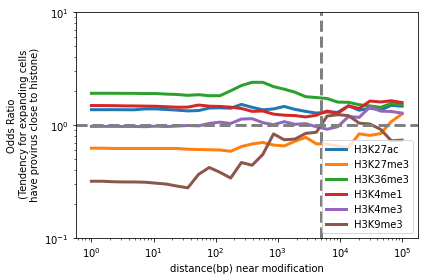

In [414]:
plt.figure(figsize=(6,4))
for histone in oddsdict:
    plt.plot(np.logspace(0,5,30),oddsdict[histone],lw=3,label=histone)
plt.yscale('log')
plt.xscale('log')
plt.ylim(0.1,10)
xmin,xmax = plt.xlim()
plt.hlines(y=1,xmin=xmin,xmax=xmax,color='grey',linewidth=3,linestyle='--')
plt.vlines(x=5e3,ymin=0.1,ymax=10,color='grey',linewidth=3,ls='--')
plt.ylabel('Odds Ratio\n (Tendency for expanding cells\n have provirus close to histone)')
plt.xlabel('distance(bp) near modification')
plt.legend()
plt.tight_layout()

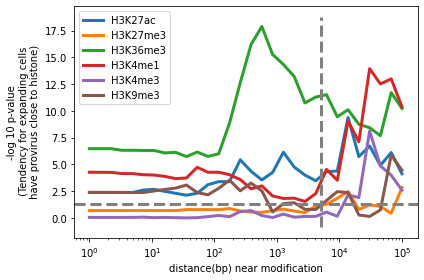

In [415]:
plt.figure(figsize=(6,4))
for histone in oddsdict:
    plt.plot(np.logspace(0,5,30),-np.log10(pdict[histone]),lw=3,label=histone)
plt.xscale('log')
xmin,xmax = plt.xlim()
ymin,ymax = plt.ylim()
plt.hlines(y=-np.log10(0.05),xmin=xmin,xmax=xmax,color='grey',linewidth=3,linestyle='--')
plt.vlines(x=5e3,ymin=ymin,ymax=ymax,color='grey',linewidth=3,ls='--')
plt.ylabel('-log 10 p-value\n (Tendency for expanding cells\n have provirus close to histone)')
plt.xlabel('distance(bp) near modification')
plt.legend()
plt.tight_layout()

H3K27ac 3760 9312 331 624 0.7612047217117762 0.00014325428679253096
H3K27me3 440 12632 21 934 1.5492023281763623 0.04845402557114116
H3K36me3 1856 11216 219 736 0.556126603221751 3.977175910294623e-12
H3K4me1 3130 9942 250 705 0.8878092939046469 0.12632207860084416
H3K4me3 2599 10470 201 754 0.9311826730720799 0.3789089268553256
H3K9me3 1852 11220 133 822 1.0201600257327812 0.8852892696814381


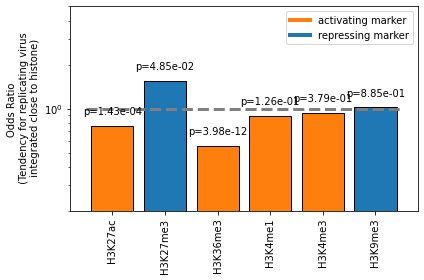

In [416]:
window = 5e3
oddsdict = {}; pdict = {}
for histone in histonelist:
    tdata = combineIS[combineIS['Timepoint']!='6wk pART']
    len1 = len(tdata[(tdata['transcription']>0)&(abs(tdata['distance to '+histone])<window)&(tdata['distance to '+histone]!=-1)])
    len2 = len(tdata[(tdata['transcription']>0)&((abs(tdata['distance to '+histone])>window)|(tdata['distance to '+histone]==-1))])
    len3 = len(tdata[(tdata['transcription']==0)&(abs(tdata['distance to '+histone])<window)&(tdata['distance to '+histone]!=-1)])
    len4 = len(tdata[(tdata['transcription']==0)&((abs(tdata['distance to '+histone])>window)|(tdata['distance to '+histone]==-1))])
    odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
    print(histone,len1,len2,len3,len4,odds,p)
    oddsdict[histone] = odds
    pdict[histone] = p

plt.figure(figsize=(6,4))
colorlist = []
for histone in histonelist:
    if histone in ['H3K27ac','H3K36me3','H3K4me1','H3K4me3']:
        colorlist.append(plt.cm.tab10(1))
    else:
        colorlist.append(plt.cm.tab10(0))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black',color=colorlist)
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.2,5)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio\n (Tendency for replicating virus\n integrated close to histone)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
legend_elements = [Line2D([0], [0], color=plt.cm.tab10(1), lw=4, label='activating marker'),
                   Line2D([0], [0], color=plt.cm.tab10(0), lw=4, label='repressing marker')]
plt.legend(handles=legend_elements)
plt.tight_layout()

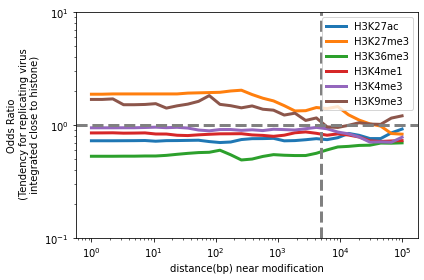

In [417]:
oddsdict = {}; pdict = {}
for histone in histonelist:
    oddsdict[histone] = []
    pdict[histone] = []
    for window in np.logspace(0,5,30):
        tdata = combineIS[combineIS['Timepoint']!='6wk pART']
        len1 = len(tdata[(tdata['transcription']>0)&(abs(tdata['distance to '+histone])<window)&(tdata['distance to '+histone]!=-1)])
        len2 = len(tdata[(tdata['transcription']>0)&((abs(tdata['distance to '+histone])>window)|(tdata['distance to '+histone]==-1))])
        len3 = len(tdata[(tdata['transcription']==0)&(abs(tdata['distance to '+histone])<window)&(tdata['distance to '+histone]!=-1)])
        len4 = len(tdata[(tdata['transcription']==0)&((abs(tdata['distance to '+histone])>window)|(tdata['distance to '+histone]==-1))])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        oddsdict[histone].append(odds)
        pdict[histone].append(p)

plt.figure(figsize=(6,4))
for histone in histonelist:
    plt.plot(np.logspace(0,5,30),oddsdict[histone],lw=3,label=histone)
plt.yscale('log')
plt.xscale('log')
plt.ylim(0.1,10)
xmin,xmax = plt.xlim()
plt.hlines(y=1,xmin=xmin,xmax=xmax,color='grey',linewidth=3,linestyle='--')
plt.vlines(x=5e3,ymin=0.1,ymax=10,color='grey',linewidth=3,ls='--')
plt.ylabel('Odds Ratio\n (Tendency for replicating virus\n integrated close to histone)')
plt.xlabel('distance(bp) near modification')
plt.legend()
plt.tight_layout()

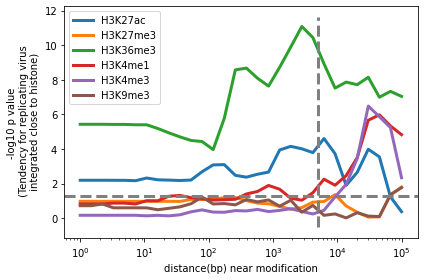

In [418]:
plt.figure(figsize=(6,4))
for histone in histonelist:
    plt.plot(np.logspace(0,5,30),-np.log10(pdict[histone]),lw=3,label=histone)
plt.xscale('log')
xmin,xmax = plt.xlim()
ymin,ymax = plt.ylim()
plt.hlines(y=-np.log10(0.05),xmin=xmin,xmax=xmax,color='grey',linewidth=3,linestyle='--')
plt.vlines(x=5e3,ymin=ymin,ymax=ymax,color='grey',linewidth=3,ls='--')
plt.ylabel('-log10 p value\n (Tendency for replicating virus\n integrated close to histone)')
plt.xlabel('distance(bp) near modification')
plt.legend()
plt.tight_layout()

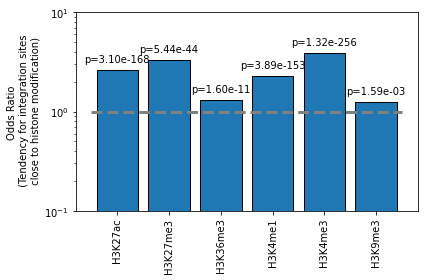

In [419]:
oddsdict = {}
pdict = {}
for histone in histonelist:
    !bedtools fisher -a bed/IS_combined_sorted.bed -b bed/Tcell_{histone}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/fisher_{histone}.tsv
    rdata = pd.read_csv('bed/fisher_'+histone+'.tsv',sep='\t',comment='#')
    oddsdict[histone] = rdata.iloc[0]['ratio']
    pdict[histone] = rdata.iloc[0]['two-tail']

plt.figure(figsize=(6,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.1,10)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio\n (Tendency for integration sites\n close to histone modification)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

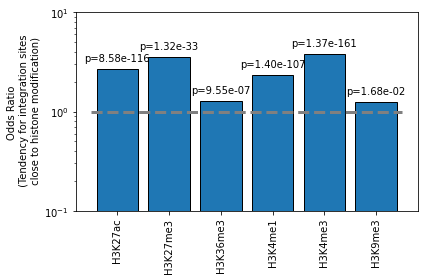

In [420]:
outfile = open('bed/IS_combined_mlength100.bed','w')
tdata = combineIS[combineIS['mapping length']>=100]
for i,row in tdata.iterrows():
    if 'chr' in row['Integration site']:
        record = row['Integration site'].rsplit(':')
        outfile.write(record[0][3:]+'\t'+record[1]+'\t'+record[1]+'\t'+str(i)+'\t'+str(row['UMI count'])+'\t'+record[2]+'\n')
outfile.close()
!bedtools sort -i bed/IS_combined_mlength100.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_sorted_mlength100.bed

oddsdict = {}
pdict = {}
for histone in histonelist:
    !bedtools fisher -a bed/IS_combined_sorted_mlength100.bed -b bed/Tcell_{histone}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/fisher_{histone}.tsv
    rdata = pd.read_csv('bed/fisher_'+histone+'.tsv',sep='\t',comment='#')
    oddsdict[histone] = rdata.iloc[0]['ratio']
    pdict[histone] = rdata.iloc[0]['two-tail']

plt.figure(figsize=(6,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.1,10)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio\n (Tendency for integration sites\n close to histone modification)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.tight_layout()

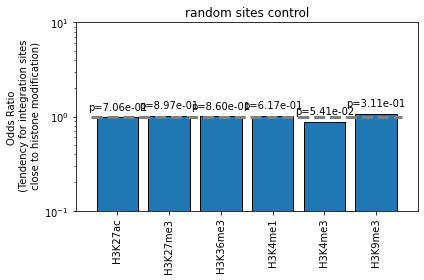

In [421]:
oddsdict = {}
pdict = {}
for histone in histonelist:
    !bedtools fisher -a bed/random_sites_sorted.bed -b bed/Tcell_{histone}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/fisher_{histone}.tsv
    rdata = pd.read_csv('bed/fisher_'+histone+'.tsv',sep='\t',comment='#')
    oddsdict[histone] = rdata.iloc[0]['ratio']
    pdict[histone] = rdata.iloc[0]['two-tail']

plt.figure(figsize=(6,4))
plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black')
plt.yscale('log')
plt.xticks(rotation=90)
plt.ylim(0.1,10)
plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
plt.ylabel('Odds Ratio\n (Tendency for integration sites\n close to histone modification)')
for i,v in enumerate(pdict.values()):
    plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
plt.title('random sites control')
plt.tight_layout()

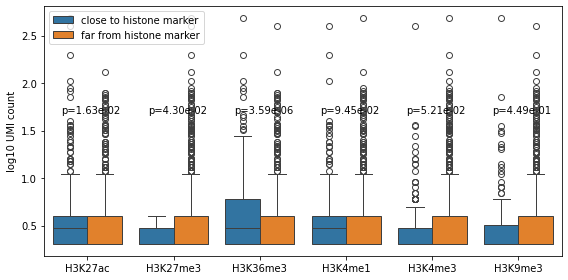

In [422]:
xlist = []; ylist = []; huelist = [];pdict = {}
for histone in histonelist:
    tdata = combineIS[combineIS['UMI count']>1]
    tdata['close to '+histone] = tdata['distance to '+histone].apply(lambda x:'close to histone marker' if abs(x)<5000 and x!=-1 else 'far from histone marker')
    W,p = ss.ranksums(tdata[tdata['close to '+histone]=='close to histone marker']['UMI count'],tdata[tdata['close to '+histone]!='close to histone marker']['UMI count'])
    pdict[histone] = p
    huelist.extend(tdata['close to '+histone])
    xlist.extend([histone]*len(tdata))
    ylist.extend(np.log10(tdata['UMI count']))
plt.figure(figsize=(8,4))
sns.boxplot(x=xlist,y=ylist,hue=huelist,hue_order=['close to histone marker','far from histone marker'])
for i,p in enumerate(pdict.values()):
    plt.text(s='p={:0.2e}'.format(p),x=i-0.3,y=0.6*plt.ylim()[1])
plt.ylabel('log10 UMI count')
plt.tight_layout()

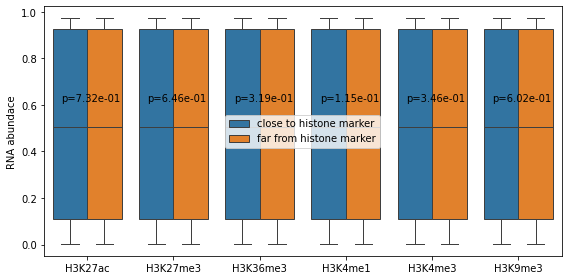

In [423]:
xlist = []; ylist = []; huelist = [];pdict = {}
for histone in histonelist:
    tdata = combineIS[combineIS['transcription']>0]
    tdata['close to '+histone] = tdata['distance to '+histone].apply(lambda x:'close to histone marker' if abs(x)<5000 and x!=-1 else 'far from histone marker')
    W,p = ss.ranksums(tdata[tdata['close to '+histone]=='close to histone marker']['transcription'],tdata[tdata['close to '+histone]!='close to histone marker']['transcription'])
    pdict[histone] = p
    huelist.extend(tdata['close to '+histone])
    xlist.extend([histone]*len(tdata))
    ylist.extend(tdata['transcription'])
plt.figure(figsize=(8,4))
sns.boxplot(x=xlist,y=ylist,hue=huelist,hue_order=['close to histone marker','far from histone marker'])
for i,p in enumerate(pdict.values()):
    plt.text(s='p={:0.2e}'.format(p),x=i-0.3,y=0.6*plt.ylim()[1])
plt.ylabel('RNA abundace')
plt.tight_layout()

6wk pHIV H3K27ac 98 100 451 975 2.1186252771618626 1.256875346548648e-06
6wk pHIV H3K27me3 4 194 55 1371 0.5139643861293346 0.22900560883402532
6wk pHIV H3K36me3 74 124 238 1188 2.978856058552453 1.3998425904944346e-10
6wk pHIV H3K4me1 65 133 366 1060 1.4154238054151773 0.03898135872197998
6wk pHIV H3K4me3 40 156 299 1126 0.9656118686219021 0.925437210868395
6wk pHIV H3K9me3 27 171 197 1229 0.9850387389794283 1.0
6wk pART H3K27ac 9 31 347 891 0.7454680673050107 0.5908097586651415
6wk pART H3K27me3 0 40 32 1206 0.0 0.6215248492686168
6wk pART H3K36me3 12 28 180 1058 2.519047619047619 0.012219012431256254
6wk pART H3K4me1 10 30 288 950 1.099537037037037 0.8492678520525273
6wk pART H3K4me3 4 36 239 999 0.46443514644351463 0.15679176774474507
6wk pART H3K9me3 8 32 181 1057 1.4599447513812154 0.36291418010878196
Rebound H3K27ac 261 585 3281 8276 1.1253792230323776 0.13400149607471745
Rebound H3K27me3 20 826 382 11175 0.7083275230404523 0.1582312347028184
Rebound H3K36me3 153 693 1610 9947 1

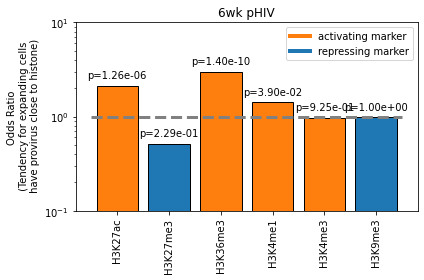

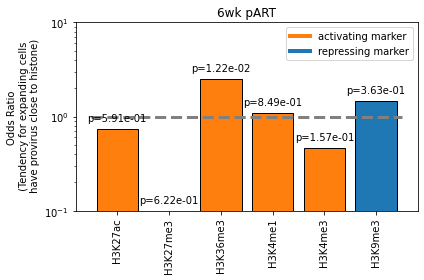

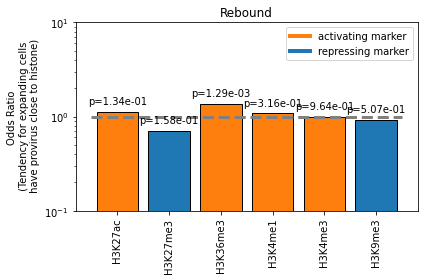

In [424]:
#fisher's test
#within 5k
window = 5e3
for time in ['6wk pHIV','6wk pART','Rebound']:
    oddsdict = {}; pdict = {}
    for histone in histonelist:
        tdata = combineIS[combineIS['Timepoint']==time]
        len1 = len(tdata[(tdata['UMI count']>1)&(abs(tdata['distance to '+histone])<window)&(tdata['distance to '+histone]!=-1)])
        len2 = len(tdata[(tdata['UMI count']>1)&((abs(tdata['distance to '+histone])>window)|(tdata['distance to '+histone]==-1))])
        len3 = len(tdata[(tdata['UMI count']==1)&(abs(tdata['distance to '+histone])<window)&(tdata['distance to '+histone]!=-1)])
        len4 = len(tdata[(tdata['UMI count']==1)&((abs(tdata['distance to '+histone])>window)|(tdata['distance to '+histone]==-1))])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        print(time,histone,len1,len2,len3,len4,odds,p)
        if odds == 0: odds = 0.1
        oddsdict[histone] = odds
        pdict[histone] = p

    plt.figure(figsize=(6,4))
    colorlist = []
    for histone in histonelist:
        if histone in ['H3K27ac','H3K36me3','H3K4me1','H3K4me3']:
            colorlist.append(plt.cm.tab10(1))
        else:
            colorlist.append(plt.cm.tab10(0))
    plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black',color=colorlist)
    plt.yscale('log')
    plt.xticks(rotation=90)
    plt.ylim(0.1,10)
    plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
    plt.ylabel('Odds Ratio\n (Tendency for expanding cells\n have provirus close to histone)')
    for i,v in enumerate(pdict.values()):
        plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
    legend_elements = [Line2D([0], [0], color=plt.cm.tab10(1), lw=4, label='activating marker'),
                       Line2D([0], [0], color=plt.cm.tab10(0), lw=4, label='repressing marker')]
    plt.legend(handles=legend_elements)
    plt.title(time)
    plt.tight_layout()

6wk pHIV H3K27ac 366 802 183 273 0.6807980049875312 0.0008730809595750028
6wk pHIV H3K27me3 49 1119 10 446 1.952993744414656 0.055311462746528844
6wk pHIV H3K36me3 189 979 123 333 0.5226587608061984 1.647566647083343e-06
6wk pHIV H3K4me1 295 873 136 320 0.7950946701704736 0.06965289191321895
6wk pHIV H3K4me3 229 936 110 346 0.7695609945609946 0.04906108840264883
6wk pHIV H3K9me3 158 1010 66 390 0.9243924392439244 0.6312215717244308
Rebound H3K27ac 3394 8510 148 351 0.9458617842284117 0.5781295575546116
Rebound H3K27me3 391 11513 11 488 1.5066604549797462 0.24319302866821174
Rebound H3K36me3 1667 10237 96 403 0.6835915877047312 0.0016328900503742045
Rebound H3K4me1 2835 9069 114 385 1.0557219214095444 0.6676531302313884
Rebound H3K4me3 2370 9534 91 408 1.1145305292567722 0.3901204768234226
Rebound H3K9me3 1694 10210 67 432 1.0697852558948646 0.6472249159155037


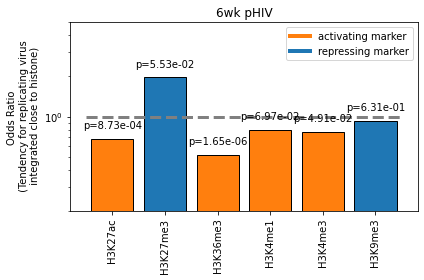

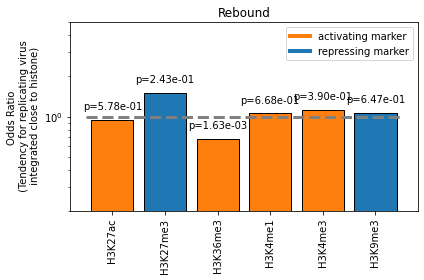

In [425]:
window = 5e3
for time in ['6wk pHIV','Rebound']:
    oddsdict = {}; pdict = {}
    for histone in histonelist:
        tdata = combineIS[combineIS['Timepoint']==time]
        len1 = len(tdata[(tdata['transcription']>0)&(abs(tdata['distance to '+histone])<window)&(tdata['distance to '+histone]!=-1)])
        len2 = len(tdata[(tdata['transcription']>0)&((abs(tdata['distance to '+histone])>window)|(tdata['distance to '+histone]==-1))])
        len3 = len(tdata[(tdata['transcription']==0)&(abs(tdata['distance to '+histone])<window)&(tdata['distance to '+histone]!=-1)])
        len4 = len(tdata[(tdata['transcription']==0)&((abs(tdata['distance to '+histone])>window)|(tdata['distance to '+histone]==-1))])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        print(time,histone,len1,len2,len3,len4,odds,p)
        oddsdict[histone] = odds
        pdict[histone] = p

    plt.figure(figsize=(6,4))
    colorlist = []
    for histone in histonelist:
        if histone in ['H3K27ac','H3K36me3','H3K4me1','H3K4me3']:
            colorlist.append(plt.cm.tab10(1))
        else:
            colorlist.append(plt.cm.tab10(0))
    plt.bar(x=list(oddsdict.keys()),height=list(oddsdict.values()),edgecolor='black',color=colorlist)
    plt.yscale('log')
    plt.xticks(rotation=90)
    plt.ylim(0.2,5)
    plt.hlines(y=1,xmin=-0.5,xmax=len(oddsdict)-0.5,color='grey',linewidth=3,linestyle='--')
    plt.ylabel('Odds Ratio\n (Tendency for replicating virus\n integrated close to histone)')
    for i,v in enumerate(pdict.values()):
        plt.text(i,list(oddsdict.values())[i]*1.2,'p={:0.2e}'.format(v),ha='center')
    legend_elements = [Line2D([0], [0], color=plt.cm.tab10(1), lw=4, label='activating marker'),
                       Line2D([0], [0], color=plt.cm.tab10(0), lw=4, label='repressing marker')]
    plt.legend(handles=legend_elements)
    plt.title(time)
    plt.tight_layout()

In [426]:
testkey = 'distance to gene'
bed_appendix = 'gene'
!bedtools closest -D a -a bed/random_sites_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_gene.bed
!bedtools closest -D a -a bed/IS_combined_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_gene.bed               
randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])    
randomsite[testkey] = randomsite.index.map(lambda x:randomdata[randomdata['row number']==x+1]['distance'].iloc[0])
combineIS[testkey] = combineIS.index.map(lambda x:testdata[testdata['row number']==x]['distance'].iloc[0])           

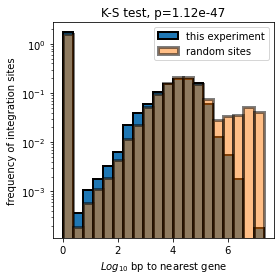

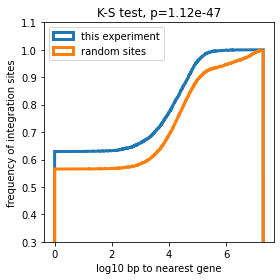

In [427]:
plt.figure(figsize=(4,4))
tdata = combineIS[combineIS['distance to gene']!=-1]
n1 = list(np.log10(abs(tdata['distance to gene']+1)))+[np.log10(max(abs(randomsite['distance to gene'])))]
plt.hist(n1,label='this experiment',bins=20,lw=2,edgecolor='black',density=True)
tdata = randomsite[randomsite['distance to gene']!=-1]
n2 = np.log10(abs(tdata['distance to gene']+1))
plt.hist(n2,label='random sites',bins=20,lw=3,alpha=0.5,edgecolor='black',density=True)
plt.yscale('log')
D,p = ss.kstest(n1,n2)
plt.title('K-S test, p={:.02e}'.format(p))
plt.xlabel('$Log_{10}$ bp to nearest gene')
plt.ylabel('frequency of integration sites')
plt.legend()
plt.tight_layout()
plt.savefig('figures/IS_distribution_to_genes.png',dpi=300)

plt.figure(figsize=(4,4))
tdata = combineIS[combineIS['distance to gene']!=-1]
dist_summary = plt.hist(list(np.log10(abs(tdata['distance to gene']+1)))+[np.log10(max(abs(randomsite['distance to gene'])))],label='this experiment',bins=len(tdata),lw=3,cumulative=True,density=True,histtype='step')
tdata = randomsite[randomsite['distance to gene']!=-1]
dist_summary_random = plt.hist(np.log10(abs(tdata['distance to gene']+1)),label='random sites',bins=len(tdata),lw=3,cumulative=True,density=True,histtype='step')
plt.title('K-S test, p={:.02e}'.format(p))
plt.xlabel('log10 bp to nearest gene')
plt.ylabel('frequency of integration sites')
plt.legend(loc='upper left')
plt.ylim(0.3,1.1)
plt.tight_layout()
plt.savefig('figures/IS_distribution_to_genes_CDF.png',dpi=300)

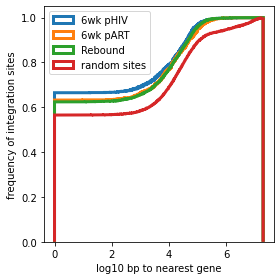

In [428]:
plt.figure(figsize=(4,4))
cdfdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    tdata = combineIS[(combineIS['distance to gene']!=-1)&(combineIS['Timepoint']==time)]
    cdfdict[time] = plt.hist(list(np.log10(abs(tdata['distance to gene']+1)))+[np.log10(max(abs(randomsite['distance to gene'])))],label=time,bins=len(tdata),lw=3,cumulative=True,density=True,histtype='step')
tdata = randomsite[randomsite['distance to gene']!=-1]
dist_summary = plt.hist(np.log10(abs(tdata['distance to gene']+1)),label='random sites',bins=len(tdata),lw=3,cumulative=True,density=True,histtype='step')
#plt.yscale('log')
#plt.title('$\chi^2$='+str(round(chi,4))+',p={:.02e}'.format(p))
plt.xlabel('log10 bp to nearest gene')
plt.ylabel('frequency of integration sites')
plt.legend(loc='upper left')
plt.tight_layout()

In [429]:
for time in cdfdict:
    pd.DataFrame(zip(cdfdict[time][1],cdfdict[time][0]),columns=['log10 distance '+time,'cumulative frequency '+time]).to_csv('stats_CDF_to_nearest_gene_'+time+'.csv')
pd.DataFrame(zip(dist_summary[1],dist_summary[0]),columns=['log10 distance random','cumulative frequency random']).to_csv('stats_CDF_to_nearest_gene_random.csv')

In [430]:
tdata1 = combineIS[(combineIS['distance to gene']!=-1)&(combineIS['Timepoint']=='6wk pHIV')]
tdata2 = combineIS[(combineIS['distance to gene']!=-1)&(combineIS['Timepoint']=='Rebound')]
ss.ranksums(tdata1['distance to gene'],tdata2['distance to gene'])

RanksumsResult(statistic=0.43593790916817404, pvalue=0.662881779549974)

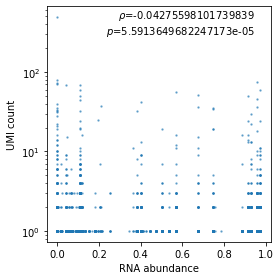

In [431]:
plt.figure(figsize=(4,4))
tdata = combineIS[(combineIS['Timepoint']!='6wk pART')&(combineIS['mapping length']>100)]
plt.scatter(tdata['transcription'],tdata['UMI count'],s=2,alpha=0.5)
rho,p = ss.spearmanr(tdata['transcription'],tdata['UMI count'])
plt.yscale('log')
plt.xlabel('RNA abundance')
plt.ylabel('UMI count')
plt.text(s=r'$\rho$='+str(rho)+'\n$p$='+str(p),x=0.95,y=plt.ylim()[1]*0.95,ha='right',va='top')
plt.tight_layout()
plt.savefig('figures/IS_UMIcount_vs_RNAabundance.svg')

In [432]:
oddsdict = {}
pdict = {}
for time in ['6wk pHIV','6wk pART','Rebound']:
    oddsdict[time] = {}
    pdict[time] = {}
    for histone in histonelist:
        tdata = combineIS[combineIS['Timepoint']==time]
        outfile = open('bed/IS_combined_'+time+'.bed','w')
        for index,row in tdata.iterrows():
            chrom  = row['Integration site'].rsplit(':')[0][3:]
            start  = row['Integration site'].rsplit(':')[1]
            end    = row['Integration site'].rsplit(':')[1]
            strand = row['Integration site'].rsplit(':')[2]
            outfile.write(chrom+'\t'+start+'\t'+end+'\t'+str(index)+'\t'+str(row['UMI count'])+'\t'+strand+'\n')
        outfile.close()
        otime = time.replace(' ','\\ ')
        !bedtools sort -i bed/IS_combined_{otime}.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_{otime}.sort.bed
        !bedtools fisher -a bed/IS_combined_{otime}.sort.bed -b bed/Tcell_{histone}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/fisher_{histone}.tsv
        rdata = pd.read_csv('bed/fisher_'+histone+'.tsv',sep='\t',comment='#')
        oddsdict[time][histone] = rdata.iloc[0]['ratio']
        pdict[time][histone] = rdata.iloc[0]['two-tail']

In [433]:
oddsdata = pd.DataFrame(oddsdict).melt(var_name='Timepoint', value_name='odds',ignore_index=False)
pdata = pd.DataFrame(pdict).melt(var_name='Timepoint', value_name='p',ignore_index=False)
oddsdata['p'] = pdata['p']
oddsdata['histone'] = oddsdata.index
oddsdata.index = range(len(oddsdata))

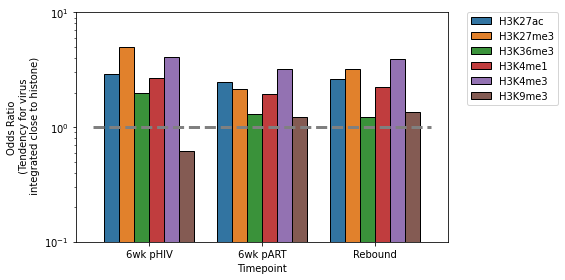

In [434]:
plt.figure(figsize=(8,4))
ax = sns.barplot(x=oddsdata['Timepoint'],y=oddsdata['odds'],hue=oddsdata['histone'],edgecolor='black')
plt.yscale('log')
plt.ylabel('Odds Ratio\n (Tendency for virus\n integrated close to histone)')
plt.ylim(0.1,10)
xmin,xmax = plt.xlim()
plt.hlines(y=1,xmin=xmin,xmax=xmax,color='grey',linewidth=3,linestyle='--')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
plt.tight_layout()

In [435]:
    infile = '../../database/Encode/CD4T_ATAC_ENCFF456OPK.bed'
    tdata = pd.read_csv(infile,sep='\t',names=['chrom','start','end','name','score','strand','enrichment','p','q','peak'])
    tdata['new_chrom'] = tdata['chrom'].apply(lambda x:x[3:])
    tdata[['new_chrom','start','end','name','score','strand','enrichment','p','q','peak']].to_csv('bed/Tcell_ATAC.bed',sep='\t',index=False,header=False)
    !bedtools sort -i bed/Tcell_ATAC.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/Tcell_ATAC.sort.bed
    !bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/Tcell_ATAC.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_ATAC_distance.bed
    interdata = pd.read_csv('bed/IS_ATAC_distance.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','enrichment','p','q','peak','distance'])
    combineIS['distance to ATAC'] = combineIS.index.map(lambda x:interdata[interdata['row number']==x]['distance'].iloc[0])
    combineIS['ATAC enrichment value'] = combineIS.index.map(lambda x:interdata[interdata['row number']==x]['enrichment'].iloc[0]) 

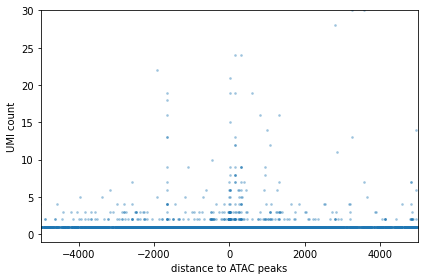

In [436]:
plt.scatter(combineIS['distance to ATAC'],combineIS['UMI count'],s=3,alpha=0.3)
plt.xlim(-5e3,5e3)
plt.ylim(-1,30)
plt.xlabel('distance to ATAC peaks')
plt.ylabel('UMI count')
plt.tight_layout()

In [437]:
ss.spearmanr(abs(combineIS['distance to ATAC']),combineIS['UMI count'])

SignificanceResult(statistic=-0.03536265959668607, pvalue=1.2096278757820716e-05)

In [438]:
tdata2 = combineIS[(combineIS['UMI count']>1)&(combineIS['distance to ATAC']!=-1)]
ss.spearmanr(abs(tdata2['distance to ATAC']),tdata2['UMI count'])

SignificanceResult(statistic=-0.11539478674564047, pvalue=0.00014333938598609666)

In [439]:
for time in timelist:
    tdata2 = combineIS[(combineIS['UMI count']>1)&(combineIS['distance to ATAC']!=-1)&(combineIS['Timepoint']==time)]
    rho,p = ss.spearmanr(abs(tdata2['distance to ATAC']),tdata2['UMI count'])
    print(time+',rho='+str(round(rho,4))+',p={:.4e}'.format(p)+',n='+str(len(tdata2)))

6wk pHIV,rho=-0.1442,p=4.2693e-02,n=198
6wk pART,rho=0.1303,p=4.2299e-01,n=40
Rebound,rho=-0.1113,p=1.2110e-03,n=843


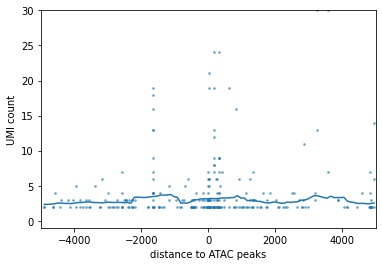

In [440]:
def local_average(xin,yin):
    xin = list(xin); yin = list(yin)
    xmin = xin[0]; xmax=xin[-1]
    frac = 0.15; N = 100
    xout = np.linspace(xmin,xmax,N)
    yout = []
    for i,x in enumerate(xout):
        if i < N*frac/2:
            xrange = xout[:int(N*frac/2+i)]
        elif i > N*(1-frac/2):
            xrange = xout[int(i-N*frac/2):]
        else:
            xrange = xout[int(i-N*frac/2):int(N*frac/2+i)]
        tmin = xrange[0]; tmax = xrange[-1]
        for i1,x1 in enumerate(xin):
            if x1 >= tmin:
                break
        for i2,x2 in enumerate(xin):
            if x2 >= tmax:
                break
        ylist  = yin[i1:i2]
        yout.append(ss.gmean(ylist))
    return xout,yout

plt.scatter(tdata2['distance to ATAC'],tdata2['UMI count'],s=3,alpha=0.5)
tdata = tdata2[(tdata2['distance to ATAC']>-5e3)&(tdata2['distance to ATAC']<5e3)&(tdata2['UMI count']<30)].sort_values('distance to ATAC')
xout,yout = local_average(tdata['distance to ATAC'],tdata['UMI count'])
plt.plot(xout,yout)
plt.xlim(-5e3,5e3)
plt.ylim(-1,30)
plt.xlabel('distance to ATAC peaks')
plt.ylabel('UMI count')
plt.savefig('figures/ATAC_proximity_IS_expansion.png',dpi=300)

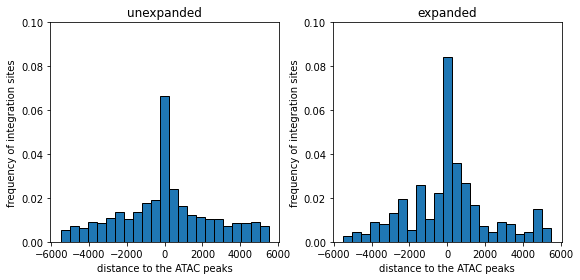

In [441]:
def make_hist(tdata1,title):
    plt.hist(tdata1['distance to ATAC'],bins=np.linspace(-5500,5500,24),edgecolor='black',weights=np.ones_like(tdata1['distance to ATAC']) / len(tdata1['distance to ATAC']))
    plt.xlabel('distance to the ATAC peaks')
    plt.ylabel('frequency of integration sites')
    plt.ylim(0,0.1)
    plt.title(title)

tdata = combineIS[(combineIS['distance to ATAC']!=-1)]
tdata1 = tdata[tdata['UMI count']==1]
tdata2 = tdata[tdata['UMI count']>1]
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
make_hist(tdata1,'unexpanded')
plt.subplot(1,2,2)
make_hist(tdata2,'expanded')
plt.tight_layout()
plt.savefig('figures/ATAC_proximity_IS_histogram.png',dpi=300)

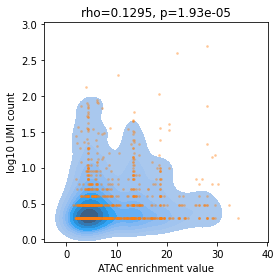

In [442]:
plt.figure(figsize=(4,4))
tdata = combineIS[(abs(combineIS['distance to ATAC'])<5e10)&(combineIS['distance to ATAC']!=-1)&(combineIS['UMI count']>1)]
sns.kdeplot(x=tdata['ATAC enrichment value'].astype('float'),y=np.log10(tdata['UMI count']),fill=True)
plt.scatter(tdata['ATAC enrichment value'].astype('float'),np.log10(tdata['UMI count']),s=3,alpha=0.3)
rho,p = ss.spearmanr(tdata['ATAC enrichment value'].astype('float'),tdata['UMI count'])
plt.title('rho={:0.4f}'.format(rho)+', p={:.2e}'.format(p))
plt.ylabel('log10 UMI count')
plt.xlabel('ATAC enrichment value')
plt.tight_layout()
plt.savefig('figures/ATAC_enrichment_vs_IS_expansion.png',dpi=300)

In [443]:
for time in timelist:
    tdata = combineIS[(combineIS['Timepoint']==time)&(combineIS['distance to ATAC']!=-1)&(combineIS['UMI count']>1)]
    rho,p = ss.spearmanr(tdata['ATAC enrichment value'].astype('float'),tdata['UMI count'])
    print(time+',rho='+str(round(rho,4))+',p={:.4e}'.format(p)+',n='+str(len(tdata)))

6wk pHIV,rho=0.0904,p=2.0539e-01,n=198
6wk pART,rho=-0.0092,p=9.5521e-01,n=40
Rebound,rho=0.1326,p=1.1273e-04,n=843


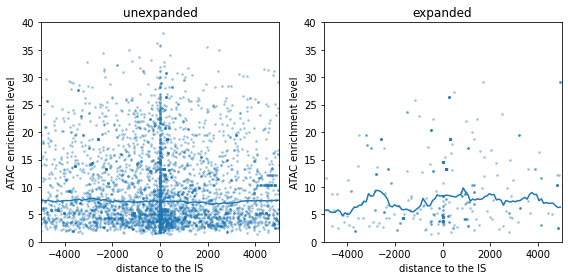

In [444]:
def make_scatter(tdata1,title):
    ttdata = tdata1[abs(tdata1['distance to ATAC'])<5e3].sort_values('distance to ATAC')
    xout,yout = local_average(ttdata['distance to ATAC'],ttdata['ATAC enrichment value'].astype('float'))
    plt.scatter(tdata1['distance to ATAC'],tdata1['ATAC enrichment value'].astype('float'),s=3,alpha=0.3)
    plt.plot(xout,yout)
    plt.xlim(-5e3,5e3)
    plt.xlabel('distance to the IS')
    plt.ylabel('ATAC enrichment level')
    plt.ylim(0,40)
    plt.title(title)

tdata = combineIS[(combineIS['distance to ATAC']!=-1)]
tdata1 = tdata[tdata['UMI count']==1]
tdata2 = tdata[tdata['UMI count']>1]
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
make_scatter(tdata1,'unexpanded')
plt.subplot(1,2,2)
make_scatter(tdata2,'expanded')
plt.tight_layout()
plt.savefig('figures/IS_proximity_ATAC_enrichment.png',dpi=300)

In [445]:
ss.spearmanr(tdata['distance to ATAC'],tdata['ATAC enrichment value'].astype('float'))

SignificanceResult(statistic=-0.01567436469805944, pvalue=0.05425677808994794)

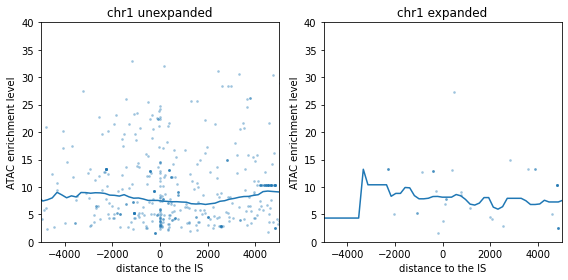

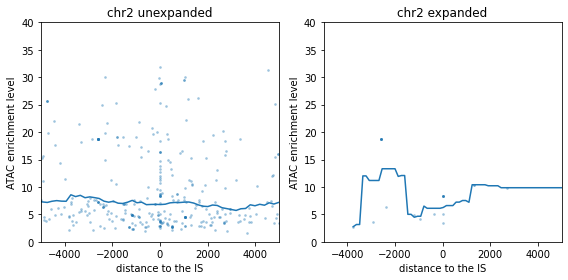

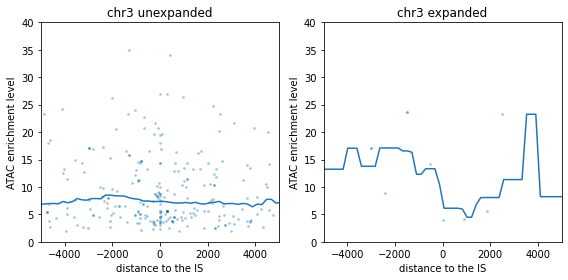

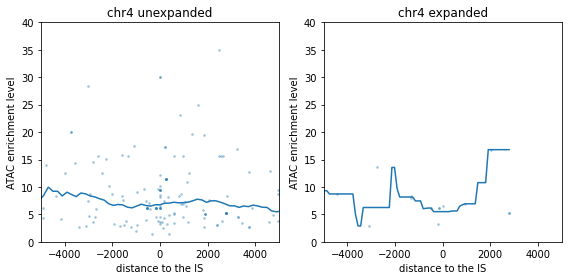

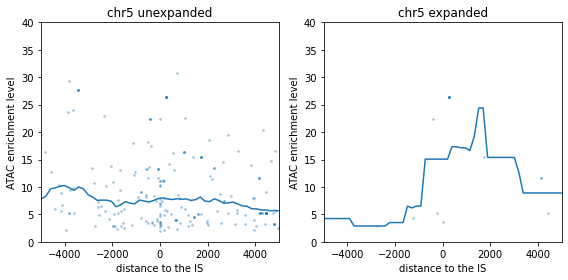

...

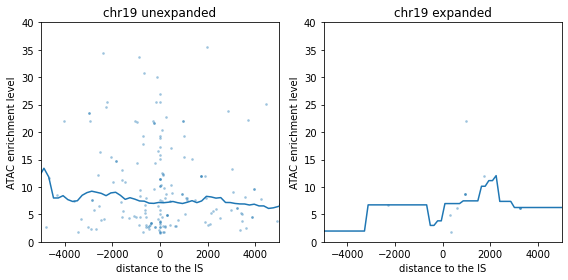

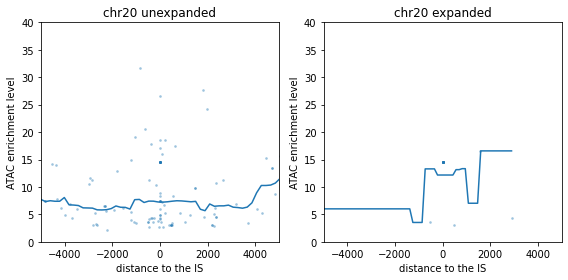

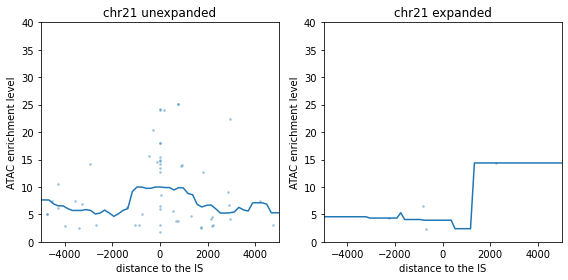

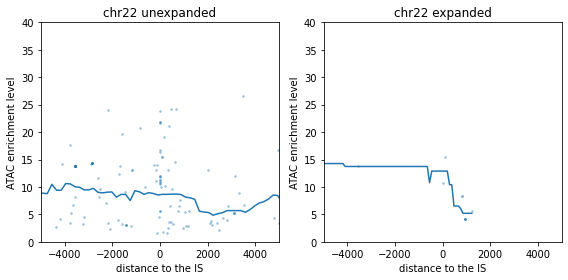

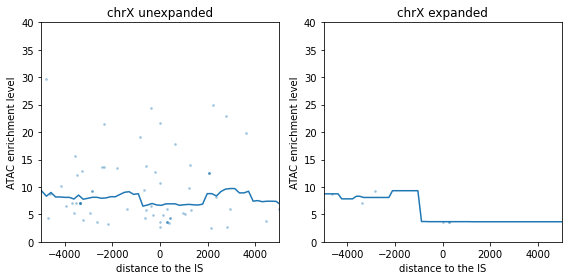

In [446]:
def local_average(xin,yin):
    xin = list(xin); yin = list(yin)
    xmin = xin[0]; xmax=xin[-1]
    frac = 0.15; N = 100
    xout = np.linspace(xmin,xmax,N)
    yout = []
    for i,x in enumerate(xout):
        if i < N*frac/2:
            xrange = xout[:int(N*frac/2+i)]
        elif i > N*(1-frac/2):
            xrange = xout[int(i-N*frac/2):]
        else:
            xrange = xout[int(i-N*frac/2):int(N*frac/2+i)]
        tmin = xrange[0]; tmax = xrange[-1]
        for i1,x1 in enumerate(xin):
            if x1 >= tmin:
                break
        for i2,x2 in enumerate(xin):
            if x2 >= tmax:
                break
        ylist  = yin[i1:i2]
        if len(ylist) == 0:
            yout.append(yout[-1])
        else:
            yout.append(ss.gmean(ylist))
    return xout,yout

def make_scatter(tdata1,title):
    ttdata = tdata1[abs(tdata1['distance to ATAC'])<1e4].sort_values('distance to ATAC')
    xout,yout = local_average(ttdata['distance to ATAC'],ttdata['ATAC enrichment value'].astype('float'))
    plt.scatter(tdata1['distance to ATAC'],tdata1['ATAC enrichment value'].astype('float'),s=3,alpha=0.3)
    plt.plot(xout,yout)
    plt.xlim(-5e3,5e3)
    plt.xlabel('distance to the IS')
    plt.ylabel('ATAC enrichment level')
    plt.ylim(0,40)
    plt.title('chr'+str(chrom)+' '+title)

for chrom in list(range(1,23))+['X','Y']:
    tdata = combineIS[(combineIS['distance to ATAC']!=-1)&(combineIS['chromosome']=='hs'+str(chrom))]
    tdata1 = tdata[tdata['UMI count']==1]
    tdata2 = tdata[tdata['UMI count']>1]
    if len(tdata2) == 0: continue
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    make_scatter(tdata1,'unexpanded')
    plt.subplot(1,2,2)
    make_scatter(tdata2,'expanded')
    plt.tight_layout()
    plt.savefig('figures/IS_proximity_ATAC_enrichment_chr'+str(chrom)+'.png',dpi=300)

maybe I will try averaging on barcode level or sample level.

In [447]:
#for every barcode, calculate its frequency of IS within gene
def calc_withingene(x):
    UDP = x['UDP']
    bc = x['barcode']
    tdata = combineIS[(combineIS['barcode']==bc)&(combineIS['UDP']==UDP)]
    depth = sum(tdata['UMI count'])
    count = 0
    for i,r in tdata.iterrows():
        if r['host gene'] == r['host gene']:
            count += r['UMI count']
    return count/depth
    
combinebc['within_gene_freq'] = combinebc.apply(lambda x:calc_withingene(x),axis=1)

In [448]:
for time in ['6wk pHIV','6wk pART','Rebound']:
    tdata = combinebc[combinebc['Timepoint']==time]
    rho,p = ss.spearmanr(tdata['within_gene_freq'],tdata['gmean_UMI_per_IS'])
    print(time,rho,p)

6wk pHIV 0.17084476590438447 0.11150269169190255
6wk pART -0.06463370616935679 0.28815930782888144
Rebound 0.09888473824790851 0.23833151056559995


In [449]:
ss.spearmanr(combinebc['within_gene_freq'],combinebc['gmean_UMI_per_IS'])

SignificanceResult(statistic=0.013749717894726902, pvalue=0.7581367338909124)

In [450]:
for time in ['6wk pHIV','Rebound']:
    tdata = combinebc[combinebc['Timepoint']==time]
    rho,p = ss.spearmanr(tdata['within_gene_freq'],tdata['transcription'])
    print(time,rho,p)

6wk pHIV -0.06368058833015179 0.5555700657395801
Rebound 0.02361792924616387 0.7787224659166


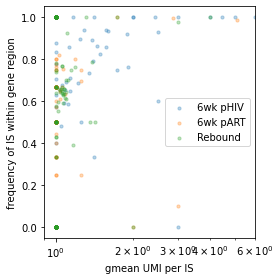

In [451]:
plt.figure(figsize=(4,4))
for time in ['6wk pHIV','6wk pART','Rebound']:
    tdata = combinebc[combinebc['Timepoint']==time]
    plt.scatter(tdata['gmean_UMI_per_IS'],tdata['within_gene_freq'],s=10,alpha=0.3,label=time)
plt.xlabel('gmean UMI per IS')
plt.ylabel('frequency of IS within gene region')
plt.xscale('log')
plt.xlim(0.9,6)
plt.legend()
plt.tight_layout()

In [452]:
    oddsdict = {}; pdict = {}
    for time in ['6wk pHIV','6wk pART','Rebound']:
        tdata = combinebc[combinebc['Timepoint']==time]
        len1 = len(tdata[(tdata['gmean_UMI_per_IS']>1)&(tdata['within_gene_freq']==1)])
        len2 = len(tdata[(tdata['gmean_UMI_per_IS']>1)&(tdata['within_gene_freq']<1)])
        len3 = len(tdata[(tdata['gmean_UMI_per_IS']==1)&(tdata['within_gene_freq']==1)])
        len4 = len(tdata[(tdata['gmean_UMI_per_IS']==1)&(tdata['within_gene_freq']<1)])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        #print(time,len1,len2,len3,len4,odds,p)
        print(time+',OR='+str(round(odds,4))+',p={:.4e}'.format(p)+',n='+str(len(tdata)))

6wk pHIV,OR=0.4702,p=1.2489e-01,n=88
6wk pART,OR=0.1185,p=8.7812e-04,n=272
Rebound,OR=0.2,p=1.8049e-03,n=144


In [453]:
    oddsdict = {}; pdict = {}
    for time in ['6wk pHIV','Rebound']:
        tdata = combinebc[combinebc['Timepoint']==time]
        len1 = len(tdata[(tdata['transcription']>0)&(tdata['within_gene_freq']==1)])
        len2 = len(tdata[(tdata['transcription']>0)&(tdata['within_gene_freq']<1)])
        len3 = len(tdata[(tdata['transcription']==0)&(tdata['within_gene_freq']==1)])
        len4 = len(tdata[(tdata['transcription']==0)&(tdata['within_gene_freq']<1)])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        print(time,len1,len2,len3,len4,odds,p)

6wk pHIV 13 25 21 29 0.7180952380952381 0.512177137195273
Rebound 6 42 42 54 0.1836734693877551 0.000148460291817403


It seems if we have virus integrated out of gene region, then it is less likely to clonal expanding or transcribing.


In [454]:
    oddsdict = {}; pdict = {}
    for time in ['6wk pHIV','6wk pART','Rebound']:
        tdata = combinebc[combinebc['Timepoint']==time]
        len1 = len(tdata[(tdata['gmean_UMI_per_IS']>1)&(tdata['within_gene_freq']>=0)])
        len2 = len(tdata[(tdata['gmean_UMI_per_IS']>1)&(tdata['within_gene_freq']==0)])
        len3 = len(tdata[(tdata['gmean_UMI_per_IS']==1)&(tdata['within_gene_freq']>=0)])
        len4 = len(tdata[(tdata['gmean_UMI_per_IS']==1)&(tdata['within_gene_freq']==0)])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        print(time,len1,len2,len3,len4,odds,p)

6wk pHIV 41 1 47 11 9.595744680851064 0.01251545437463781
6wk pART 17 1 255 64 4.266666666666667 0.21558600611631307
Rebound 34 1 110 43 13.290909090909091 0.0006718487858640193


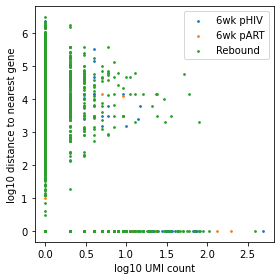

In [455]:
plt.figure(figsize=(4,4))
for time in ['6wk pHIV','6wk pART','Rebound']:
    tdata = combineIS[(combineIS['distance to gene']!=-1)&(combineIS['Timepoint']==time)]    
    plt.scatter(np.log10(tdata['UMI count']),np.log10(abs(tdata['distance to gene']+1)),s=3,alpha=1,label=time) 
    #sns.kdeplot(x=np.log10(tdata['UMI count']),y=np.log10(abs(tdata['distance to gene'])))
plt.xlabel('log10 UMI count')
plt.ylabel('log10 distance to nearest gene')
plt.legend()
plt.tight_layout()

In [456]:
for time in ['6wk pHIV','6wk pART','Rebound']:
    tdata = combineIS[(combineIS['distance to gene']!=-1)&(combineIS['Timepoint']==time)]
    len1 = len(tdata[(tdata['UMI count']>1)&(abs(tdata['distance to gene'])==0)])
    len2 = len(tdata[(tdata['UMI count']>1)&(abs(tdata['distance to gene'])>0)])
    len3 = len(tdata[(tdata['UMI count']==1)&(abs(tdata['distance to gene'])==0)])
    len4 = len(tdata[(tdata['UMI count']==1)&(abs(tdata['distance to gene'])>0)])
    odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
    print(time+',OR='+str(round(odds,4))+',p={:.4e}'.format(p)+',n='+str(len(tdata)))

6wk pHIV,OR=1.8271,p=5.2951e-04,n=1617
6wk pART,OR=2.3752,p=2.9414e-02,n=1272
Rebound,OR=1.1795,p=2.7389e-02,n=12336


In [457]:
combineIS[(abs(tdata['distance to gene'])==0)&(~combineIS['in_gene'])]

,Integration site,UMI count,Mouse,sample name,Timepoint,UDP,barcode,Organ,mapping length,truebc,...,circos bin,distance to H3K27ac,distance to H3K27me3,distance to H3K36me3,distance to H3K4me1,distance to H3K4me3,distance to H3K9me3,distance to gene,distance to ATAC,ATAC enrichment value
98,chrM:4908:+,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTGGACGACGTAGAGGGAGGCCCTACAA,Spleen,129.0,GCCTCCCTCTACGTCGTCCAC,...,NaN,-1,-1,-1,-1,-1,-1,0,-1,.
1409,chrM:4908:+,1,11-DMSO,11-DMSO Rebound Spleen,Rebound,UDP04,CTTATAGAAGCTGCTGTTGACGCAGTTCCTACAA,Spleen,128.0,AACTGCGTCAACAGCAGCTTC,...,NaN,-1,-1,-1,-1,-1,-1,0,-1,.
1929,chrM:15033:-,1,23-DMSO,23-DMSO Rebound Spleen,Rebound,UDP07,CTTATAGATGTCGATGAAGGTGAGGATTCTACAA,Spleen,29.0,TTGTAGAATCCTCACCTTCATCGACATC,...,NaN,-1,-1,-1,-1,-1,-1,0,-1,.
2989,chrM:7332:-,1,06-DMSO,06-DMSO Rebound BM,Rebound,UDP11,CTTATAGAGGAAGCCGACGTCGAAGTTCCTACAA,BM,116.0,AACTTCGACGTCGGCTTCCTC,...,NaN,-1,-1,-1,-1,-1,-1,0,-1,.
3461,chrM:13193:+,1,06-DMSO,06-DMSO Rebound BM,Rebound,UDP11,CTTATAGAGGAAGCCGACGTCGAAGTTCCTACAA,BM,128.0,AACTTCGACGTCGGCTTCCTC,...,NaN,-1,-1,-1,-1,-1,-1,0,-1,.
3479,chrM:15863:+,1,06-DMSO,06-DMSO Rebound BM,Rebound,UDP11,CTTATAGAGGAAGCCGACGTCGAAGTTCCTACAA,BM,40.0,AACTTCGACGTCGGCTTCCTC,...,NaN,-1,-1,-1,-1,-1,-1,0,-1,.
3629,chrM:7331:-,1,06-DMSO,06-DMSO Rebound BM,Rebound,UDP11,CTTATAGAGGAAGCCGACGTCGAAGTTCCTACAA,BM,116.0,AACTTCGACGTCGGCTTCCTC,...,NaN,-1,-1,-1,-1,-1,-1,0,-1,.
4175,chrM:12699:+,1,06-DMSO,06-DMSO Rebound BM,Rebound,UDP11,CTTATAGAAGCAGAGGAGGAGGTAGCCCCTACAA,BM,129.0,GGCTACCTCCTCCTCTGCTTC,...,NaN,-1,-1,-1,-1,-1,-1,0,-1,.
4764,chrM:3753:-,1,12-DMSO,12-DMSO Rebound BM,Rebound,UDP13,CTTATAGAGGCTGAGGTCGCTGAAGATCCTACAA,BM,54.0,ATCTTCAGCGACCTCAGCCTC,...,NaN,-1,-1,-1,-1,-1,-1,0,-1,.
5040,chrM:4908:+,1,12-DMSO,12-DMSO Rebound BM,Rebound,UDP13,CTTATAGAGGCTGAGGTCGCTGAAGATCCTACAA,BM,128.0,ATCTTCAGCGACCTCAGCCTC,...,NaN,-1,-1,-1,-1,-1,-1,0,-1,.


In [458]:
#TSS
tssdata = pd.read_csv('../../database/genome_annotation/refTSS_v3.3_human_coordinate.hg38.bed',sep='\t',names=['chr','pos1','pos2','tss name','1','direction','center','center1','color'])
tssdata

,chr,pos1,pos2,tss name,1,direction,center,center1,color
0,chr1,16013,16020,hg_233254.1,1,-,16016,16017,"255,255,0"
1,chr1,29346,29366,hg_234684.1,1,-,29356,29357,"255,255,0"
2,chr1,36521,36538,hg_234905.1,1,+,36529,36530,"255,255,0"
3,chr1,186535,186542,hg_233716.1,1,-,186538,186539,"255,255,0"
4,chr1,199862,199882,hg_233782.1,1,-,199872,199873,"255,255,0"
...,...,...,...,...,...,...,...,...,...
224689,chrY,26409204,26409213,hg_232047.1,1,+,26409208,26409209,"255,255,0"
224690,chrY,26671129,26671136,hg_201298.1,1,-,26671132,26671133,"255,255,0"
224691,chrY,56734794,56734819,hg_201299.1,1,-,56734806,56734807,"255,255,0"
224692,chrY,56827678,56827684,hg_232048.1,1,+,56827681,56827682,"255,255,0"


In [459]:
tssgene = pd.read_csv('../../database/genome_annotation/refTSS_v3.3_human_annotation.txt',sep='\t')
tssgene = tssgene[tssgene['Transcript_name']==tssgene['Transcript_name']]

In [460]:
def get_ensembl_mappings():                                   
    # Set up connection to server                                               
    server = biomart.BiomartServer('www.ensembl.org/biomart/')         
    mart = server.datasets['hsapiens_gene_ensembl']                            
                                                                                
    # List the types of data we want                                            
    attributes = ['ensembl_transcript_id', 'ensembl_gene_id']
                                                                                
    # Get the mapping between the attributes                                    
    response = mart.search({'attributes': attributes})                          
    data = response.raw.data.decode('ascii')                                    
                                                                                
    t2gdict = {}                                                 
    # Store the data in a dict                                                  
    for line in data.splitlines():                                              
        line = line.split('\t')                                                 
        # The entries are in the same order as in the `attributes` variable
        transcript_id = line[0]                                                                                                   
        ensembl_gene = line[1]                                                                                               
                                                                                
        # Some of these keys may be an empty string. If you want, you can 
        # avoid having a '' key in your dict by ensuring the 
        # transcript/gene/peptide ids have a nonzero length before
        # adding them to the dict
        t2gdict[transcript_id] = ensembl_gene                      
             
                                                                                
    return t2gdict

t2gdict = get_ensembl_mappings()

In [461]:
def find_ENSG(x):
    tdata = tssgene[tssgene['#CAGE_Peak_ID'].isin([x])]
    if len(tdata) == 0: return np.nan
    enst = np.nan
    for tname in tdata['Transcript_name']:
        if 'ENST' in tname:
            enst = tname
            break
    if enst != enst: return enst
    enst = enst.rsplit('.')[0]
    if enst in t2gdict:
        return t2gdict[enst]
    return np.nan

tssdata['ENSG'] = tssdata['tss name'].apply(lambda x:find_ENSG(x))

In [462]:
tssdata = tssdata[tssdata['ENSG']==tssdata['ENSG']]

In [463]:
tssdata['row number'] = tssdata.index
tssdata['new_chrom'] = tssdata['chr'].apply(lambda x:x[3:])
tssdata[['new_chrom','pos1','pos2','tss name','row number','direction']].to_csv('bed/reftss.bed',index=False,header=False,sep='\t')
!bedtools sort -i bed/reftss.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/reftss.sorted.bed
!bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/reftss.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_tss.bed

In [464]:
def annotate_tss(x):
    tdata = interdata[interdata['row number']==x.name]
    x['nearest host TSS'] = tdata['tss name'].iloc[0]
    x['host TSS direction'] = tdata['strand2'].iloc[0]
    x['host TSS distance'] = tdata['distance'].iloc[0]
    if tdata['tss row'].iloc[0] == -1:
        x['host TSS ENSG'] = np.nan
    else:
        x['host TSS ENSG'] = tssdata.loc[tdata['tss row'].iloc[0],'ENSG']
    return x

interdata = pd.read_csv('bed/IS_combined_distance_to_tss.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','tss name','tss row','strand2','distance'])
combineIS = combineIS.apply(annotate_tss,axis=1)

In [465]:
def decide_direction(x):
    if x['host TSS direction'] == x['IS direction']:
        return True
    return False

combineIS['same direction with nearest host TSS'] = combineIS.apply(lambda x:decide_direction(x),axis=1)

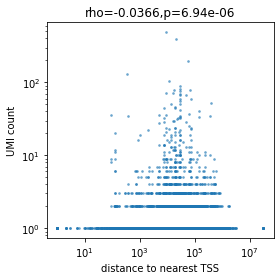

In [466]:
plt.figure(figsize=(4,4))
tdata = combineIS[combineIS['host TSS distance']!=-1]
plt.scatter(abs(tdata['host TSS distance']+1),tdata['UMI count'],s=3,alpha=0.5)
rho,p = ss.spearmanr(abs(tdata['host TSS distance']+1),tdata['UMI count'])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('distance to nearest TSS')
plt.ylabel('UMI count')
plt.title('rho='+str(round(rho,4))+',p={:.2e}'.format(p))
plt.tight_layout()
plt.savefig('figures/distance_to_TSS.png',dpi=300)

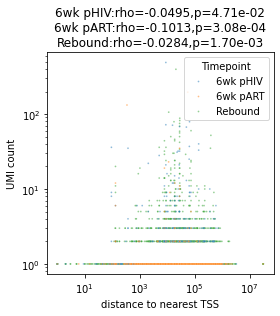

In [467]:
plt.figure(figsize=(4,4.5))
tdata = combineIS[combineIS['host TSS distance']!=-1]
sns.scatterplot(x=abs(tdata['host TSS distance']+1),y=tdata['UMI count'],hue=tdata['Timepoint'],s=3,alpha=0.5,hue_order=timelist)
labels = []
for time in timelist:
    ttdata = tdata[tdata['Timepoint']==time]
    rho,p = ss.spearmanr(abs(ttdata['host TSS distance']+1),ttdata['UMI count'])
    labels.append(time+':rho='+str(round(rho,4))+',p={:.2e}'.format(p))
plt.xscale('log')
plt.yscale('log')
plt.xlabel('distance to nearest TSS')
plt.ylabel('UMI count')
plt.title('\n'.join(labels))
plt.tight_layout()
plt.savefig('figures/distance_to_TSS_by_time.png',dpi=300)

In [468]:
combineIS['clonal expanded'] = combineIS['UMI count'].apply(lambda x:True if x > 1 else False)

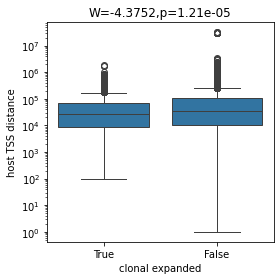

In [469]:
tdata = combineIS[combineIS['host TSS distance']!=-1]
plt.figure(figsize=(4,4))
sns.boxplot(y=abs(tdata['host TSS distance']+1),x=tdata['clonal expanded'],order=[True,False])
W,p = ss.ranksums(abs(tdata[tdata['clonal expanded']]['host TSS distance']),abs(tdata[~tdata['clonal expanded']]['host TSS distance']))
plt.yscale('log')
plt.title('W='+str(round(W,4))+',p={:.2e}'.format(p))
plt.tight_layout()
plt.savefig('figures/distance_to_TSS_ranksums.png')

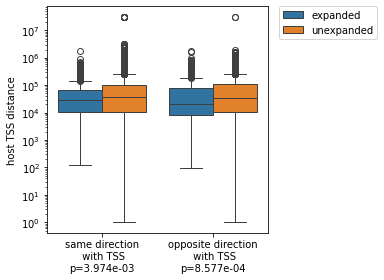

In [470]:
tdata = combineIS[combineIS['host TSS distance']!=-1]
plt.figure(figsize=(5.5,4))
ax = sns.boxplot(y=abs(tdata['host TSS distance']+1),hue=tdata['clonal expanded'],order=[True,False],x=tdata['same direction with nearest host TSS'],hue_order=[True,False])
plt.yscale('log')
ttdata = tdata[tdata['same direction with nearest host TSS']]
W,p1 = ss.ranksums(abs(ttdata[ttdata['clonal expanded']]['host TSS distance']),abs(ttdata[~ttdata['clonal expanded']]['host TSS distance']))
ttdata = tdata[~tdata['same direction with nearest host TSS']]
W,p2 = ss.ranksums(abs(ttdata[ttdata['clonal expanded']]['host TSS distance']),abs(ttdata[~ttdata['clonal expanded']]['host TSS distance']))
plt.xticks([0,1],['same direction\n with TSS\np={:.3e}'.format(p1),'opposite direction\n with TSS\np={:.3e}'.format(p2)])
plt.xlabel('')
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, ['expanded','unexpanded'], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)   
plt.tight_layout()
plt.savefig('figures/distance_to_TSS_ranksums_direction.png')

In [471]:
def decide_PI(x):
    if x['host TSS distance'] == -1: return np.nan
    if x['host TSS distance'] == 0: return 'overlap'
    if x['same direction with nearest host TSS'] and x['host TSS distance'] > 0:
        return 'downstream tandem'
    if x['same direction with nearest host TSS'] and x['host TSS distance'] < 0:
        return 'upstream tandem'
    if (~x['same direction with nearest host TSS']) and x['host TSS distance'] > 0:
        return 'collision'
    if (~x['same direction with nearest host TSS']) and x['host TSS distance'] < 0:
        return 'back-to-back'

combineIS['promoter inteference mode'] = combineIS.apply(lambda x:decide_PI(x),axis=1)

In [472]:
PIlist = ['upstream tandem','downstream tandem','collision','back-to-back']

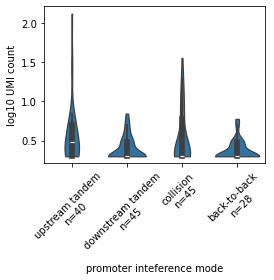

In [473]:
tdata = combineIS[(combineIS['host TSS distance']!=-1)&(abs(combineIS['host TSS distance'])<5e3)]
tdata = tdata[tdata['UMI count']>1]
tsize = tdata.groupby('promoter inteference mode').size()
plt.figure(figsize=(4,4))
sns.violinplot(x=tdata['promoter inteference mode'],y=np.log10(tdata['UMI count']),cut=0,order=PIlist)
plt.ylabel('log10 UMI count')
labels = []
for PI in PIlist:
    labels.append(PI+'\nn='+str(tsize[PI]))
plt.xticks(range(4),labels,rotation=45)
plt.tight_layout()
plt.savefig('figures/expanded_PI_mode.png',dpi=300)

In [474]:
tdata = combineIS[(combineIS['host TSS distance']!=-1)&(abs(combineIS['host TSS distance'])<5e3)]
tsize = tdata.groupby(['promoter inteference mode','clonal expanded']).size()
for PI in PIlist:
    print(PI,tsize[PI,True]/(tsize[PI,False]+tsize[PI,True]))

upstream tandem 0.0684931506849315
downstream tandem 0.07550335570469799
collision 0.06686478454680535
back-to-back 0.055666003976143144


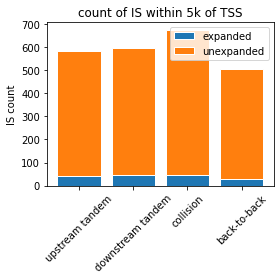

In [475]:
ylist = []
for PI in PIlist:
    ylist.append(tsize[PI,True])
ylist2 = []
for PI in PIlist:
    ylist2.append(tsize[PI,False])
plt.figure(figsize=(4,4))
plt.bar(x=PIlist,height=ylist,label='expanded',edgecolor='w')
plt.bar(x=PIlist,height=ylist2,label='unexpanded',bottom=ylist,edgecolor='w')
plt.ylabel('IS count')
plt.xticks(rotation=45)
plt.title('count of IS within 5k of TSS')
plt.legend()
plt.tight_layout()
plt.savefig('figures/IS_count_near_TSS_by_mode.png',dpi=300)

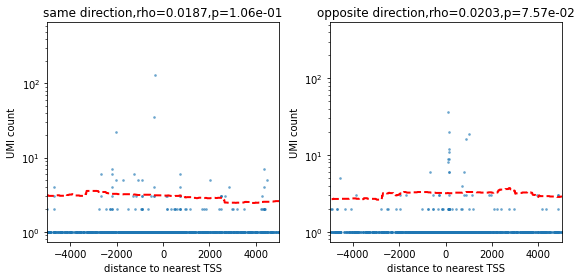

In [476]:
def local_average(xin,yin):
    xin = list(xin); yin = list(yin)
    xmin = xin[0]; xmax=xin[-1]
    frac = 0.3; N = 1000
    xout = np.linspace(xmin,xmax,N)
    yout = []
    for i,x in enumerate(xout):
        if i < N*frac/2:
            xrange = xout[:int(N*frac/2+i)]
        elif i > N*(1-frac/2):
            xrange = xout[int(i-N*frac/2):]
        else:
            xrange = xout[int(i-N*frac/2):int(N*frac/2+i)]
        tmin = xrange[0]; tmax = xrange[-1]
        for i1,x1 in enumerate(xin):
            if x1 >= tmin:
                break
        for i2,x2 in enumerate(xin):
            if x2 >= tmax:
                break
        ylist  = yin[i1:i2]
        yout.append(ss.gmean(ylist))
    return xout,yout

plt.figure(figsize=(8,4))
tdata = combineIS[combineIS['host TSS distance']!=-1].sort_values(by='host TSS distance')

plt.subplot(1,2,1)
tdata_f = tdata[tdata['same direction with nearest host TSS']]
rho,p = ss.spearmanr(tdata_f['host TSS distance'],tdata_f['UMI count'])
plt.scatter(tdata_f['host TSS distance'],tdata_f['UMI count'],s=3,alpha=0.5)
tdata_f = tdata_f[(abs(tdata_f['host TSS distance'])<1e4)&(tdata_f['UMI count']>1)]
xout,yout = local_average(list(tdata_f['host TSS distance']),list(tdata_f['UMI count']))
plt.plot(xout,yout,lw=2,ls='--',color='red')
plt.yscale('log')
plt.xlim(-5e3,5e3)
plt.xlabel('distance to nearest TSS')
plt.ylabel('UMI count')
plt.title('same direction,rho='+str(round(rho,4))+',p={:.2e}'.format(p))

plt.subplot(1,2,2)
tdata_r = tdata[~tdata['same direction with nearest host TSS']]
rho,p = ss.spearmanr(tdata_r['host TSS distance'],tdata_r['UMI count'])
plt.scatter(tdata_r['host TSS distance'],tdata_r['UMI count'],s=3,alpha=0.5)
tdata_r = tdata_r[(abs(tdata_r['host TSS distance'])<1e4)&(tdata_r['UMI count']>1)]
xout,yout = local_average(list(tdata_r['host TSS distance']),list(tdata_r['UMI count']))
plt.plot(xout,yout,lw=2,ls='--',color='red')
plt.yscale('log')
plt.xlim(-5e3,5e3)
plt.xlabel('distance to nearest TSS')
plt.ylabel('UMI count')
plt.title('opposite direction,rho='+str(round(rho,4))+',p={:.2e}'.format(p))

plt.tight_layout()
plt.savefig('figures/distance_to_TSS_both_sides.png',dpi=300)

In [477]:
hostexpdata = pd.read_csv('../../database/Encode/CD4T_RNAseq_ENCFF606WIM.tsv',sep='\t')
hostexpdata[hostexpdata['gene_id'].str.contains('ENSG')]

,gene_id,transcript_id(s),length,effective_length,expected_count,TPM,FPKM,posterior_mean_count,posterior_standard_deviation_of_count,pme_TPM,pme_FPKM,TPM_ci_lower_bound,TPM_ci_upper_bound,TPM_coefficient_of_quartile_variation,FPKM_ci_lower_bound,FPKM_ci_upper_bound,FPKM_coefficient_of_quartile_variation
649,ENSG00000000003.14,"ENST00000373020.8,ENST00000494424.1,ENST000004...",1749.40,1650.40,0.00,0.00,0.00,0.00,0.00,0.13,0.16,2.408680e-02,0.248096,0.333084,3.052240e-02,0.314805,0.332990
650,ENSG00000000005.5,"ENST00000373031.4,ENST00000485971.1",940.50,841.50,0.00,0.00,0.00,0.00,0.00,0.09,0.11,1.198850e-03,0.218922,0.503227,1.845380e-03,0.278177,0.503295
651,ENSG00000000419.12,"ENST00000371582.8,ENST00000371584.8,ENST000003...",1077.23,978.23,666.00,19.77,24.41,666.00,0.00,19.39,24.60,1.790800e+01,20.842800,0.026235,2.274230e+01,26.468400,0.026201
652,ENSG00000000457.13,"ENST00000367770.5,ENST00000367771.10,ENST00000...",3328.50,3229.50,744.00,6.69,8.26,744.00,0.00,6.59,8.36,6.001860e+00,7.184610,0.030974,7.632200e+00,9.132760,0.031019
653,ENSG00000000460.16,"ENST00000286031.10,ENST00000359326.8,ENST00000...",2452.48,2353.48,1170.00,14.44,17.82,1170.00,0.00,14.14,17.94,1.284590e+01,15.424800,0.031637,1.629970e+01,19.575300,0.031654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59424,ENSG00000285990.1,ENST00000649331.1,647.00,548.00,0.00,0.00,0.00,0.00,0.00,0.05,0.06,2.446440e-06,0.154040,0.655456,3.109340e-06,0.195463,0.655464
59425,ENSG00000285991.1,ENST00000647612.1,5065.00,4966.00,6.12,0.04,0.04,7.89,4.09,0.05,0.06,5.456500e-03,0.106459,0.382468,6.976020e-03,0.135204,0.382419
59426,ENSG00000285992.1,ENST00000648949.1,956.00,857.00,0.00,0.00,0.00,0.00,0.00,0.03,0.04,3.968570e-07,0.098153,0.658002,5.037380e-07,0.124649,0.658078
59427,ENSG00000285993.1,ENST00000650266.1,1246.00,1147.00,0.00,0.00,0.00,0.00,0.00,0.02,0.03,3.133620e-07,0.073319,0.658269,3.977140e-07,0.093080,0.658380


In [478]:
def find_TSS_exp(x):
    tdata = hostexpdata[hostexpdata['ENSG'].isin([x])]
    if len(tdata) == 0:
        return 0
    else:
        return tdata['FPKM'].iloc[0]

hostexpdata['ENSG'] = hostexpdata['gene_id'].apply(lambda x:x.rsplit('.')[0])
combineIS['host TSS transcription'] = combineIS['host TSS ENSG'].apply(lambda x:find_TSS_exp(x))

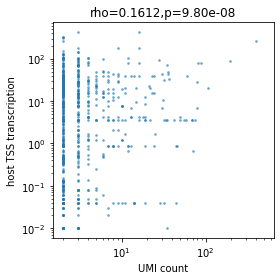

In [479]:
plt.figure(figsize=(4,4))
tdata = combineIS[combineIS['host TSS distance']!=-1]
tdata = tdata[tdata['UMI count']>1]
plt.scatter(tdata['UMI count'],tdata['host TSS transcription'],s=3,alpha=0.5)
rho,p = ss.spearmanr(tdata['UMI count'],tdata['host TSS transcription'])
plt.yscale('log')
plt.xscale('log')
plt.ylabel('host TSS transcription')
plt.xlabel('UMI count')
plt.title('rho='+str(round(rho,4))+',p={:.2e}'.format(p))
plt.tight_layout()
plt.savefig('figures/expansion_to_TSS_transcription.png',dpi=300)

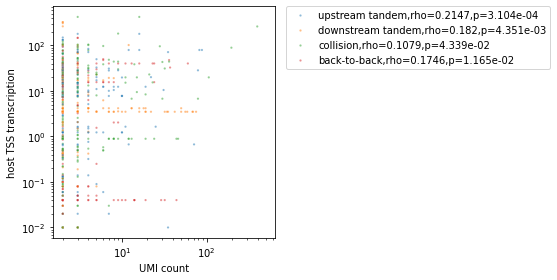

In [480]:
plt.figure(figsize=(8,4))
tdata = combineIS[combineIS['host TSS distance']!=-1]
tdata = tdata[tdata['UMI count']>1]
ax = sns.scatterplot(x=tdata['UMI count'],y=tdata['host TSS transcription'],hue=tdata['promoter inteference mode'],s=5,alpha=0.5,hue_order=PIlist)
plt.yscale('log')
plt.xscale('log')
plt.ylabel('host TSS transcription')
plt.xlabel('UMI count')
handles, labels = ax.get_legend_handles_labels()
labels = []
for PI in PIlist:
    ttdata = tdata[tdata['promoter inteference mode']==PI]
    rho,p = ss.spearmanr(ttdata['UMI count'],ttdata['host TSS transcription'])
    labels.append(PI+',rho='+str(round(rho,4))+',p={:.3e}'.format(p))
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) 
plt.tight_layout()
plt.savefig('figures/expansion_to_TSS_transcription_by_PImode.png',dpi=300)

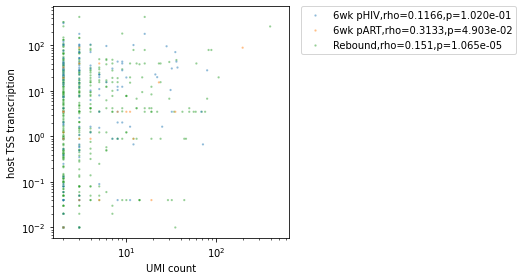

In [481]:
plt.figure(figsize=(7.5,4))
tdata = combineIS[combineIS['host TSS distance']!=-1]
tdata = tdata[tdata['UMI count']>1]
ax = sns.scatterplot(x=tdata['UMI count'],y=tdata['host TSS transcription'],hue=tdata['Timepoint'],s=5,alpha=0.5,hue_order=timelist)
plt.yscale('log')
plt.xscale('log')
plt.ylabel('host TSS transcription')
plt.xlabel('UMI count')
handles, labels = ax.get_legend_handles_labels()
labels = []
for time in timelist:
    ttdata = tdata[tdata['Timepoint']==time]
    rho,p = ss.spearmanr(ttdata['UMI count'],ttdata['host TSS transcription'])
    labels.append(time+',rho='+str(round(rho,4))+',p={:.3e}'.format(p))
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) 
plt.tight_layout()
plt.savefig('figures/expansion_to_TSS_transcription_by_time.png',dpi=300)

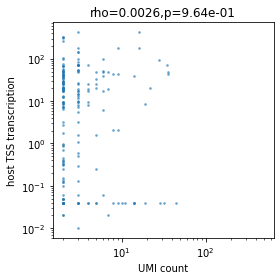

In [482]:
plt.figure(figsize=(4,4))
tdata = combineIS[combineIS['host TSS distance']!=-1]
tdata = tdata[(tdata['UMI count']>1)&(abs(tdata['host TSS distance'])<1e4)]
plt.scatter(tdata['UMI count'],tdata['host TSS transcription'],s=3,alpha=0.5)
rho,p = ss.spearmanr(tdata['UMI count'],tdata['host TSS transcription'])
plt.yscale('log')
plt.xscale('log')
plt.ylabel('host TSS transcription')
plt.xlabel('UMI count')
plt.title('rho='+str(round(rho,4))+',p={:.2e}'.format(p))
plt.tight_layout()
plt.savefig('figures/expansion_to_TSS_transcription_proximity_10k.png',dpi=300)

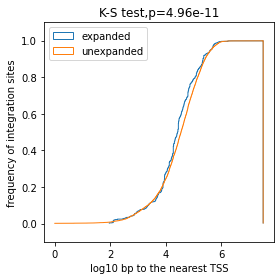

In [483]:
tdata = combineIS[combineIS['host TSS distance']!=-1]
t1data = tdata[tdata['clonal expanded']]
t2data = tdata[~tdata['clonal expanded']]
plt.figure(figsize=(4,4))
n1 = list(np.log10(abs(t1data['host TSS distance']+1)))+[np.log10(max(abs(tdata['host TSS distance'])))]
n2 = list(np.log10(abs(t2data['host TSS distance']+1)))+[np.log10(max(abs(tdata['host TSS distance'])))]
plt.hist(n1,label='expanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
plt.hist(n2,label='unexpanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
D,p = ss.kstest(n1,n2)
plt.title('K-S test,p={:.02e}'.format(p))
plt.xlabel('log10 bp to the nearest TSS')
plt.ylabel('frequency of integration sites')
plt.legend(loc='upper left')
plt.ylim(-0.1,1.1)
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_TSS_CDF.png',dpi=300)

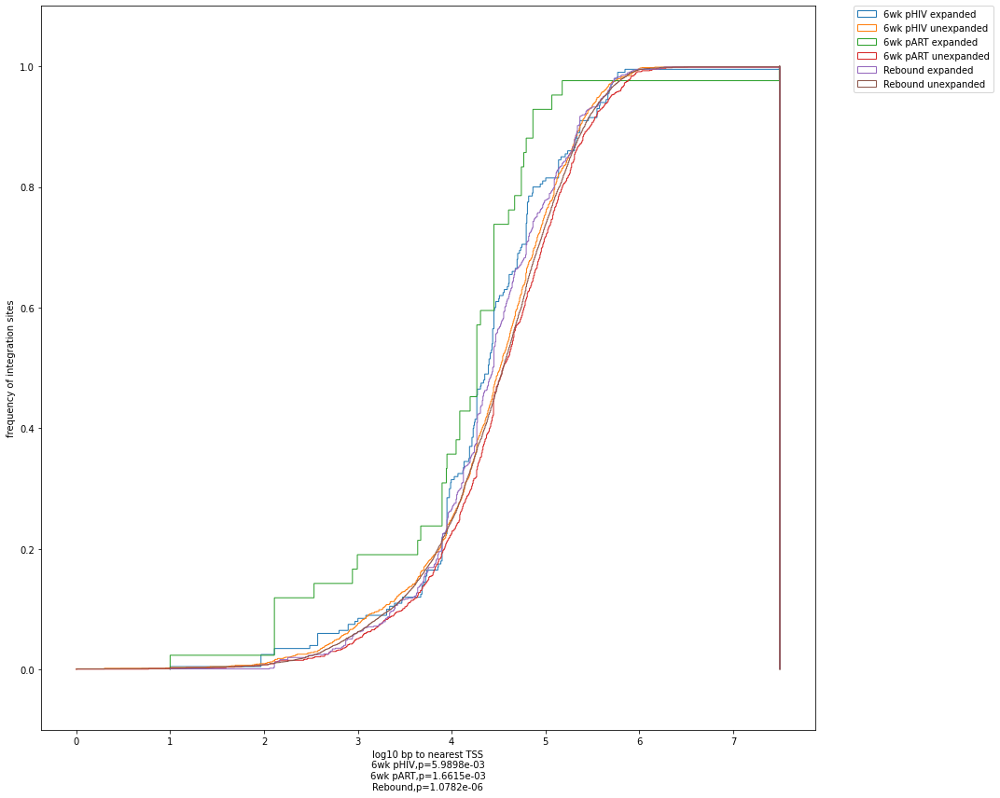

In [484]:
plt.figure(figsize=(15,12))
labels = ''
for time in timelist:
    tdata = combineIS[(combineIS['host TSS distance']!=-1)&(combineIS['Timepoint']==time)]
    t1data = tdata[tdata['clonal expanded']]
    t2data = tdata[~tdata['clonal expanded']]
    n1 = list(np.log10(abs(t1data['host TSS distance']+1)))+[np.log10(max(abs(combineIS['host TSS distance']))),1]
    n2 = list(np.log10(abs(t2data['host TSS distance']+1)))+[np.log10(max(abs(combineIS['host TSS distance']))),1]
    plt.hist(n1,label=time+' expanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
    plt.hist(n2,label=time+' unexpanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
    D,p = ss.kstest(n1,n2)
    labels += ('\n'+time+',p={:.4e}'.format(p))
plt.xlabel('log10 bp to nearest TSS'+labels)
plt.ylabel('frequency of integration sites')
ax = plt.gca()
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.ylim(-0.1,1.1)
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_TSS_CDF_by_time.png',dpi=300)

In [485]:
#Repbase
repdata = pd.read_csv('../../database/genome_annotation/hg38_repeats.tsv',sep='\t')
repdict = {}
for i,r in repdata.iterrows():
    rname = r['repName']
    rclass = r['repClass']
    if rname not in repdict:
        repdict[rname] = rclass

    Short interspersed nuclear elements (SINE), which include ALUs
    Long interspersed nuclear elements (LINE)
    Long terminal repeat elements (LTR), which include retroposons
    DNA repeat elements (DNA)
    Simple repeats (micro-satellites)
    Low complexity repeats
    Satellite repeats
    RNA repeats (including RNA, tRNA, rRNA, snRNA, scRNA, srpRNA)
    Other repeats, which includes class RC (Rolling Circle)
    Unknown

In [486]:
replist = ['DNA','LINE','LTR','SINE','Satellite','Simple_repeat','Low_complexity','RNA','Unknown']

In [487]:
def find_class(x):
    rclass = repdict[x]
    if rclass in replist:
        return rclass
    if rclass == 'Retroposon':
        return 'LTR'
    if 'RNA' in rclass:
        return 'RNA'
    return 'Unknown'

repdata = pd.read_csv('../../database/genome_annotation/hg38_repeats.bed',sep='\t',names=['chr','start','end','name','score','strand'])
repdata['row number'] = repdata.index
repdata['chrom'] = repdata['chr'].apply(lambda x:x[3:])
repdata = repdata[repdata['chrom'].isin(chromsizedict.keys())]
repdata['rep class'] = repdata['name'].apply(lambda x:find_class(x))
repdata[['chrom','start','end','name','row number','strand']].to_csv('bed/repmask.bed',index=False,header=False,sep='\t')
!bedtools sort -i bed/repmask.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/repmask.sorted.bed
!bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/repmask.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_rep.bed

In [488]:
def annotate_rep(x):
    tdata = interdata[interdata['row number']==x.name]
    if tdata['rep row'].iloc[0] == -1:
        x['repeat element'] = np.nan
        x['distance to repeat region'] = np.nan
        x['repeat direction'] = np.nan
    else:
        x['repeat element'] = tdata['rep name'].iloc[0]
        x['distance to repeat region'] = tdata['distance'].iloc[0]
        x['repeat direction'] = tdata['strand2'].iloc[0]
    return x

interdata = pd.read_csv('bed/IS_combined_distance_to_rep.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','rep name','rep row','strand2','distance'])
combineIS = combineIS.apply(annotate_rep,axis=1)

In [489]:
combineIS['repeat class'] = combineIS['repeat element'].apply(lambda x:find_class(x))

In [490]:
def annotate_rep(x):
    tdata = interdata[interdata['row number']==x.name+1]
    if tdata['rep row'].iloc[0] == -1:
        x['repeat element'] = np.nan
        x['distance to repeat region'] = np.nan
        x['repeat direction'] = np.nan
    else:
        x['repeat element'] = tdata['rep name'].iloc[0]
        x['distance to repeat region'] = tdata['distance'].iloc[0]
        x['repeat direction'] = tdata['strand2'].iloc[0]
    return x

!bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/repmask.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_rep.bed
interdata = pd.read_csv('bed/random_site_distance_to_rep.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','rep name','rep row','strand2','distance'])
randomsite = randomsite.apply(annotate_rep,axis=1)

In [491]:
randomsite['repeat class'] = randomsite['repeat element'].apply(lambda x:find_class(x))

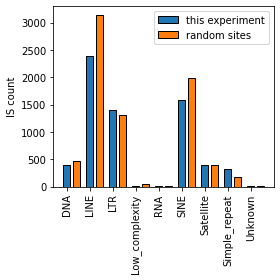

In [492]:
plt.figure(figsize=(4,4))
tdata = combineIS[combineIS['distance to repeat region']==0]
plt.bar(height=tdata.groupby('repeat class').size(),x=tdata.groupby('repeat class').size().index,width=0.3,label='this experiment',edgecolor='black')
tdata = randomsite[randomsite['distance to repeat region']==0]
plt.bar(height=tdata.groupby('repeat class').size(),x=[x+0.4 for x in range(9)],width=0.3,label='random sites',edgecolor='black')
plt.xticks(rotation=90)
plt.legend()
plt.ylabel('IS count')
plt.tight_layout()
plt.savefig('figures/IS_count_close_to_rep.png',dpi=300)

In [493]:
def repeat_class(x):
    if x['distance to repeat region'] != 0:
        return 'non-repeat'
    else:
        return x['repeat class']

combineIS['within repeat class'] = combineIS.apply(lambda x:repeat_class(x),axis=1)

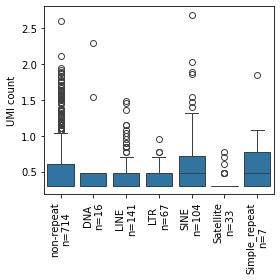

In [494]:
tdata = combineIS[(combineIS['UMI count']>1)&(~combineIS['within repeat class'].isin(['RNA','Unknown']))]
treplist = ['non-repeat']+replist[:-3]
plt.figure(figsize=(4,4))
sns.boxplot(x=tdata['within repeat class'],y=np.log10(tdata['UMI count']),order=treplist)
labels = []
for rep in treplist:
    labels.append(rep+'\nn='+str(len(tdata[tdata['within repeat class']==rep])))
plt.xticks(range(len(labels)),labels,rotation=90)
plt.xlabel('')
plt.tight_layout()
plt.savefig('figures/IS_rep_expansion.png',dpi=300)

In [495]:
for rep in replist:
    tdata = repdata[repdata['rep class']==rep]
    tdata[['chrom','start','end','name','row number','strand']].to_csv('bed/repmask_'+rep+'.bed',index=False,header=False,sep='\t')
    !bedtools sort -i bed/repmask_{rep}.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/repmask_{rep}.sorted.bed

this maybe too inconfident because there is only 1 barcode that has expanding clone but all of them out of gene region.

In [496]:
#correlation summary heatmap
#rows: in gene, same direction with gene, cancer related gene, regulators(5), histone(5)
#columns: integration, clonal expansion, transcription
statsdict = {}; pdict = {}
responselist = ['integration','expansion','transcription']
featurelist = ['in gene']+regulist+histonelist+replist[:-3]
for feature in featurelist:
    statsdict[feature] = {}
    pdict[feature] = {}
    if feature == 'in gene':
        testkey = 'distance to gene'
        bed_appendix = 'gene'
    elif feature in regulist:
        testkey = 'distance to '+feature
        bed_appendix = feature.replace(' ','_')
    elif feature in histonelist:
        testkey = 'distance to '+feature
        bed_appendix = feature
    elif feature in replist:
        testkey = 'distance to repeats '+feature
        bed_appendix = feature
    for response in responselist:
        if response == 'integration': #compare with random 
            if feature == 'in gene':
                !bedtools closest -D a -a bed/random_sites_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_gene.bed
                !bedtools closest -D a -a bed/IS_combined_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_gene.bed               
                randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
                testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])    
            if feature in regulist:
                !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/regu_{feature}.gff3.sort -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
                !bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/regu_{feature}.gff3.sort -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_{bed_appendix}.bed               
                randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','rtype','start','end','name','score','_space','strand2','distance'])
                testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','rtype','start','end','name','score','_space','strand2','distance'])    
            if feature in histonelist:
                !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/Tcell_{feature}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
                !bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/Tcell_{feature}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_{bed_appendix}.bed               
                randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
                testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])    
            if feature in replist:
                !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/repmask_{feature}.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
                !bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/repmask_{feature}.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_{bed_appendix}.bed               
                randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
                testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])      
            randomsite[testkey] = randomsite.index.map(lambda x:randomdata[randomdata['row number']==x+1]['distance'].iloc[0])
            combineIS[testkey] = combineIS.index.map(lambda x:testdata[testdata['row number']==x]['distance'].iloc[0])
            len1 = len(combineIS[combineIS[testkey] == 0])
            len2 = len(combineIS)
            len3 = len(randomsite[randomsite[testkey] == 0])
            len4 = len(randomsite)
        elif response == 'expansion':
            len1 = len(combineIS[(combineIS[testkey] == 0)&(combineIS['UMI count']>1)])
            len2 = len(combineIS[(combineIS['UMI count']>1)])
            len3 = len(combineIS[(combineIS[testkey] == 0)&(combineIS['UMI count']==1)])
            len4 = len(combineIS[(combineIS['UMI count']==1)])
        elif response == 'transcription':
            tdata = combineIS[combineIS['Timepoint']!='6wk pART']
            len1 = len(tdata[(tdata[testkey] == 0)&(tdata['transcription']>0)])
            len2 = len(tdata[(tdata['transcription']>0)])
            len3 = len(tdata[(tdata[testkey] == 0)&(tdata['transcription']==0)])
            len4 = len(tdata[(tdata['transcription']==0)])
        res = ss.contingency.relative_risk(len1,len2,len3,len4)
        odds,p = ss.fisher_exact([[len1,len2-len1],[len3,len4-len3]])
        statsdict[feature][response] = (res.relative_risk,res.confidence_interval(confidence_level=0.95))
        pdict[feature][response] = p

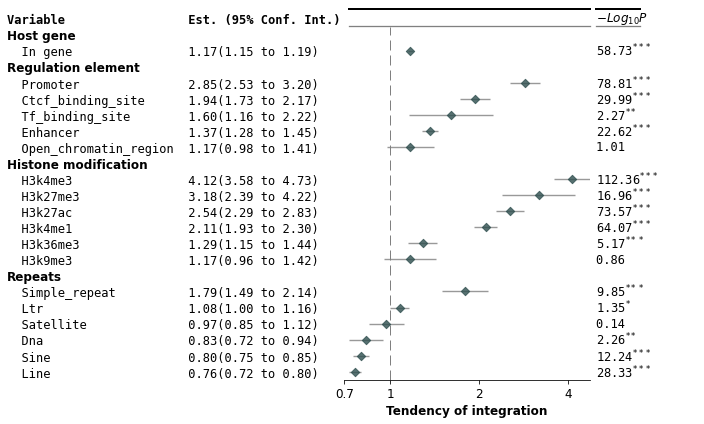

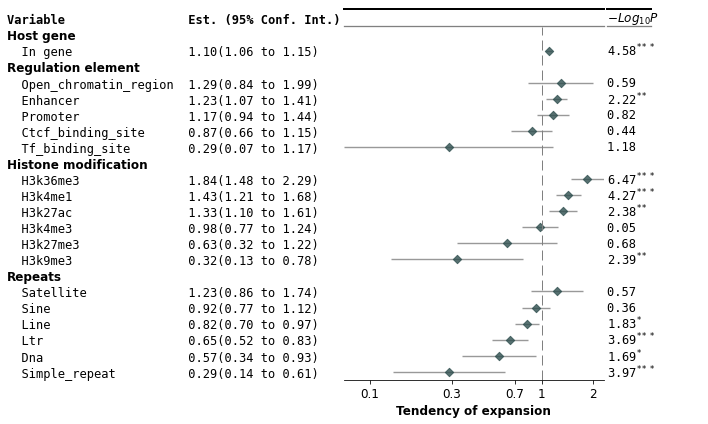

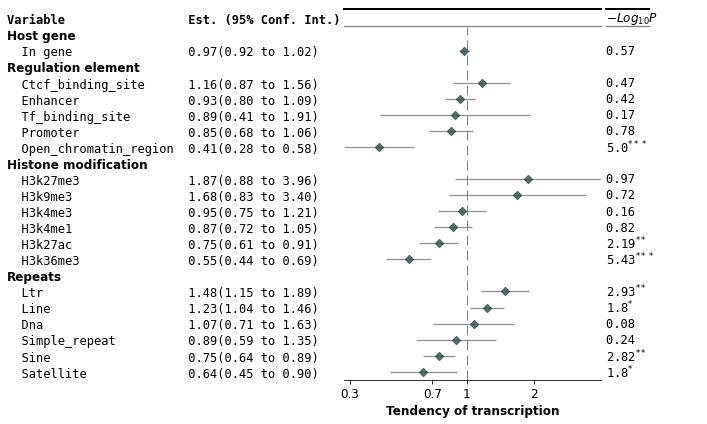

In [497]:


def format_ci(x):
    return str(x['r'])+'('+str(x['ll'])+' to '+str(x['hl'])+')'
def format_p(p):
    p = -np.log10(p)
    if p > 3: return str(round(p,2))+r'$^{***}$'
    if p > 2: return str(round(p,2))+r'$^{**}$'
    if p > -np.log10(0.05): return str(round(p,2))+r'$^{*}$'
    return str(round(p,2))

for response in statsdict[feature]:
    varlist = []; ll = []; hl = []; rlist = []; plist = []; grouplist = []
    for feature in statsdict:
        varlist.append(feature)
        if feature in regulist:
            grouplist.append('regulation element')
        elif feature in histonelist:
            grouplist.append('histone modification')
        elif feature == 'in gene':
            grouplist.append('host gene')
        elif feature in replist:
            grouplist.append('repeats')
        rlist.append(statsdict[feature][response][0])
        ll.append(statsdict[feature][response][1][0])
        hl.append(statsdict[feature][response][1][1])
        plist.append(pdict[feature][response])
    statsdata = pd.DataFrame(zip(varlist,ll,hl,rlist,plist,grouplist),columns=['label','ll','hl','r','p','group'])
    statsdata['est_ci'] = statsdata.apply(lambda x:format_ci(x),axis=1)
    statsdata['formatted_pval'] = statsdata['p'].apply(lambda x:format_p(x))
    statsdata.to_csv('odds_ratio_'+response+'.csv')
    ax = fp.forestplot(statsdata,  # the dataframe with results data
                  figsize=(10,6),
                  estimate="r",  # col containing estimated effect size 
                  ll="ll", hl="hl",  # lower & higher limits of conf. int.
                  varlabel="label",  # column containing the varlabels to be printed on far left
                  capitalize="capitalize",  # Capitalize labels
                  #pval="p",  # column containing p-values to be formatted
                  annote=["est_ci"],  # columns to report on left of plot
                  annoteheaders=["Est. (95% Conf. Int.)"],  # ^corresponding headers
                  rightannote=["formatted_pval" ],  # columns to report on right of plot 
                  right_annoteheaders=["$-Log_{10} P$"],  # ^corresponding headers
                  groupvar="group",  # column containing group labels   
                  group_order=['host gene','regulation element','histone modification','repeats'],
                  xlabel="Tendency of "+response,  # x-label title
                  logscale = True,
                  xticks=[],  # x-ticks to be printed
                  sort=True,  # sort estimates in ascending order
                  table=True,  # Format as a table
                  # Additional kwargs for customizations
                  **{"marker": "D",  # set maker symbol as diamond
                     "markersize": 35,  # adjust marker size
                     "xlinestyle": (0, (10, 5)),  # long dash for x-reference line 
                     "xlinecolor": "#808080",  # gray color for x-reference line
                     "xtick_size": 12,  # adjust x-ticker fontsize
                     "xline":1,
                    }  
                  )
    plt.minorticks_off()
    xlim = plt.xlim()
    if xlim[0] > 0.7:
        xlim = (0.7,xlim[1])
    plt.xticks(ticks=[0.1,0.3,0.7,1,2,4],labels=[0.1,0.3,0.7,1,2,4])
    plt.xlim(xlim)
    plt.tight_layout()
    plt.savefig('figures/forest_'+response+'.png',dpi=300)

In [498]:
ovaluedict = {};pvaluedict = {}
for feature in statsdict:
    if feature in ['CTCF_binding_site','promoter','open_chromatin_region','enhancer','TF_binding_site']:
        continue
    if feature == 'DNA':
        feature_name = 'DNA transposon'
    elif feature == 'Simple_repeat':
        feature_name = 'Micro satellite'
    else:
        feature_name = feature
    ovaluedict[feature_name] = {}
    pvaluedict[feature_name] = {}
    for response in statsdict[feature]:
        ovaluedict[feature_name][response] = statsdict[feature][response][0]
        if pdict[feature][response] < 1e-3: pvaluedict[feature_name][response] = '***'
        elif pdict[feature][response] < 1e-2: pvaluedict[feature_name][response] = '**'
        elif pdict[feature][response] < 0.05: pvaluedict[feature_name][response] = '*'
        else: pvaluedict[feature_name][response] = 'ns'
ovaluedata = pd.DataFrame(ovaluedict).transpose()
pvaluedata = pd.DataFrame(pvaluedict).transpose()

In [499]:
ovaluedata

,integration,expansion,transcription
in gene,1.171701,1.102899,0.971157
H3K27ac,2.541667,1.334347,0.747488
H3K27me3,3.177419,0.628037,1.868170
H3K36me3,1.287823,1.843520,0.550362
H3K4me1,2.105655,1.429108,0.866656
H3K4me3,4.115702,0.976495,0.950847
H3K9me3,1.167598,0.321544,1.680309
DNA transposon,0.826923,0.565779,1.073619
LINE,0.760191,0.823588,1.228793
LTR,1.077217,0.654973,1.477905


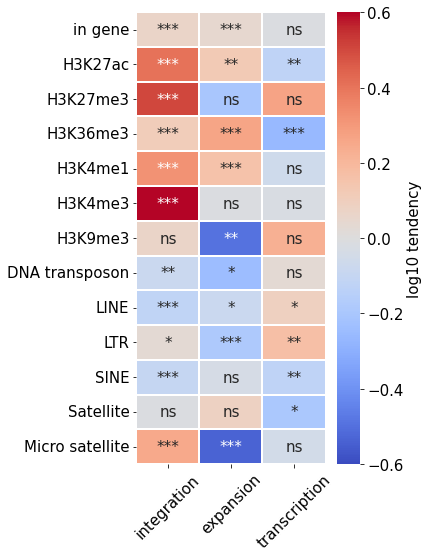

In [500]:
plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(6,8))
sns.heatmap(np.log10(ovaluedata),cmap='coolwarm',vmax=0.6,vmin=-0.6,linecolor='white',lw=2,annot=pvaluedata,cbar_kws={'label':'log10 tendency'},fmt='')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('figures/IS_relative_risk_heatmap.png',dpi=300)
plt.rcParams.update({'font.size': 10})

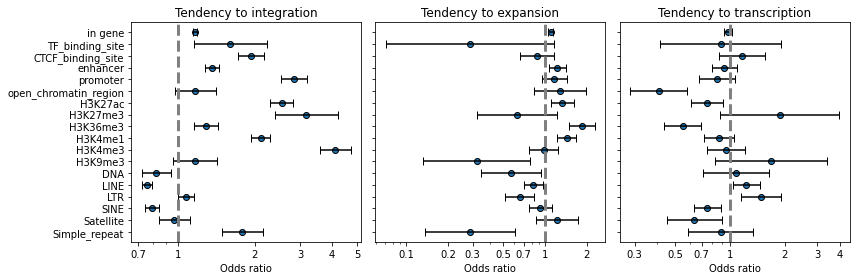

In [501]:
plt.figure(figsize=(12,4))
for ploti,response in enumerate(responselist):
    plt.subplot(1,3,ploti+1)
    ylist = range(len(featurelist))
    xlist = []
    errlist = [[],[]]
    for feature in featurelist:
        xlist.append(statsdict[feature][response][0])
        errlist[0].append(statsdict[feature][response][0]-statsdict[feature][response][1][0])
        errlist[1].append(statsdict[feature][response][1][1]-statsdict[feature][response][0])
    plt.scatter(xlist,ylist[::-1],edgecolor='black')
    plt.errorbar(xlist,ylist[::-1],xerr=errlist,fmt='None',capsize=4,color='black')
    plt.xscale('log')
    if ploti == 0:
        plt.yticks(ticks=ylist,labels=featurelist[::-1])
    else:
        plt.yticks(ticks=ylist,labels=['']*len(ylist))
    xlim = plt.xlim()
    if xlim[0] > 0.7:
        xlim = (0.7,xlim[1])
    ylim = plt.ylim()
    plt.xticks(ticks=[0.1,0.2,0.3,0.5,0.7,1,2,3,4,5],labels=[0.1,0.2,0.3,0.5,0.7,1,2,3,4,5])
    plt.vlines(x=1,ymin=ylim[0],ymax=ylim[1],lw=3,ls='--',color='grey')
    plt.title('Tendency to '+response)
    plt.xlabel('Odds ratio')
    plt.xlim(xlim)
    plt.ylim(ylim)
plt.tight_layout()
plt.savefig('figures/IS_fisher_summary.png',dpi=300)

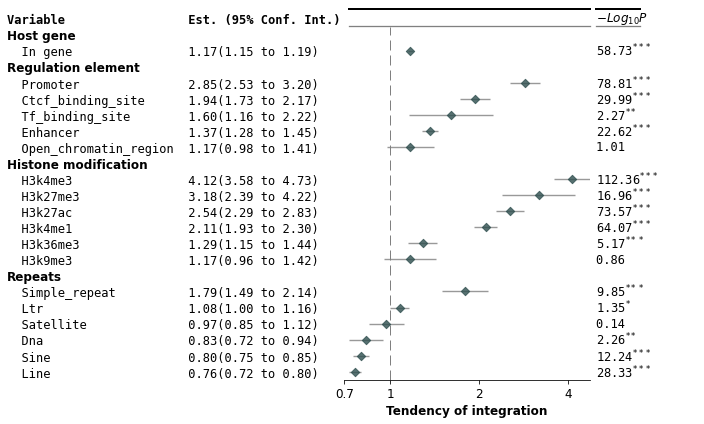

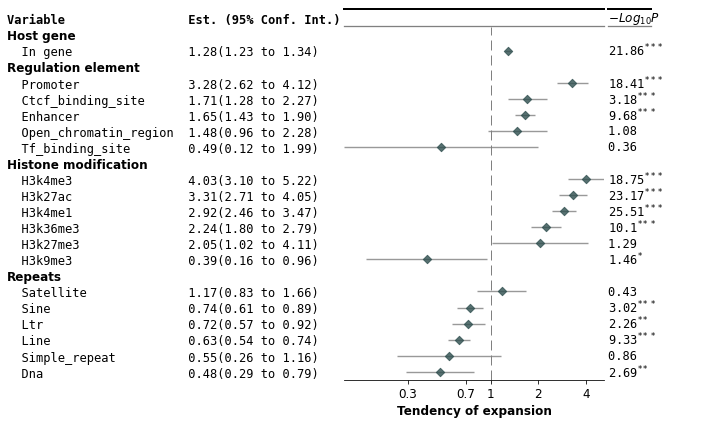

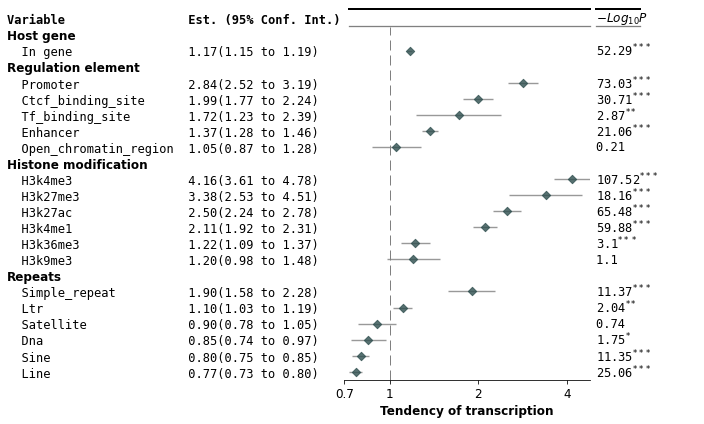

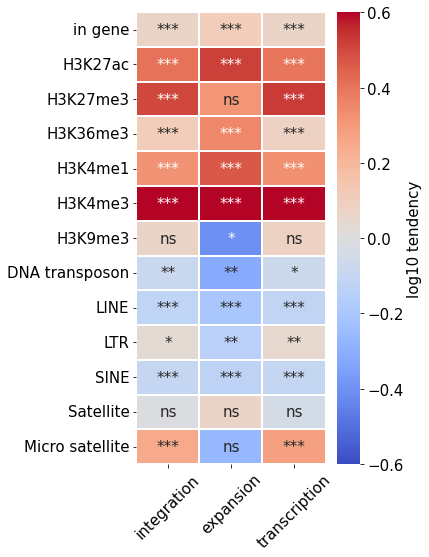

In [502]:
#proliferating (IS) vs random control
#transcribine (IS) vs random control
statsdict = {}; pdict = {}
responselist = ['integration','expansion','transcription']
featurelist = ['in gene']+regulist+histonelist+replist[:-3]

for feature in featurelist:
    statsdict[feature] = {}
    pdict[feature] = {}
    if feature == 'in gene':
        testkey = 'distance to gene'
        bed_appendix = 'gene'
    elif feature in regulist:
        testkey = 'distance to '+feature
        bed_appendix = feature.replace(' ','_')
    elif feature in histonelist:
        testkey = 'distance to '+feature
        bed_appendix = feature
    elif feature in replist:
        testkey = 'distance to repeats '+feature
        bed_appendix = feature
    for response in responselist: 
        if response == 'integration': #compare with random
            tdata = combineIS
        elif response == 'expansion':
            tdata = combineIS[(combineIS['UMI count']>1)]
        elif response == 'transcription':
            tdata = combineIS[(combineIS['transcription']>0)]
        outfile = open('bed/IS_'+response+'.bed','w')
        for i,row in tdata.iterrows():
            if 'chr' in row['Integration site']:
                record = row['Integration site'].rsplit(':')
                outfile.write(record[0][3:]+'\t'+record[1]+'\t'+record[1]+'\t'+str(i)+'\t'+str(row['UMI count'])+'\t'+record[2]+'\n')
        outfile.close()
        !bedtools sort -i bed/IS_{response}.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_{response}_sorted.bed
        if feature == 'in gene':
            !bedtools closest -D a -a bed/random_sites_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_gene.bed
            !bedtools closest -D a -a bed/IS_{response}_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_{response}_distance_to_gene.bed               
            randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
            testdata = pd.read_csv('bed/IS_'+response+'_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])    
        if feature in regulist:
            !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/regu_{feature}.gff3.sort -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
            !bedtools closest -D a -a bed/IS_{response}_sorted.bed -b bed/regu_{feature}.gff3.sort -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_{response}_distance_to_{bed_appendix}.bed               
            randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','rtype','start','end','name','score','_space','strand2','distance'])
            testdata = pd.read_csv('bed/IS_'+response+'_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','rtype','start','end','name','score','_space','strand2','distance'])    
        if feature in histonelist:
            !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/Tcell_{feature}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
            !bedtools closest -D a -a bed/IS_{response}_sorted.bed -b bed/Tcell_{feature}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_{response}_distance_to_{bed_appendix}.bed               
            randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
            testdata = pd.read_csv('bed/IS_'+response+'_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])    
        if feature in replist:
            !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/repmask_{feature}.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
            !bedtools closest -D a -a bed/IS_{response}_sorted.bed -b bed/repmask_{feature}.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_{response}_distance_to_{bed_appendix}.bed               
            randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
            testdata = pd.read_csv('bed/IS_'+response+'_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])      
        randomsite[testkey] = randomsite.index.map(lambda x:randomdata[randomdata['row number']==x+1]['distance'].iloc[0])
        tdata[testkey] = tdata.index.map(lambda x:testdata[testdata['row number']==x]['distance'].iloc[0])
        len1 = len(tdata[tdata[testkey] == 0])
        len2 = len(tdata)
        len3 = len(randomsite[randomsite[testkey] == 0])
        len4 = len(randomsite)
        res = ss.contingency.relative_risk(len1,len2,len3,len4)
        odds,p = ss.fisher_exact([[len1,len2-len1],[len3,len4-len3]])
        statsdict[feature][response] = (res.relative_risk,res.confidence_interval(confidence_level=0.95))
        pdict[feature][response] = p
        
def format_ci(x):
    return str(x['r'])+'('+str(x['ll'])+' to '+str(x['hl'])+')'
def format_p(p):
    p = -np.log10(p)
    if p > 3: return str(round(p,2))+r'$^{***}$'
    if p > 2: return str(round(p,2))+r'$^{**}$'
    if p > -np.log10(0.05): return str(round(p,2))+r'$^{*}$'
    return str(round(p,2))

for response in statsdict[feature]:
    varlist = []; ll = []; hl = []; rlist = []; plist = []; grouplist = []
    for feature in statsdict:
        varlist.append(feature)
        if feature in regulist:
            grouplist.append('regulation element')
        elif feature in histonelist:
            grouplist.append('histone modification')
        elif feature == 'in gene':
            grouplist.append('host gene')
        elif feature in replist:
            grouplist.append('repeats')
        rlist.append(statsdict[feature][response][0])
        ll.append(statsdict[feature][response][1][0])
        hl.append(statsdict[feature][response][1][1])
        plist.append(pdict[feature][response])
    statsdata = pd.DataFrame(zip(varlist,ll,hl,rlist,plist,grouplist),columns=['label','ll','hl','r','p','group'])
    statsdata['est_ci'] = statsdata.apply(lambda x:format_ci(x),axis=1)
    statsdata['formatted_pval'] = statsdata['p'].apply(lambda x:format_p(x))
    statsdata.to_csv('odds_ratio_'+response+'.csv')
    ax = fp.forestplot(statsdata,  # the dataframe with results data
                  figsize=(10,6),
                  estimate="r",  # col containing estimated effect size 
                  ll="ll", hl="hl",  # lower & higher limits of conf. int.
                  varlabel="label",  # column containing the varlabels to be printed on far left
                  capitalize="capitalize",  # Capitalize labels
                  #pval="p",  # column containing p-values to be formatted
                  annote=["est_ci"],  # columns to report on left of plot
                  annoteheaders=["Est. (95% Conf. Int.)"],  # ^corresponding headers
                  rightannote=["formatted_pval" ],  # columns to report on right of plot 
                  right_annoteheaders=["$-Log_{10} P$"],  # ^corresponding headers
                  groupvar="group",  # column containing group labels   
                  group_order=['host gene','regulation element','histone modification','repeats'],
                  xlabel="Tendency of "+response,  # x-label title
                  logscale = True,
                  xticks=[],  # x-ticks to be printed
                  sort=True,  # sort estimates in ascending order
                  table=True,  # Format as a table
                  # Additional kwargs for customizations
                  **{"marker": "D",  # set maker symbol as diamond
                     "markersize": 35,  # adjust marker size
                     "xlinestyle": (0, (10, 5)),  # long dash for x-reference line 
                     "xlinecolor": "#808080",  # gray color for x-reference line
                     "xtick_size": 12,  # adjust x-ticker fontsize
                     "xline":1,
                    }  
                  )
    plt.minorticks_off()
    xlim = plt.xlim()
    if xlim[0] > 0.7:
        xlim = (0.7,xlim[1])
    plt.xticks(ticks=[0.1,0.3,0.7,1,2,4],labels=[0.1,0.3,0.7,1,2,4])
    plt.xlim(xlim)
    plt.tight_layout()
    plt.savefig('figures/forest_to_random_'+response+'.png',dpi=300)
    
ovaluedict = {};pvaluedict = {}
for feature in statsdict:
    if feature in ['CTCF_binding_site','promoter','open_chromatin_region','enhancer','TF_binding_site']:
        continue
    if feature == 'DNA':
        feature_name = 'DNA transposon'
    elif feature == 'Simple_repeat':
        feature_name = 'Micro satellite'
    else:
        feature_name = feature
    ovaluedict[feature_name] = {}
    pvaluedict[feature_name] = {}
    for response in statsdict[feature]:
        ovaluedict[feature_name][response] = statsdict[feature][response][0]
        if pdict[feature][response] < 1e-3: pvaluedict[feature_name][response] = '***'
        elif pdict[feature][response] < 1e-2: pvaluedict[feature_name][response] = '**'
        elif pdict[feature][response] < 0.05: pvaluedict[feature_name][response] = '*'
        else: pvaluedict[feature_name][response] = 'ns'
ovaluedata = pd.DataFrame(ovaluedict).transpose()
pvaluedata = pd.DataFrame(pvaluedict).transpose()

plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(6,8))
sns.heatmap(np.log10(ovaluedata),cmap='coolwarm',vmax=0.6,vmin=-0.6,linecolor='white',lw=2,annot=pvaluedata,cbar_kws={'label':'log10 tendency'},fmt='')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('figures/IS_relative_risk_to_random_heatmap.png',dpi=300)
plt.rcParams.update({'font.size': 10})

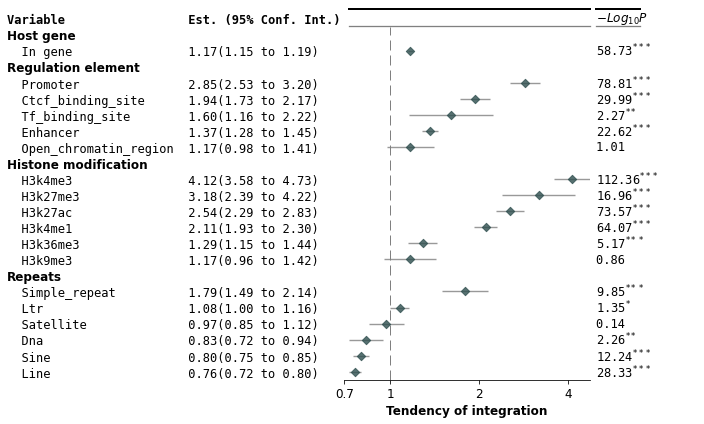

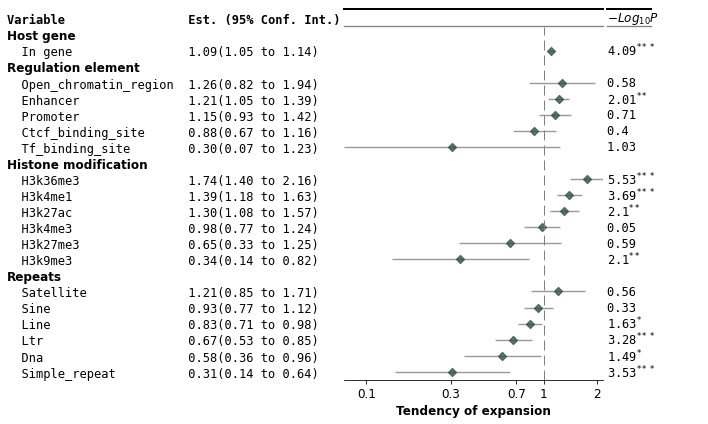

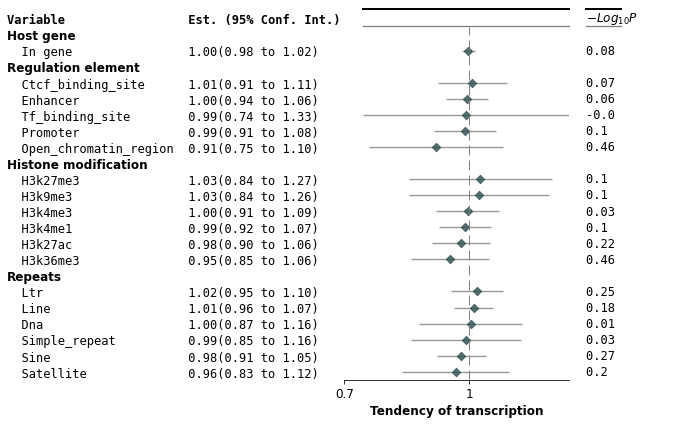

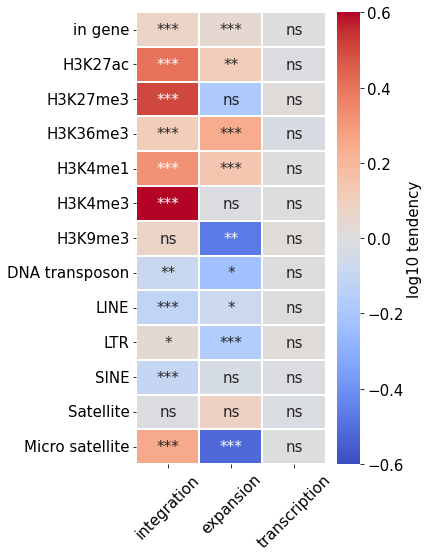

In [503]:
#proliferating vs all provirus
#transcribing vs all provirus
statsdict = {}; pdict = {}
responselist = ['integration','expansion','transcription']
featurelist = ['in gene']+regulist+histonelist+replist[:-3]
for feature in featurelist:
    statsdict[feature] = {}
    pdict[feature] = {}
    if feature == 'in gene':
        testkey = 'distance to gene'
        bed_appendix = 'gene'
    elif feature in regulist:
        testkey = 'distance to '+feature
        bed_appendix = feature.replace(' ','_')
    elif feature in histonelist:
        testkey = 'distance to '+feature
        bed_appendix = feature
    elif feature in replist:
        testkey = 'distance to repeats '+feature
        bed_appendix = feature
    for response in responselist:
        if response == 'integration': #compare with random 
            if feature == 'in gene':
                !bedtools closest -D a -a bed/random_sites_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_gene.bed
                !bedtools closest -D a -a bed/IS_combined_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_gene.bed               
                randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
                testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])    
            if feature in regulist:
                !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/regu_{feature}.gff3.sort -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
                !bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/regu_{feature}.gff3.sort -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_{bed_appendix}.bed               
                randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','rtype','start','end','name','score','_space','strand2','distance'])
                testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','rtype','start','end','name','score','_space','strand2','distance'])    
            if feature in histonelist:
                !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/Tcell_{feature}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
                !bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/Tcell_{feature}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_{bed_appendix}.bed               
                randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
                testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])    
            if feature in replist:
                !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/repmask_{feature}.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
                !bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/repmask_{feature}.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_{bed_appendix}.bed               
                randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
                testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])      
            randomsite[testkey] = randomsite.index.map(lambda x:randomdata[randomdata['row number']==x+1]['distance'].iloc[0])
            combineIS[testkey] = combineIS.index.map(lambda x:testdata[testdata['row number']==x]['distance'].iloc[0])
            len1 = len(combineIS[combineIS[testkey] == 0])
            len2 = len(combineIS)
            len3 = len(randomsite[randomsite[testkey] == 0])
            len4 = len(randomsite)
        elif response == 'expansion':
            len1 = len(combineIS[(combineIS[testkey] == 0)&(combineIS['UMI count']>1)])
            len2 = len(combineIS[(combineIS['UMI count']>1)])
            len3 = len(combineIS[(combineIS[testkey] == 0)])
            len4 = len(combineIS)
        elif response == 'transcription':
            tdata = combineIS[combineIS['Timepoint']!='6wk pART']
            len1 = len(tdata[(tdata[testkey] == 0)&(tdata['transcription']>0)])
            len2 = len(tdata[(tdata['transcription']>0)])
            len3 = len(tdata[(tdata[testkey] == 0)])
            len4 = len(tdata)
        res = ss.contingency.relative_risk(len1,len2,len3,len4)
        odds,p = ss.fisher_exact([[len1,len2-len1],[len3,len4-len3]])
        statsdict[feature][response] = (res.relative_risk,res.confidence_interval(confidence_level=0.95))
        pdict[feature][response] = p
        

def format_ci(x):
    return str(x['r'])+'('+str(x['ll'])+' to '+str(x['hl'])+')'
def format_p(p):
    p = -np.log10(p)
    if p > 3: return str(round(p,2))+r'$^{***}$'
    if p > 2: return str(round(p,2))+r'$^{**}$'
    if p > -np.log10(0.05): return str(round(p,2))+r'$^{*}$'
    return str(round(p,2))

for response in statsdict[feature]:
    varlist = []; ll = []; hl = []; rlist = []; plist = []; grouplist = []
    for feature in statsdict:
        varlist.append(feature)
        if feature in regulist:
            grouplist.append('regulation element')
        elif feature in histonelist:
            grouplist.append('histone modification')
        elif feature == 'in gene':
            grouplist.append('host gene')
        elif feature in replist:
            grouplist.append('repeats')
        rlist.append(statsdict[feature][response][0])
        ll.append(statsdict[feature][response][1][0])
        hl.append(statsdict[feature][response][1][1])
        plist.append(pdict[feature][response])
    statsdata = pd.DataFrame(zip(varlist,ll,hl,rlist,plist,grouplist),columns=['label','ll','hl','r','p','group'])
    statsdata['est_ci'] = statsdata.apply(lambda x:format_ci(x),axis=1)
    statsdata['formatted_pval'] = statsdata['p'].apply(lambda x:format_p(x))
    statsdata.to_csv('odds_ratio_'+response+'.csv')
    ax = fp.forestplot(statsdata,  # the dataframe with results data
                  figsize=(10,6),
                  estimate="r",  # col containing estimated effect size 
                  ll="ll", hl="hl",  # lower & higher limits of conf. int.
                  varlabel="label",  # column containing the varlabels to be printed on far left
                  capitalize="capitalize",  # Capitalize labels
                  #pval="p",  # column containing p-values to be formatted
                  annote=["est_ci"],  # columns to report on left of plot
                  annoteheaders=["Est. (95% Conf. Int.)"],  # ^corresponding headers
                  rightannote=["formatted_pval" ],  # columns to report on right of plot 
                  right_annoteheaders=["$-Log_{10} P$"],  # ^corresponding headers
                  groupvar="group",  # column containing group labels   
                  group_order=['host gene','regulation element','histone modification','repeats'],
                  xlabel="Tendency of "+response,  # x-label title
                  logscale = True,
                  xticks=[],  # x-ticks to be printed
                  sort=True,  # sort estimates in ascending order
                  table=True,  # Format as a table
                  # Additional kwargs for customizations
                  **{"marker": "D",  # set maker symbol as diamond
                     "markersize": 35,  # adjust marker size
                     "xlinestyle": (0, (10, 5)),  # long dash for x-reference line 
                     "xlinecolor": "#808080",  # gray color for x-reference line
                     "xtick_size": 12,  # adjust x-ticker fontsize
                     "xline":1,
                    }  
                  )
    plt.minorticks_off()
    xlim = plt.xlim()
    if xlim[0] > 0.7:
        xlim = (0.7,xlim[1])
    plt.xticks(ticks=[0.1,0.3,0.7,1,2,4],labels=[0.1,0.3,0.7,1,2,4])
    plt.xlim(xlim)
    plt.tight_layout()
    plt.savefig('figures/forest_to_allsites_'+response+'.png',dpi=300)
    
ovaluedict = {};pvaluedict = {}
for feature in statsdict:
    if feature in ['CTCF_binding_site','promoter','open_chromatin_region','enhancer','TF_binding_site']:
        continue
    if feature == 'DNA':
        feature_name = 'DNA transposon'
    elif feature == 'Simple_repeat':
        feature_name = 'Micro satellite'
    else:
        feature_name = feature
    ovaluedict[feature_name] = {}
    pvaluedict[feature_name] = {}
    for response in statsdict[feature]:
        ovaluedict[feature_name][response] = statsdict[feature][response][0]
        if pdict[feature][response] < 1e-3: pvaluedict[feature_name][response] = '***'
        elif pdict[feature][response] < 1e-2: pvaluedict[feature_name][response] = '**'
        elif pdict[feature][response] < 0.05: pvaluedict[feature_name][response] = '*'
        else: pvaluedict[feature_name][response] = 'ns'
ovaluedata = pd.DataFrame(ovaluedict).transpose()
pvaluedata = pd.DataFrame(pvaluedict).transpose()

plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(6,8))
sns.heatmap(np.log10(ovaluedata),cmap='coolwarm',vmax=0.6,vmin=-0.6,linecolor='white',lw=2,annot=pvaluedata,cbar_kws={'label':'log10 tendency'},fmt='')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('figures/IS_relative_risk_to_allsites_heatmap.png',dpi=300)
plt.rcParams.update({'font.size': 10})

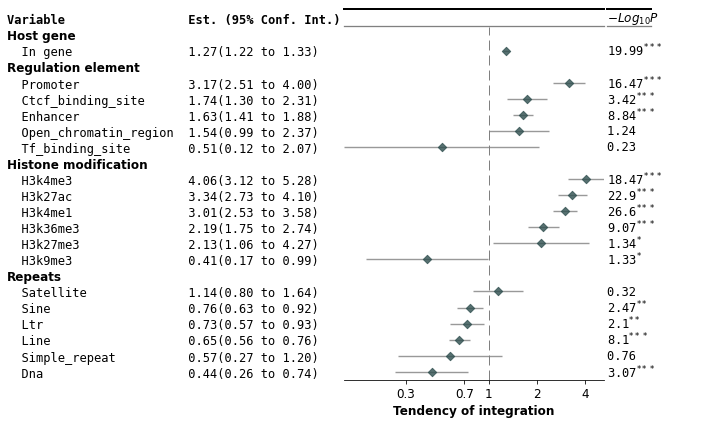

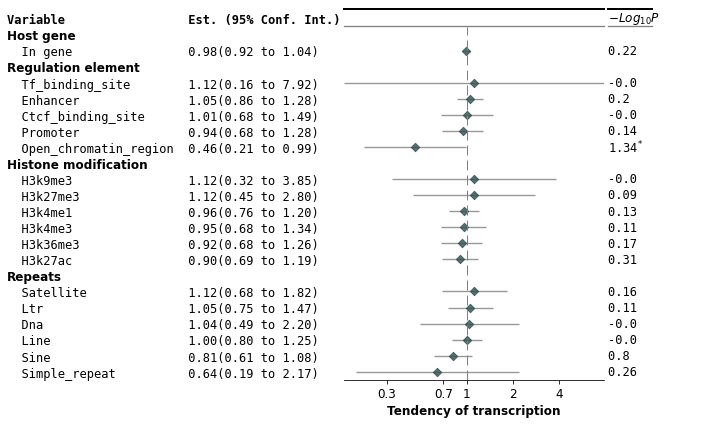

In [504]:
#proliferating active vs proliferating inactive
statsdict = {}; pdict = {}
responselist = ['integration','transcription']
featurelist = ['in gene']+regulist+histonelist+replist[:-3]
for feature in featurelist:
    statsdict[feature] = {}
    pdict[feature] = {}
    if feature == 'in gene':
        testkey = 'distance to gene'
        bed_appendix = 'gene'
    elif feature in regulist:
        testkey = 'distance to '+feature
        bed_appendix = feature.replace(' ','_')
    elif feature in histonelist:
        testkey = 'distance to '+feature
        bed_appendix = feature
    elif feature in replist:
        testkey = 'distance to repeats '+feature
        bed_appendix = feature
    for response in responselist:
        if response == 'integration': #compare with random 
            if feature == 'in gene':
                !bedtools closest -D a -a bed/random_sites_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_gene.bed
                !bedtools closest -D a -a bed/IS_combined_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_gene.bed               
                randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
                testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])    
            if feature in regulist:
                !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/regu_{feature}.gff3.sort -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
                !bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/regu_{feature}.gff3.sort -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_{bed_appendix}.bed               
                randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','rtype','start','end','name','score','_space','strand2','distance'])
                testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','rtype','start','end','name','score','_space','strand2','distance'])    
            if feature in histonelist:
                !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/Tcell_{feature}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
                !bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/Tcell_{feature}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_{bed_appendix}.bed               
                randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
                testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])    
            if feature in replist:
                !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/repmask_{feature}.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
                !bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/repmask_{feature}.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_{bed_appendix}.bed               
                randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
                testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])      
            randomsite[testkey] = randomsite.index.map(lambda x:randomdata[randomdata['row number']==x+1]['distance'].iloc[0])
            combineIS[testkey] = combineIS.index.map(lambda x:testdata[testdata['row number']==x]['distance'].iloc[0])
            tdata = combineIS[(combineIS['Timepoint']!='6wk pART')&(combineIS['UMI count']>1)]
            len1 = len(tdata[tdata[testkey] == 0])
            len2 = len(tdata)
            len3 = len(randomsite[randomsite[testkey] == 0])
            len4 = len(randomsite)
        elif response == 'transcription':
            tdata = combineIS[(combineIS['Timepoint']!='6wk pART')&(combineIS['UMI count']>1)]
            len1 = len(tdata[(tdata[testkey] == 0)&(tdata['transcription']>0)])
            len2 = len(tdata[(tdata['transcription']>0)])
            len3 = len(tdata[(tdata[testkey] == 0)])
            len4 = len(tdata)
        res = ss.contingency.relative_risk(len1,len2,len3,len4)
        odds,p = ss.fisher_exact([[len1,len2-len1],[len3,len4-len3]])
        statsdict[feature][response] = (res.relative_risk,res.confidence_interval(confidence_level=0.95))
        pdict[feature][response] = p
        

def format_ci(x):
    return str(x['r'])+'('+str(x['ll'])+' to '+str(x['hl'])+')'
def format_p(p):
    p = -np.log10(p)
    if p > 3: return str(round(p,2))+r'$^{***}$'
    if p > 2: return str(round(p,2))+r'$^{**}$'
    if p > -np.log10(0.05): return str(round(p,2))+r'$^{*}$'
    return str(round(p,2))

for response in statsdict[feature]:
    varlist = []; ll = []; hl = []; rlist = []; plist = []; grouplist = []
    for feature in statsdict:
        varlist.append(feature)
        if feature in regulist:
            grouplist.append('regulation element')
        elif feature in histonelist:
            grouplist.append('histone modification')
        elif feature == 'in gene':
            grouplist.append('host gene')
        elif feature in replist:
            grouplist.append('repeats')
        rlist.append(statsdict[feature][response][0])
        ll.append(statsdict[feature][response][1][0])
        hl.append(statsdict[feature][response][1][1])
        plist.append(pdict[feature][response])
    statsdata = pd.DataFrame(zip(varlist,ll,hl,rlist,plist,grouplist),columns=['label','ll','hl','r','p','group'])
    statsdata['est_ci'] = statsdata.apply(lambda x:format_ci(x),axis=1)
    statsdata['formatted_pval'] = statsdata['p'].apply(lambda x:format_p(x))
    statsdata.to_csv('odds_ratio_'+response+'.csv')
    ax = fp.forestplot(statsdata,  # the dataframe with results data
                  figsize=(10,6),
                  estimate="r",  # col containing estimated effect size 
                  ll="ll", hl="hl",  # lower & higher limits of conf. int.
                  varlabel="label",  # column containing the varlabels to be printed on far left
                  capitalize="capitalize",  # Capitalize labels
                  #pval="p",  # column containing p-values to be formatted
                  annote=["est_ci"],  # columns to report on left of plot
                  annoteheaders=["Est. (95% Conf. Int.)"],  # ^corresponding headers
                  rightannote=["formatted_pval" ],  # columns to report on right of plot 
                  right_annoteheaders=["$-Log_{10} P$"],  # ^corresponding headers
                  groupvar="group",  # column containing group labels   
                  group_order=['host gene','regulation element','histone modification','repeats'],
                  xlabel="Tendency of "+response,  # x-label title
                  logscale = True,
                  xticks=[],  # x-ticks to be printed
                  sort=True,  # sort estimates in ascending order
                  table=True,  # Format as a table
                  # Additional kwargs for customizations
                  **{"marker": "D",  # set maker symbol as diamond
                     "markersize": 35,  # adjust marker size
                     "xlinestyle": (0, (10, 5)),  # long dash for x-reference line 
                     "xlinecolor": "#808080",  # gray color for x-reference line
                     "xtick_size": 12,  # adjust x-ticker fontsize
                     "xline":1,
                    }  
                  )
    plt.minorticks_off()
    xlim = plt.xlim()
    if xlim[0] > 0.7:
        xlim = (0.7,xlim[1])
    plt.xticks(ticks=[0.1,0.3,0.7,1,2,4],labels=[0.1,0.3,0.7,1,2,4])
    plt.xlim(xlim)
    plt.tight_layout()
    plt.savefig('figures/forest_proliferating_active_inactive_'+response+'.png',dpi=300)
    

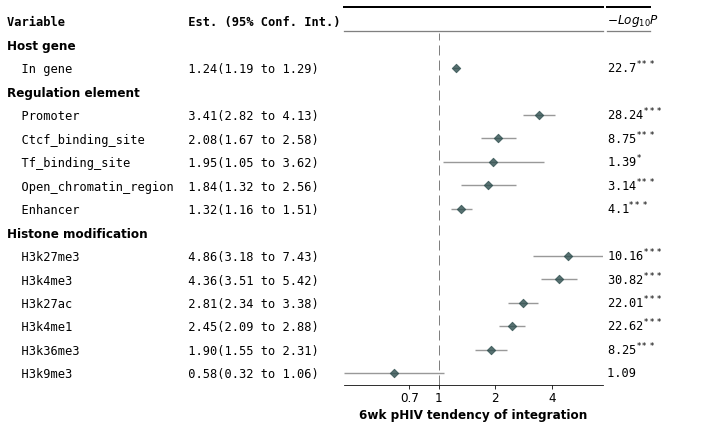

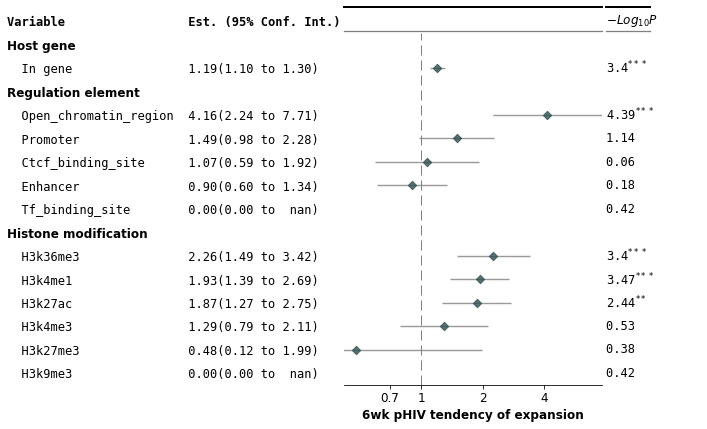

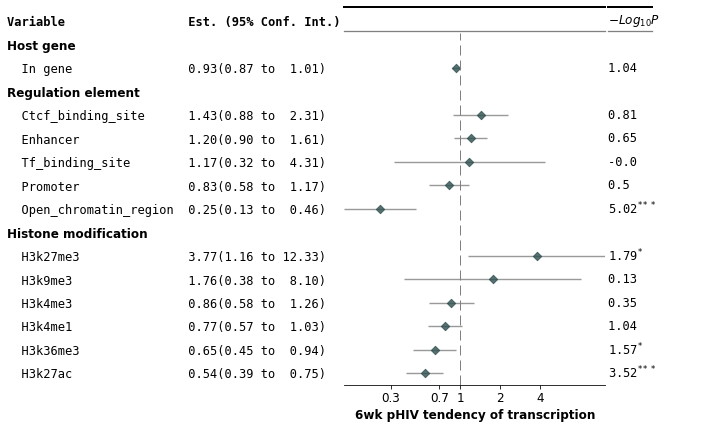

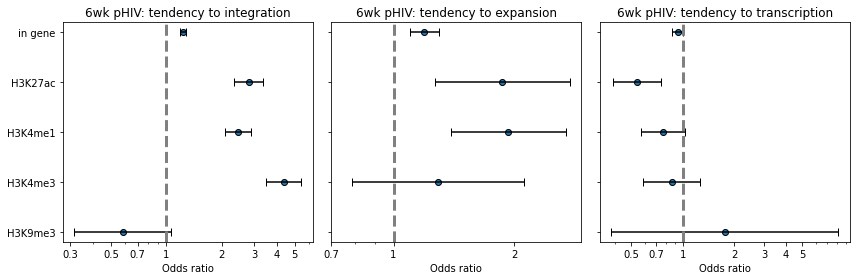

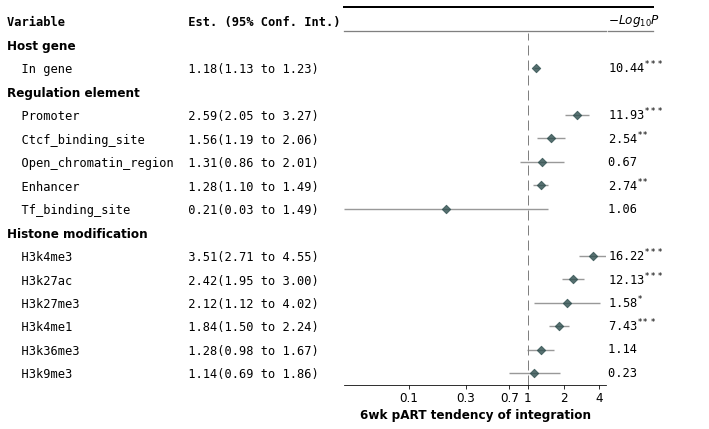

...

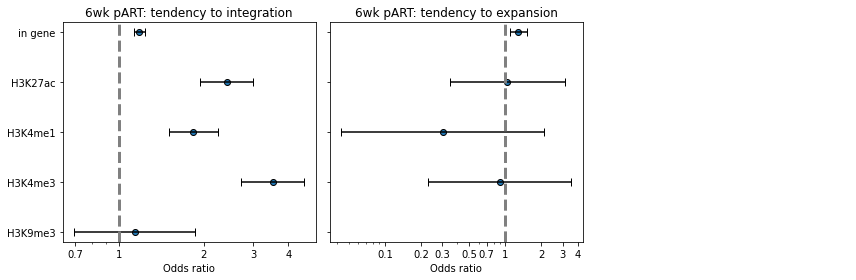

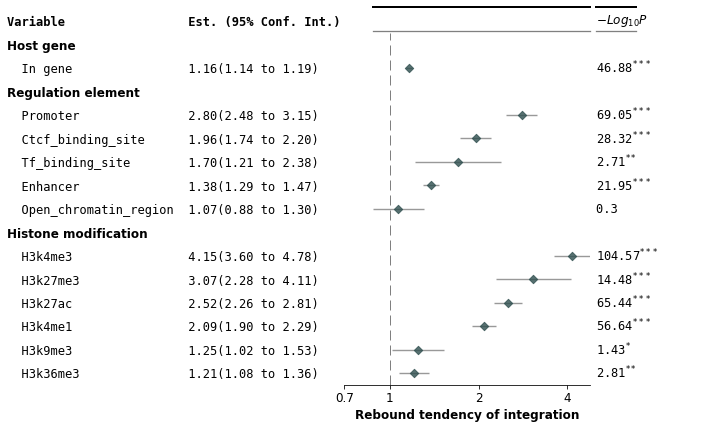

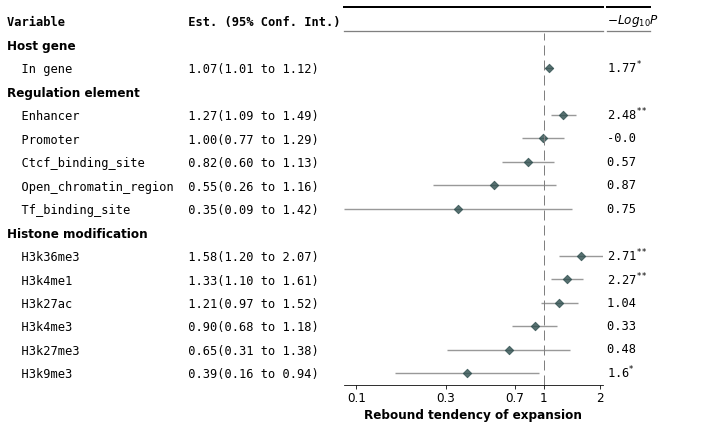

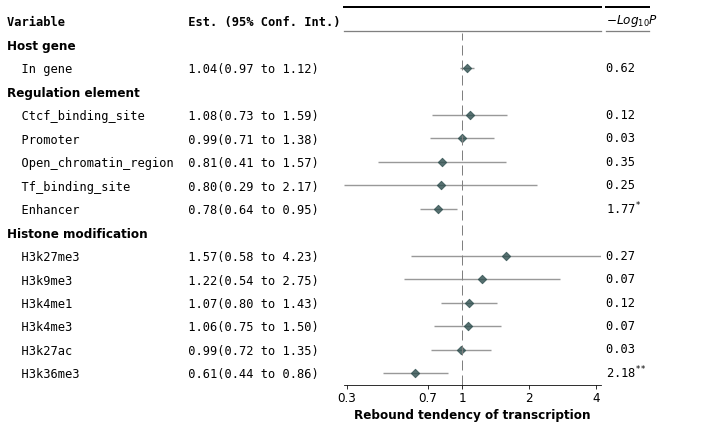

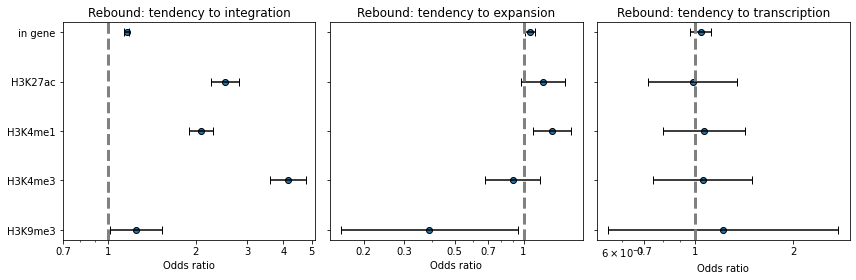

In [505]:
#correlation summary heatmap
#rows: in gene, same direction with gene, cancer related gene, regulators(5), histone(5)
#columns: integration, clonal expansion, transcription
responselist = ['integration','expansion','transcription']
featurelist = ['in gene']+regulist+histonelist
DIST = 0
for time in ['6wk pHIV','6wk pART','Rebound']:
    tdata = combineIS[combineIS['Timepoint']==time]
    statsdict = {}; pdict = {}
    for feature in featurelist:
        statsdict[feature] = {}
        pdict[feature] = {}
        if feature == 'in gene':
            testkey = 'distance to gene'
            bed_appendix = 'gene'
        elif feature in regulist:
            testkey = 'distance to '+feature
            bed_appendix = feature.replace(' ','_')
        elif feature in histonelist:
            testkey = 'distance to '+feature
            bed_appendix = feature
        for response in responselist:
            if response == 'integration': #compare with random 
                if feature == 'in gene':
                    #!bedtools closest -D a -a bed/random_sites_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_gene.bed
                    #!bedtools closest -D a -a bed/IS_combined_sorted.bed -b ../../database/genome_annotation/hg38_Ensembl_genes_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_gene.bed               
                    randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
                    testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])    
                if feature in regulist:
                    #!bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/regu_{feature}.gff3.sort -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
                    #!bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/regu_{feature}.gff3.sort -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_{bed_appendix}.bed               
                    randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','rtype','start','end','name','score','_space','strand2','distance'])
                    testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','source','rtype','start','end','name','score','_space','strand2','distance'])    
                if feature in histonelist:
                    #!bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/Tcell_{feature}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_distance_to_{bed_appendix}.bed
                    #!bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/Tcell_{feature}.sort.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_{bed_appendix}.bed               
                    randomdata = pd.read_csv('bed/random_site_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])
                    testdata = pd.read_csv('bed/IS_combined_distance_to_'+bed_appendix+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])    
                randomsite[testkey] = randomsite.index.map(lambda x:randomdata[randomdata['row number']==x+1]['distance'].iloc[0])
                combineIS[testkey] = combineIS.index.map(lambda x:testdata[testdata['row number']==x]['distance'].iloc[0])
                if feature in histonelist:
                    len1 = len(tdata[(abs(tdata[testkey]) <= DIST)])
                    len3 = len(randomsite[(abs(randomsite[testkey]) <= DIST)])
                else:
                    len1 = len(tdata[tdata[testkey] == 0])
                    len3 = len(randomsite[randomsite[testkey] == 0])
                len2 = len(tdata)   
                len4 = len(randomsite)
            elif response == 'expansion':
                if feature in histonelist:
                    len1 = len(tdata[(abs(tdata[testkey]) <= DIST)&(tdata['UMI count']>1)])
                    len3 = len(tdata[(abs(tdata[testkey]) <= DIST)&(tdata['UMI count']==1)])
                else:
                    len1 = len(tdata[(tdata[testkey] == 0)&(tdata['UMI count']>1)]) 
                    len3 = len(tdata[(tdata[testkey] == 0)&(tdata['UMI count']==1)])
                len2 = len(tdata[(tdata['UMI count']>1)])
                len4 = len(tdata[(tdata['UMI count']==1)])
            elif response == 'transcription':
                if time == '6wk pART': continue
                if feature in histonelist:
                    len1 = len(tdata[(abs(tdata[testkey]) <= DIST)&(tdata['transcription']>0)])
                    len3 = len(tdata[(abs(tdata[testkey]) <= DIST)&(tdata['transcription']==0)])
                else:
                    len1 = len(tdata[(tdata[testkey] == 0)&(tdata['transcription']>0)])
                    len3 = len(tdata[(tdata[testkey] == 0)&(tdata['transcription']==0)])
                len2 = len(tdata[(tdata['transcription']>0)])
                len4 = len(tdata[(tdata['transcription']==0)])
            res = ss.contingency.relative_risk(len1,len2,len3,len4)
            odds,p = ss.fisher_exact([[len1,len2-len1],[len3,len4-len3]])
            statsdict[feature][response] = (res.relative_risk,res.confidence_interval(confidence_level=0.95))
            pdict[feature][response] = p
    for response in statsdict[feature]:
        if response == 'transcription' and time == '6wk pART': continue
        varlist = []; ll = []; hl = []; rlist = []; plist = []; grouplist = []
        for feature in statsdict:
            varlist.append(feature)
            if feature in regulist:
                grouplist.append('regulation element')
            elif feature in histonelist:
                grouplist.append('histone modification')
            elif feature == 'in gene':
                grouplist.append('host gene')
            rlist.append(statsdict[feature][response][0])
            ll.append(statsdict[feature][response][1][0])
            hl.append(statsdict[feature][response][1][1])
            plist.append(pdict[feature][response])
        statsdata = pd.DataFrame(zip(varlist,ll,hl,rlist,plist,grouplist),columns=['label','ll','hl','r','p','group'])
        statsdata['est_ci'] = statsdata.apply(lambda x:format_ci(x),axis=1)
        statsdata['formatted_pval'] = statsdata['p'].apply(lambda x:format_p(x))
        statsdata.to_csv('odds_ratio_'+response+'_'+time+'.csv')
        ax = fp.forestplot(statsdata,  # the dataframe with results data
                      figsize=(10,6),
                      estimate="r",  # col containing estimated effect size 
                      ll="ll", hl="hl",  # lower & higher limits of conf. int.
                      varlabel="label",  # column containing the varlabels to be printed on far left
                      capitalize="capitalize",  # Capitalize labels
                      #pval="p",  # column containing p-values to be formatted
                      annote=["est_ci"],  # columns to report on left of plot
                      annoteheaders=["Est. (95% Conf. Int.)"],  # ^corresponding headers
                      rightannote=["formatted_pval" ],  # columns to report on right of plot 
                      right_annoteheaders=["$-Log_{10} P$"],  # ^corresponding headers
                      groupvar="group",  # column containing group labels   
                      group_order=['host gene','regulation element','histone modification'],
                      xlabel=time+" tendency of "+response,  # x-label title
                      logscale = True,
                      xticks=[],  # x-ticks to be printed
                      sort=True,  # sort estimates in ascending order
                      table=True,  # Format as a table
                      # Additional kwargs for customizations
                      **{"marker": "D",  # set maker symbol as diamond
                         "markersize": 35,  # adjust marker size
                         "xlinestyle": (0, (10, 5)),  # long dash for x-reference line 
                         "xlinecolor": "#808080",  # gray color for x-reference line
                         "xtick_size": 12,  # adjust x-ticker fontsize
                         "xline":1,
                        }  
                      )
        plt.minorticks_off()
        xlim = plt.xlim()
        if xlim[0] > 0.7:
            xlim = (0.7,xlim[1])
        plt.xticks(ticks=[0.1,0.3,0.7,1,2,4],labels=[0.1,0.3,0.7,1,2,4])
        plt.xlim(xlim)
        plt.tight_layout()
        plt.savefig('figures/forest_'+response+'_'+time+'.png',dpi=300)
        
    plt.figure(figsize=(12,4))
    select_features = ['in gene','H3K27ac','H3K4me1','H3K4me3','H3K9me3']
    for ploti,response in enumerate(responselist):
            plt.subplot(1,3,ploti+1)
            ylist = range(len(select_features))
            xlist = []
            errlist = [[],[]]
            if response == 'transcription' and time == '6wk pART':
                plt.axis('off')
                continue
            for feature in select_features:
                xlist.append(statsdict[feature][response][0])
                errlist[0].append(statsdict[feature][response][0]-statsdict[feature][response][1][0])
                errlist[1].append(statsdict[feature][response][1][1]-statsdict[feature][response][0])
            plt.scatter(xlist,ylist[::-1],edgecolor='black')
            plt.errorbar(xlist,ylist[::-1],xerr=errlist,fmt='None',capsize=4,color='black')
            plt.xscale('log')
            if ploti == 0:
                plt.yticks(ticks=ylist,labels=select_features[::-1])
            else:
                plt.yticks(ticks=ylist,labels=['']*len(ylist))
            xlim = plt.xlim()
            if xlim[0] > 0.7:
                xlim = (0.7,xlim[1])
            ylim = plt.ylim()
            plt.xticks(ticks=[0.1,0.2,0.3,0.5,0.7,1,2,3,4,5],labels=[0.1,0.2,0.3,0.5,0.7,1,2,3,4,5])
            plt.vlines(x=1,ymin=ylim[0],ymax=ylim[1],lw=3,ls='--',color='grey')
            plt.title(time+': tendency to '+response)
            plt.xlabel('Odds ratio')
            plt.xlim(xlim)
            plt.ylim(ylim)
    plt.tight_layout()
    plt.savefig('figures/IS_fisher_'+time+'_summary_repositioned.png',dpi=300)

### gene function analysis

In [506]:
outfile = open('ENSG_test_enrichment.tsv','w')
for x in list(set(combineIS[combineIS['UMI count']>1]['ENSG'])):
    if x == x:
        outfile.write(x+'\n')
outfile.close()

upload to gProfiler to do enrichment test

In [507]:
enrichdata = pd.read_csv('ENSG_gprofile.csv')
enrichdata

,source,term_name,term_id,adjusted_p_value,negative_log10_of_adjusted_p_value,term_size,query_size,intersection_size,effective_domain_size,intersections
0,GO:MF,TRAIL binding,GO:0045569,1.327797e-02,1.876868,5,285,3,20166,"ENSG00000173530,ENSG00000173535,ENSG00000120889"
1,GO:MF,protein binding,GO:0005515,3.601767e-02,1.443484,14832,285,237,20166,"ENSG00000102466,ENSG00000155897,ENSG0000009920..."
2,GO:BP,developmental process,GO:0032502,6.406103e-12,11.193406,6424,277,147,21092,"ENSG00000102466,ENSG00000099204,ENSG0000007251..."
3,GO:BP,multicellular organismal process,GO:0032501,1.667864e-11,10.777839,7463,277,161,21092,"ENSG00000102466,ENSG00000155897,ENSG0000009920..."
4,GO:BP,multicellular organism development,GO:0007275,2.207966e-11,10.656008,4823,277,121,21092,"ENSG00000102466,ENSG00000072518,ENSG0000014593..."
...,...,...,...,...,...,...,...,...,...,...
103,TF,Factor: SP1; motif: NCCCCKCCCCC,TF:M07226,4.722287e-02,1.325848,8460,297,162,19943,"ENSG00000155897,ENSG00000109736,ENSG0000007251..."
104,TF,Factor: ZNF432; motif: NCAGNRCCNSRGRCAGC; matc...,TF:M12704_1,4.811105e-02,1.317755,4820,297,104,19943,"ENSG00000102466,ENSG00000072609,ENSG0000017924..."
105,TF,Factor: AP-2; motif: MKCCCSCNGGCG; match class: 1,TF:M00189_1,4.950602e-02,1.305342,6224,297,127,19943,"ENSG00000102466,ENSG00000155897,ENSG0000007260..."
106,CORUM,CREBBP-SMAD2 hexameric complex,CORUM:3749,4.986136e-02,1.302236,2,55,2,3385,"ENSG00000005339,ENSG00000175387"


In [508]:
enrichdata[enrichdata['term_name'].str.contains('immune')]

,source,term_name,term_id,adjusted_p_value,negative_log10_of_adjusted_p_value,term_size,query_size,intersection_size,effective_domain_size,intersections
49,GO:BP,immune system development,GO:0002520,0.030882,1.510288,1023,277,31,21092,"ENSG00000002933,ENSG00000134516,ENSG0000010599..."


In [509]:
enrichdata[enrichdata['term_name'].str.contains('blood')]

,source,term_name,term_id,adjusted_p_value,negative_log10_of_adjusted_p_value,term_size,query_size,intersection_size,effective_domain_size,intersections
34,GO:BP,blood vessel development,GO:0001568,0.005054,2.296367,703,277,26,21092,"ENSG00000120332,ENSG00000105997,ENSG0000002570..."
35,GO:BP,blood vessel morphogenesis,GO:0048514,0.005202,2.283858,616,277,24,21092,"ENSG00000120332,ENSG00000105997,ENSG0000002570..."


In [510]:
#filter the most confident integration sites by the length of the integration sites
combineIS[combineIS['UMI count']>1]

,Integration site,UMI count,Mouse,sample name,Timepoint,UDP,barcode,Organ,mapping length,truebc,...,distance to CTCF_binding_site,distance to enhancer,distance to promoter,distance to open_chromatin_region,distance to repeats DNA,distance to repeats LINE,distance to repeats LTR,distance to repeats SINE,distance to repeats Satellite,distance to repeats Simple_repeat
1,chr5:168423417:-,4,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,96.5,GCCTCCCTCTACGTCGTCTAC,...,417,-983,13216,-2697,132,-929,2114,47,639516,2550
5,chr17:14744204:-,2,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,129.0,GCCTCCCTCTACGTCGTCTAC,...,6004,0,38604,24376,0,290,-1806,-52,-988762,-4114
6,chr6:54707992:+,2,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,10.0,GCCTCCCTCTACGTCGTCTAC,...,9208,-191,137807,2514,-60,582,-201,0,283250,1431
12,chr14:46432394:-,2,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,46.5,GCCTCCCTCTACGTCGTCTAC,...,-29006,0,367794,15619,981,1385,0,-4499,596776,1919
14,chr8:23145304:+,2,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,129.0,GCCTCCCTCTACGTCGTCTAC,...,2096,2896,16095,-29590,1185,-2555,-4380,-1836,6151623,-2310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14900,chr20:9515498:+,2,JCMM30C-5,JCMM30C-5 6wk pART Spleen,6wk pART,UDP30,CTTATAG,Spleen,129.0,G,...,1902,5702,0,1886,4248,9827,5568,-1818,-353624,-2245
15074,chr11:76699025:-,2,JCMM30C-5,JCMM30C-5 6wk pART Spleen,6wk pART,UDP30,CTTATAGCGGAGGTAGAAGTCGAGGAGTTATAG,Spleen,129.0,CTCCTCGACTTCTACCTCCGC,...,25,0,25824,-18882,4063,99,-42,-137,4785629,1244
15145,chr11:76699025:-,11,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAG,Implant,129.0,G,...,25,0,25824,-18882,4063,99,-42,-137,4785629,1244
15157,chr12:8177139:+,2,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAG,Implant,89.0,G,...,2261,12261,2661,-2731,-8385,2693,-270,-5103,239476,2614


In [511]:
#cancer gene
cancerref = pd.read_csv('../../database/genome_annotation/cancer_gene_census.csv')
cancerref

,Gene Symbol,Name,Entrez GeneId,Genome Location,Tier,Hallmark,Chr Band,Somatic,Germline,Tumour Types(Somatic),...,Tissue Type,Molecular Genetics,Role in Cancer,Mutation Types,Translocation Partner,Other Germline Mut,Other Syndrome,COSMIC ID,cosmic gene name,Synonyms
0,AR,Androgen Receptor,367.0,X:67544036-67730619,1,Yes,12.00,yes,yes,prostate,...,E,Dom,oncogene,Mis,NaN,yes,"Androgen insensitivity, Hypospadias 1, X-linke...",COSG292497,AR,"367,AIS,AR,DHTR,ENSG00000169083.16,HUMARA,NR3C..."
1,FH,fumarate hydratase,2271.0,1:241497603-241519761,1,NaN,43.00,NaN,yes,NaN,...,"E, M",Rec,TSG,"Mis, N, F",NaN,NaN,NaN,COSG255037,FH,"2271,ENSG00000091483.6,FH,P07954"
2,ALK,anaplastic lymphoma kinase (Ki-1),238.0,2:29192774-29921566,1,Yes,23.20,yes,yes,"ALCL, NSCLC, neuroblastoma, inflammatory myofi...",...,"L, E, M",Dom,"oncogene, fusion","T, Mis, A","NPM1, TPM3, TFG, TPM4, ATIC, CLTC, MSN, RNF213...",NaN,NaN,COSG383409,ALK,"238,ALK,CD246,ENSG00000171094.17,Q9UM73"
3,APC,adenomatous polyposis of the colon gene,324.0,5:112737888-112846239,1,Yes,22.20,yes,yes,"colorectal, pancreatic, desmoid, hepatoblastom...",...,"E, M, O",Rec,TSG,"D, Mis, N, F, S",NaN,NaN,NaN,COSG208824,APC,"324,APC,DP2,DP2.5,DP3,ENSG00000134982.16,P2505..."
4,ATM,ataxia telangiectasia mutated,472.0,11:108222832-108369099,1,Yes,22.30,yes,yes,T-PLL,...,"L, O",Rec,TSG,"D, Mis, N, F, S",NaN,NaN,NaN,COSG358825,ATM,"472,ATA,ATC,ATD,ATDC,ATM,ENSG00000149311.18,Q1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
731,RAP1GDS1,"RAP1, GTP-GDP dissociation stimulator 1",5910.0,4:98261518-98442334,1,Yes,23.00,yes,NaN,T-ALL,...,L,Dom,"oncogene, fusion",T,NUP98,NaN,NaN,COSG382853,RAP1GDS1,"5910,ENSG00000138698.14,P52306,RAP1GDS1,SmgGDS"
732,TNFRSF14,"tumor necrosis factor receptor superfamily, me...",8764.0,1:2556366-2563829,1,NaN,36.32,yes,NaN,follicular lymphoma,...,L,Rec,TSG,"Mis, N, F",NaN,NaN,NaN,COSG247544,TNFRSF14,"8764,ATAR,CD270,ENSG00000157873.17,HVEA,HVEM,L..."
733,TNFRSF17,"tumor necrosis factor receptor superfamily, me...",608.0,16:11965107-11968068,1,NaN,13.13,yes,NaN,intestinal T-cell lymphoma,...,L,Dom,"oncogene, fusion",T,IL2,NaN,NaN,COSG208492,TNFRSF17,"608,BCM,BCMA,CD269,ENSG00000048462.10,Q02223,T..."
734,ARHGEF10L,Rho guanine nucleotide exchange factor 10 like,55160.0,1:17539835-17697869,2,NaN,36.13,yes,NaN,lymphoma,...,L,NaN,TSG,D,NaN,NaN,NaN,COSG269628,ARHGEF10L,"55160,ARHGEF10L,ENSG00000074964.16,FLJ10521,KI..."


In [512]:
cancergenes = list(cancerref['Gene Symbol'])
combineIS['in COSMIC genes'] = combineIS['host gene'].apply(lambda x:True if x in cancergenes else False)

In [513]:
    for time in ['6wk pHIV','6wk pART','Rebound']:
        tdata = combineIS[combineIS['Timepoint']==time]
        len1 = len(tdata[(tdata['in COSMIC genes']==True)&(tdata['UMI count']>1)])
        len2 = len(tdata[(tdata['in COSMIC genes']==True)&(tdata['UMI count']==1)])
        len3 = len(tdata[(tdata['in COSMIC genes']==False)&(tdata['UMI count']>1)])
        len4 = len(tdata[(tdata['in COSMIC genes']==False)&(tdata['UMI count']==1)])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        print(time,len1,len2,len3,len4,odds,p)

6wk pHIV 11 41 187 1385 1.9870875179340028 0.052468197651124836
6wk pART 0 38 40 1200 0.0 0.6287752567405491
Rebound 25 361 821 11196 0.944392521787834 0.9181612309151971


In [514]:
        tdata = combineIS
        len1 = len(tdata[(tdata['in COSMIC genes']==True)&(tdata['UMI count']>1)])
        len2 = len(tdata[(tdata['in COSMIC genes']==True)&(tdata['UMI count']==1)])
        len3 = len(tdata[(tdata['in COSMIC genes']==False)&(tdata['UMI count']>1)])
        len4 = len(tdata[(tdata['in COSMIC genes']==False)&(tdata['UMI count']==1)])
        odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
        print(len1,len2,len3,len4,odds,p)

36 440 1048 13781 1.0758934767522554 0.6500522818550101


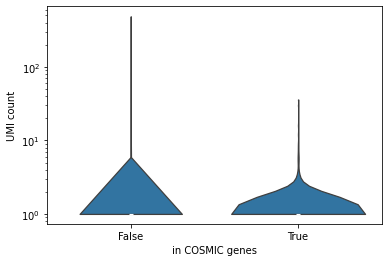

In [515]:
sns.violinplot(x=combineIS['in COSMIC genes'],y=combineIS['UMI count'],cut=0)
plt.yscale('log')

In [516]:
ss.ranksums(combineIS[combineIS['in COSMIC genes']]['UMI count'],combineIS[~combineIS['in COSMIC genes']]['UMI count'])

RanksumsResult(statistic=0.19841818934459085, pvalue=0.8427178873140451)

In [517]:
for gene in set(combineIS[combineIS['in COSMIC genes']&(combineIS['UMI count']>1)]['host gene']):
    print(gene)

IRS4
FNBP1
MECOM
CUL3
MLH1
BCOR
SNX29
RUNX1
CNTRL
EPS15
ETNK1
FIP1L1
BAZ1A
ITK
MYH9
ROBO2
CNTNAP2
AR
PTPRD
BIRC6
SMAD2
EZH2
SMARCA4
CPEB3
FHIT
BMPR1A
CREBBP


In [518]:
bpdict = {}
infile = open('../../database/genome_annotation/hsapiens.GO:BP.name.gmt')
for line in infile:
    line = line.rstrip().rsplit('\t')
    bpdict[line[1]] = line[2:]
infile.close()

In [519]:
combineIS['in T cell activation genes'] = combineIS['host gene'].apply(lambda x:True if x in bpdict['T cell activation'] else False)
combineIS['in T cell proliferation genes'] = combineIS['host gene'].apply(lambda x:True if x in bpdict['T cell proliferation'] else False)
for BP in ['T cell activation','T cell proliferation','COSMIC']:
    tdata = combineIS
    len1 = len(tdata[(tdata['in '+BP+' genes']==True)&(tdata['UMI count']>1)])
    len2 = len(tdata[(tdata['in '+BP+' genes']==True)&(tdata['UMI count']==1)])
    len3 = len(tdata[(tdata['in '+BP+' genes']==False)&(tdata['UMI count']>1)])
    len4 = len(tdata[(tdata['in '+BP+' genes']==False)&(tdata['UMI count']==1)])
    odds,p = ss.fisher_exact([[len1,len2],[len3,len4]])
    print(BP,len1,len2,len3,len4,odds,p)

T cell activation 18 158 1066 14063 1.502921129503408 0.10381094692797053
T cell proliferation 3 56 1081 14165 0.7019789877097925 0.7981456841684311
COSMIC 36 440 1048 13781 1.0758934767522554 0.6500522818550101


In [520]:
for gene in set(combineIS[combineIS['in T cell activation genes']&(combineIS['UMI count']>1)]['host gene']):
    print(gene)

RAB27A
RUNX1
ITK
CAMK4
MYH9
PREX1
DOCK2
LEPR
PIK3CD
SMARCA4


In [521]:
set(combineIS[combineIS['in T cell proliferation genes']&(combineIS['UMI count']>1)]['host gene'])

{'DOCK2'}

## frequency of expaned T cells

6wk pHIV 0.5753424657534246 0.12192118226600986 3358
6wk pART 0.3052749719416386 0.03129890453834116 1782
Rebound 0.28466204506065856 0.06820930420059663 16156


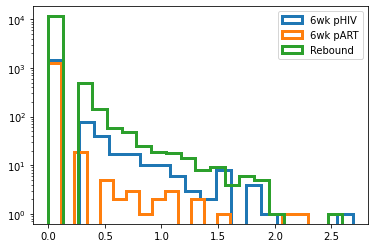

In [522]:
for time in ['6wk pHIV','6wk pART','Rebound']:
    clist = list(combineIS[combineIS['Timepoint']==time]['UMI count'])
    plt.hist(np.log10(clist),label=time,bins=20,histtype='step',lw=3)
    print(time,sum([x for x in clist if x > 1])/sum(clist),len([x for x in clist if x > 1])/len(clist),sum(clist))
plt.yscale('log')
plt.legend()

In [523]:
clist = list(combineIS['UMI count'])
sum([x for x in clist if x > 1])/sum(clist)

0.3322220135236664

In [524]:
sum([x for x in clist if x > 1])

7075

In [525]:
sum(combineIS['UMI count'])

21296

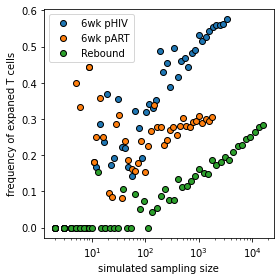

In [526]:
#I need a sampling function
np.random.seed(0)
plt.figure(figsize=(4,4))
for time in ['6wk pHIV','6wk pART','Rebound']:
    clist = list(combineIS[combineIS['Timepoint']==time]['UMI count'])
    bcpool = []
    for i,c in enumerate(clist):
        for _ in range(c):
            bcpool.append(i)
    xlist = []
    ylist = []
    for lsample in np.logspace(np.log10(2),np.log10(len(bcpool)),50):
        sample = int(round(lsample))
        spool = np.random.choice(bcpool,sample,replace=False)
        scounter = Counter(spool)
        mcount = 0
        for s in scounter:
            if scounter[s] > 1:
                mcount += scounter[s]
        ylist.append(mcount/sample)
        xlist.append(sample)
    plt.scatter(xlist,ylist,edgecolor='black',label=time)
plt.legend()
plt.xscale('log')
plt.xlabel('simulated sampling size')
plt.ylabel('frequency of expaned T cells')
plt.tight_layout()
plt.savefig('figures/down_sampling_timepoints.png')

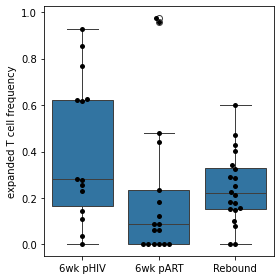

In [527]:
def calc_expand(UDP):
    clist = list(combineIS[combineIS['UDP']==UDP]['UMI count'])
    if len(clist) == 0: return np.nan
    return sum([x for x in clist if x > 1])/sum(clist)
    
refdata['expanded T cell frequency'] = refdata['UDP'].apply(lambda x:calc_expand(x))
plt.figure(figsize=(4,4))
sns.boxplot(x=refdata['Timepoint'],y=refdata['expanded T cell frequency'],order=['6wk pHIV','6wk pART','Rebound'])
sns.swarmplot(x=refdata['Timepoint'],y=refdata['expanded T cell frequency'],order=['6wk pHIV','6wk pART','Rebound'],color='black')
plt.xlabel('')
plt.tight_layout()
plt.savefig('figures/expanded_T_cell_by_sample.png')

In [528]:
tdata = refdata[refdata['valid']]
ss.ranksums(tdata[tdata['Timepoint']=='6wk pHIV']['expanded T cell frequency'],tdata[tdata['Timepoint']=='6wk pART']['expanded T cell frequency'],nan_policy='omit')

RanksumsResult(statistic=2.0640988836973566, pvalue=0.03900834179734285)

In [529]:
    tdata = refdata[(refdata['valid'])]
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='6wk pHIV','expanded T cell frequency'],tdata.loc[tdata['Timepoint']=='6wk pART','expanded T cell frequency'],nan_policy='omit')
    print('UMI/IS>1','pHIV vs pART: p='+str(p))
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound','expanded T cell frequency'],tdata.loc[tdata['Timepoint']=='6wk pART','expanded T cell frequency'],nan_policy='omit')
    print('UMI/IS>1','Rebound vs pART: p='+str(p))
    rho, p = ss.ranksums(tdata.loc[tdata['Timepoint']=='Rebound','expanded T cell frequency'],tdata.loc[tdata['Timepoint']=='6wk pHIV','expanded T cell frequency'],nan_policy='omit')
    print('UMI/IS>1','Rebound vs pHIV: p='+str(p))

UMI/IS>1 pHIV vs pART: p=0.03900834179734285
UMI/IS>1 Rebound vs pART: p=0.10626020087557743
UMI/IS>1 Rebound vs pHIV: p=0.18360955285237957


In [530]:
uniquebc = []
for bc in set(combineIS['barcode']):
    tdata = combineIS[(combineIS['barcode']==bc)]
    if len(tdata) == 1 and tdata['UMI count'].iloc[0] > 1:
        uniquebc.append(bc)
combineIS['uniquely expanding'] = combineIS['barcode'].apply(lambda x: True if x in uniquebc else False)
combineIS[combineIS['uniquely expanding']]

,Integration site,UMI count,Mouse,sample name,Timepoint,UDP,barcode,Organ,mapping length,truebc,...,distance to repeats DNA,distance to repeats LINE,distance to repeats LTR,distance to repeats SINE,distance to repeats Satellite,distance to repeats Simple_repeat,in COSMIC genes,in T cell activation genes,in T cell proliferation genes,uniquely expanding
2074,chr12:132882419:+,14,23-DMSO,23-DMSO Rebound Spleen,Rebound,UDP07,CTTATAGAAGACGTTGTCGTAGTAGGGCCTACAA,Spleen,128.000000,CCCTACTACGACAACGTCTTC,...,-5008,0,2078,287,381792,2007,False,False,False,True
12371,chr6:54707992:+,2,23-DMSO,23-DMSO Rebound Imp,Rebound,UDP37,CTTATAGATGAAGAAGAAGCCGCGGCAGAAGATCCTACAA,Implant,10.000000,ATCTTCTGCCGCGGCTTCTTCTTCATC,...,-60,582,-201,0,283250,1431,False,False,False,True
12372,chr17:29739595:+,4,23-DMSO,23-DMSO Rebound Imp,Rebound,UDP37,CTTATAGATGTGGGAGAGGGAGGTGACCCTACAA,Implant,128.000000,GTCACCTCCCTCTCCCACATC,...,-176,-1103,16904,-610,836659,816,False,False,False,True
12609,chr1:35888929:+,4,C03 #14,C03 #14 6wk pHIV Spleen,6wk pHIV,UDP41,CTTATAGAAGAAGTAGGAGCGGAAGTGCCTACAA,Spleen,129.000000,CACTTCCGCTCCTACTTCTTC,...,3361,638,-15899,283,12851850,254,False,False,False,True
13220,chr11:64875275:-,35,C03 #24,C03 #24 6wk pHIV Spleen,6wk pHIV,UDP43,CTTATAGCAGAAGGAGAAGTAGTTGTTCCTACAA,Spleen,129.000000,AACAACTACTTCTCCTTCTGC,...,-10146,6554,-8365,0,-2840790,-4912,False,False,False,True
13636,chr6:96807731:+,2,C03 #14,C03 #14 6wk pHIV BM,6wk pHIV,UDP46,CTTATAGTAGGTGCAGATGGAGGAGGCCCTACAA,BM,128.000000,GCCTCCTCCATCTGCACCTAC,...,-5734,1046,-231,77,6670701,1297,False,False,False,True
13784,chr10:7258235:+,33,C03 #17,C03 #17 6wk pHIV BM,6wk pHIV,UDP47,CTTATAGCCGGTGTAGAGGAGGAGGCACCTACAA,BM,122.030303,TGCCTCCTCCTCTACACCGGC,...,1182,-7074,2022,-4,-2189390,-1111,False,False,False,True
13789,chr7:100585322:+,3,C03 #17,C03 #17 6wk pHIV BM,6wk pHIV,UDP47,CTTATAGAAGAGGCTGGTGAGGGGGAACCTACAA,BM,129.000000,TTCCCCCTCACCAGCCTCTTC,...,5334,-5026,-3588,1716,-618795,1924,False,False,False,True
13854,chr7:75519147:-,2,C03 #24,C03 #24 6wk pHIV BM,6wk pHIV,UDP48,CTTATAGGCGGGGAGGACGATGATGCACCTACAA,BM,128.000000,TGCATCATCGTCCTCCCCGCC,...,-27059,-44,-5523,0,10030211,944,False,False,False,True
14023,chr1:27262172:-,5,C03 #24,C03 #24 6wk pHIV Implant,6wk pHIV,UDP53,CTTATAGAAGATGATGAAGATGTCGAACCTACAA,Implant,98.000000,TTCGACATCTTCATCATCTTC,...,-2947,-565,5634,0,14127006,-1691,False,False,False,True


In [531]:
combineIS[combineIS['uniquely expanding']]['transcription']

2074     0.000000
12371    0.000000
12372    0.000502
12609    0.000700
13220    0.000224
13636    0.009182
13784    0.000000
13789    0.000000
13854    0.000000
14023    0.000809
14265    0.000000
Name: transcription, dtype: float64

In [532]:
refdata.to_csv('per_sample_summary_103023.csv')

### basic stats

In [533]:
def count_IS(x):
    ISlist = []
    tref = refdata[(refdata['Mouse']==x)&(refdata['valid'])]
    for UDP in tref['UDP']:
        if UDP in bcdata:
            tdata = bcdata[UDP]
            ISlist.extend(list(tdata[tdata['provirus type']=='integrated']['annotation']))
    return len(set(ISlist))
        
def count_UMI(x):
    UMIcount = 0
    tref = refdata[(refdata['Mouse']==x)&(refdata['valid'])]
    for UDP in tref['UDP']:
        if UDP in bcdata:
            tdata = bcdata[UDP]
            UMIcount += sum(tdata['UMI count'])
    return UMIcount

mousedata['IS count'] = mousedata['mouse'].apply(lambda x:count_IS(x))
mousedata['UMI count'] = mousedata['mouse'].apply(lambda x:count_UMI(x))
totalbc = sum(mousedata['barcode count'])
totalIS = sum(mousedata['IS count'])
totalUMI = sum(mousedata['UMI count'])
print('barcode',totalbc)
print('IS',totalIS)
print('UMI',totalUMI)

barcode 2726
IS 14532
UMI 292552


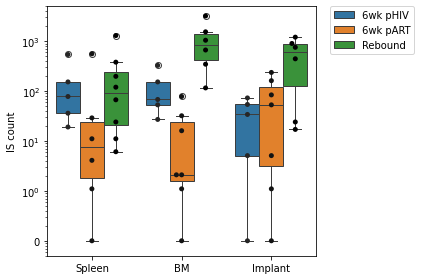

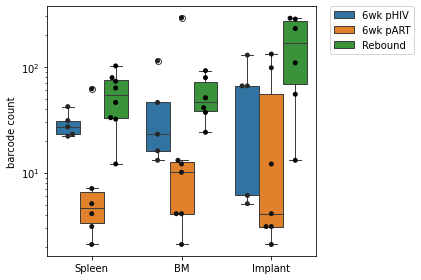

In [534]:
#IS count and barcode count per organ
for ylabel in ['IS count','barcode count']:
    plt.figure(figsize=(6,4))
    organlist = ['Spleen','BM','Implant']
    tdata = refdata[refdata['valid']]
    sns.boxplot(x=tdata['Organ'],y=tdata[ylabel]+0.1,hue=tdata['Timepoint'],hue_order=['6wk pHIV','6wk pART','Rebound'],order=organlist)
    ax = sns.swarmplot(x=tdata['Organ'],y=tdata[ylabel]+0.1,hue=tdata['Timepoint'],hue_order=['6wk pHIV','6wk pART','Rebound'],color='black',dodge=True,order=organlist)
    plt.xticks(labels=organlist,ticks=range(3))
    plt.xlabel('')
    plt.yscale('log')
    plt.ylabel(ylabel)
    plt.legend([],[], frameon=False)
    if ylabel == 'IS count':
        locs,labels=plt.yticks()
        labels[2] = '0'
        plt.yticks(locs,labels)
        plt.ylim(0.05,5e3)
    handles, labels = ax.get_legend_handles_labels()
    l = plt.legend(handles[0:3], labels[0:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  
    plt.tight_layout()
    plt.savefig('figures/'+ylabel.replace(' ','_')+'_by_organ.png',dpi=300)

In [535]:
mousedata.sort_values(by='Timepoint')

,mouse,Timepoint,T cell similarity score,barcode similarity score,barcode count,UMI_per_bc,IS_per_bc,UMI_per_IS,gmean_UMI_per_bc,gmean_IS_per_bc,gmean_UMI_per_IS,active proviral barcode count,vRNA barcode count,active proviral barcode count(total),integrated barcode count,linear barcode count,circular barcode count,IS count,UMI count
2,C03 #22,6wk pART,0.001000,0.001000,20,46.555556,7.333333,6.348485,10.022855,2.829098,1.277946,NaN,NaN,NaN,9,1,13,62,909
4,C03 #19,6wk pART,0.001000,0.001000,22,1.750000,1.750000,1.000000,1.414214,1.414214,1.000000,NaN,NaN,NaN,4,3,16,6,876
6,C03 #21,6wk pART,0.007944,0.001000,10,10.000000,6.200000,1.612903,2.150560,1.933182,1.220370,NaN,NaN,NaN,5,1,7,30,481
16,JCMM30C-5,6wk pART,0.196480,0.283555,231,6.075342,5.479452,1.108750,1.664908,1.652011,1.032278,NaN,NaN,NaN,163,36,74,733,1964
8,C03 #2,6wk pART,0.007569,0.014893,10,36.000000,28.333333,1.270588,5.943922,5.473704,1.057302,NaN,NaN,NaN,3,2,7,83,1755
11,JCMM30C-1,6wk pART,0.008386,0.020503,324,2.740000,2.530000,1.083004,1.467342,1.429224,1.027992,NaN,NaN,NaN,131,186,70,226,1696
13,C03 #8,6wk pART,0.001000,0.001000,14,7.400000,7.200000,1.027778,3.200869,3.177672,1.019441,NaN,NaN,NaN,5,3,9,36,1172
3,C03 #9,6wk pHIV,0.090175,0.038783,35,19.461538,16.461538,1.182243,6.615581,6.286971,1.063418,7.0,205.0,7.0,13,15,19,200,1409
5,C03 #3,6wk pHIV,0.005308,0.044955,55,8.333333,8.000000,1.041667,4.188285,3.543701,1.025198,5.0,47.0,5.0,8,9,48,64,7990
18,C03 #14,6wk pHIV,0.117552,0.328299,99,46.900000,36.900000,1.271003,4.784876,3.453121,1.100345,20.0,149.0,20.0,9,12,87,359,16683


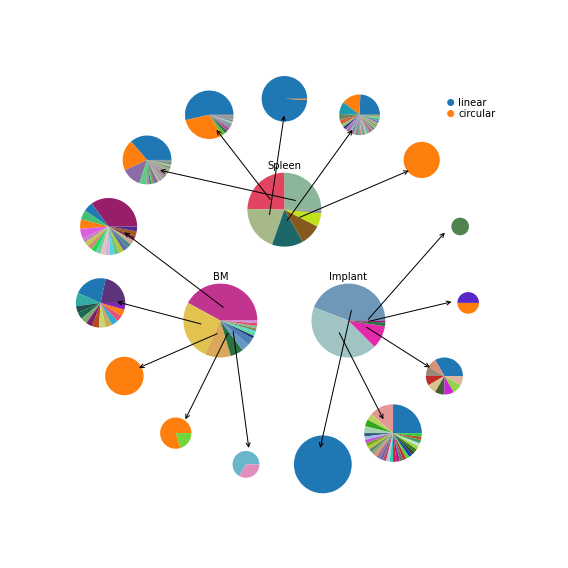

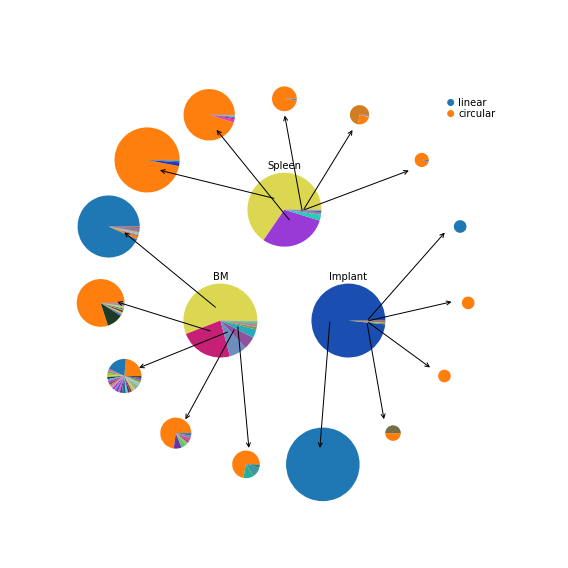

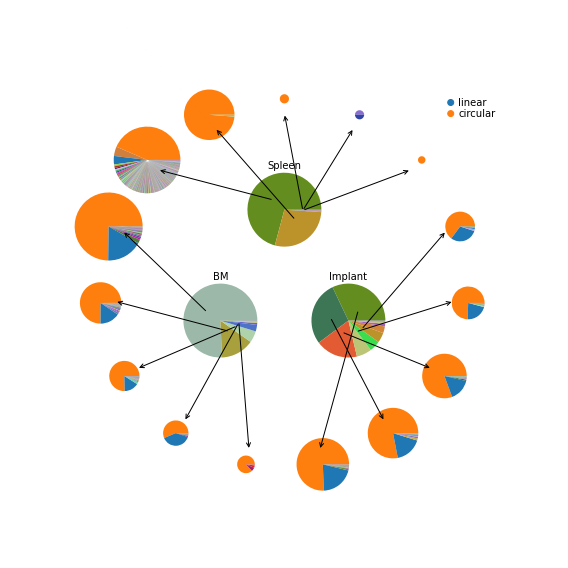

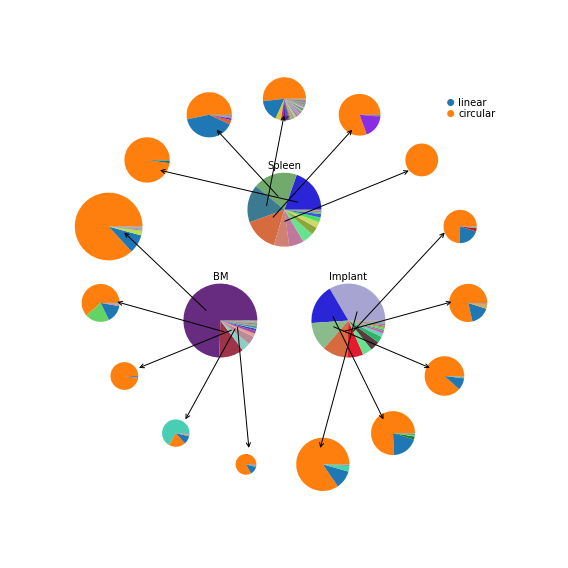

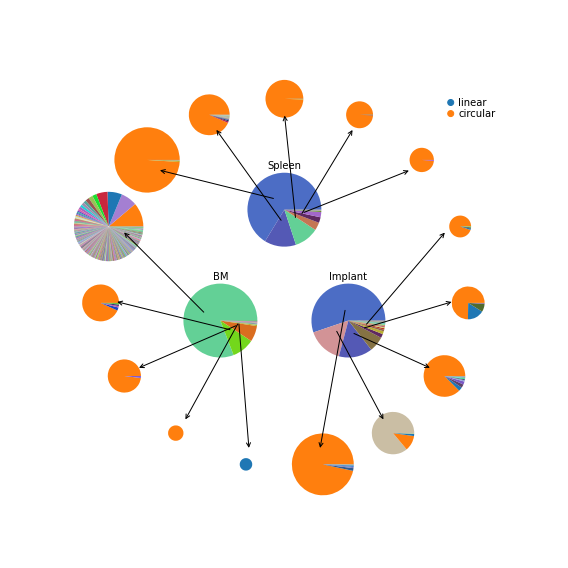

...

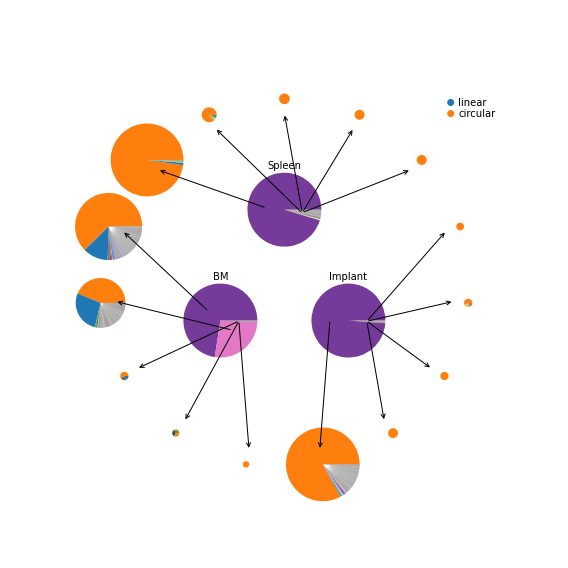

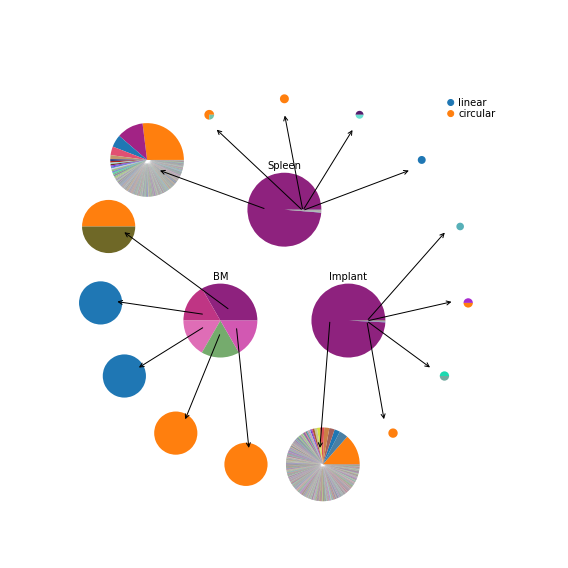

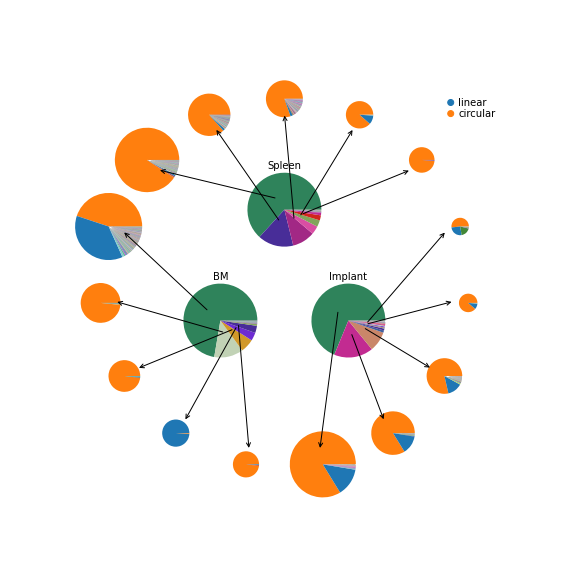

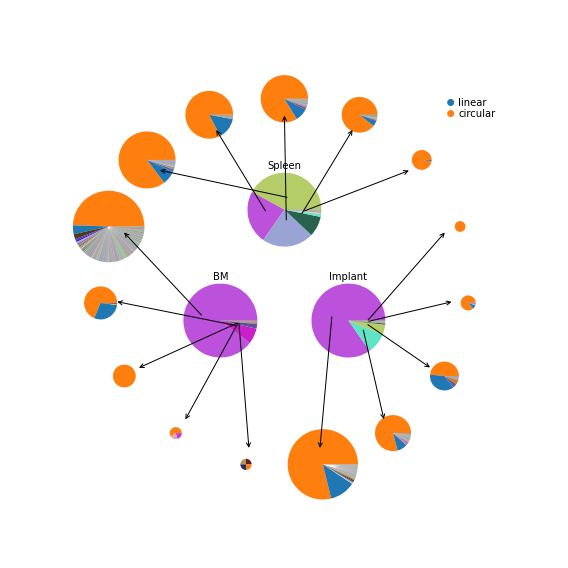

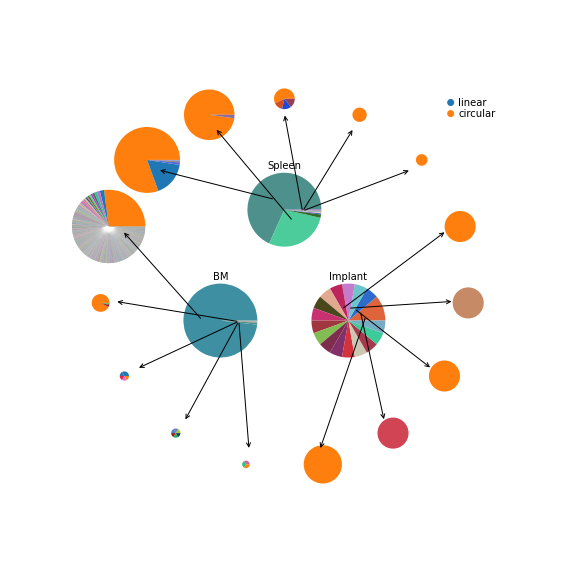

In [536]:
#I need to make some fancy figures for the graphical abstract
#Force directed pie chart!
def generate_random_color():
    grey_thre = 0.1
    color = np.random.random(3)
    while (abs(color[0]-color[1]) < grey_thre and abs(color[0]-color[2]) < grey_thre and abs(color[2]-color[1]) < grey_thre) or (max(color)>0.9) or (min(color)<0.1):
        color = np.random.random(3)
    return color

np.random.seed(0)
distance_var = 0.4; radius = 0.2
for mouse in mouselist:
    plt.figure(figsize=(8,8))
    tref = refdata[refdata['Mouse']==mouse]
    colordict = {}
    pieloc = [(0,1),(-np.sqrt(3)/2,-0.5),(np.sqrt(3)/2,-0.5)]
    for ploti,organ in enumerate(['Spleen','BM','Implant']):
        UDP = tref[tref['Organ']==organ]['UDP'].iloc[0]
        if UDP not in bcdata:
            ISpiecount += 5
            continue
        tdata = bcdata[UDP].groupby('barcode').sum().sort_values(by='UMI count',ascending=False)
        totaldepth = sum(tdata['UMI count'])
        labellist = []; colorlist = []; countlist = []
        ISpiecount = 0
        for bc, row in tdata.iterrows():
            countlist.append(row['UMI count'])
            labellist.append(bc)
            if bc not in colordict:                
                colordict[bc] = generate_random_color()
            colorlist.append(colordict[bc])
            ISpiecount += 1
            if ISpiecount > 5: continue
            if ploti >= 1:
                ISrad = np.pi/10+2/15*np.pi*(ISpiecount+5*ploti)
            if ploti == 0:
                ISrad = np.pi/10+2/15*np.pi*(6-ISpiecount)
            ISpiecenter = [np.cos(ISrad)*distance_var*2.5,np.sin(ISrad)*distance_var*2.5]
            ISpieradius = ((row['UMI count']/totaldepth)**0.3)*radius
            ttdata = bcdata[UDP][bcdata[UDP]['barcode']==bc].sort_values(by='UMI count',ascending=False)
            IScolor = []; IScount = []
            for i,r in ttdata.iterrows():
                if r['annotation'] == 'linear':
                    IScolor.append(plt.cm.tab10(0))
                elif r['annotation'] == 'circular':
                    IScolor.append(plt.cm.tab10(1))
                else:
                    IScolor.append(generate_random_color())
                IScount.append(r['UMI count'])
            plt.pie(IScount,colors=IScolor,center=ISpiecenter,radius=ISpieradius)
        center = pieloc[ploti]
        center = [center[0]*distance_var,center[1]*distance_var]
        wedges,texts = plt.pie(countlist,colors=colorlist,center=center,radius=radius)
        plt.text(x=center[0],y=center[1]+radius*1.2,s=organ,ha='center',va='center')
        for arrowi in range(5):
            if arrowi >= len(wedges): break
            wedge_center = wedges[arrowi].center
            wedge_angle = (wedges[arrowi].theta2+wedges[arrowi].theta1)/360*np.pi
            wedge_adjust = [np.cos(wedge_angle)*wedges[arrowi].r/2,np.sin(wedge_angle)*wedges[arrowi].r/3]
            arrow_start = [wedge_center[0]+wedge_adjust[0],wedge_center[1]+wedge_adjust[1]]
            if ploti >= 1:
                ISrad = np.pi/10+2/15*np.pi*(ploti*5+arrowi+1)
            if ploti == 0:
                ISrad = np.pi/10+2/15*np.pi*(5-arrowi)
            #print(ploti,arrowi,ISrad,arrow_start,arrow_end)
            arrow_end = [np.cos(ISrad)*distance_var*2.3,np.sin(ISrad)*distance_var*2.3] 
            plt.annotate("",xy=arrow_end, xycoords='data',xytext=arrow_start,arrowprops=dict(arrowstyle="->",connectionstyle="arc3"))
    ax = plt.gca()
    ax.set_xlim([-1.5,1.5])
    ax.set_ylim([-1.5,1.5])
    plt.text(x=0.94,y=0.98,s='linear',ha='left',va='center')
    plt.text(x=0.94,y=0.92,s='circular',ha='left',va='center')
    plt.scatter([0.90,0.90],[0.98,0.92],color=[plt.cm.tab10(0),plt.cm.tab10(1)])
    plt.tight_layout()
    plt.savefig('figures/barcode_combine_pie_'+mouse.replace(' ','_')+'.png',dpi=300)

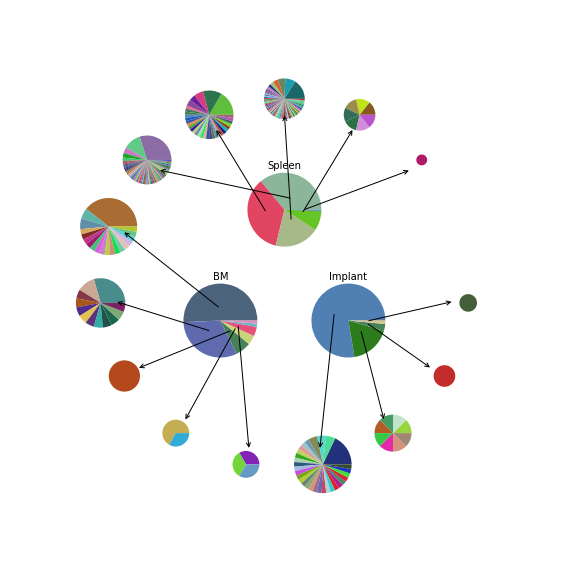

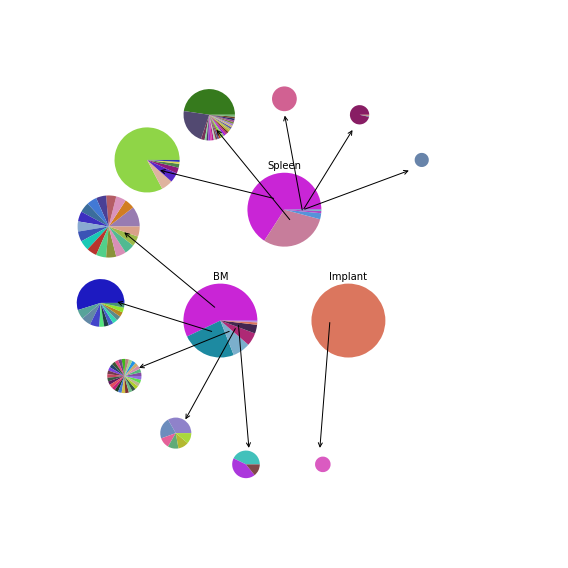

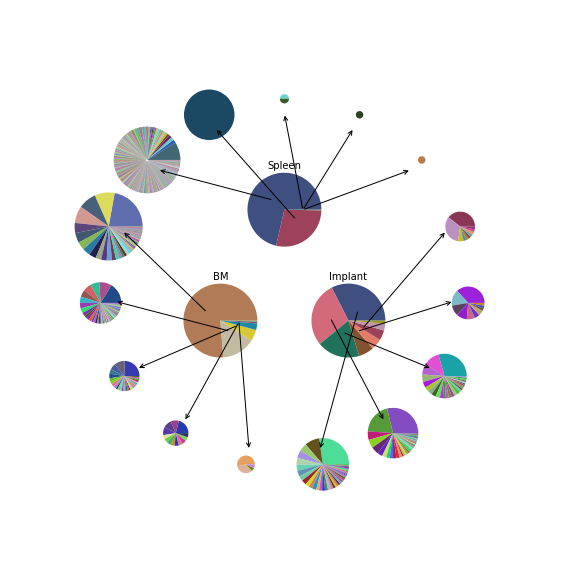

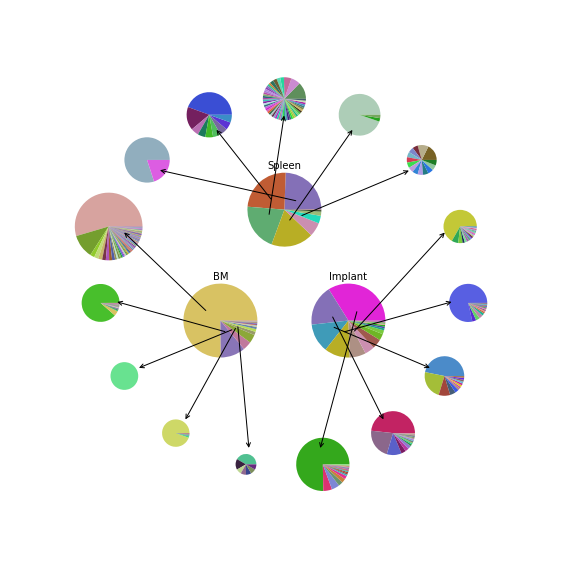

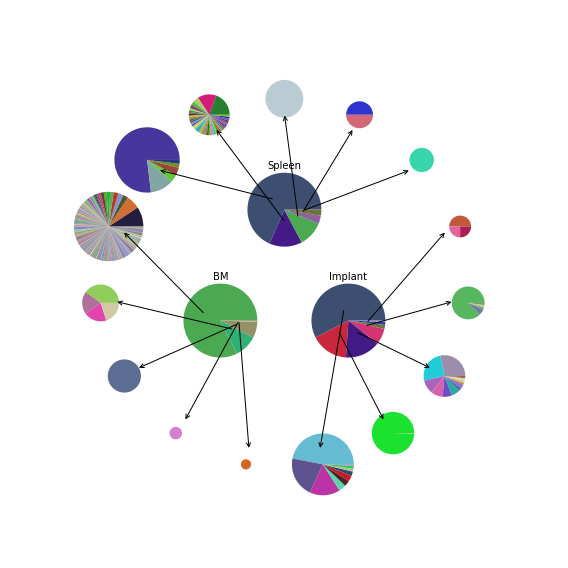

...

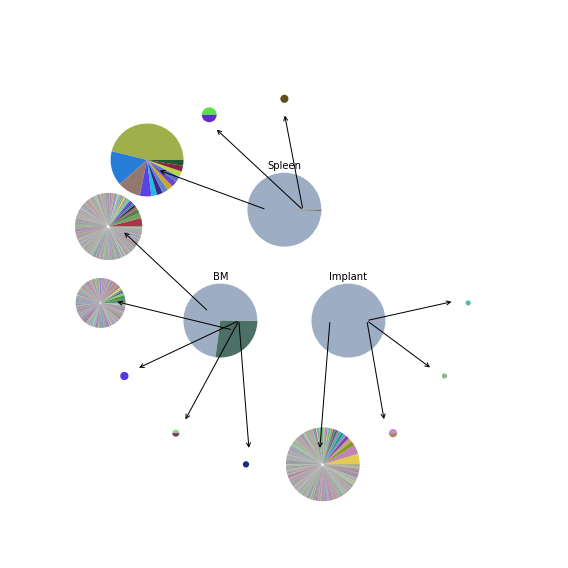

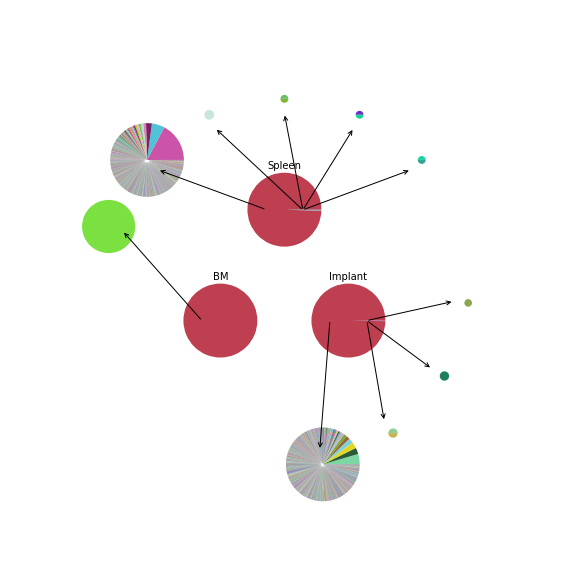

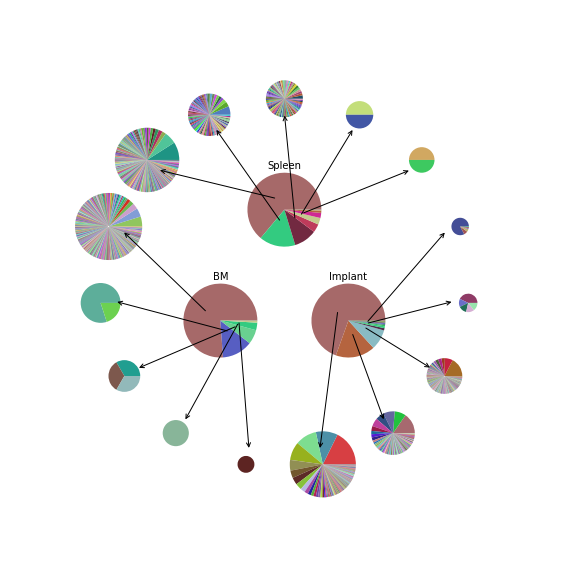

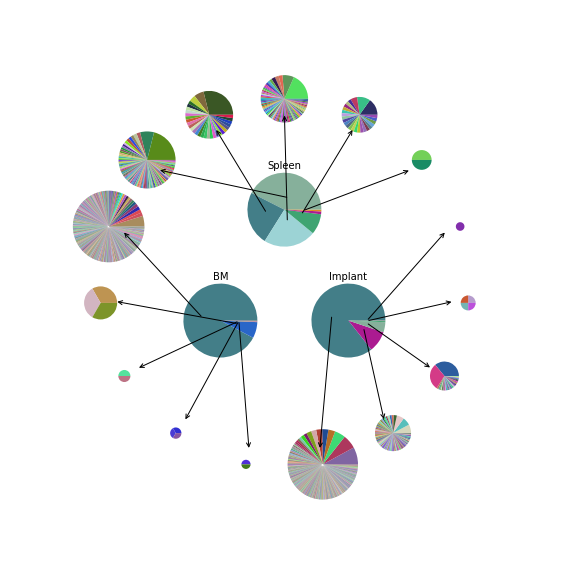

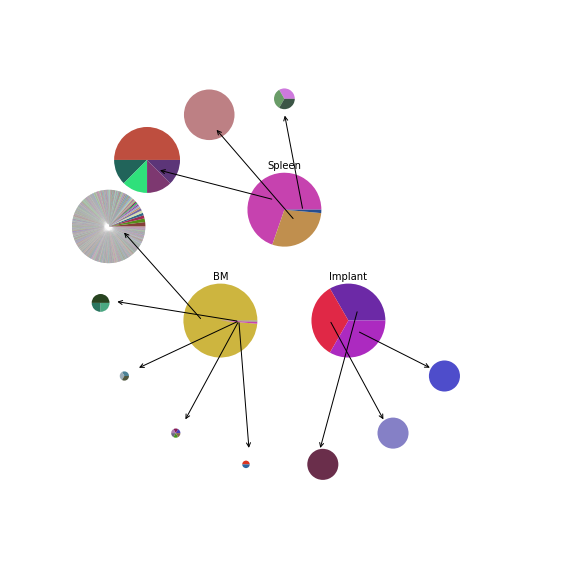

In [537]:
#a version without linear and circular form
def generate_random_color():
    grey_thre = 0.1
    color = np.random.random(3)
    while (abs(color[0]-color[1]) < grey_thre and abs(color[0]-color[2]) < grey_thre and abs(color[2]-color[1]) < grey_thre) or (max(color)>0.9) or (min(color)<0.1):
        color = np.random.random(3)
    return color

np.random.seed(0)
distance_var = 0.4; radius = 0.2
for mouse in mouselist:
    plt.figure(figsize=(8,8))
    tref = refdata[refdata['Mouse']==mouse]
    colordict = {}
    pieloc = [(0,1),(-np.sqrt(3)/2,-0.5),(np.sqrt(3)/2,-0.5)]
    for ploti,organ in enumerate(['Spleen','BM','Implant']):
        UDP = tref[tref['Organ']==organ]['UDP'].iloc[0]
        if UDP not in bcdata:
            ISpiecount += 5
            continue
        tdata = bcdata[UDP].groupby('barcode').sum().sort_values(by='UMI count',ascending=False)
        totaldepth = sum(tdata['UMI count'])
        labellist = []; colorlist = []; countlist = []
        ISpiecount = 0
        for bc, row in tdata.iterrows():
            ttdata = bcdata[UDP][bcdata[UDP]['barcode']==bc].sort_values(by='UMI count',ascending=False)
            ttdata = ttdata[(ttdata['annotation']!='linear')&(ttdata['annotation']!='circular')]
            if len(ttdata) == 0: continue
            countlist.append(row['UMI count'])
            labellist.append(bc)
            if bc not in colordict:                
                colordict[bc] = generate_random_color()
            colorlist.append(colordict[bc])
            ISpiecount += 1
            if ISpiecount > 5: continue
            if ploti >= 1:
                ISrad = np.pi/10+2/15*np.pi*(ISpiecount+5*ploti)
            if ploti == 0:
                ISrad = np.pi/10+2/15*np.pi*(6-ISpiecount)
            ISpiecenter = [np.cos(ISrad)*distance_var*2.5,np.sin(ISrad)*distance_var*2.5]
            ISpieradius = ((row['UMI count']/totaldepth)**0.3)*radius         
            IScolor = []; IScount = []
            for i,r in ttdata.iterrows():
                if r['annotation'] == 'linear':
                    IScolor.append(plt.cm.tab10(0))
                elif r['annotation'] == 'circular':
                    IScolor.append(plt.cm.tab10(1))
                else:
                    IScolor.append(generate_random_color())
                IScount.append(r['UMI count'])
            plt.pie(IScount,colors=IScolor,center=ISpiecenter,radius=ISpieradius)
        center = pieloc[ploti]
        center = [center[0]*distance_var,center[1]*distance_var]
        wedges,texts = plt.pie(countlist,colors=colorlist,center=center,radius=radius)
        plt.text(x=center[0],y=center[1]+radius*1.2,s=organ,ha='center',va='center')
        for arrowi in range(5):
            if arrowi >= len(wedges): break
            wedge_center = wedges[arrowi].center
            wedge_angle = (wedges[arrowi].theta2+wedges[arrowi].theta1)/360*np.pi
            wedge_adjust = [np.cos(wedge_angle)*wedges[arrowi].r/2,np.sin(wedge_angle)*wedges[arrowi].r/3]
            arrow_start = [wedge_center[0]+wedge_adjust[0],wedge_center[1]+wedge_adjust[1]]
            if ploti >= 1:
                ISrad = np.pi/10+2/15*np.pi*(ploti*5+arrowi+1)
            if ploti == 0:
                ISrad = np.pi/10+2/15*np.pi*(5-arrowi)
            #print(ploti,arrowi,ISrad,arrow_start,arrow_end)
            arrow_end = [np.cos(ISrad)*distance_var*2.3,np.sin(ISrad)*distance_var*2.3] 
            plt.annotate("",xy=arrow_end, xycoords='data',xytext=arrow_start,arrowprops=dict(arrowstyle="->",connectionstyle="arc3"))
    ax = plt.gca()
    ax.set_xlim([-1.5,1.5])
    ax.set_ylim([-1.5,1.5])
    plt.tight_layout()
    plt.savefig('figures/barcode_combine_pie_only_integrated_'+mouse.replace(' ','_')+'.png',dpi=300)

In [538]:
randomsite.to_csv('random_site_analysis.csv')

### PCA

In [539]:
combinebc

,barcode,UMI count,IS count,integrated frequency,unintegrated frequency,Mouse,sample name,Timepoint,UDP,Organ,truebc,transcription,UMI_per_IS,UMI count normalized,transcription 4-organ mean,transcription TB,is active,gmean_UMI_per_IS,within_gene_freq
0,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,103,93,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,Spleen,GCCTCCCTCTACGTCGTCTAC,0.069424,1.107527,0.015675,0.076087,0.064383,True,1.066077,0.631068
1,CTTATAGTGGACGACGTAGAGGGAGGCCCTACAA,63,61,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,Spleen,GCCTCCCTCTACGTCGTCCAC,0.000000,1.032787,0.009588,0.000000,0.000000,False,1.022986,0.555556
2,CTTATAGGCGTAGGAGGAGGTGAGGCCCCTACAA,19,19,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,Spleen,GGCCTCACCTCCTCCTACGCC,0.131093,1.000000,0.002891,0.128974,0.155346,True,1.000000,0.736842
3,CTTATAGCTGAAGTTGCGGCCGAAGTGCCTACAA,23,23,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,Spleen,CACTTCGGCCGCAACTTCAGC,0.475997,1.000000,0.003500,0.506288,0.398405,True,1.000000,0.782609
4,CTTATAGACGAAGCTGAGGAAGCGGGCTTATAG,1,1,1.0,0.0,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,Spleen,GCCCGCTTCCTCAGCTTCGTC,0.000000,1.000000,0.000152,0.000000,0.000000,False,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499,CTTATAGTGGGGGTAGACGGAGAGGTGGTTGATGTTTTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,Implant,AACATCAACCACCTCTCCGTCTACCCCCAC,0.000000,1.000000,0.001247,0.000000,0.000000,False,1.000000,0.000000
500,CTTATAGCCGGTGGAGATGCAGCGGAATTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,Implant,TTCCGCTGCATCTCCACCGGC,0.000000,1.000000,0.001247,0.000000,0.000000,False,1.000000,1.000000
501,CTTATAGAAGAGGTAGTCGCAGAGGAATTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,Implant,TTCCTCTGCGACTACCTCTTC,0.000000,1.000000,0.001247,0.000000,0.000000,False,1.000000,1.000000
502,CTTATAGACGCAGGGGCAGTCGGCGCTTTATAG,1,1,1.0,0.0,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,Implant,AGCGCCGACTGCCCCTGCGTC,0.000000,1.000000,0.001247,0.000000,0.000000,False,1.000000,1.000000


1. frequency or abundance of that barcode as viral RNA
2. UMI per barcode
3. Number of unique IS clones for that per BC
4. UMI count of that IS linked to that BC (expansion)
5. graph them all together and then maybe also try acute versus rebound samples?

In [540]:
inputlist = ['UMI count','IS count','transcription 4-organ mean','gmean_UMI_per_IS']
tdata = np.log10(combinebc[inputlist]+1e-4)
pca = PCA(n_components=2)
pca.fit(tdata)
fitted = pca.fit_transform(tdata)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.78061873 0.19868965]
[29.66315182 14.96530033]


In [541]:
combinebc['PCA_comp1'] = [fitted[i][0] for i in range(len(combinebc))]
combinebc['PCA_comp2'] = [fitted[i][1] for i in range(len(combinebc))]

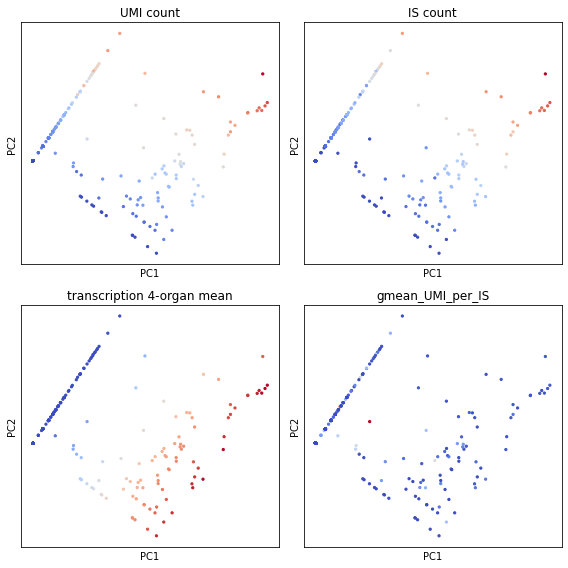

In [542]:
ploti = 0
plt.figure(figsize=(8,8))
for feature in inputlist:
    ploti += 1
    plt.subplot(2,2,ploti)
    mincol = min(np.log10(combinebc[feature]+1e-4))
    maxcol = max(np.log10(combinebc[feature]+1e-4))
    collist = (np.log10(combinebc[feature]+1e-4)-mincol)/(maxcol-mincol)
    plt.scatter(combinebc['PCA_comp1'],combinebc['PCA_comp2'],s=5,color=plt.cm.coolwarm(collist))
    plt.title(feature)
    plt.xticks([], [])
    plt.yticks([], [])
    plt.xlabel('PC1')
    plt.ylabel('PC2')
plt.tight_layout()
plt.savefig('figures/PCA_barcode_4dimension.png',dpi=300)
combinebc.to_csv('per_bc_summary_030223.csv')

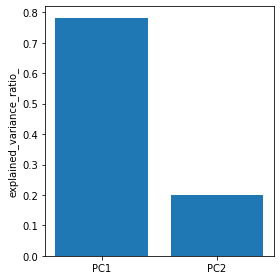

In [543]:
plt.figure(figsize=(4,4))
plt.bar(height=pca.explained_variance_ratio_,x=['PC1','PC2'])
plt.ylabel('explained_variance_ratio_')
plt.tight_layout()
plt.savefig('figures/PCA_barcode_4dimension_explained_variance.png',dpi=300)
tmpfile = open('PCA_explained_variance.csv','w')
tmpfile.write('PC1,'+str(pca.explained_variance_ratio_[0])+'\n')
tmpfile.write('PC2,'+str(pca.explained_variance_ratio_[1])+'\n')
tmpfile.close()

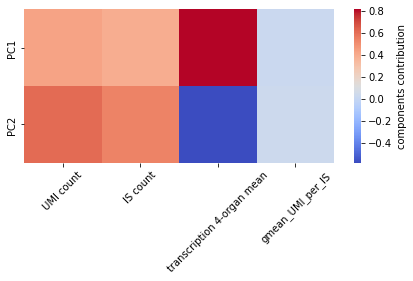

In [544]:
sns.heatmap(pca.components_,cmap='coolwarm',cbar_kws={'label': 'components contribution'})
plt.xticks([x+0.5 for x in range(len(inputlist))],inputlist,rotation=45)
plt.yticks([x+0.5 for x in range(2)],['PC1','PC2'])
plt.tight_layout()
plt.savefig('figures/PCA_barcode_4dimension_components.png',dpi=300)
tmpfile = open('PCA_components.csv','w')
tmpfile.write(','+','.join(inputlist)+'\n')
tmpfile.write('PC1,'+','.join([str(x) for x in pca.components_[0]])+'\n')
tmpfile.write('PC2,'+','.join([str(x) for x in pca.components_[1]])+'\n')
tmpfile.close()

## Integration site analysis on expanded/unexpanded cells

In [545]:
combineIS

,Integration site,UMI count,Mouse,sample name,Timepoint,UDP,barcode,Organ,mapping length,truebc,...,distance to repeats DNA,distance to repeats LINE,distance to repeats LTR,distance to repeats SINE,distance to repeats Satellite,distance to repeats Simple_repeat,in COSMIC genes,in T cell activation genes,in T cell proliferation genes,uniquely expanding
0,chr2:85708835:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,18.0,GCCTCCCTCTACGTCGTCTAC,...,1021,0,3337,691,-227050,274,False,False,False,False
1,chr5:168423417:-,4,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,96.5,GCCTCCCTCTACGTCGTCTAC,...,132,-929,2114,47,639516,2550,False,False,False,False
2,chr11:34258609:+,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,129.0,GCCTCCCTCTACGTCGTCTAC,...,-1020,-8194,10006,0,6276059,-2991,False,False,False,False
3,chr1:48676335:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,129.0,GCCTCCCTCTACGTCGTCTAC,...,-427,21,3505,-11,-64444,-1109,False,False,False,False
4,chr4:2695114:-,1,01-DMSO,01-DMSO Rebound Spleen,Rebound,UDP01,CTTATAGTAGACGACGTAGAGGGAGGCCCTACAA,Spleen,127.0,GCCTCCCTCTACGTCGTCTAC,...,-12283,1561,2671,548,-1196022,-915,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15300,chr1:228648975:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGTGGGGGTAGACGGAGAGGTGGTTGATGTTTTATAG,Implant,35.0,AACATCAACCACCTCTCCGTCTACCCCCAC,...,-145,2851,190,0,-94016,-2138,False,False,False,False
15301,chr14:90787111:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGCCGGTGGAGATGCAGCGGAATTATAG,Implant,18.0,TTCCGCTGCATCTCCACCGGC,...,1935,315,4330,-232,4131906,-6613,False,False,False,False
15302,chr5:176462542:+,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGAAGAGGTAGTCGCAGAGGAATTATAG,Implant,129.0,TTCCTCTGCGACTACCTCTTC,...,-7331,-598,-20147,0,-277119,-1989,False,False,False,False
15303,chr11:76699025:-,1,JCMM30C-5,JCMM30C-5 6wk pART Implant,6wk pART,UDP31,CTTATAGACGCAGGGGCAGTCGGCGCTTTATAG,Implant,129.0,AGCGCCGACTGCCCCTGCGTC,...,4063,99,-42,-137,4785629,1244,False,False,False,False


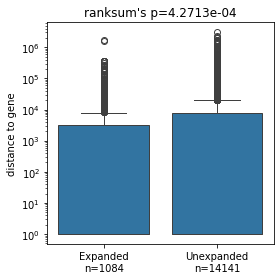

In [546]:
plt.figure(figsize=(4,4))
tdata = combineIS[combineIS['distance to gene']!=-1]
ax = sns.boxplot(y=abs(tdata['distance to gene']+1),x=tdata['clonal expanded'],order=[True,False])
t1data = tdata[tdata['clonal expanded']]
t2data = tdata[~tdata['clonal expanded']]
W,p = ss.ranksums(abs(t1data['distance to gene']),abs(t2data['distance to gene']))
plt.yscale('log')
plt.xticks([0,1],['Expanded\nn='+str(len(t1data)),'Unexpanded\nn='+str(len(t2data))])
plt.xlabel('')
plt.title('ranksum\'s p={:0.4e}'.format(p))
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_gene.png',dpi=300)

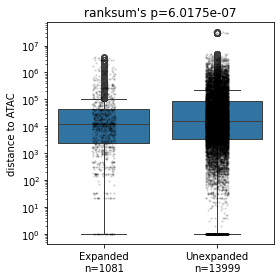

In [547]:
plt.figure(figsize=(4,4))
tdata = combineIS[combineIS['distance to ATAC']!=-1]
ax = sns.boxplot(y=abs(tdata['distance to ATAC']+1),x=tdata['clonal expanded'],order=[True,False])
sns.stripplot(y=abs(tdata['distance to ATAC']+1),x=tdata['clonal expanded'],order=[True,False],color='black',alpha=0.2,s=2)
t1data = tdata[tdata['clonal expanded']]
t2data = tdata[~tdata['clonal expanded']]
W,p = ss.ranksums(abs(t1data['distance to ATAC']),abs(t2data['distance to ATAC']))
plt.yscale('log')
plt.xticks([0,1],['Expanded\nn='+str(len(t1data)),'Unexpanded\nn='+str(len(t2data))])
plt.xlabel('')
plt.title('ranksum\'s p={:0.4e}'.format(p))
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_ATAC.png',dpi=300)

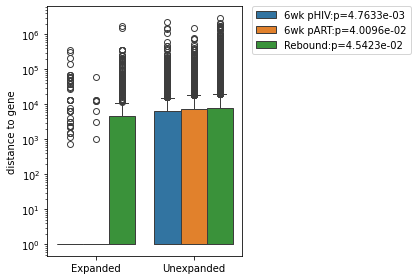

In [548]:
plt.figure(figsize=(6,4))
tdata = combineIS[combineIS['distance to gene']!=-1]
ax = sns.boxplot(y=abs(tdata['distance to gene']+1),x=tdata['clonal expanded'],order=[True,False],hue=tdata['Timepoint'],hue_order=timelist)
labels = []
for time in timelist:
    t1data = tdata[(tdata['clonal expanded'])&(tdata['Timepoint']==time)]
    t2data = tdata[(~tdata['clonal expanded'])&(tdata['Timepoint']==time)]
    W,p = ss.ranksums(abs(t1data['distance to gene']),abs(t2data['distance to gene']))
    labels.append(time+':p={:.4e}'.format(p))
plt.yscale('log')
plt.legend([],[], frameon=False)
handles, _ = ax.get_legend_handles_labels()
l = plt.legend(handles[:3], labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks([0,1],['Expanded','Unexpanded'])
plt.xlabel('')
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_gene_by_time.png',dpi=300)

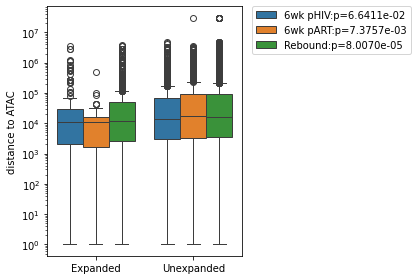

In [549]:
plt.figure(figsize=(6,4))
tdata = combineIS[combineIS['distance to ATAC']!=-1]
ax = sns.boxplot(y=abs(tdata['distance to ATAC']+1),x=tdata['clonal expanded'],order=[True,False],hue=tdata['Timepoint'],hue_order=timelist)
labels = []
for time in timelist:
    t1data = tdata[(tdata['clonal expanded'])&(tdata['Timepoint']==time)]
    t2data = tdata[(~tdata['clonal expanded'])&(tdata['Timepoint']==time)]
    W,p = ss.ranksums(abs(t1data['distance to ATAC']),abs(t2data['distance to ATAC']))
    labels.append(time+':p={:.4e}'.format(p))
plt.yscale('log')
plt.legend([],[], frameon=False)
handles, _ = ax.get_legend_handles_labels()
l = plt.legend(handles[:3], labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks([0,1],['Expanded','Unexpanded'])
plt.xlabel('')
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_ATAC_by_time.png',dpi=300)

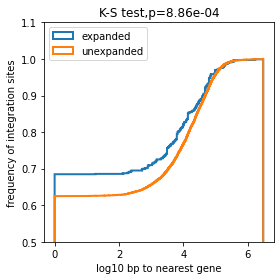

In [550]:
tdata = combineIS[combineIS['distance to gene']!=-1]
t1data = tdata[tdata['clonal expanded']]
t2data = tdata[~tdata['clonal expanded']]
plt.figure(figsize=(4,4))
n1 = list(np.log10(abs(t1data['distance to gene']+1)))+[np.log10(max(abs(tdata['distance to gene'])))]
n2 = list(np.log10(abs(t2data['distance to gene']+1)))+[np.log10(max(abs(tdata['distance to gene'])))]
plt.hist(n1,label='expanded',bins=1000,lw=2,cumulative=True,density=True,histtype='step')
plt.hist(n2,label='unexpanded',bins=1000,lw=2,cumulative=True,density=True,histtype='step')
D,p = ss.kstest(n1,n2)
plt.title('K-S test,p={:.02e}'.format(p))
plt.xlabel('log10 bp to nearest gene')
plt.ylabel('frequency of integration sites')
plt.legend(loc='upper left')
plt.ylim(0.5,1.1)
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_gene_CDF.png',dpi=300)

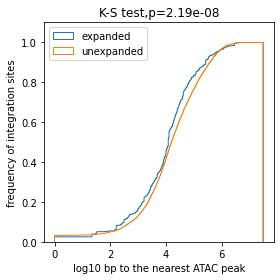

In [551]:
tdata = combineIS[combineIS['distance to ATAC']!=-1]
t1data = tdata[tdata['clonal expanded']]
t2data = tdata[~tdata['clonal expanded']]
plt.figure(figsize=(4,4))
n1 = list(np.log10(abs(t1data['distance to ATAC']+1)))+[np.log10(max(abs(tdata['distance to ATAC'])))]
n2 = list(np.log10(abs(t2data['distance to ATAC']+1)))+[np.log10(max(abs(tdata['distance to ATAC'])))]
plt.hist(n1,label='expanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
plt.hist(n2,label='unexpanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
D,p = ss.kstest(n1,n2)
plt.title('K-S test,p={:.02e}'.format(p))
plt.xlabel('log10 bp to the nearest ATAC peak')
plt.ylabel('frequency of integration sites')
plt.legend(loc='upper left')
plt.ylim(0,1.1)
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_ATAC_CDF.png',dpi=300)

6wk pHIV 0.12117721324864207 0.010818954022490165
6wk pART 0.27167469064576455 0.004447884927164237
Rebound 0.08559074097005681 1.8537629910196993e-05


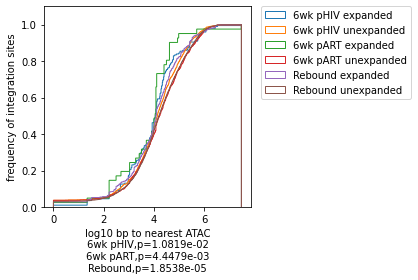

In [552]:
plt.figure(figsize=(6,4))
labels = ''
for time in timelist:
    tdata = combineIS[(combineIS['distance to ATAC']!=-1)&(combineIS['Timepoint']==time)]
    t1data = tdata[tdata['clonal expanded']]
    t2data = tdata[~tdata['clonal expanded']]
    n1 = list(np.log10(abs(t1data['distance to ATAC']+1)))+[np.log10(max(abs(combineIS['distance to ATAC'])))]
    n2 = list(np.log10(abs(t2data['distance to ATAC']+1)))+[np.log10(max(abs(combineIS['distance to ATAC'])))]
    plt.hist(n1,label=time+' expanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
    plt.hist(n2,label=time+' unexpanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
    D,p = ss.kstest(n1,n2)
    print(time,D,p)
    labels += ('\n'+time+',p={:.4e}'.format(p))
plt.xlabel('log10 bp to nearest ATAC'+labels)
plt.ylabel('frequency of integration sites')
ax = plt.gca()
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.ylim(0,1.1)
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_ATAC_CDF_by_time.png',dpi=300)

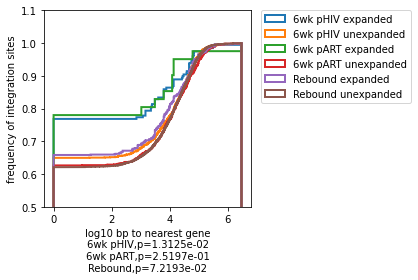

In [553]:
plt.figure(figsize=(6,4))
labels = ''
for time in timelist:
    tdata = combineIS[(combineIS['distance to gene']!=-1)&(combineIS['Timepoint']==time)]
    t1data = tdata[tdata['clonal expanded']]
    t2data = tdata[~tdata['clonal expanded']]
    n1 = list(np.log10(abs(t1data['distance to gene']+1)))+[np.log10(max(abs(combineIS['distance to gene'])))]
    n2 = list(np.log10(abs(t2data['distance to gene']+1)))+[np.log10(max(abs(combineIS['distance to gene'])))]
    plt.hist(n1,label=time+' expanded',bins=1000,lw=2,cumulative=True,density=True,histtype='step')
    plt.hist(n2,label=time+' unexpanded',bins=1000,lw=2,cumulative=True,density=True,histtype='step')
    D,p = ss.kstest(n1,n2)
    labels += ('\n'+time+',p={:.4e}'.format(p))
plt.xlabel('log10 bp to nearest gene'+labels)
plt.ylabel('frequency of integration sites')
ax = plt.gca()
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.ylim(0.5,1.1)
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_gene_CDF_by_time.png',dpi=300)

In [554]:
combineIS.groupby(['Timepoint','clonal expanded']).size()

Timepoint  clonal expanded
6wk pART   False               1238
           True                  40
6wk pHIV   False               1426
           True                 198
Rebound    False              11557
           True                 846
dtype: int64

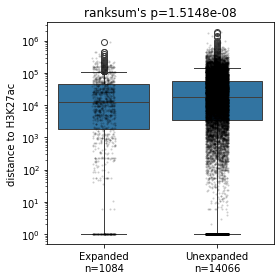

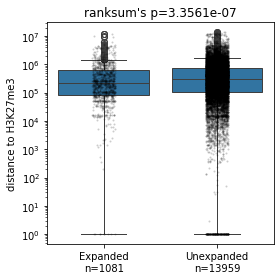

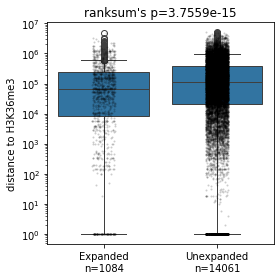

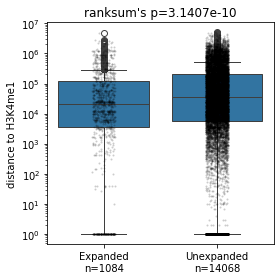

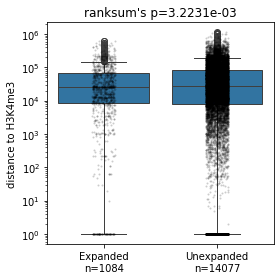

...

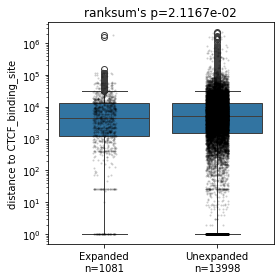

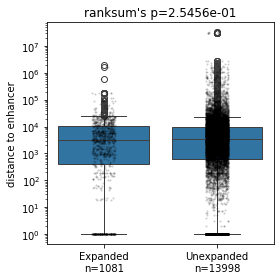

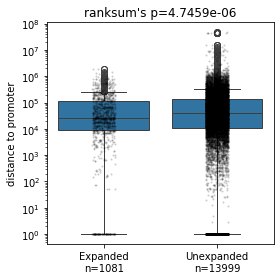

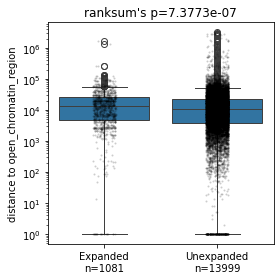

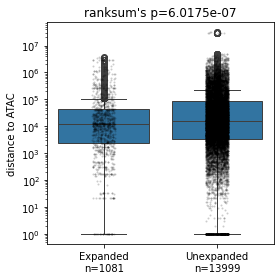

In [555]:
for feature in histonelist+regulist+['ATAC']:
    plt.figure(figsize=(4,4))
    tdata = combineIS[combineIS['distance to '+feature]!=-1]
    ax = sns.boxplot(y=abs(tdata['distance to '+feature]+1),x=tdata['clonal expanded'],order=[True,False])
    sns.stripplot(y=abs(tdata['distance to '+feature]+1),x=tdata['clonal expanded'],order=[True,False],color='black',alpha=0.2,s=2)
    t1data = tdata[tdata['clonal expanded']]
    t2data = tdata[~tdata['clonal expanded']]
    W,p = ss.ranksums(abs(t1data['distance to '+feature]),abs(t2data['distance to '+feature]))
    plt.yscale('log')
    plt.xticks([0,1],['Expanded\nn='+str(len(t1data)),'Unexpanded\nn='+str(len(t2data))])
    plt.xlabel('')
    plt.title('ranksum\'s p={:0.4e}'.format(p))
    plt.tight_layout()
    plt.savefig('figures/IS_expanded_distance_to_'+feature+'.png',dpi=300)

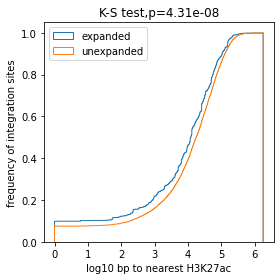

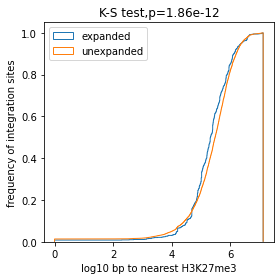

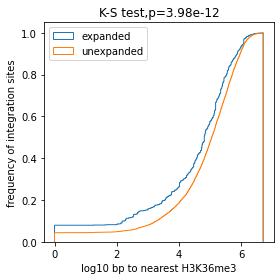

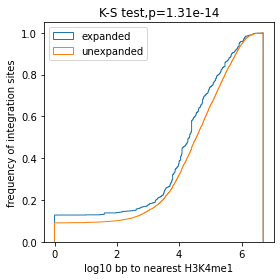

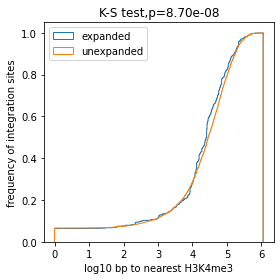

...

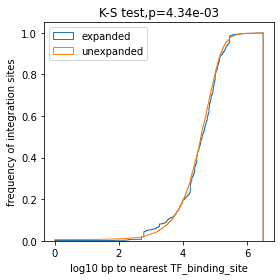

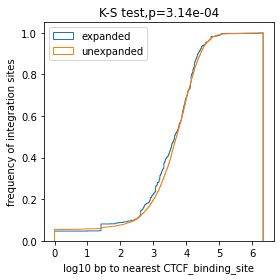

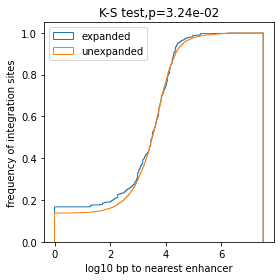

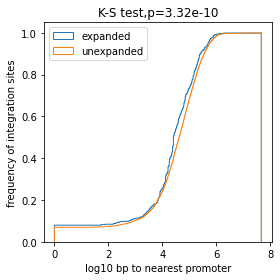

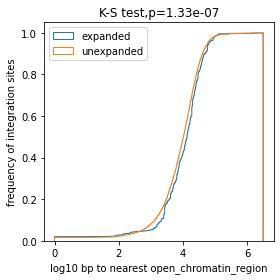

In [556]:
for feature in histonelist+regulist:
    tdata = combineIS[combineIS['distance to '+feature]!=-1]
    t1data = tdata[tdata['clonal expanded']]
    t2data = tdata[~tdata['clonal expanded']]
    plt.figure(figsize=(4,4))
    o1 = list(np.log10(abs(t1data['distance to '+feature]+1)))+[np.log10(max(abs(tdata['distance to '+feature])))]
    o2 = list(np.log10(abs(t2data['distance to '+feature]+1)))+[np.log10(max(abs(tdata['distance to '+feature])))]
    plt.hist(o1,label='expanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
    plt.hist(o2,label='unexpanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
    D,p = ss.kstest(o1,o2)
    plt.title('K-S test,p={:.02e}'.format(p))
    plt.xlabel('log10 bp to nearest '+feature)
    plt.ylabel('frequency of integration sites')
    plt.legend(loc='upper left')
    #plt.ylim(0,1.1)
    plt.tight_layout()
    plt.savefig('figures/IS_expanded_distance_to_'+feature+'_CDF.png',dpi=300)

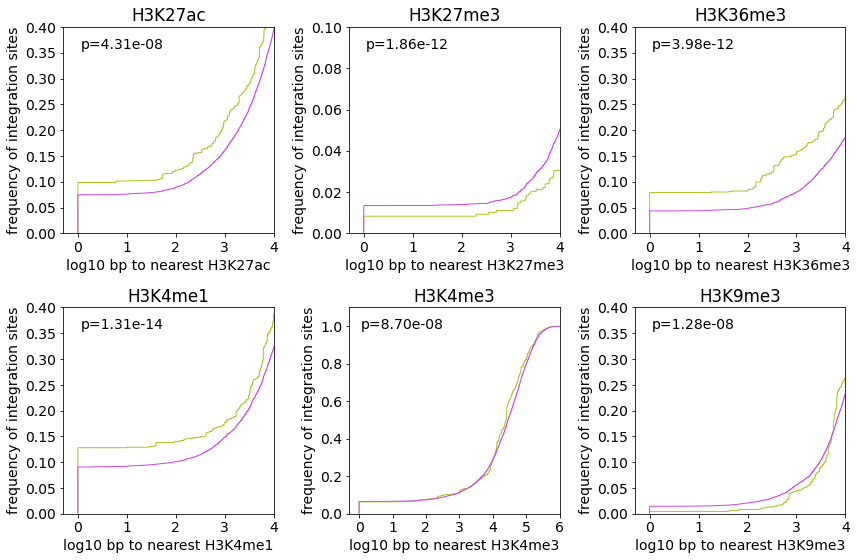

In [557]:
plt.rcParams.update({'font.size': 14})
plt.figure(figsize=(12,8))
ploti = 0
for feature in histonelist:
    ploti += 1
    plt.subplot(2,3,ploti)
    tdata = combineIS[combineIS['distance to '+feature]!=-1]
    t1data = tdata[tdata['clonal expanded']]
    t2data = tdata[~tdata['clonal expanded']]
    o1 = list(np.log10(abs(t1data['distance to '+feature]+1)))+[np.log10(max(abs(tdata['distance to '+feature])))]
    o2 = list(np.log10(abs(t2data['distance to '+feature]+1)))+[np.log10(max(abs(tdata['distance to '+feature])))]
    plt.hist(o1,label='expanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step',color=mycol2[0])
    plt.hist(o2,label='unexpanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step',color=mycol2[1])
    D,p = ss.kstest(o1,o2)
    plt.title(feature)
    plt.xlabel('log10 bp to nearest '+feature)
    plt.ylabel('frequency of integration sites')
    plt.ylim(0,0.4)
    if feature == 'H3K27me3':
        plt.ylim(0,0.1)
    if feature == 'H3K4me3':
        plt.ylim(0,1.1)
    plt.xlim(-0.3,4)
    if feature == 'H3K4me3':
        plt.xlim(-0.3,6)
    plt.text(s='p={:.02e}'.format(p),x=0.05,y=plt.ylim()[1]*0.95,ha='left',va='top')
    #plt.legend()
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_histones_CDF.png',dpi=300)
plt.rcParams.update({'font.size': 10})

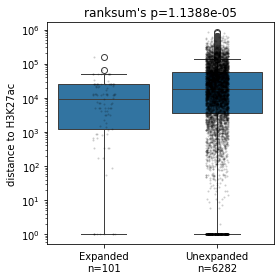

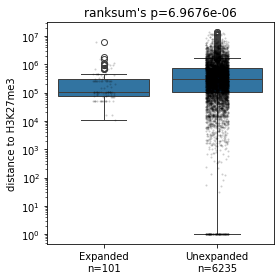

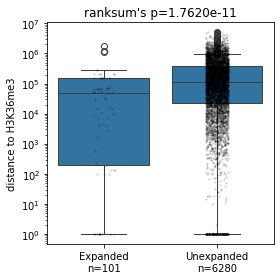

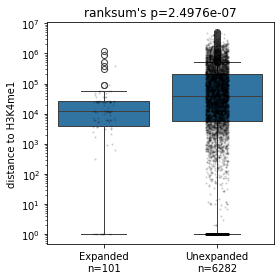

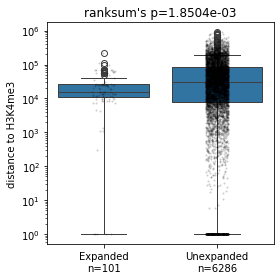

...

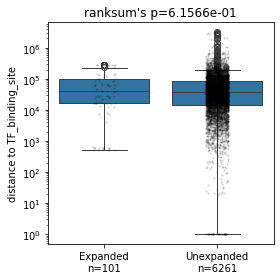

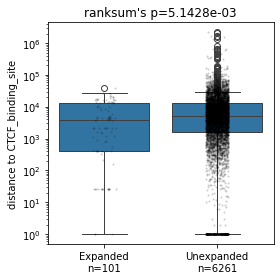

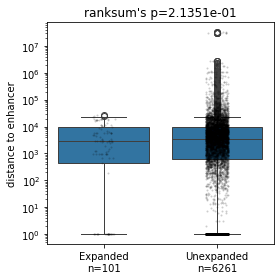

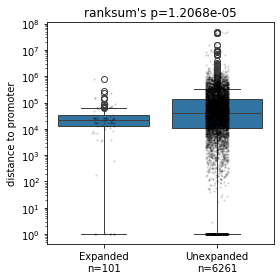

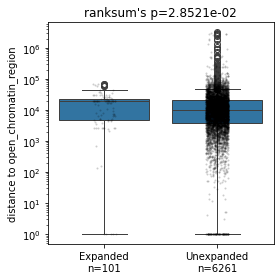

In [558]:
#maybe look at the UMI > 10 group and (UMI == 1 and transcription > 0.5) group. 
for feature in histonelist+regulist:
    plt.figure(figsize=(4,4))
    tdata = combineIS[combineIS['distance to '+feature]!=-1]
    t1data = tdata[tdata['UMI count']>10]
    t2data = tdata[(tdata['transcription']>0.5)&(tdata['UMI count']==1)]
    tdata = tdata[((tdata['transcription']>0.5)&(tdata['UMI count']==1))|(tdata['UMI count']>10)]
    ax = sns.boxplot(y=abs(tdata['distance to '+feature]+1),x=tdata['clonal expanded'],order=[True,False])
    sns.stripplot(y=abs(tdata['distance to '+feature]+1),x=tdata['clonal expanded'],order=[True,False],color='black',alpha=0.2,s=2)
    W,p = ss.ranksums(abs(t1data['distance to '+feature]),abs(t2data['distance to '+feature]))
    plt.yscale('log')
    plt.xticks([0,1],['Expanded\nn='+str(len(t1data)),'Unexpanded\nn='+str(len(t2data))])
    plt.xlabel('')
    plt.title('ranksum\'s p={:0.4e}'.format(p))
    plt.tight_layout()

In [559]:
combineIS[(combineIS['transcription']>0.5)&(combineIS['UMI count']==1)]

,Integration site,UMI count,Mouse,sample name,Timepoint,UDP,barcode,Organ,mapping length,truebc,...,distance to repeats DNA,distance to repeats LINE,distance to repeats LTR,distance to repeats SINE,distance to repeats Satellite,distance to repeats Simple_repeat,in COSMIC genes,in T cell activation genes,in T cell proliferation genes,uniquely expanding
199,chr14:75807173:+,1,03-DMSO,03-DMSO Rebound Spleen,Rebound,UDP02,CTTATAGAGGCCGTAGGCGGAGTCGAGCCTACAA,Spleen,10.0,CTCGACTCCGCCTACGGCCTC,...,1924,-277,22667,0,19111844,1768,False,False,False,False
200,chr5:168423551:-,1,03-DMSO,03-DMSO Rebound Spleen,Rebound,UDP02,CTTATAGAGGCCGTAGGCGGAGTCGAGCCTACAA,Spleen,127.0,CTCGACTCCGCCTACGGCCTC,...,266,-795,2248,181,639650,2684,False,False,False,False
201,chr6:54707992:+,1,03-DMSO,03-DMSO Rebound Spleen,Rebound,UDP02,CTTATAGAGGCCGTAGGCGGAGTCGAGCCTACAA,Spleen,10.0,CTCGACTCCGCCTACGGCCTC,...,-60,582,-201,0,283250,1431,False,False,False,False
202,chr5:11654768:+,1,03-DMSO,03-DMSO Rebound Spleen,Rebound,UDP02,CTTATAGAGGCCGTAGGCGGAGTCGAGCCTACAA,Spleen,18.0,CTCGACTCCGCCTACGGCCTC,...,2016,0,-2318,-4728,-8015421,-1654,True,False,False,False
203,chr18:13076836:+,1,03-DMSO,03-DMSO Rebound Spleen,Rebound,UDP02,CTTATAGAGGCCGTAGGCGGAGTCGAGCCTACAA,Spleen,10.0,CTCGACTCCGCCTACGGCCTC,...,406,933,-1124,0,-990511,5596,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12277,chr9:106802376:+,1,23-DMSO,23-DMSO Rebound Imp,Rebound,UDP37,CTTATAGATGTCGATGAAGGTGAGGATCCTACAA,Implant,129.0,ATCCTCACCTTCATCGACATC,...,237,-521,-2127,-1252,705275,1233,False,False,False,False
12278,chr16:53664336:-,1,23-DMSO,23-DMSO Rebound Imp,Rebound,UDP37,CTTATAGATGTCGATGAAGGTGAGGATCCTACAA,Implant,55.0,ATCCTCACCTTCATCGACATC,...,395,0,13978,3022,-709031,-2183,False,False,False,False
12279,chr14:95882367:+,1,23-DMSO,23-DMSO Rebound Imp,Rebound,UDP37,CTTATAGATGTCGATGAAGGTGAGGATCCTACAA,Implant,41.0,ATCCTCACCTTCATCGACATC,...,1418,1081,5992,-1310,-963234,-5224,False,False,False,False
12280,chr16:63076321:-,1,23-DMSO,23-DMSO Rebound Imp,Rebound,UDP37,CTTATAGATGTCGATGAAGGTGAGGATCCTACAA,Implant,128.0,ATCCTCACCTTCATCGACATC,...,-1397,0,-276,588,8702894,-7683,False,False,False,False


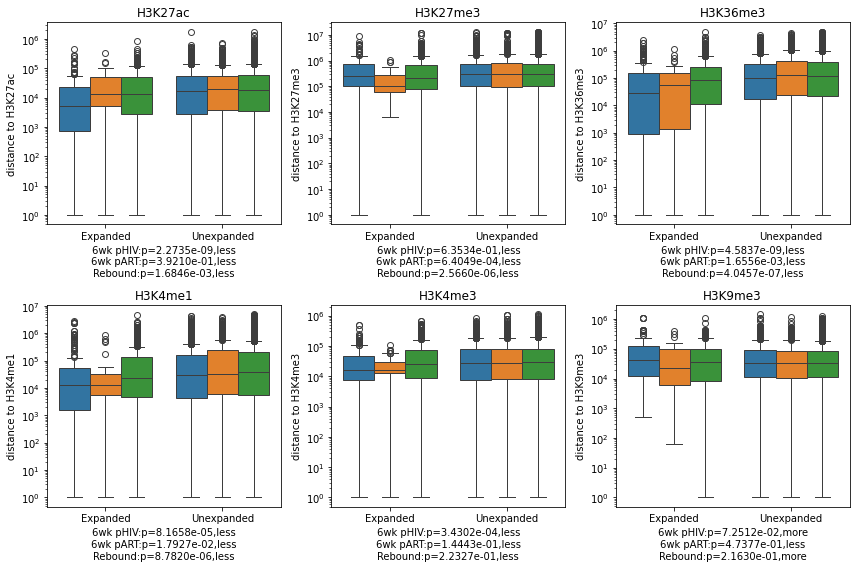

In [560]:
plt.figure(figsize=(12,8))
ploti = 0
for feature in histonelist:
    ploti += 1
    plt.subplot(2,3,ploti)
    tdata = combineIS[combineIS['distance to '+feature]!=-1]
    ax = sns.boxplot(y=abs(tdata['distance to '+feature]+1),x=tdata['clonal expanded'],order=[True,False],hue=tdata['Timepoint'],hue_order=timelist)
    labels = []
    for time in timelist:
        t1data = tdata[(tdata['clonal expanded'])&(tdata['Timepoint']==time)]
        t2data = tdata[(~tdata['clonal expanded'])&(tdata['Timepoint']==time)]
        W,p = ss.ranksums(abs(t1data['distance to '+feature]),abs(t2data['distance to '+feature]))
        if W < 0: 
            direction = 'less'
        else:
            direction = 'more'
        labels.append(time+':p={:.4e}'.format(p)+','+direction)
    plt.yscale('log')
    plt.legend([],[], frameon=False)
    handles, _ = ax.get_legend_handles_labels()
    #l = plt.legend(handles[:3], labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.xticks([0,1],['Expanded','Unexpanded'])
    plt.xlabel('\n'.join(labels))
    plt.title(feature)
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_histone_by_time.png',dpi=300)

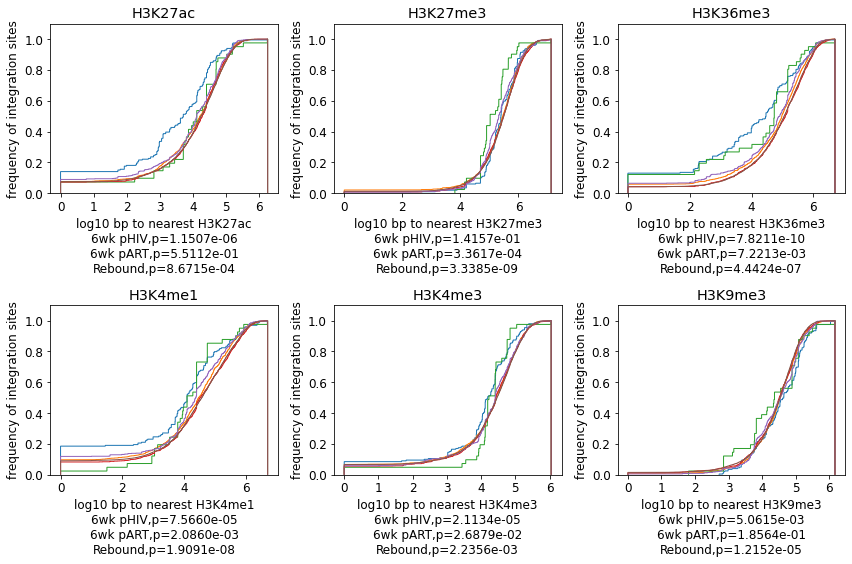

In [561]:
plt.rcParams.update({'font.size': 12})
plt.figure(figsize=(12,8))
ploti = 0
for feature in histonelist:
    ploti += 1
    plt.subplot(2,3,ploti)
    labels = ''
    for time in timelist:
        tdata = combineIS[(combineIS['distance to '+feature]!=-1)&(combineIS['Timepoint']==time)]
        t1data = tdata[tdata['clonal expanded']]
        t2data = tdata[~tdata['clonal expanded']]
        n1 = list(np.log10(abs(t1data['distance to '+feature]+1)))+[np.log10(max(abs(combineIS['distance to '+feature])))]
        n2 = list(np.log10(abs(t2data['distance to '+feature]+1)))+[np.log10(max(abs(combineIS['distance to '+feature])))]
        plt.hist(n1,label=time+' expanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
        plt.hist(n2,label=time+' unexpanded',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
        D,p = ss.kstest(n1,n2)
        labels += ('\n'+time+',p={:.4e}'.format(p))
    plt.xlabel('log10 bp to nearest '+feature+labels)
    plt.ylabel('frequency of integration sites')
    ax = plt.gca()
    plt.legend([],[], frameon=False)
    handles, labels = ax.get_legend_handles_labels()
    plt.title(feature)
    #l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.ylim(0,1.1)
plt.tight_layout()
plt.savefig('figures/IS_expanded_distance_to_histones_CDF_by_time.png',dpi=300)
plt.rcParams.update({'font.size': 10})

## Integration site analysis on active/inactive provirus

In [562]:
combineIS['is active'] = combineIS['transcription'].apply(lambda x:True if x > 0 else False)

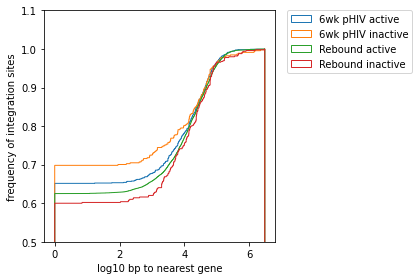

In [563]:
plt.figure(figsize=(6,4))
for time in ['6wk pHIV','Rebound']:
    tdata = combineIS[(combineIS['distance to gene']!=-1)&(combineIS['Timepoint']==time)]
    t1data = tdata[tdata['is active']]
    t2data = tdata[~tdata['is active']]
    plt.hist(list(np.log10(abs(t1data['distance to gene']+1)))+[np.log10(max(abs(combineIS['distance to gene'])))],label=time+' active',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
    plt.hist(list(np.log10(abs(t2data['distance to gene']+1)))+[np.log10(max(abs(combineIS['distance to gene'])))],label=time+' inactive',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
plt.xlabel('log10 bp to nearest gene')
plt.ylabel('frequency of integration sites')
ax = plt.gca()
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.ylim(0.5,1.1)
plt.tight_layout()
plt.savefig('figures/IS_active_distance_to_gene_CDF_by_time.png',dpi=300)

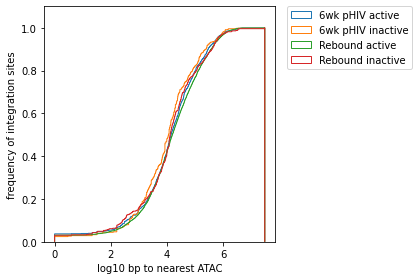

In [564]:
plt.figure(figsize=(6,4))
for time in ['6wk pHIV','Rebound']:
    tdata = combineIS[(combineIS['distance to ATAC']!=-1)&(combineIS['Timepoint']==time)]
    t1data = tdata[tdata['is active']]
    t2data = tdata[~tdata['is active']]
    plt.hist(list(np.log10(abs(t1data['distance to ATAC']+1)))+[np.log10(max(abs(combineIS['distance to ATAC'])))],label=time+' active',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
    plt.hist(list(np.log10(abs(t2data['distance to ATAC']+1)))+[np.log10(max(abs(combineIS['distance to ATAC'])))],label=time+' inactive',bins=1000,lw=1,cumulative=True,density=True,histtype='step')
plt.xlabel('log10 bp to nearest ATAC')
plt.ylabel('frequency of integration sites')
ax = plt.gca()
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.ylim(0,1.1)
plt.tight_layout()
plt.savefig('figures/IS_active_distance_to_ATAC_CDF_by_time.png',dpi=300)

## Deeptool analysis

In [565]:
outfile = open('bed/IS_combined_forDeeptool.bed','w')
for i,row in combineIS.iterrows():
    if 'chr' in row['Integration site']:
        record = row['Integration site'].rsplit(':')
        outfile.write(record[0]+'\t'+record[1]+'\t'+str(int(record[1])+1)+'\t'+str(i)+'\t'+str(row['UMI count'])+'\t'+record[2]+'\n')
outfile.close()

In [566]:
#!computeMatrix reference-point -S ../../database/Encode/CD4T_ATAC_ENCFF758GJG.bigWig \
#                               -R bed/IS_combined_forDeeptool.bed \
#                               -a 3000 -b 3000 -o bed/IS_ATAC.mat

In [567]:
!plotHeatmap -m bed/IS_ATAC.mat -out figures/IS_ATAC_heatmap.png \
             --heatmapHeight 15 --refPointLabel IS --regionsLabel ATAC --plotTitle 'ATAC-peaks' 

zsh:1: command not found: plotHeatmap


In [568]:
#!computeMatrix reference-point -S ../../database/Encode/CD4T_ATAC_ENCFF758GJG.bigWig \
#                                  ../../database/Encode/CD4T_H3K27ac_ENCFF555FVK.bigWig \
#                                  ../../database/Encode/CD4T_H3K9me3_ENCFF444LCL.bigWig \
#                                  ../../database/Encode/CD4T_H3K36me3_ENCFF893YKF.bigWig \
#                                  ../../database/Encode/CD4T_H3K4me3_ENCFF221XWN.bigWig \
#                               -R bed/IS_combined_forDeeptool.bed \
#                               -a 3000 -b 3000 -o bed/IS_ATAC_and_H3.mat

In [569]:
!plotHeatmap -m bed/IS_ATAC_and_H3.mat -out figures/IS_ATAC_and_H3_heatmap.png \
             --heatmapHeight 15 --refPointLabel IS --regionsLabel IS --plotTitle 'ATAC and H3 peaks' 

zsh:1: command not found: plotHeatmap


<img src="figures/IS_ATAC_and_H3_heatmap.png" alt="IS_ATAC_and_H3" style="width: 300px;" align="left"/>

I am going to make this profile plots for   
- expanding/non-expanding  
- transcribing/non-transcribing  
- different time points  
- different organ  
- expanding * time points  
- expanding * organs  

In [570]:
def print_deepfile(fileacc,tdata):
    outfile = open('bed/IS_combined_forDeeptool_'+fileacc+'.bed','w')
    for i,row in tdata.iterrows():
        if 'chr' in row['Integration site']:
            record = row['Integration site'].rsplit(':')
            outfile.write(record[0]+'\t'+record[1]+'\t'+str(int(record[1])+1)+'\t'+str(i)+'\t'+str(row['UMI count'])+'\t'+record[2]+'\n')
    outfile.close()
    
tdata = combineIS[combineIS['UMI count']>1]
print_deepfile('expanding',tdata)
tdata = combineIS[combineIS['UMI count']==1]
print_deepfile('non-expanding',tdata)
tdata = combineIS[combineIS['transcription']>0]
print_deepfile('transcribing',tdata)
tdata = combineIS[combineIS['transcription']==0]
print_deepfile('non-transcribing',tdata)
for time in timelist:
    tdata = combineIS[combineIS['Timepoint']==time]
    print_deepfile(time,tdata)
    tdata = combineIS[(combineIS['Timepoint']==time)&(combineIS['UMI count']>1)]
    print_deepfile(time+'_expanding',tdata)
    tdata = combineIS[(combineIS['Timepoint']==time)&(combineIS['UMI count']==1)]
    print_deepfile(time+'_non-expanding',tdata)
for organ in organlist:
    tdata = combineIS[combineIS['Organ']==organ]
    print_deepfile(organ,tdata)
    tdata = combineIS[(combineIS['Organ']==organ)&(combineIS['UMI count']>1)]
    print_deepfile(organ+'_expanding',tdata)
    tdata = combineIS[(combineIS['Organ']==organ)&(combineIS['UMI count']==1)]
    print_deepfile(organ+'_non-expanding',tdata)

In [571]:
#!computeMatrix reference-point -S ../../database/Encode/CD4T_ATAC_ENCFF758GJG.bigWig \
#                               -R bed/IS_combined_forDeeptool_expanding.bed \
#                                  bed/IS_combined_forDeeptool_non-expanding.bed \
#                               -a 3000 -b 3000 -o bed/IS_ATAC_expanding.mat
!plotHeatmap -m bed/IS_ATAC_expanding.mat -out figures/IS_ATAC_expanding_heatmap.png \
             --heatmapHeight 15 --refPointLabel IS --regionsLabel expanding, "non-expanding" --plotTitle 'expansion' 

zsh:1: command not found: plotHeatmap


<img src="figures/IS_ATAC_expanding_heatmap.png" alt="IS_ATAC" style="width: 300px;" align="left"/>

In [572]:
!plotProfile -m bed/IS_ATAC_expanding.mat -out figures/IS_ATAC_expanding_profile.pdf \
            --refPointLabel IS --regionsLabel expanded, "non-expanded" --plotTitle '' \
            --colors "#A9C838" "#A45CA4" --samplesLabel ATAC --plotWidth 6

zsh:1: command not found: plotProfile


<img src="figures/IS_ATAC_expanding_profile.png" alt="IS_ATAC" style="width: 300px;" align="left"/>

In [573]:
!plotHeatmap -m bed/IS_ATAC_expanding.mat -out figures/IS_ATAC_expanding_heatmap.pdf \
             --heatmapHeight 15 --refPointLabel IS --regionsLabel expanded "non-expanded" --plotTitle '' \
             --colorMap coolwarm --samplesLabel ATAC --whatToShow "heatmap and colorbar"

zsh:1: command not found: plotHeatmap


In [574]:
#!computeMatrix reference-point -S ../../database/Encode/CD4T_H3K27ac_ENCFF555FVK.bigWig \
#                               -R bed/IS_combined_forDeeptool_expanding.bed \
#                                  bed/IS_combined_forDeeptool_non-expanding.bed \
#                               -a 5000 -b 5000 -o bed/IS_H3K27ac_expanding.mat

In [575]:
!plotProfile -m bed/IS_H3K27ac_expanding.mat -out figures/IS_H3K27ac_expanding_profile.pdf \
            --refPointLabel IS --regionsLabel expanded, "non-expanded" --plotTitle '' \
            --colors "#A9C838" "#A45CA4" --samplesLabel H3K27ac --plotWidth 6

zsh:1: command not found: plotProfile


In [576]:
!plotHeatmap -m bed/IS_H3K27ac_expanding.mat -out figures/IS_H3K27ac_expanding_heatmap.pdf \
             --heatmapHeight 15 --refPointLabel IS --regionsLabel expanded "non-expanded" --plotTitle '' \
             --colorMap coolwarm --samplesLabel H3K27ac --whatToShow "heatmap and colorbar"

zsh:1: command not found: plotHeatmap


In [577]:
#!computeMatrix reference-point -S ../../database/Encode/CD4T_ATAC_ENCFF758GJG.bigWig \
#                                  ../../database/Encode/CD4T_H3K27ac_ENCFF555FVK.bigWig \
#                                  ../../database/Encode/CD4T_H3K9me3_ENCFF444LCL.bigWig \
#                                  ../../database/Encode/CD4T_H3K36me3_ENCFF893YKF.bigWig \
#                               -R bed/IS_combined_forDeeptool_expanding.bed \
#                                  bed/IS_combined_forDeeptool_non-expanding.bed \
#                               -a 5000 -b 5000 -o bed/IS_ATAC_and_H3_expanding.mat

In [578]:
!plotProfile -m bed/IS_ATAC_and_H3_expanding.mat -out figures/IS_ATAC_and_H3_expanding_profile.pdf \
            --refPointLabel IS --regionsLabel expanded, "non-expanded" --plotTitle '' \
            --colors "#A9C838" "#A45CA4" --samplesLabel ATAC H3K27ac H3K9me3 H3K36me3  --plotWidth 6

zsh:1: command not found: plotProfile


In [579]:
!plotHeatmap -m bed/IS_ATAC_and_H3_expanding.mat -out figures/IS_ATAC_and_H3_expanding_heatmap.pdf \
             --heatmapHeight 15 --refPointLabel IS --regionsLabel expanded "non-expanded" --plotTitle '' \
             --colorMap coolwarm --samplesLabel ATAC H3K27ac H3K9me3 H3K36me3 --whatToShow "heatmap and colorbar"

zsh:1: command not found: plotHeatmap


In [580]:
for histone in histonelist:
    !computeMatrix reference-point -S ../../database/Encode/naive/{histone}_*.bigWig \
                                   -R bed/IS_combined_forDeeptool_expanding.bed \
                                      bed/IS_combined_forDeeptool_non-expanding.bed \
                                   -a 5000 -b 5000 -o bed/naive_{histone}.mat
    !plotProfile -m bed/naive_{histone}.mat -out figures/IS_naive_{histone}_expanding_profile.pdf \
                --refPointLabel IS --regionsLabel expanded, "non-expanded" --plotTitle '' \
                --colors "#A9C838" "#A45CA4" --samplesLabel {histone} --plotWidth 6
    !plotHeatmap -m bed/naive_{histone}.mat -out figures/IS_naive_{histone}_expanding_heatmap.pdf \
                 --heatmapHeight 15 --refPointLabel IS --regionsLabel expanded "non-expanded" --plotTitle '' \
                 --colorMap coolwarm --samplesLabel {histone}  --whatToShow "heatmap and colorbar"

zsh:1: command not found: computeMatrix
zsh:1: command not found: plotProfile
zsh:1: command not found: plotHeatmap
zsh:1: command not found: computeMatrix
zsh:1: command not found: plotProfile
zsh:1: command not found: plotHeatmap
zsh:1: command not found: computeMatrix
zsh:1: command not found: plotProfile
zsh:1: command not found: plotHeatmap
zsh:1: command not found: computeMatrix
zsh:1: command not found: plotProfile
zsh:1: command not found: plotHeatmap
zsh:1: command not found: computeMatrix
zsh:1: command not found: plotProfile
zsh:1: command not found: plotHeatmap
zsh:1: command not found: computeMatrix
zsh:1: command not found: plotProfile
zsh:1: command not found: plotHeatmap


### Hi-C analysis

In [581]:
for haplo in ['A','B']:
    tdata = pd.read_csv('../../database/HiC/noLAD/ENCFF958DWQ_distance_'+haplo+'.bed',sep='\t',names=['chrom','start','end','name','score','strand'])
    tdata['new_chrom'] = tdata['chrom'].apply(lambda x:x[3:])
    tdata[['new_chrom','start','end','name','score','strand']].to_csv('bed/ENCFF958DWQ_distance_haplo'+haplo+'.bed',sep='\t',index=False,header=False)
    !bedtools sort -i bed/ENCFF958DWQ_distance_haplo{haplo}.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/ENCFF958DWQ_distance_haplo{haplo}.sort.bed

In [582]:
for haplo in ['A','B']:
    !bedtools closest -D b -b bed/ENCFF958DWQ_distance_haplo{haplo}.sort.bed -a bed/IS_combined_sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_ENCFF958DWQ_haplo{haplo}.bed
    interdata = pd.read_csv('bed/IS_combined_ENCFF958DWQ_haplo'+haplo+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','chrom3D_id','radial distance','strand2','distance'])
    combineIS['radial distance (haplo'+haplo+')'] = combineIS.index.map(lambda x:interdata[interdata['row number']==x]['radial distance'].iloc[0]/5)

In [583]:
def generate_block_name(x):
    tdata = interdata[interdata['row number']==x].iloc[0]
    if tdata['chrom2']=='.': return np.nan
    return 'chr'+str(tdata['chrom2'])+'_A:'+str(tdata['start'])+'-'+str(tdata['end'])

combineIS['Hi-C block'] = combineIS.index.map(lambda x:generate_block_name(x))

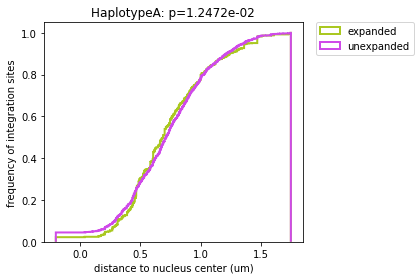

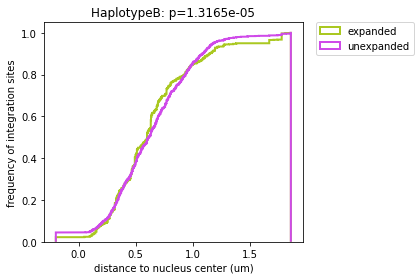

In [584]:
for haplo in ['A','B']:
    tdata = combineIS[combineIS['radial distance (haplo'+haplo+')']!=-1]
    plt.figure(figsize=(6,4))
    t1data = tdata[tdata['clonal expanded']]
    t2data = tdata[~tdata['clonal expanded']]
    o1 = list(t1data['radial distance (haplo'+haplo+')'])
    o2 = list(t2data['radial distance (haplo'+haplo+')'])
    plt.hist(o1,label='expanded',bins=1000,lw=2,cumulative=True,density=True,histtype='step',color=mycol2[0])
    plt.hist(o2,label='unexpanded',bins=1000,lw=2,cumulative=True,density=True,histtype='step',color=mycol2[1])
    D,p = ss.kstest(o1,o2)
    plt.xlabel('log10 bp to nearest gene')
    plt.ylabel('frequency of integration sites')
    ax = plt.gca()
    plt.legend([],[], frameon=False)
    handles, labels = ax.get_legend_handles_labels()
    l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.ylabel('frequency of integration sites')
    plt.xlabel('distance to nucleus center (um)')
    plt.title('Haplotype'+haplo+': p={:.4e}'.format(p))
    plt.tight_layout()
    plt.savefig('figures/CDF_expansion_radial_distance_'+haplo+'.png',dpi=300)

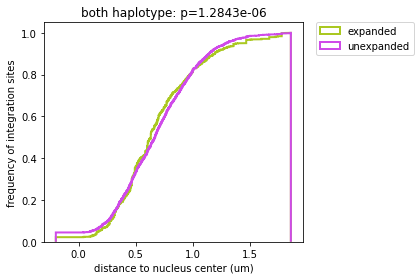

In [585]:
    tdata = combineIS[combineIS['radial distance (haploA)']!=-1]
    plt.figure(figsize=(6,4))
    t1data = tdata[tdata['clonal expanded']]
    t2data = tdata[~tdata['clonal expanded']]
    o1 = list(t1data['radial distance (haploA)'])+list(t1data['radial distance (haploB)'])
    o2 = list(t2data['radial distance (haploA)'])+list(t2data['radial distance (haploB)'])
    plt.hist(o1,label='expanded',bins=1000,lw=2,cumulative=True,density=True,histtype='step',color=mycol2[0])
    plt.hist(o2,label='unexpanded',bins=1000,lw=2,cumulative=True,density=True,histtype='step',color=mycol2[1])
    D,p = ss.kstest(o1,o2)
    plt.xlabel('log10 bp to nearest gene')
    plt.ylabel('frequency of integration sites')
    ax = plt.gca()
    plt.legend([],[], frameon=False)
    handles, labels = ax.get_legend_handles_labels()
    l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.ylabel('frequency of integration sites')
    plt.xlabel('distance to nucleus center (um)')
    plt.title('both haplotype: p={:.4e}'.format(p))
    plt.tight_layout()
    plt.savefig('figures/CDF_expansion_radial_distance_combined.png',dpi=300)

In [586]:
#give an rgb color for nucleus structure model markers according to IS density/UMI_per_IS/transcription on it.
def generate_block_name(x):
    return x['chrom']+'_A:'+str(x['start'])+'-'+str(x['end'])

def count_per_block(x):
    block = x['block']
    tdata = combineIS[combineIS['Hi-C block']==block]
    x['IS count'] = len(tdata)
    x['UMI count'] = sum(tdata['UMI count'])
    if len(tdata) == 0:
        x['transcription'] = 1e-4
    else:
        x['transcription'] = ss.gmean(tdata['transcription']+1e-4)
    return x


hicdata = pd.read_csv('../../database/HiC/noLAD/ENCFF958DWQ_distance_'+haplo+'.bed',sep='\t',names=['chrom','start','end','name','score','strand'])
hicdata['block'] = hicdata.apply(lambda x:generate_block_name(x),axis=1)
hicdata = hicdata.apply(count_per_block,axis=1)
hicdata['block length'] = hicdata.apply(lambda x:x['end']-x['start'],axis=1)
hicdata['IS per kb'] = hicdata.apply(lambda x:x['IS count']/x['block length']*1000,axis=1)  #visualization parameter
hicdata['UMI per IS'] = hicdata.apply(lambda x:x['UMI count']/x['IS count'] if x['IS count']!=0 else 1,axis=1) #visualization parameter
#and hicdata['transcription'] is also for visualization

In [587]:
#transcription can log-linearly projects to color codes
#IS per kb can log-linearly projects to color codes
#UMI per IS is mostly 1, may need special scaling.
hicdata['radial distance'] = hicdata['score']/1
hicdata.to_csv('ENCFF958DWQ_IS_annotated.csv',index=False)
hicdata

,chrom,start,end,name,score,strand,block,IS count,UMI count,transcription,block length,IS per kb,UMI per IS,radial distance
0,chr10,0,3190000,149,5.727432,+,chr10_A:0-3190000,34,49,0.201176,3190000,0.010658,1.441176,5.727432
1,chr10,3190000,4685000,150,5.429405,+,chr10_A:3190000-4685000,12,20,0.125448,1495000,0.008027,1.666667,5.429405
2,chr10,4685000,5995000,151,5.576861,+,chr10_A:4685000-5995000,7,7,0.088869,1310000,0.005344,1.000000,5.576861
3,chr10,5995000,6090000,152,5.602870,+,chr10_A:5995000-6090000,1,1,0.975271,95000,0.010526,1.000000,5.602870
4,chr10,6090000,6100000,153,5.551035,+,chr10_A:6090000-6100000,0,0,0.000100,10000,0.000000,1.000000,5.551035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2553,chr9,130050000,131200000,5111,1.249275,+,chr9_A:130050000-131200000,11,11,0.254491,1150000,0.009565,1.000000,1.249275
2554,chr9,131200000,131295000,5112,1.452111,+,chr9_A:131200000-131295000,2,2,0.003285,95000,0.021053,1.000000,1.452111
2555,chr9,131295000,132405000,5113,1.421304,+,chr9_A:131295000-132405000,10,10,0.064817,1110000,0.009009,1.000000,1.421304
2556,chr9,132405000,132940000,5114,1.659067,+,chr9_A:132405000-132940000,6,87,0.000320,535000,0.011215,14.500000,1.659067


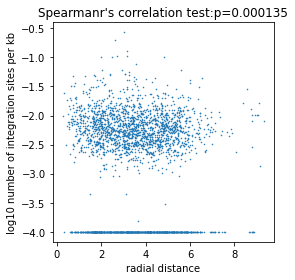

In [588]:
plt.figure(figsize=(4,4))
plt.scatter(hicdata['radial distance'],np.log10(hicdata['IS per kb']+1e-4),s=0.3)
tdata = hicdata[hicdata['IS per kb']>0]
rho,p=ss.spearmanr(np.log10(tdata['IS per kb']),tdata['radial distance'])
plt.xlabel('radial distance')
plt.ylabel('log10 number of integration sites per kb')
plt.title('Spearmanr\'s correlation test:p={:.3}'.format(p))
plt.tight_layout()
plt.savefig('figures/radial_distance_integration.png',dpi=300)

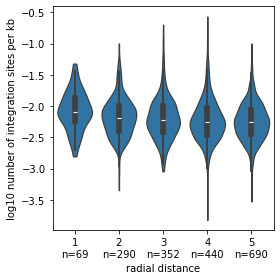

In [589]:
def quantile_distance(x):
    for rad in range(1,6):
        if x < rad:
            return rad
    return 5

hicdata['radial quantile'] = hicdata['radial distance'].apply(lambda x:quantile_distance(x))
plt.figure(figsize=(4,4))
tdata = hicdata[hicdata['IS per kb']>0]
sns.violinplot(x=tdata['radial quantile'],y=np.log10(tdata['IS per kb']+1e-4),cut=0)
plt.xlabel('radial distance')
plt.ylabel('log10 number of integration sites per kb')
xticks = []
for rad in range(1,6):
    xticks.append(str(rad)+'\nn='+str(len(tdata[tdata['radial quantile']==rad])))
plt.xticks(range(5),xticks)
#plt.title('Spearmanr\'s correlation test:p={:.3}'.format(p))
plt.tight_layout()
plt.savefig('figures/radial_distance_quantile_integration.png',dpi=300)

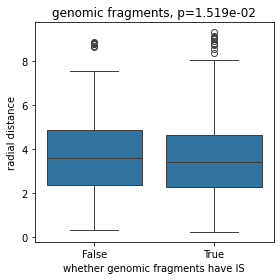

In [590]:
hicdata['has_IS'] = hicdata['IS per kb'].apply(lambda x: True if x>0 else False)
plt.figure(figsize=(4,4))
sns.boxplot(x=hicdata['has_IS'],y=hicdata['radial distance'])
plt.ylabel('radial distance')
plt.xlabel('whether genomic fragments have IS')
W,p = ss.ranksums(hicdata[hicdata['has_IS']]['radial distance'],hicdata[~hicdata['has_IS']]['radial distance'])
plt.title('genomic fragments, p={:.3e}'.format(p))
plt.tight_layout()
plt.savefig('figures/radial_distance_whether_has_IS.png',dpi=300)

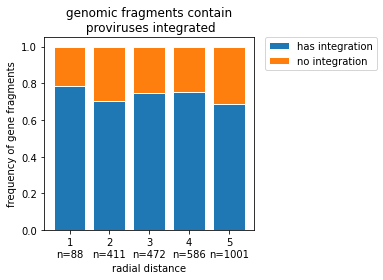

In [591]:
plt.figure(figsize=(5.5,4))
bottomlist = [0]*5
ylist = []
for rad in range(1,6):
    tdata = hicdata[hicdata['radial quantile']==rad]
    ylist.append(len(tdata[tdata['IS per kb']>0])/len(tdata))   
plt.bar(x=range(1,6),height=ylist,edgecolor='white',label='has integration')
for rad in range(1,6):
    bottomlist[rad-1] = ylist[rad-1]
    tdata = hicdata[hicdata['radial quantile']==rad]
    ylist[rad-1] = (len(tdata[tdata['IS per kb']==0])/len(tdata)) 
plt.bar(x=range(1,6),height=ylist,bottom=bottomlist,edgecolor='white',label='no integration')
plt.ylabel('frequency of gene fragments')
plt.xlabel('radial distance')
xticks = []
for rad in range(1,6):
    xticks.append(str(rad)+'\nn='+str(len(hicdata[hicdata['radial quantile']==rad])))
plt.xticks(range(1,6),xticks)
plt.title('genomic fragments contain\n proviruses integrated')
ax = plt.gca()
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.savefig('figures/radial_distance_quantile_frequency_integration.png',dpi=300)

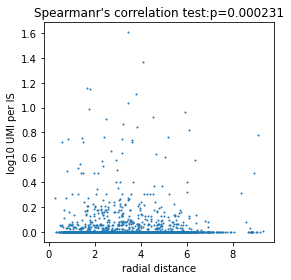

In [592]:
plt.figure(figsize=(4,4))
plt.scatter(hicdata['radial distance'],np.log10(hicdata['UMI per IS']+1e-4),s=1)
tdata = hicdata
rho,p=ss.spearmanr(np.log10(tdata['UMI per IS']),tdata['radial distance'])
plt.xlabel('radial distance')
plt.ylabel('log10 UMI per IS')
plt.title('Spearmanr\'s correlation test:p={:.3}'.format(p))
plt.tight_layout()
plt.savefig('figures/radial_distance_UMI_per_IS.png',dpi=300)

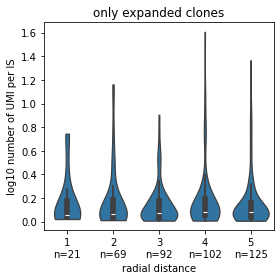

In [593]:
plt.figure(figsize=(4,4))
tdata = hicdata[hicdata['UMI per IS']>1]
sns.violinplot(x=tdata['radial quantile'],y=np.log10(tdata['UMI per IS']),cut=0)
plt.xlabel('radial distance')
plt.ylabel('log10 number of UMI per IS')
xticks = []
for rad in range(1,6):
    xticks.append(str(rad)+'\nn='+str(len(tdata[tdata['radial quantile']==rad])))
plt.xticks(range(5),xticks)
plt.title('only expanded clones')
plt.tight_layout()
plt.savefig('figures/radial_distance_quantile_expansion.png',dpi=300)

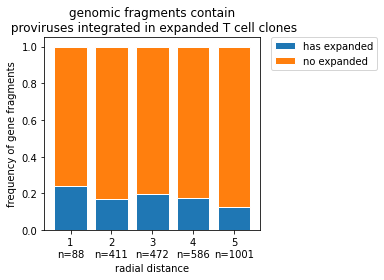

In [594]:
plt.figure(figsize=(5.5,4))
bottomlist = [0]*5
ylist = []
for rad in range(1,6):
    tdata = hicdata[hicdata['radial quantile']==rad]
    ylist.append(len(tdata[tdata['UMI per IS']>1])/len(tdata))   
plt.bar(x=range(1,6),height=ylist,edgecolor='white',label='has expanded')
for rad in range(1,6):
    bottomlist[rad-1] = ylist[rad-1]
    tdata = hicdata[hicdata['radial quantile']==rad]
    ylist[rad-1] = (len(tdata[tdata['UMI per IS']==1])/len(tdata)) 
plt.bar(x=range(1,6),height=ylist,bottom=bottomlist,edgecolor='white',label='no expanded')
plt.ylabel('frequency of gene fragments')
plt.xlabel('radial distance')
xticks = []
for rad in range(1,6):
    xticks.append(str(rad)+'\nn='+str(len(hicdata[hicdata['radial quantile']==rad])))
plt.xticks(range(1,6),xticks)
plt.title('genomic fragments contain\n proviruses integrated in expanded T cell clones')
ax = plt.gca()
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.savefig('figures/radial_distance_quantile_frequency_expanded.png',dpi=300)

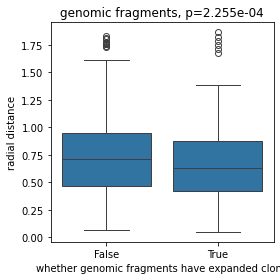

In [595]:
hicdata['clonally expanded'] = hicdata['UMI per IS'].apply(lambda x: True if x>1 else False)
plt.figure(figsize=(4,4))
sns.boxplot(x=hicdata['clonally expanded'],y=hicdata['score']/5)
plt.ylabel('radial distance')
plt.xlabel('whether genomic fragments have expanded clone')
W,p = ss.ranksums(hicdata[hicdata['clonally expanded']]['score'],hicdata[~hicdata['clonally expanded']]['score'])
plt.title('genomic fragments, p={:.3e}'.format(p))
plt.tight_layout()
plt.savefig('figures/radial_distance_whether_has_UMI_per_IS_morethan1.png',dpi=300)

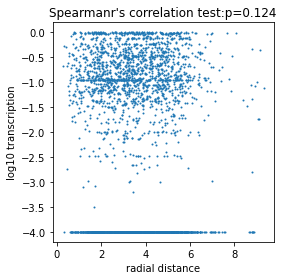

In [596]:
plt.figure(figsize=(4,4))
plt.scatter(hicdata['radial distance'],np.log10(hicdata['transcription']),s=1)
tdata = hicdata[hicdata['transcription']>0]
rho,p=ss.spearmanr(np.log10(tdata['transcription']),tdata['radial distance'])
plt.xlabel('radial distance')
plt.ylabel('log10 transcription')
plt.title('Spearmanr\'s correlation test:p={:.3}'.format(p))
plt.tight_layout()
plt.savefig('figures/radial_distance_transcription.png',dpi=300)

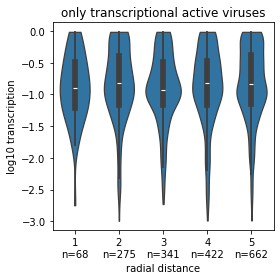

In [597]:
plt.figure(figsize=(4,4))
tdata = hicdata[hicdata['transcription']>1e-3]
sns.violinplot(x=tdata['radial quantile'],y=np.log10(tdata['transcription']),cut=0)
plt.xlabel('radial distance')
plt.ylabel('log10 transcription')
xticks = []
for rad in range(1,6):
    xticks.append(str(rad)+'\nn='+str(len(tdata[tdata['radial quantile']==rad])))
plt.xticks(range(5),xticks)
plt.title('only transcriptional active viruses')
plt.tight_layout()
plt.savefig('figures/radial_distance_quantile_transcription.png',dpi=300)

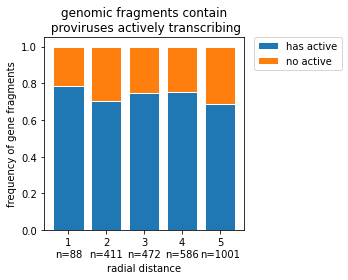

In [598]:
plt.figure(figsize=(5,4))
bottomlist = [0]*5
ylist = []
for rad in range(1,6):
    tdata = hicdata[hicdata['radial quantile']==rad]
    ylist.append(len(tdata[tdata['transcription']>1e-4])/len(tdata))   
plt.bar(x=range(1,6),height=ylist,edgecolor='white',label='has active')
for rad in range(1,6):
    bottomlist[rad-1] = ylist[rad-1]
    tdata = hicdata[hicdata['radial quantile']==rad]
    ylist[rad-1] = (len(tdata[tdata['transcription']==1e-4])/len(tdata)) 
plt.bar(x=range(1,6),height=ylist,bottom=bottomlist,edgecolor='white',label='no active')
plt.ylabel('frequency of gene fragments')
plt.xlabel('radial distance')
xticks = []
for rad in range(1,6):
    xticks.append(str(rad)+'\nn='+str(len(hicdata[hicdata['radial quantile']==rad])))
plt.xticks(range(1,6),xticks)
plt.title('genomic fragments contain\n proviruses actively transcribing')
ax = plt.gca()
plt.legend([],[], frameon=False)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.savefig('figures/radial_distance_quantile_frequency_transcription.png',dpi=300)

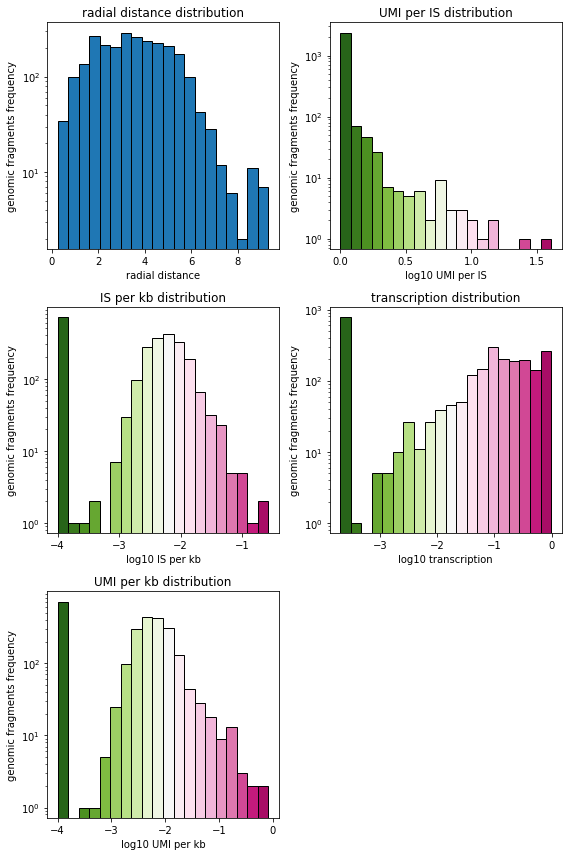

In [599]:
hicdata['UMI per kb'] = hicdata.apply(lambda x:x['UMI count']/x['block length']*1000,axis=1)
plt.figure(figsize=(8,12))
ploti = 0
for feature in ['radial distance','UMI per IS','IS per kb','transcription','UMI per kb']:
    ploti += 1
    plt.subplot(3,2,ploti)
    if feature == 'radial distance':
        plt.hist(hicdata[feature],bins=20,edgecolor='black')
        plt.xlabel(feature)
    else:
        n, bins, patches = plt.hist(np.log10(hicdata[feature]+1e-4),bins=20,edgecolor='black')
        col = [plt.cm.PiYG_r(x/20.) for x in range(20)]
        for c, p in zip(col, patches):
            plt.setp(p, 'facecolor', c)
        plt.xlabel('log10 '+feature)
    plt.ylabel('genomic fragments frequency')
    plt.yscale('log')    
    plt.title(feature+' distribution')
plt.tight_layout()
plt.savefig('figures/hicdata_feature_distribution.png',dpi=300)

In [600]:
hicdata.to_csv('genomic_fragments.csv')

### 200 features analysis!

Roadmap, Encode, chromHMM

In [601]:
#chromHMM was learned on hg19 and lifted to hg38.
hmmdata = pd.read_csv('../../database/chromHMM/hg38lift_genome_100_segments.bed',sep='\t',names=['chrom','start','end','annot'])
hmmdata

,chrom,start,end,annot
0,chr1,10000,10400,1_GapArtf2
1,chr1,10400,10600,26_Acet1
2,chr1,10600,10800,37_EnhWk4
3,chr1,10800,12800,0_GapArtf1
4,chr1,12800,13000,37_EnhWk4
...,...,...,...,...
6099633,chrY,56886253,56886453,12_HET5
6099634,chrY,56886453,56886853,1_GapArtf2
6099635,chrY,56886853,56887053,12_HET5
6099636,chrY,56887053,56887253,13_HET6


In [602]:
hmmdata.groupby('annot').size().to_csv('../../database/chromHMM/states_count.csv')

In [603]:
hmmannot = {}
hmmstates = hmmdata.groupby('annot').size().index
for state in hmmstates:
    if 'Quies' in state:
        hmmannot[state] = 'quiescent'
    elif 'HET' in state:
        hmmannot[state] = 'heterochromatin'
    elif 'ReprPC' in state:
        hmmannot[state] = 'repressed'
    elif 'EnhW' in state:
        hmmannot[state] = 'weak enhancer'
    elif 'EnhA' in state:
        hmmannot[state] = 'active enhancer'
    elif 'TxEnh' in state:
        hmmannot[state] = 'transcribed enhancer'
    elif 'TxWk' in state:
        hmmannot[state] = 'weak transcription'
    elif 'TxEx' in state:
        hmmannot[state] = 'exon transcription'
    elif 'Tx' in state:
        hmmannot[state] = 'strong transcription'
    elif 'znf' in state:
        hmmannot[state] = 'zinc finger genes'
    elif 'DNase' in state:
        hmmannot[state] = 'other DNaseI sensitive'
    elif 'BivProm' in state:
        hmmannot[state] = 'bivalent promoter'
    elif 'PromF' in state:
        hmmannot[state] = 'flanking promoter'
    elif 'TSS' in state:
        hmmannot[state] = 'TSS'
    elif 'Acet' in state:
        hmmannot[state] = 'other acetylation'
    else:
        hmmannot[state] = 'others'
hmmdata['state group'] = hmmdata['annot'].apply(lambda x:hmmannot[x])
hmmdata.groupby('state group').size()

state group
TSS                         26216
active enhancer            633671
bivalent promoter           50060
exon transcription         123927
flanking promoter           91294
heterochromatin            563816
other DNaseI sensitive      21732
other acetylation          649005
others                      71937
quiescent                 1586615
repressed                  650406
strong transcription       576622
transcribed enhancer       193276
weak enhancer              560213
weak transcription         265371
zinc finger genes           35477
dtype: int64

In [604]:
hmmgroups = ['quiescent',
    'heterochromatin',
    'repressed',
    'weak enhancer',
    'active enhancer',
    'transcribed enhancer',
    'weak transcription',
    'exon transcription',
    'strong transcription',
    'zinc finger genes',
    'other DNaseI sensitive',
    'bivalent promoter',
    'flanking promoter',
    'TSS',
    'other acetylation',
    'others']

In [605]:
hmmdata['length'] = hmmdata['end']-hmmdata['start']
hmmdata['new chrom'] = hmmdata['chrom'].apply(lambda x:x[3:])
hmmdata['score'] = 0
hmmdata['strand'] = '+'
hmmdata[['new chrom','start','end','annot','score','strand']].to_csv('bed/chromHMM.bed',index=False,sep='\t',header=False)

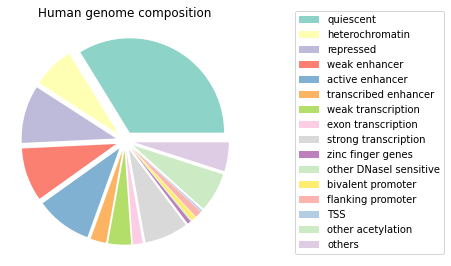

In [606]:
tdata = hmmdata.groupby('state group')['length'].sum()
plt.figure(figsize=(8,4))
wedges, labels = plt.pie(tdata.loc[hmmgroups],colors=plt.cm.Set3.colors+plt.cm.Pastel1.colors,explode=[0.1]*16)
plt.legend(wedges,hmmgroups,bbox_to_anchor=(1.2, 0),loc='lower left')
plt.title('Human genome composition')
plt.tight_layout()
plt.savefig('figures/hg38_chromHMM_coverage.png',dpi=300)

In [607]:
def find_hmm(rownumber):
    annot = testdata[testdata['row number']==rownumber]['name'].iloc[0]
    if annot not in hmmannot:
        return 'others'
    else:
        return hmmannot[annot]
    
!bedtools sort -i bed/chromHMM.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/chromHMM.sorted.bed
!bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/chromHMM.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_chromHMM.bed               
testdata = pd.read_csv('bed/IS_combined_chromHMM.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])      
combineIS['chromHMM'] = combineIS.index.map(lambda x:find_hmm(x))

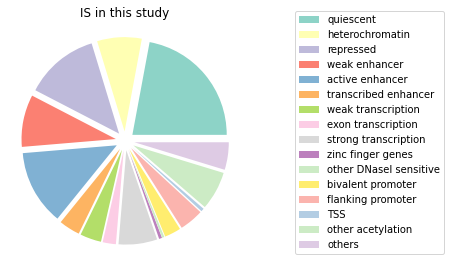

In [608]:
tdata = combineIS.groupby('chromHMM').size()
plt.figure(figsize=(8,4))
wedges, labels = plt.pie(tdata.loc[hmmgroups],colors=plt.cm.Set3.colors+plt.cm.Pastel1.colors,explode=[0.1]*16)
plt.legend(wedges,hmmgroups,bbox_to_anchor=(1.2, 0),loc='lower left')
plt.title('IS in this study')
plt.tight_layout()
plt.savefig('figures/IS_chromHMM_occurrence.png',dpi=300)

In [609]:
!bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/chromHMM.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_site_chromHMM.bed               
testdata = pd.read_csv('bed/random_site_chromHMM.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','distance'])      
randomsite['chromHMM'] = randomsite.index.map(lambda x:find_hmm(x+1))
randomsite

,chrom,pos,pos1,row number,score,strand,multiple gene,host gene,gene type,gene direction,...,distance to H3K4me1,distance to H3K4me3,distance to H3K9me3,distance to repeats DNA,distance to repeats LINE,distance to repeats LTR,distance to repeats SINE,distance to repeats Satellite,distance to repeats Simple_repeat,chromHMM
0,2,156661722,156661723,1,1,+,0,NaN,NaN,NaN,...,-80023,-223654,107677,-491,694,-2174,135,-689751,-5390,quiescent
1,11,8753159,8753160,2,1,-,1,LINC01958,ncRNA_gene,+,...,63020,63388,116660,415,-93,1442,0,1942553,-870,strong transcription
2,15,98191623,98191624,3,1,-,1,DENND2B,gene,-,...,29924,-229682,-72836,-2685,879,479,31,-3787896,-9397,repressed
3,2,57726841,57726842,4,1,-,1,ENSG00000259199,ncRNA_gene,-,...,-32858,5413,35842,11520,-2834,-1839,-61,-12704574,268,quiescent
4,12,57667450,57667451,5,1,+,0,NaN,NaN,NaN,...,25749,25804,-16171,3230,903,0,347,1860173,294,heterochromatin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15300,4,38274484,38274485,15301,1,+,0,NaN,NaN,NaN,...,-30545,-30857,19515,1649,-1251,122,46,8002582,-3440,active enhancer
15301,10,63086465,63086466,15302,1,+,0,NaN,NaN,NaN,...,47474,46277,-47166,1257,0,4201,183,9852860,2421,weak enhancer
15302,1,148597787,148597788,15303,1,-,0,NaN,NaN,NaN,...,1028,67948,-13892,-1263,-2065,-13459,126,302076,-1976,weak enhancer
15303,19,7736772,7736773,15304,1,+,1,NBPF14,gene,-,...,-5913,-30390,19747,-3334,717,452,0,9937,-76,repressed


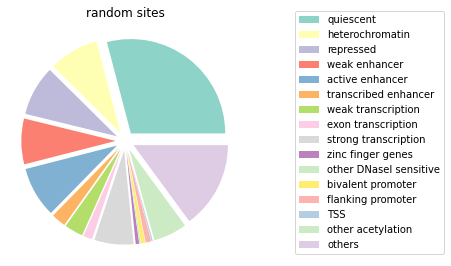

In [610]:
tdata = randomsite.groupby('chromHMM').size()
plt.figure(figsize=(8,4))
wedges, labels = plt.pie(tdata.loc[hmmgroups],colors=plt.cm.Set3.colors+plt.cm.Pastel1.colors,explode=[0.1]*16)
plt.legend(wedges,hmmgroups,bbox_to_anchor=(1.2, 0),loc='lower left')
plt.title('random sites')
plt.tight_layout()
plt.savefig('figures/randomsite_chromHMM_occurrence.png',dpi=300)

In [611]:
statsdict = {}
pdict = {}
for feature in hmmgroups:
    statsdict[feature] = {}
    pdict[feature] = {}
    for response in responselist:
        if response == 'integration':
            len1 = len(combineIS[combineIS['chromHMM'] == feature])
            len2 = len(combineIS)
            len3 = len(randomsite[randomsite['chromHMM']==feature])
            len4 = len(randomsite)
        elif response == 'expansion':
            len1 = len(combineIS[(combineIS['chromHMM'] == feature)&(combineIS['UMI count']>1)])
            len2 = len(combineIS[(combineIS['UMI count']>1)])
            len3 = len(combineIS[(combineIS['chromHMM'] == feature)&(combineIS['UMI count']==1)])
            len4 = len(combineIS[(combineIS['UMI count']==1)])
        elif response == 'transcription':
            tdata = combineIS[combineIS['Timepoint']!='6wk pART']
            len1 = len(tdata[(combineIS['chromHMM'] == feature)&(tdata['transcription']>0)])
            len2 = len(tdata[(tdata['transcription']>0)])
            len3 = len(tdata[(combineIS['chromHMM'] == feature)&(tdata['transcription']==0)])
            len4 = len(tdata[(tdata['transcription']==0)])
        res = ss.contingency.relative_risk(len1,len2,len3,len4)
        odds,p = ss.fisher_exact([[len1,len2-len1],[len3,len4-len3]])
        statsdict[feature][response] = (res.relative_risk,res.confidence_interval(confidence_level=0.95))
        pdict[feature][response] = p

In [612]:
ovaluedict = {};pvaluedict = {}
for feature in hmmgroups:
    feature_name = feature
    ovaluedict[feature_name] = {}
    pvaluedict[feature_name] = {}
    for response in statsdict[feature]:
        ovaluedict[feature_name][response] = statsdict[feature][response][0]
        if pdict[feature][response] < 1e-3: pvaluedict[feature_name][response] = '***'
        elif pdict[feature][response] < 1e-2: pvaluedict[feature_name][response] = '**'
        elif pdict[feature][response] < 0.05: pvaluedict[feature_name][response] = '*'
        else: pvaluedict[feature_name][response] = 'ns'
ovaluedata = pd.DataFrame(ovaluedict).transpose()
pvaluedata = pd.DataFrame(pvaluedict).transpose()

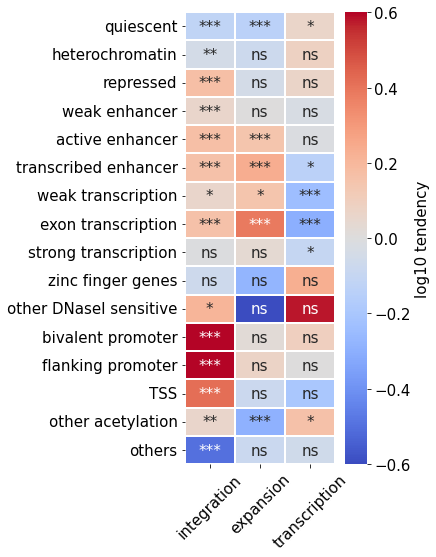

In [613]:
plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(6,8))
sns.heatmap(np.log10(ovaluedata),cmap='coolwarm',vmax=0.6,vmin=-0.6,linecolor='white',lw=2,annot=pvaluedata,cbar_kws={'label':'log10 tendency'},fmt='')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('figures/IS_relative_risk_chromHMM.png',dpi=300)
plt.rcParams.update({'font.size': 10})

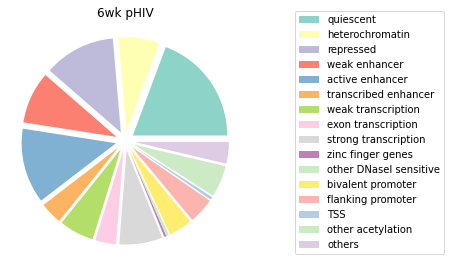

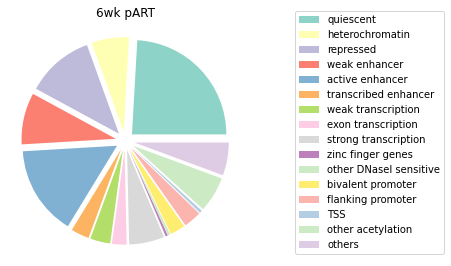

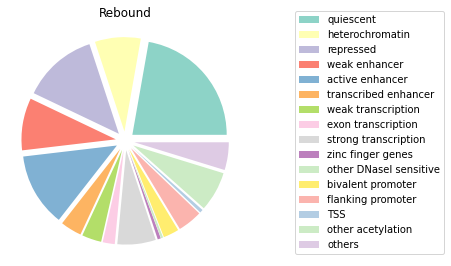

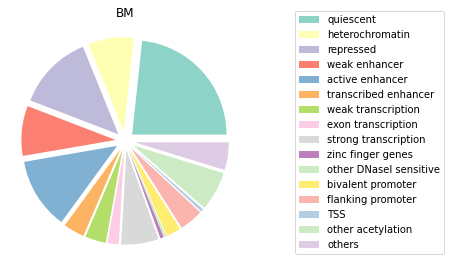

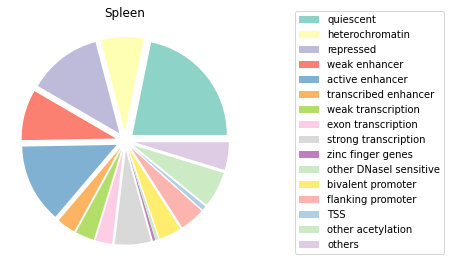

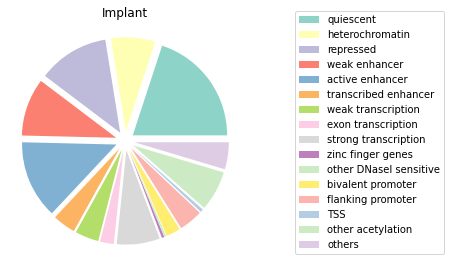

In [614]:
for time in timelist:
    tdata = combineIS[combineIS['Timepoint']==time].groupby('chromHMM').size()
    plt.figure(figsize=(8,4))
    wedges, labels = plt.pie(tdata.loc[hmmgroups],colors=plt.cm.Set3.colors+plt.cm.Pastel1.colors,explode=[0.1]*16)
    plt.legend(wedges,hmmgroups,bbox_to_anchor=(1.2, 0),loc='lower left')
    plt.title(time)
    plt.tight_layout()
    plt.savefig('figures/IS_chromHMM_occurrence_'+time+'.png',dpi=300)
for organ in ['BM','Spleen','Implant']:
    tdata = combineIS[combineIS['Organ']==organ].groupby('chromHMM').size()
    plt.figure(figsize=(8,4))
    wedges, labels = plt.pie(tdata.loc[hmmgroups],colors=plt.cm.Set3.colors+plt.cm.Pastel1.colors,explode=[0.1]*16)
    plt.legend(wedges,hmmgroups,bbox_to_anchor=(1.2, 0),loc='lower left')
    plt.title(organ)
    plt.tight_layout()
    plt.savefig('figures/IS_chromHMM_occurrence_'+organ+'.png',dpi=300)

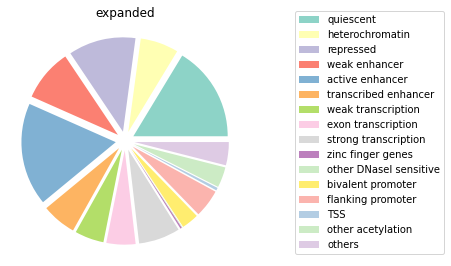

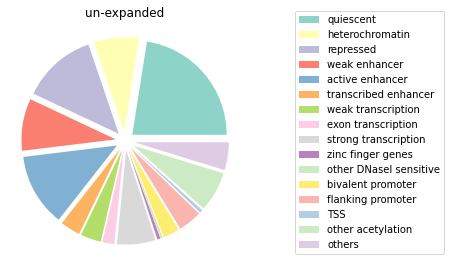

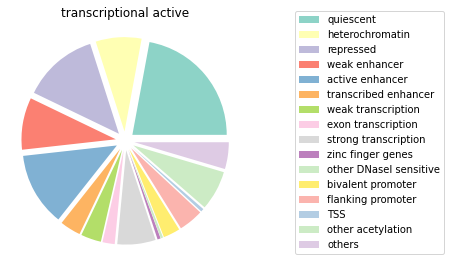

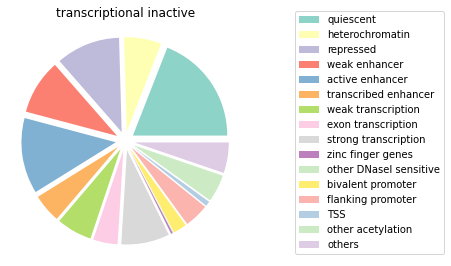

In [615]:
tdata = combineIS[combineIS['UMI count']>1].groupby('chromHMM').size()
plt.figure(figsize=(8,4))
wedges, labels = plt.pie(tdata.loc[hmmgroups],colors=plt.cm.Set3.colors+plt.cm.Pastel1.colors,explode=[0.1]*16)
plt.legend(wedges,hmmgroups,bbox_to_anchor=(1.2, 0),loc='lower left')
plt.title('expanded')
plt.tight_layout()
plt.savefig('figures/IS_chromHMM_occurrence_expanded.png',dpi=300)

tdata = combineIS[combineIS['UMI count']==1].groupby('chromHMM').size()
plt.figure(figsize=(8,4))
wedges, labels = plt.pie(tdata.loc[hmmgroups],colors=plt.cm.Set3.colors+plt.cm.Pastel1.colors,explode=[0.1]*16)
plt.legend(wedges,hmmgroups,bbox_to_anchor=(1.2, 0),loc='lower left')
plt.title('un-expanded')
plt.tight_layout()
plt.savefig('figures/IS_chromHMM_occurrence_unexpanded.png',dpi=300)

tdata = combineIS[combineIS['transcription']>0].groupby('chromHMM').size()
plt.figure(figsize=(8,4))
wedges, labels = plt.pie(tdata.loc[hmmgroups],colors=plt.cm.Set3.colors+plt.cm.Pastel1.colors,explode=[0.1]*16)
plt.legend(wedges,hmmgroups,bbox_to_anchor=(1.2, 0),loc='lower left')
plt.title('transcriptional active')
plt.tight_layout()
plt.savefig('figures/IS_chromHMM_occurrence_transcribed.png',dpi=300)

tdata = combineIS[(combineIS['transcription']==0)&(combineIS['Timepoint']!='6wk pART')].groupby('chromHMM').size()
plt.figure(figsize=(8,4))
wedges, labels = plt.pie(tdata.loc[hmmgroups],colors=plt.cm.Set3.colors+plt.cm.Pastel1.colors,explode=[0.1]*16)
plt.legend(wedges,hmmgroups,bbox_to_anchor=(1.2, 0),loc='lower left')
plt.title('transcriptional inactive')
plt.tight_layout()
plt.savefig('figures/IS_chromHMM_occurrence_untranscribed.png',dpi=300)

In [616]:
#Encode
celllist = ['naive thymus-derived CD4-positive, alpha-beta T cell',
'CD4-positive, alpha-beta memory T cell',
'CD4-positive, CD25-positive, alpha-beta regulatory T cell',
'activated CD4-positive, alpha-beta T cell',
'CD4-positive, alpha-beta T cell',
'activated naive CD4-positive, alpha-beta T cell',
'stimulated activated CD4-positive, alpha-beta T cell',
'activated CD4-positive, alpha-beta memory T cell',
'T-helper 17 cell',
'T-helper 1 cell',
'T-helper 2 cell',
'activated T-helper 1 cell',
'CD8-positive, alpha-beta memory T cell',
'activated T-helper 2 cell',
'activated T-helper 17 cell',
'effector memory CD4-positive, alpha-beta T cell',
'CD8-positive, alpha-beta T cell',
'naive thymus-derived CD8-positive, alpha-beta T cell',
'CD14-positive monocyte',
'activated CD4-positive, CD25-positive, alpha-beta regulatory T cell',
'central memory CD4-positive, alpha-beta T cell',
'activated effector memory CD4-positive, alpha-beta T cell']

In [617]:
histonelist

['H3K27ac', 'H3K27me3', 'H3K36me3', 'H3K4me1', 'H3K4me3', 'H3K9me3']

In [618]:
reffiledict = {}
for cell in celllist:
    reffiledict[cell] = {}
cell = 'naive thymus-derived CD4-positive, alpha-beta T cell'
reffiledict[cell]['H3K4me3']  = 'https://www.encodeproject.org/files/ENCFF434YII/@@download/ENCFF434YII.bed.gz'
reffiledict[cell]['H3K9me3']  = 'https://www.encodeproject.org/files/ENCFF250CEK/@@download/ENCFF250CEK.bed.gz'
reffiledict[cell]['H3K27ac']  = 'https://www.encodeproject.org/files/ENCFF053QZH/@@download/ENCFF053QZH.bed.gz'
reffiledict[cell]['H3K27me3'] = 'https://www.encodeproject.org/files/ENCFF627UND/@@download/ENCFF627UND.bed.gz'
reffiledict[cell]['H3K4me1']  = 'https://www.encodeproject.org/files/ENCFF269MSP/@@download/ENCFF269MSP.bed.gz'
reffiledict[cell]['H3K36me3'] = 'https://www.encodeproject.org/files/ENCFF797PLP/@@download/ENCFF797PLP.bed.gz'
cell = 'CD4-positive, alpha-beta memory T cell'
reffiledict[cell]['H3K9me3']  = 'https://www.encodeproject.org/files/ENCFF072WPT/@@download/ENCFF072WPT.bed.gz'
reffiledict[cell]['H3K27ac']  = 'https://www.encodeproject.org/files/ENCFF440VKC/@@download/ENCFF440VKC.bed.gz'
reffiledict[cell]['H3K27me3'] = 'https://www.encodeproject.org/files/ENCFF045AWT/@@download/ENCFF045AWT.bed.gz'
reffiledict[cell]['H3K36me3'] = 'https://www.encodeproject.org/files/ENCFF976PQR/@@download/ENCFF976PQR.bed.gz'
reffiledict[cell]['H3K4me1']  = 'https://www.encodeproject.org/files/ENCFF420IAQ/@@download/ENCFF420IAQ.bed.gz'
reffiledict[cell]['H3K4me3']  = 'https://www.encodeproject.org/files/ENCFF351GUZ/@@download/ENCFF351GUZ.bed.gz'
cell = 'CD4-positive, CD25-positive, alpha-beta regulatory T cell'
reffiledict[cell]['H3K36me3'] = 'https://www.encodeproject.org/files/ENCFF254ZIF/@@download/ENCFF254ZIF.bed.gz'
reffiledict[cell]['H3K4me1']  = 'https://www.encodeproject.org/files/ENCFF918LCT/@@download/ENCFF918LCT.bed.gz'
reffiledict[cell]['H3K27ac']  = 'https://www.encodeproject.org/files/ENCFF647VWE/@@download/ENCFF647VWE.bed.gz'
reffiledict[cell]['H3K4me3']  = 'https://www.encodeproject.org/files/ENCFF304RHC/@@download/ENCFF304RHC.bed.gz'
reffiledict[cell]['H3K27me3'] = 'https://www.encodeproject.org/files/ENCFF622FOC/@@download/ENCFF622FOC.bed.gz'
reffiledict[cell]['H3K9me3']  = 'https://www.encodeproject.org/files/ENCFF834IFU/@@download/ENCFF834IFU.bed.gz'
cell = 'activated CD4-positive, alpha-beta T cell'
reffiledict[cell]['H3K27ac']  = 'https://www.encodeproject.org/files/ENCFF213SVH/@@download/ENCFF213SVH.bed.gz'
reffiledict[cell]['H3K36me3'] = 'https://www.encodeproject.org/files/ENCFF372SOB/@@download/ENCFF372SOB.bed.gz'
reffiledict[cell]['H3K27me3'] = 'https://www.encodeproject.org/files/ENCFF168DTO/@@download/ENCFF168DTO.bed.gz'
reffiledict[cell]['H3K9me3']  = 'https://www.encodeproject.org/files/ENCFF470VKT/@@download/ENCFF470VKT.bed.gz'
reffiledict[cell]['H3K4me3']  = 'https://www.encodeproject.org/files/ENCFF283HDN/@@download/ENCFF283HDN.bed.gz'
reffiledict[cell]['H3K4me1']  = 'https://www.encodeproject.org/files/ENCFF869FHR/@@download/ENCFF869FHR.bed.gz'

In [619]:
#for cell in celllist[:4]:
#    for histone in histonelist:
#        os.system('wget -P ../../database/Encode/morefeatures/ '+reffiledict[cell][histone])

In [620]:
#!gunzip ../../database/Encode/morefeatures/*.gz

In [621]:
encodedata = combineIS.copy()
statsdict = {}
pdict = {}
for cell in celllist[:4]:
    statsdict[cell] = {}; pdict[cell] = {}
    for histone in histonelist:
        statsdict[cell][histone] = {}; pdict[cell][histone] = {}
        fname = reffiledict[cell][histone].rsplit('/')[-1].rsplit('.')[0]
        !cut -c4- ../../database/Encode/morefeatures/{fname}.bed > bed/{fname}.bed
        !bedtools sort -i bed/{fname}.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/{fname}.sorted.bed
        !bedtools closest -D a -a bed/IS_combined_sorted.bed -b bed/{fname}.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/IS_combined_distance_to_{fname}.bed
        !bedtools closest -D a -a bed/random_sites_sorted.bed -b bed/{fname}.sorted.bed -g ../../database/genome_annotation/hg38.chrom.sizes > bed/random_sites_distance_to_{fname}.bed
        randomdata = pd.read_csv('bed/random_sites_distance_to_'+fname+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','signal','p-value','q-value','peak','distance'])
        testdata = pd.read_csv('bed/IS_combined_distance_to_'+fname+'.bed',sep='\t',names=['chrom','pos','pos1','row number','UMI count','strand','chrom2','start','end','name','score','strand2','signal','p-value','q-value','peak','distance'])    
        randomsite[fname] = randomsite.index.map(lambda x:randomdata[randomdata['row number']==x+1]['distance'].iloc[0])
        encodedata[fname] = encodedata.index.map(lambda x:testdata[testdata['row number']==x]['distance'].iloc[0])
        for response in responselist:
            if response == 'integration':
                len1 = len(encodedata[(encodedata[fname]!=-1)&(abs(encodedata[fname])<5e3)])
                len2 = len(encodedata)
                len3 = len(randomsite[(randomsite[fname]!=-1)&(abs(randomsite[fname])<5e3)])
                len4 = len(randomsite)
            elif response == 'expansion':
                len1 = len(encodedata[(encodedata[fname]!=-1)&(abs(encodedata[fname])<5e3)&(encodedata['UMI count']>1)])
                len2 = len(encodedata[encodedata['UMI count']>1])
                len3 = len(encodedata[(encodedata[fname]!=-1)&(abs(encodedata[fname])<5e3)&(encodedata['UMI count']==1)])
                len4 = len(encodedata[encodedata['UMI count']==1])
            elif response == 'transcription':
                tdata = encodedata[encodedata['Timepoint']!='6wk pART']
                len1 = len(tdata[(tdata[fname]!=-1)&(abs(tdata[fname])<5e3)&(tdata['transcription']>0)])
                len2 = len(tdata[tdata['transcription']>0])
                len3 = len(tdata[(tdata[fname]!=-1)&(abs(tdata[fname])<5e3)&(tdata['transcription']==0)])
                len4 = len(tdata[tdata['transcription']==0])
            res = ss.contingency.relative_risk(len1,len2,len3,len4)
            odds,p = ss.fisher_exact([[len1,len2-len1],[len3,len4-len3]])
            statsdict[cell][histone][response] = (res.relative_risk,res.confidence_interval(confidence_level=0.95))
            pdict[cell][histone][response] = p

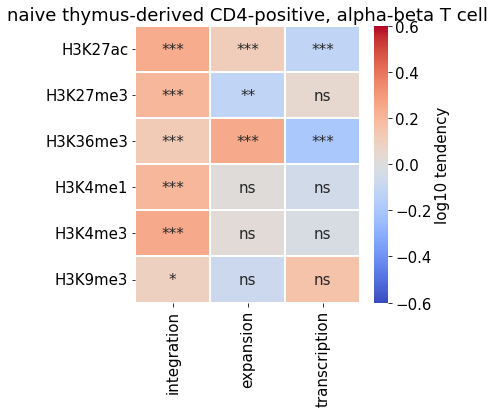

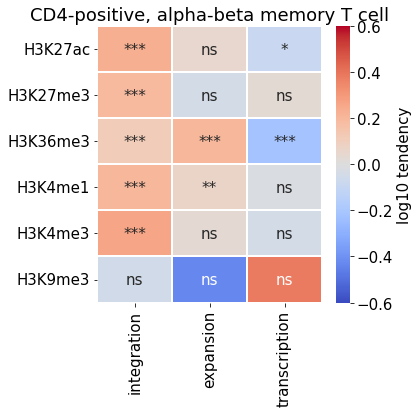

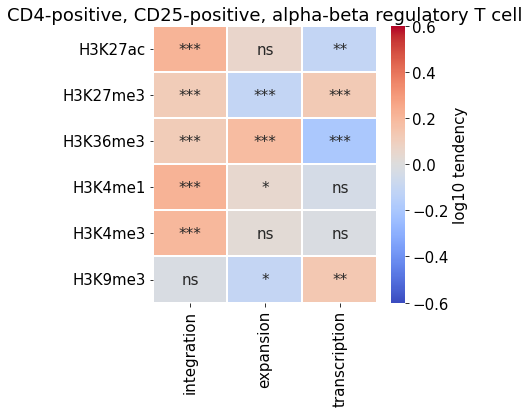

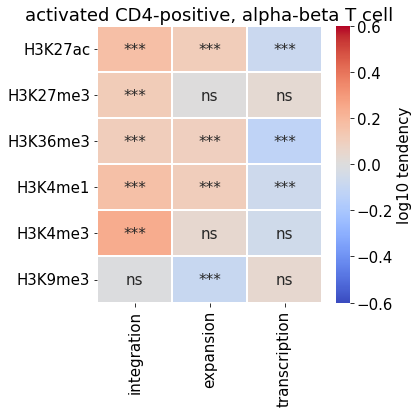

In [622]:
#one cell one figure
plt.rcParams.update({'font.size': 15})
for cell in celllist[:4]:
    ovaluedict = {};pvaluedict = {}
    for feature in histonelist:
        feature_name = feature
        ovaluedict[feature_name] = {}
        pvaluedict[feature_name] = {}
        for response in statsdict[cell][feature]:
            ovaluedict[feature_name][response] = statsdict[cell][feature][response][0]
            if pdict[cell][feature][response] < 1e-3: pvaluedict[feature_name][response] = '***'
            elif pdict[cell][feature][response] < 1e-2: pvaluedict[feature_name][response] = '**'
            elif pdict[cell][feature][response] < 0.05: pvaluedict[feature_name][response] = '*'
            else: pvaluedict[feature_name][response] = 'ns'
    ovaluedata = pd.DataFrame(ovaluedict).transpose()
    pvaluedata = pd.DataFrame(pvaluedict).transpose()

    plt.figure(figsize=(6,6))
    sns.heatmap(np.log10(ovaluedata),cmap='coolwarm',vmax=0.6,vmin=-0.6,linecolor='white',lw=2,annot=pvaluedata,cbar_kws={'label':'log10 tendency'},fmt='')
    plt.xticks(rotation=90)
    plt.title(cell)
    plt.tight_layout()
    plt.savefig('figures/IS_relative_risk_encode_'+cell+'_heatmap.png',dpi=300)
plt.rcParams.update({'font.size': 10})

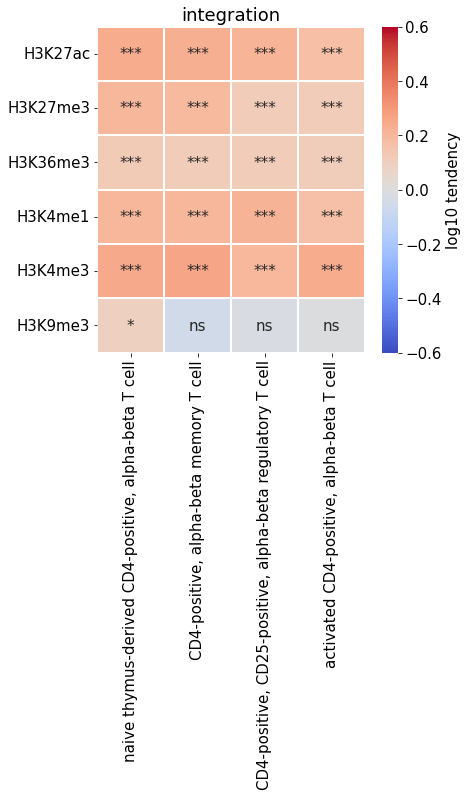

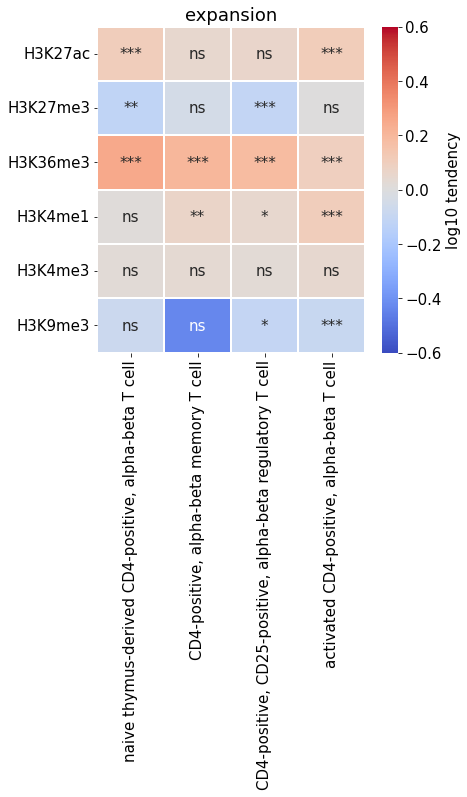

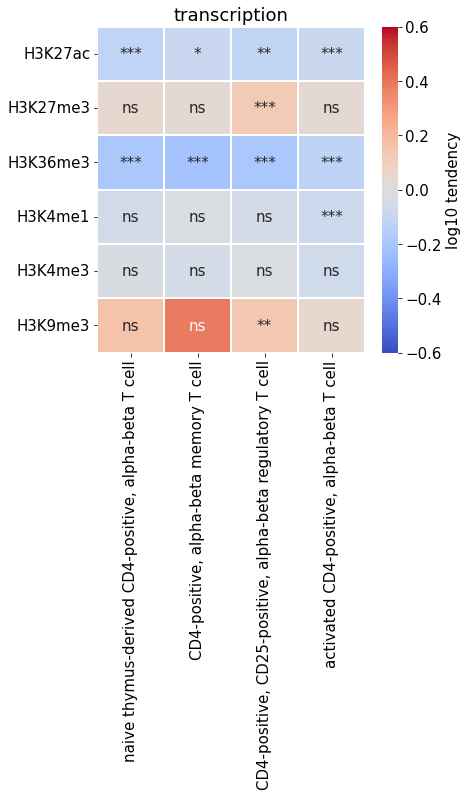

In [623]:
#one response one figure
plt.rcParams.update({'font.size': 15})
for response in responselist:
    ovaluedict = {};pvaluedict = {}
    for feature in histonelist:
        feature_name = feature
        ovaluedict[feature_name] = {}
        pvaluedict[feature_name] = {}
        for cell in celllist[:4]:
            ovaluedict[feature_name][cell] = statsdict[cell][feature][response][0]
            if pdict[cell][feature][response] < 1e-3: pvaluedict[feature_name][cell] = '***'
            elif pdict[cell][feature][response] < 1e-2: pvaluedict[feature_name][cell] = '**'
            elif pdict[cell][feature][response] < 0.05: pvaluedict[feature_name][cell] = '*'
            else: pvaluedict[feature_name][cell] = 'ns'
    ovaluedata = pd.DataFrame(ovaluedict).transpose()
    pvaluedata = pd.DataFrame(pvaluedict).transpose()

    plt.figure(figsize=(6,6))
    sns.heatmap(np.log10(ovaluedata),cmap='coolwarm',vmax=0.6,vmin=-0.6,linecolor='white',lw=2,annot=pvaluedata,cbar_kws={'label':'log10 tendency'},fmt='')
    plt.xticks(rotation=90)
    plt.title(response)
    plt.tight_layout()
    plt.savefig('figures/IS_relative_risk_encode_'+response+'_heatmap.png',dpi=300)
plt.rcParams.update({'font.size': 10})

### Venn diagram
Organ overlap

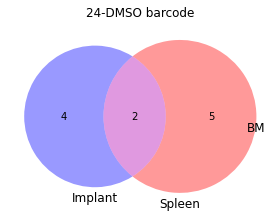

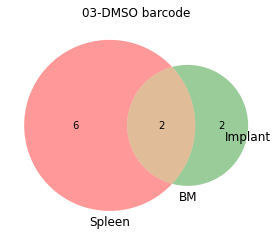

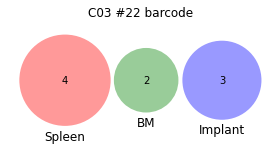

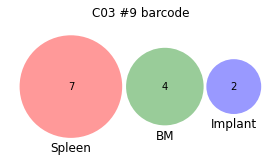

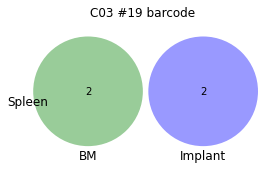

...

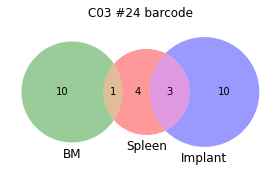

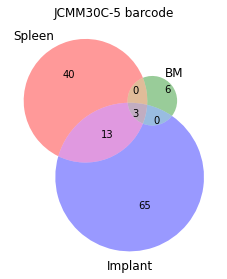

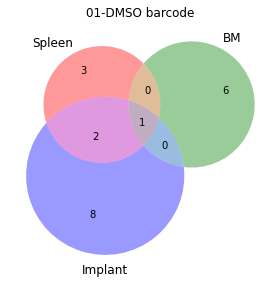

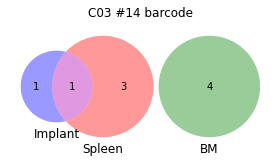

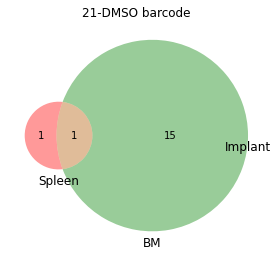

In [624]:
for mouse in mousedata['mouse']:
    plt.figure(figsize=(4,4))
    sets = {}
    for organ in organlist:
        tdata = combinebc[(combinebc['Mouse']==mouse)&(combinebc['Organ']==organ)]
        sets[organ] = set(tdata['barcode'])
    v = venn3(list(sets.values()),organlist)
    plt.title(mouse+' barcode')
    plt.tight_layout()
    plt.savefig('figures/venn3_barcode_'+mouse+'.png',dpi=300)

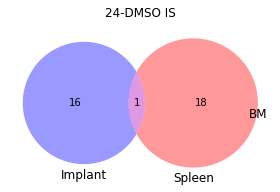

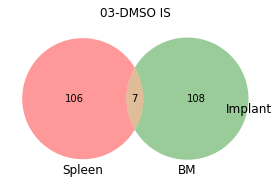

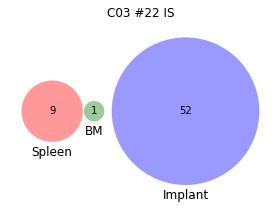

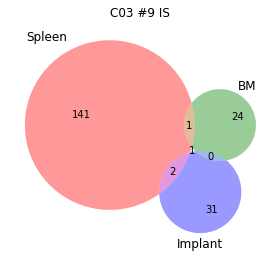

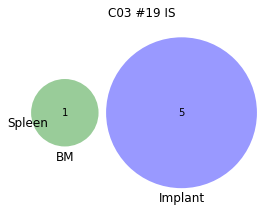

...

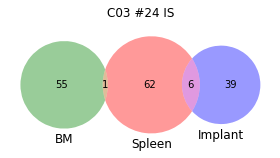

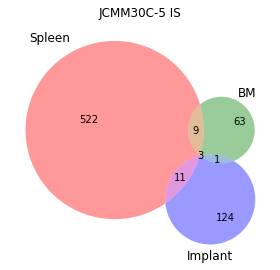

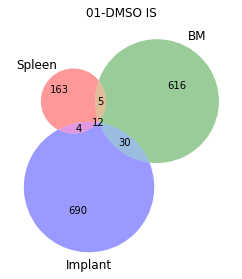

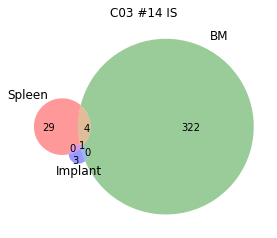

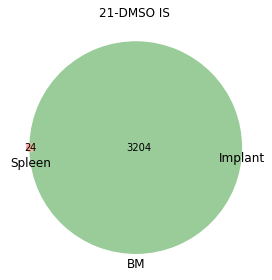

In [625]:
for mouse in mousedata['mouse']:
    plt.figure(figsize=(4,4))
    sets = {}
    for organ in organlist:
        tdata = combineIS[(combineIS['Mouse']==mouse)&(combineIS['Organ']==organ)]
        sets[organ] = set(tdata['Integration site'])
    v = venn3(list(sets.values()),organlist)
    plt.title(mouse+' IS')
    plt.tight_layout()
    plt.savefig('figures/venn3_IS_'+mouse+'.png',dpi=300)

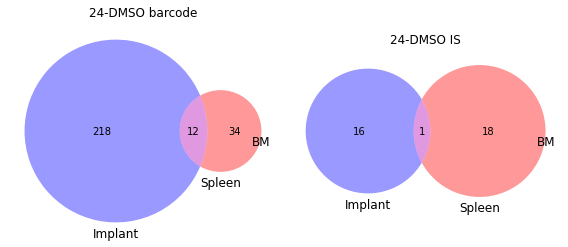

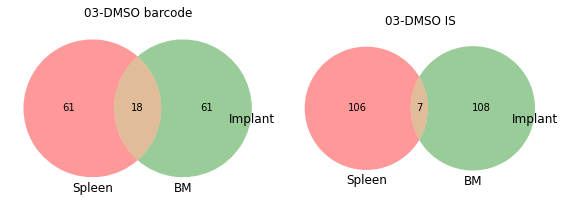

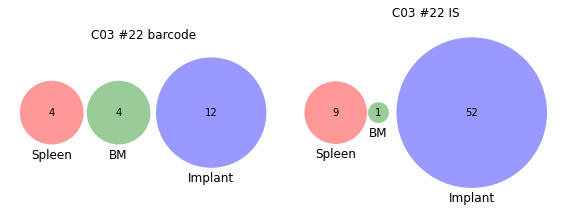

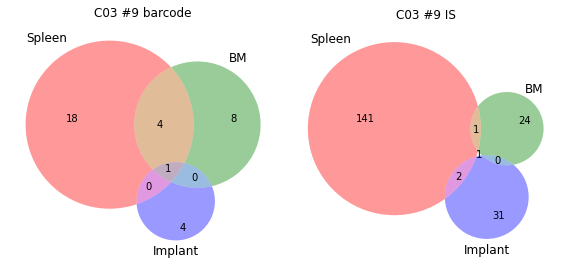

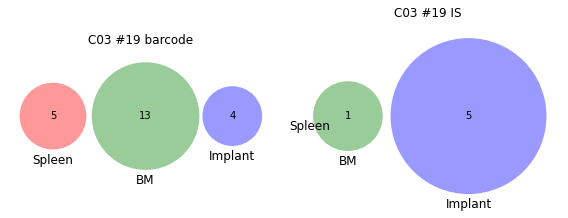

...

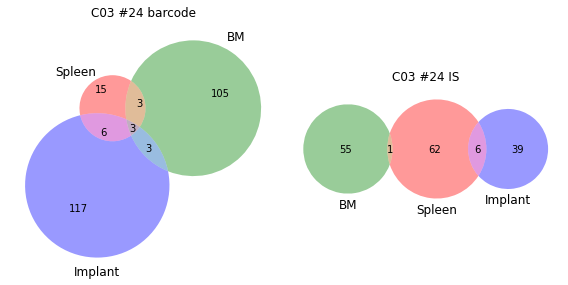

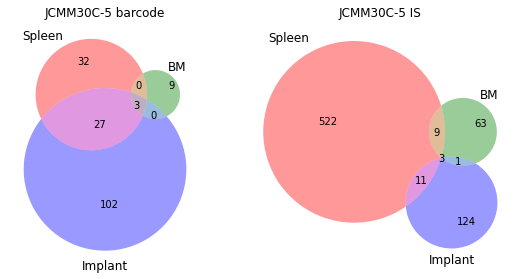

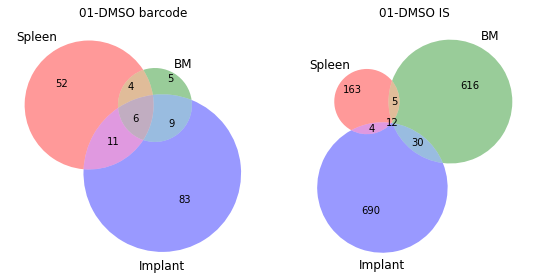

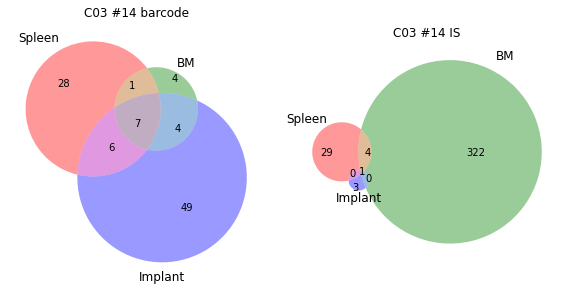

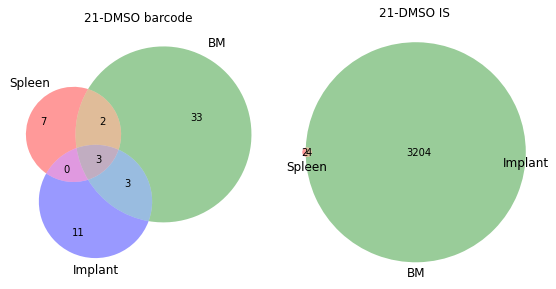

In [626]:
for mouse in mousedata['mouse']:
    plt.figure(figsize=(8,4))
    sets = {}
    for organ in organlist:
        UDP = refdata[(refdata['Mouse']==mouse)&(refdata['Organ']==organ)]['UDP'].iloc[0]
        if UDP not in bcdata:
            sets[organ] = set()
        else:
            tdata = bcdata[UDP]
            sets[organ] = set(tdata['barcode'])
    plt.subplot(121)
    v = venn3(list(sets.values()),organlist)
    plt.title(mouse+' barcode')
    
    sets = {}
    for organ in organlist:
        tdata = combineIS[(combineIS['Mouse']==mouse)&(combineIS['Organ']==organ)]
        sets[organ] = set(tdata['Integration site'])
    plt.subplot(122)
    v = venn3(list(sets.values()),organlist)
    plt.title(mouse+' IS')
    plt.tight_layout()
    plt.savefig('figures/venn3_combined_'+mouse+'.png',dpi=300)

In [627]:
#UMI per barcode for each mouse

In [628]:
mousedata.to_csv('per_mouse_summary_020723.csv')

In [629]:
p0,p1,p2,p3,p4 = ss.poisson.pmf(k=range(5),mu=0.1)
good = p1*p1
bad = 1-good-p0*p0-p0*(p1+p2+p3+p4)*2
good/bad

9.42425800341072

In [630]:
0.30326533*0.30326533

0.0919698603800089